In [1]:
import torch 
import numpy as np 

In [2]:
import pickle 

def unpickle(file):
    with open(file, 'rb') as f:
        data = pickle.load(f, encoding="bytes")
    return data

In [31]:
def to_categorical(y, num_classes):
    return np.eye(num_classes, dtype='uint8')[y]

In [107]:
from torch.utils.data import TensorDataset, DataLoader

In [321]:
def load_cifar_10_data(data_dir, negatives=False): #흩어져있는 batches들 합친다.
    meta_data_dict = unpickle(data_dir+"/batches.meta")
    cifar_label_names = meta_data_dict[b'label_names']
    cifar_label_names = np.array(cifar_label_names)
    
    cifar_train_data = None 
    cifar_train_filenames = []
    cifar_train_labels = []
    
    for i in range(1,7):
        print(i)
        if i == 6:
            cifar_train_data_dict = unpickle(data_dir + "/test_batch")
        else:    
            cifar_train_data_dict = unpickle(data_dir+"/data_batch_{}".format(i))
        
        if i==1:
            cifar_train_data = cifar_train_data_dict[b'data']
        else:
            cifar_train_data = np.vstack((cifar_train_data, cifar_train_data_dict[b'data'])) # 아래로 합쳐
        cifar_train_filenames += cifar_train_data_dict[b'filenames']
        cifar_train_labels += cifar_train_data_dict[b'labels']
    cifar_train_data = cifar_train_data.reshape((len(cifar_train_data), 3, 32, 32))
    if negatives: # 왜 이게 필요한걸까
        cifar_train_data = cifar_train_data.transpose(0,2,3,1).astype(np.float32)
    else:
        cifar_train_data = np.rollaxis(cifar_train_data, 1,4)
    cifar_train_filenames = np.array(cifar_train_filenames)
    cifar_train_labels = np.array(cifar_train_labels)
    
    size = 0.3 
    territory = int(np.round(len(cifar_train_data)*size))
    print(territory)
    
    cifar_test_data = cifar_train_data[0:territory]
    cifar_test_filenames = cifar_train_filenames[0:territory]
    cifar_test_labels = cifar_train_labels[0:territory]
    cifar_train_data = cifar_train_data[territory:]
    cifar_train_filenames = cifar_train_filenames[territory:]
    cifar_train_labels = cifar_train_labels[territory:]
    
    #cifar_test_data_dict = unpickle(data_dir + "/test_batch")
    #cifar_test_data = cifar_test_data_dict[b'data']
    #cifar_test_filenames = cifar_test_data_dict[b'filenames']
    #cifar_test_labels = cifar_test_data_dict[b'labels']

    #cifar_test_data = cifar_test_data.reshape((len(cifar_test_data), 3, 32, 32))
    #if negatives:
    #    cifar_test_data = cifar_test_data.transpose(0, 2, 3, 1).astype(np.float32)
    #else:
    #    cifar_test_data = np.rollaxis(cifar_test_data, 1, 4)
        
    #cifar_test_filenames = np.array(cifar_test_filenames)
    #cifar_test_labels = np.array(cifar_test_labels)
    
    x_train = (cifar_train_data.astype('float32')/255 -0.5) / 0.5
    #x_train = cifar_train_data
    print(x_train)
    val_range = int(np.round(len(x_train) * 0.2))
    valid_set = x_train[0:val_range]
    train_set = x_train[val_range:]
    
    y_train = to_categorical(cifar_train_labels, 10)
    
    train_label_set = y_train[val_range:]
    val_label_set = y_train[0:val_range]
    
    x_test = (cifar_test_data.astype('float32')/255 -0.5) / 0.5
    print(x_test.shape)
    #x_test = cifar_test_data
    y_test = to_categorical(cifar_test_labels, 10)
    train_images_tensor = torch.tensor(train_set)
    print(train_images_tensor.shape)
    #train_images_tensor=transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))(train_images_tensor)
    valid_images_tensor = torch.tensor(valid_set)
    #transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))(valid_images_tensor)
    #train_set, val_set = torch.utils.data.random_split(train_images_tensor, [len(train_images_tensor)*0.8, len(train_images_tensor)*0.2])
    train_label_tensor = torch.tensor(train_label_set)
    valid_label_tensor = torch.tensor(val_label_set)
    #train_label_set, val_label_set = torch.utils.data.random_split(train_label_tensor, [len(train_label_tensor)*0.8, len(train_label_tensor)*0.2])

    train_tensor = TensorDataset(train_images_tensor, train_label_tensor)
    train_loader = DataLoader(train_tensor, batch_size=4, num_workers= 0 , shuffle = True)
    
    valid_tensor = TensorDataset(valid_images_tensor, valid_label_tensor)
    valid_loader = DataLoader(valid_tensor, batch_size=4, num_workers= 0, shuffle = False)
    
    test_images_tensor = torch.tensor(x_test)
    #transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))(test_images_tensor)
    test_label_tensor = torch.tensor(y_test)
    test_tensor = TensorDataset(test_images_tensor, test_label_tensor)
    test_loader = DataLoader(test_tensor, batch_size=4, num_workers = 0, shuffle = False)
    return train_loader, valid_loader, test_loader


In [99]:
import torch.nn as nn 
import torch.nn.functional as F 

In [269]:
class CifarNet(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()
        
        self.conv1 = nn.Conv2d(3,16,kernel_size=3, stride=2, padding=2) #input_channel = 채널 수 (rgb = 3개다.)
        self.pool = nn.MaxPool2d(2,2)
        self.conv2 = nn.Conv2d(16,32,kernel_size=3, stride=2, padding=2)
        self.conv3 = nn.Conv2d(32,64, kernel_size=2, stride=2)
        self.fc1 = nn.Linear(64, 32)
        self.fc2 = nn.Linear(32, 10)
        
    def forward(self, x):
        x = x.permute(0,3,1,2)#batch, 얼만큼의 채널, 가로, 세로 
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = F.relu(self.conv3(x)) #이렇게만 해도 되려나?
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        #x= F.log_softmax(x)
        print(x)
        return x
    
    
net = CifarNet()


In [173]:
import torch.optim as optim 

hypothesis = nn.CrossEntropyLoss()

optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [322]:
#transform = transforms.Compose(
#[transforms.ToTensor(),
# transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])

train_loader, valid_loader, test_loader \
= load_cifar_10_data('cifar-10-batches')



#trainloader = torch.utils.data.DataLoader(cifar_train_data, batch_size= 4, shuffle = True ,num_workers=1)
#testloader = torch.utils.data.DataLoader(cifar_test_data, batch_size=4, shuffle= False, num_workers=1)

1
2
3
4
5
6
18000
[[[[ 0.654902    0.52156866  0.52156866]
   [ 0.6313726   0.49803925  0.49803925]
   [ 0.6313726   0.49803925  0.49803925]
   ...
   [ 0.6784314   0.56078434  0.58431375]
   [ 0.6862745   0.5686275   0.5921569 ]
   [ 0.6862745   0.5686275   0.5921569 ]]

  [[ 0.7254902   0.60784316  0.60784316]
   [ 0.67058825  0.5529412   0.5529412 ]
   [ 0.6627451   0.5529412   0.54509807]
   ...
   [ 0.69411767  0.5921569   0.60784316]
   [ 0.7176471   0.60784316  0.6313726 ]
   [ 0.70980394  0.60784316  0.6313726 ]]

  [[ 0.7647059   0.67058825  0.654902  ]
   [ 0.70980394  0.62352943  0.60784316]
   [ 0.7019608   0.60784316  0.5921569 ]
   ...
   [ 0.75686276  0.67058825  0.6784314 ]
   [ 0.77254903  0.6862745   0.7019608 ]
   [ 0.7647059   0.6784314   0.69411767]]

  ...

  [[ 0.41960788  0.24705887  0.2313726 ]
   [ 0.4431373   0.23921573  0.27058828]
   [ 0.4901961   0.082353    0.082353  ]
   ...
   [ 0.45882356  0.23921573  0.254902  ]
   [ 0.4666667   0.2313726   0.254902  

(18000, 32, 32, 3)
torch.Size([33600, 32, 32, 3])


In [284]:
import torch
import torchvision
import torchvision.transforms as transforms

In [97]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 4

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)


testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
trainset = torch.tensor(trainset)
testset = torch.tensor(testset)
totalset = torch.cat([trainset, testset], dim=0)

train_set, testset = torch.utils.data.random_split(totalset, [len(totalset)*0.7, len(totalset)*0.3])
train_set, val_set = torch.utils.data.random_split(train_set, [len(train_set)*0.8, len(train_set)*0.2])
trainloader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                          shuffle=True, num_workers=2)
valloader = torch.utils.data.DataLoader(val_set, batch_size= batch_size,
                                       shuffle=False, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


TypeError: expected Tensor as element 0 in argument 0, but got CIFAR10

In [310]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
net.train()
for epoch in range(2):   # 데이터셋을 수차례 반복합니다.

    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
        # [inputs, labels]의 목록인 data로부터 입력을 받은 후;
        inputs, labels = data
        # 변화도(Gradient) 매개변수를 0으로 만들고
        optimizer.zero_grad()

        # 순전파 + 역전파 + 최적화를 한 후
        outputs = net(inputs)
        print(labels)
        labels = labels.to(torch.float)
        #labels = labels.softmax(dim=1)
        
        loss = hypothesis(outputs, labels)
        loss.backward()
        optimizer.step()
        '''
        for m in range(4):
            # 변화도(Gradient) 매개변수를 0으로 만들고
            optimizer.zero_grad()

            # 순전파 + 역전파 + 최적화를 한 후
            outputs = net(inputs[m].unsqueeze(0))
            #output = torch.Tensor.int(outputs).long()
            target = labels[m].view(1)
            loss = hypothesis(outputs, target)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        '''
            # 통계를 출력합니다.
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
            running_loss = 0.0

print('Finished Training')

tensor([[1.0442, 2.2451, 2.0316, 0.0000, 0.7187, 0.0000, 0.0000, 1.9855, 0.0000,
         0.0000],
        [5.6589, 6.7210, 6.9135, 0.0000, 1.9444, 0.0000, 2.5478, 6.9531, 0.0000,
         0.0000],
        [1.0838, 2.2231, 2.6488, 0.0000, 0.6979, 0.0000, 0.1422, 2.0984, 0.0118,
         0.0000],
        [2.6434, 2.0523, 3.7468, 0.0000, 0.4282, 0.0000, 0.1094, 3.9260, 0.1746,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.5857, 3.3366, 4.4745, 0.0000, 1.3627, 0.0000, 0.3339, 3.6402, 0.0000,
         0.0000],
        [2.5683, 1.3905, 3.3847, 0.0000, 0.7774, 0.0000, 0.0000, 2.1441, 0.0000,
         0.0000],
        [2.3449, 2.3162, 3.6966, 0.0000, 0.0000, 0.0000, 1.4599, 3.8970, 0.0000,
         0.0000],
        [4.5410, 0.7672, 4.6599, 0.0000, 0.0000, 0.0000, 2.6081, 2.5147, 0.0000,
         0.0000]], g

tensor([[4.7576, 4.4317, 6.1962, 0.0000, 1.9427, 0.0000, 0.1527, 5.7902, 0.0000,
         0.0000],
        [2.6319, 1.8527, 4.4074, 0.0000, 0.3015, 0.0000, 1.2024, 3.1844, 0.0000,
         0.0000],
        [3.0800, 3.2713, 5.0211, 0.0000, 0.8653, 0.0000, 0.5746, 2.8041, 0.0000,
         0.0000],
        [5.1877, 3.4370, 5.7449, 0.0000, 0.3338, 0.0000, 1.8693, 5.7487, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4190, 4.3043, 5.5981, 0.0000, 0.6738, 0.0000, 1.6519, 6.4452, 0.0000,
         0.0000],
        [4.2742, 2.7748, 5.5745, 0.0000, 0.4753, 0.0000, 1.3173, 5.0555, 0.0000,
         0.0000],
        [3.8763, 1.5051, 3.3459, 0.0000, 0.5946, 0.0000, 2.0664, 3.5580, 0.0000,
         0.0000],
        [4.1593, 3.7405, 5.7950, 0.0000, 1.1210, 0.0000, 1.6714, 4.1942, 0.0569,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.2639, 1.7361, 2.6694, 0.0000, 0.0000, 0.0000, 1.0946, 2.9067, 0.5851,
         0.0000],
        [4.6840, 3.0759, 5.6677, 0.0000, 0.9068, 0.0000, 0.8446, 4.2908, 0.2271,
         0.0000],
        [4.6299, 1.6122, 4.9016, 0.0000, 0.7750, 0.0000, 1.9818, 3.7859, 0.0000,
         0.0000],
        [6.6800, 5.4852, 8.5302, 0.0000, 1.2104, 0.0000, 5.1344, 7.5638, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.4278, 1.8599, 2.1003, 0.0000, 0.2829, 0.0000, 0.3762, 2.0354, 0.0000,
         0.0000],
        [7.1097, 2.8266, 6.4358, 0.0000, 1.5742, 0.0000, 1.4607, 4.3663, 0.0000,
         0.0000],
        [3.0801, 5.7

tensor([[1.7300, 2.6832, 3.0961, 0.0000, 1.0591, 0.0000, 0.0000, 3.6595, 0.0890,
         0.0000],
        [6.0651, 4.3385, 7.5803, 0.0000, 1.0682, 0.0000, 3.1376, 6.3488, 0.0000,
         0.0000],
        [7.5968, 6.6405, 8.4038, 0.0000, 2.4211, 0.0000, 4.1854, 8.3051, 0.0000,
         0.0000],
        [3.7508, 2.9127, 5.1649, 0.0000, 1.4655, 0.0000, 0.4407, 5.1333, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[4.5996, 3.2543, 5.1867, 0.0000, 0.9753, 0.0000, 2.6551, 5.1084, 0.0000,
         0.0000],
        [4.9762, 6.4179, 6.4930, 0.0000, 2.2035, 0.0000, 3.0535, 7.6769, 0.0000,
         0.0000],
        [2.4809, 2.5959, 3.0765, 0.1379, 0.8953, 0.0000, 0.4552, 1.7527, 0.0000,
         0.0000],
        [4.0008, 2.4076, 4.7262, 0.0000, 1.4938, 0.0000, 0.1456, 2.0754, 0.0000,
         0.0000]], g

tensor([[2.7450, 1.7760, 2.9178, 0.0000, 0.4864, 0.0000, 0.9533, 2.5085, 0.7103,
         0.0000],
        [3.4330, 0.9099, 3.7134, 0.0000, 0.6697, 0.0000, 0.7570, 2.3228, 0.0000,
         0.0000],
        [4.1587, 4.9319, 5.9772, 0.0000, 1.3850, 0.0000, 1.0746, 4.9180, 0.0000,
         0.0000],
        [3.2780, 0.0000, 3.9334, 0.0000, 0.0582, 0.0000, 1.8671, 1.9334, 0.2641,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.1255, 1.0462, 5.2890, 0.0000, 0.3057, 0.0000, 1.5126, 2.1779, 0.0000,
         0.0000],
        [3.7931, 1.7750, 4.6811, 0.0000, 0.5591, 0.0000, 1.8016, 4.3058, 0.1651,
         0.0000],
        [4.5513, 4.7011, 4.8441, 0.0000, 1.7325, 0.0000, 3.0155, 5.4296, 1.0218,
         0.0000],
        [1.9204, 1.1370, 2.4646, 0.0000, 0.0000, 0.0000, 0.6518, 2.1655, 0.0000,
         0.0000]], g

         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.1988, 2.4298, 2.8477, 0.0000, 0.6850, 0.0000, 0.7198, 2.4616, 0.0000,
         0.0000],
        [2.9219, 0.0000, 2.8745, 0.0000, 0.0000, 0.0000, 1.5195, 0.9868, 0.0000,
         0.0000],
        [4.1592, 1.7228, 4.9746, 0.0000, 0.0000, 0.0000, 2.2474, 5.7743, 0.0000,
         0.0000],
        [5.5931, 5.5304, 8.7847, 0.0000, 2.1903, 0.0000, 0.4755, 6.6545, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.5538, 4.4619, 5.8452, 0.0000, 1.3684, 0.0000, 1.3926, 4.1544, 0.0000,
         0.0000],
        [4.5301, 4.2864, 5.9827, 0.0000, 0.9375, 0.0000, 1.8786, 5.5990, 0.

tensor([[2.2044, 2.4548, 4.1518, 0.0000, 1.3210, 0.0000, 0.0000, 3.2817, 0.0000,
         0.0000],
        [2.3947, 1.9497, 3.4983, 0.0000, 0.1728, 0.0000, 0.8582, 2.9584, 0.0000,
         0.0000],
        [4.4576, 1.4475, 6.0490, 0.0000, 0.1737, 0.0000, 1.7437, 3.6062, 0.0000,
         0.0000],
        [4.6614, 3.8292, 6.7393, 0.0000, 1.2464, 0.0000, 1.7246, 5.1360, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.7942, 2.4378, 4.6195, 0.0000, 0.7331, 0.0000, 2.6840, 4.7246, 0.9955,
         0.0000],
        [3.6150, 1.9992, 4.2503, 0.0000, 0.0000, 0.0000, 1.5992, 3.1545, 0.0000,
         0.0000],
        [4.3633, 0.9512, 4.1323, 0.0000, 0.3986, 0.0000, 1.5987, 1.1722, 0.0000,
         0.0000],
        [2.7062, 2.9710, 4.1871, 0.0000, 0.8464, 0.0000, 0.3241, 3.0763, 0.0000,
         0.0000]], g

tensor([[4.7710, 0.0000, 4.7987, 0.0000, 0.0000, 0.0000, 2.4225, 2.0142, 0.0000,
         0.0000],
        [4.1070, 5.3227, 4.7218, 0.1733, 1.6917, 0.0000, 0.8426, 4.4927, 0.0000,
         0.0000],
        [4.8769, 1.4456, 5.0479, 0.0000, 0.6052, 0.0000, 1.5514, 3.0226, 0.0000,
         0.0000],
        [7.0818, 2.5600, 8.7066, 0.0000, 0.5585, 0.0000, 4.2626, 4.9857, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.4632, 1.8777, 2.5238, 0.0219, 0.1202, 0.0000, 1.2867, 2.2015, 0.0000,
         0.0293],
        [3.3809, 1.2199, 4.6156, 0.0000, 0.0000, 0.0000, 2.5220, 4.9254, 0.0000,
         0.0000],
        [5.4411, 3.4040, 5.6315, 0.0000, 1.8997, 0.0000, 2.2971, 4.9802, 0.1916,
         0.0000],
        [1.1682, 3.0242, 3.7917, 0.0000, 0.8396, 0.0000, 0.0000, 2.7660, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 9.3638,  3.8999, 10.1252,  0.0000,  1.4214,  0.0000,  3.2834,  4.4257,
          0.0000,  0.0000],
        [ 2.9595,  4.9629,  4.9175,  0.0000,  1.7642,  0.0000,  0.4090,  3.7494,
          0.0000,  0.0000],
        [ 4.7786,  4.1200,  6.2707,  0.0000,  2.8398,  0.0000,  0.0000,  4.1052,
          0.0000,  0.0000],
        [ 4.1319,  2.2859,  4.9303,  0.0000,  0.8894,  0.0000,  2.0997,  4.2825,
          0.0000,  0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.1381, 3.3045, 5.1077, 0.0000, 0.3603, 0.0000, 2.0631, 4.2370, 0.0000,
         0.0000],
        [3.1973, 2.2752, 4.4126, 0.0000, 0.1862, 0.0000, 1.4808, 4.1910, 0.0000

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.7657, 3.6729, 4.1284, 0.0000, 1.5179, 0.0000, 0.8441, 4.4859, 0.0000,
         0.0000],
        [4.1924, 3.9982, 4.7427, 0.0000, 1.3904, 0.0000, 1.6598, 3.7687, 0.0000,
         0.0000],
        [6.2520, 3.9226, 6.9029, 0.0000, 1.6409, 0.0000, 2.6543, 6.2809, 0.0923,
         0.0000],
        [2.0798, 2.4755, 3.2266, 0.0493, 0.2416, 0.0000, 2.2557, 2.6740, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.1644, 0.8185, 1.4778, 0.0000, 0.0000, 0.0000, 0.9991, 2.0984, 0.0000,
         0.0000],
        [0.0000, 1.3985, 0.7811, 0.0000, 0.1028, 0.0000, 0.4230, 2.2260, 2.3402,
         0.0000],
        [3.6059, 0.3

tensor([[5.5937, 2.4229, 6.9242, 0.0000, 1.3738, 0.0000, 1.6260, 6.1825, 0.2400,
         0.0000],
        [3.4619, 0.5997, 4.6149, 0.0000, 0.0000, 0.0000, 1.6541, 2.6314, 0.0000,
         0.0000],
        [0.8900, 1.0494, 1.7536, 0.0000, 0.0000, 0.0000, 0.4984, 1.8557, 0.0000,
         0.0000],
        [7.3862, 0.9471, 7.1810, 0.0000, 0.4558, 0.0000, 2.5442, 3.6680, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0944, 2.3531, 4.3803, 0.0000, 0.4686, 0.0000, 1.4463, 3.7965, 0.0000,
         0.0000],
        [4.9831, 2.8585, 4.6866, 0.0000, 1.5235, 0.0000, 1.4933, 3.5058, 0.0000,
         0.0000],
        [5.6360, 3.7332, 6.3210, 0.0000, 1.1913, 0.0000, 1.8249, 3.4714, 0.0000,
         0.0000],
        [3.0518, 2.1143, 4.0141, 0.0000, 0.0000, 0.0000, 1.7671, 4.7807, 0.0000,
         0.0000]], g

tensor([[2.8486e+00, 3.7615e+00, 5.2956e+00, 0.0000e+00, 1.0329e+00, 0.0000e+00,
         1.8471e+00, 5.8905e+00, 0.0000e+00, 0.0000e+00],
        [6.4276e+00, 0.0000e+00, 5.6549e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         2.6024e+00, 1.8116e+00, 0.0000e+00, 0.0000e+00],
        [4.4128e+00, 1.4457e+00, 3.5928e+00, 0.0000e+00, 1.5375e-01, 0.0000e+00,
         1.6543e+00, 3.5382e+00, 0.0000e+00, 0.0000e+00],
        [3.6093e+00, 6.1261e-01, 4.0338e+00, 0.0000e+00, 8.3754e-01, 0.0000e+00,
         6.2852e-03, 1.7881e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[4.2388, 2.7371, 5.1732, 0.0000, 1.4081, 0.0000, 2.2102, 3.1787, 0.0000,
         0.0000],
        [5.9888, 2.2134, 5.3148, 0.0000, 1.0687, 0.0000, 1.9230, 4.3403, 0.0000,
         0.0000],
        [2.0207, 2.9231, 3.4559, 

tensor([[6.1676, 4.1054, 6.8034, 0.0000, 1.4955, 0.0000, 2.9970, 7.0400, 0.7078,
         0.0000],
        [3.5628, 2.0878, 4.5855, 0.0000, 0.4299, 0.0000, 2.0274, 4.3114, 0.5044,
         0.0000],
        [1.8608, 1.1241, 2.9351, 0.0000, 0.0000, 0.0000, 1.1555, 3.0990, 0.5833,
         0.0000],
        [1.2751, 1.6121, 2.2068, 0.0000, 0.6093, 0.0000, 0.0000, 2.1452, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.8804, 0.6761, 5.3218, 0.0000, 0.0000, 0.0000, 2.0500, 4.4242, 0.0000,
         0.0000],
        [4.1669, 2.0125, 4.8933, 0.0000, 0.9421, 0.0000, 1.0168, 2.7524, 0.0000,
         0.0000],
        [5.5076, 2.7331, 5.3739, 0.0000, 1.2421, 0.0000, 1.6994, 4.2641, 0.0000,
         0.0000],
        [5.5125, 0.0000, 4.3334, 0.0000, 0.0000, 0.0000, 2.0173, 2.1700, 0.0000,
         0.0000]], g

tensor([[4.5685, 2.3860, 4.9773, 0.0000, 0.4498, 0.0000, 2.8637, 4.3822, 0.7134,
         0.0000],
        [4.7517, 2.0131, 5.6803, 0.0000, 0.0000, 0.0000, 2.2977, 5.1202, 0.0000,
         0.0000],
        [3.3305, 0.9868, 4.5041, 0.0000, 0.0000, 0.0000, 1.9712, 4.1612, 0.0000,
         0.0000],
        [6.7935, 3.0567, 8.1942, 0.0000, 1.1129, 0.0000, 2.1613, 5.1335, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[5.7495, 3.5502, 5.8783, 0.0000, 1.6996, 0.0000, 2.0883, 5.4576, 0.6636,
         0.0000],
        [1.6670, 1.6760, 2.6297, 0.0000, 0.0942, 0.0000, 1.4650, 4.0302, 0.6380,
         0.0000],
        [3.1519, 3.9510, 5.5455, 0.0000, 0.8638, 0.0000, 1.3610, 4.9988, 0.0000,
         0.0000],
        [1.9182, 2.5242, 3.3536, 0.0000, 0.9625, 0.0000, 0.0000, 2.4182, 0.0000,
         0.0000]], g

tensor([[2.8100, 0.6272, 3.7129, 0.0000, 0.1779, 0.0000, 0.9953, 1.5842, 0.0000,
         0.0000],
        [3.6624, 3.9954, 4.7045, 0.0000, 1.4166, 0.0000, 0.9292, 4.0147, 0.0000,
         0.0000],
        [3.3840, 4.2385, 4.9991, 0.0000, 0.7608, 0.0000, 2.0556, 4.3672, 0.0000,
         0.0000],
        [6.8641, 2.9506, 8.0147, 0.0000, 0.4467, 0.0000, 4.0347, 5.8979, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.8573, 2.0222, 4.5223, 0.0000, 0.6155, 0.0000, 0.6409, 3.2732, 0.0000,
         0.0000],
        [2.4315, 2.0915, 3.3798, 0.0000, 0.0000, 0.0000, 1.5344, 2.4673, 0.0000,
         0.0000],
        [4.5482, 1.0136, 3.8776, 0.0000, 0.5325, 0.0000, 1.0588, 2.0006, 0.0000,
         0.0000],
        [3.3484, 1.7259, 5.3309, 0.0000, 0.4523, 0.0000, 1.6263, 4.8994, 0.0000,
         0.0000]], g

tensor([[1.4396, 1.3237, 2.0452, 0.0000, 0.2986, 0.0000, 0.3556, 1.0329, 0.0000,
         0.0000],
        [2.4790, 3.1992, 4.6526, 0.0000, 1.5264, 0.0000, 0.0000, 3.1617, 0.0000,
         0.0000],
        [2.8165, 4.2507, 4.2438, 0.3520, 1.8001, 0.0000, 0.0000, 3.4052, 0.0000,
         0.0000],
        [3.3007, 2.6568, 5.0622, 0.0000, 0.0265, 0.0000, 2.4875, 4.1817, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6860, 1.3498, 4.3758, 0.0000, 1.1183, 0.2858, 0.0000, 1.8225, 0.0000,
         0.0000],
        [5.5876, 5.3131, 7.0567, 0.0000, 1.3930, 0.0000, 4.2700, 7.6587, 0.4278,
         0.0000],
        [0.7500, 1.2711, 2.3786, 0.0000, 0.2298, 0.0000, 0.1287, 1.5605, 0.0000,
         0.0000],
        [2.3343, 0.5078, 2.7957, 0.0000, 0.1678, 0.0000, 0.7398, 1.3576, 0.0000,
         0.0000]], g

tensor([[2.5349, 1.7965, 3.0852, 0.0000, 0.0000, 0.0000, 1.7954, 3.2023, 0.0000,
         0.0000],
        [3.0154, 3.4699, 4.1015, 0.0000, 1.1408, 0.0000, 2.2198, 5.7271, 0.0000,
         0.0000],
        [3.5552, 3.8721, 4.3714, 0.0000, 2.1364, 0.0000, 0.0000, 3.6075, 0.0000,
         0.0000],
        [4.9488, 3.1383, 4.8017, 0.0000, 2.0152, 0.0000, 1.0218, 3.9926, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[5.6228, 0.7582, 5.5351, 0.0000, 0.2476, 0.0000, 1.4925, 2.0556, 0.0000,
         0.0000],
        [2.8592, 1.0310, 2.9793, 0.0000, 0.1584, 0.0000, 1.2067, 1.8631, 0.0000,
         0.0000],
        [1.0554, 1.8937, 2.5210, 0.0000, 0.6700, 0.0000, 0.0000, 2.2952, 0.0000,
         0.0000],
        [3.5661, 2.1880, 4.7677, 0.0000, 0.7958, 0.0000, 1.1662, 3.1016, 0.3758,
         0.0000]], g

tensor([[4.2647, 3.7427, 5.7214, 0.0000, 1.1608, 0.0000, 3.0207, 5.2427, 0.0000,
         0.0000],
        [3.0628, 1.7677, 4.5701, 0.0000, 0.1289, 0.0000, 1.6535, 3.1539, 0.0000,
         0.0000],
        [5.0475, 2.1832, 5.1048, 0.0000, 0.3852, 0.0000, 1.7202, 4.6080, 0.0000,
         0.0000],
        [4.6402, 2.5199, 4.1182, 0.0000, 0.9452, 0.0000, 2.4930, 3.5714, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4376, 2.8985, 5.0710, 0.0000, 0.0000, 0.0000, 2.4169, 4.7109, 0.0000,
         0.0000],
        [2.8823, 3.6980, 4.4435, 0.0000, 1.0064, 0.0000, 0.6565, 3.5881, 0.0000,
         0.0000],
        [0.5495, 2.2815, 3.2186, 0.2897, 1.3186, 0.0000, 0.0000, 1.4735, 0.0000,
         0.0000],
        [3.0644, 3.3762, 4.3660, 0.0000, 0.1745, 0.0000, 1.4364, 4.4583, 0.0000,
         0.0000]], g

tensor([[2.9368, 1.4783, 4.2829, 0.0000, 0.3330, 0.0000, 1.2356, 3.5795, 0.1066,
         0.0000],
        [3.6635, 2.0434, 3.0553, 0.0000, 1.2667, 0.0000, 1.2314, 4.0121, 2.0121,
         0.0000],
        [2.0610, 1.8929, 4.0251, 0.0000, 0.0721, 0.0000, 1.1679, 3.3748, 0.0000,
         0.0000],
        [6.2086, 3.2476, 7.3016, 0.0000, 0.0000, 0.0000, 3.5512, 5.0208, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.0845, 1.5008, 1.7458, 0.0000, 0.3138, 0.0000, 0.7827, 3.0258, 0.8706,
         0.0000],
        [7.3754, 3.6299, 9.6815, 0.0000, 1.1959, 0.0000, 4.0778, 6.7016, 0.3054,
         0.0000],
        [2.7517, 2.0422, 2.9216, 0.0000, 0.4996, 0.0000, 0.3181, 2.4297, 0.0000,
         0.0000],
        [4.2040, 3.0997, 3.9922, 0.0000, 1.2622, 0.0000, 2.0940, 4.6060, 0.7524,
         0.0000]], g

tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5292, 1.6780, 3.0524, 0.0000, 0.2512, 0.0000, 0.6750, 2.3886, 0.0000,
         0.0000],
        [3.0809, 2.9531, 4.9486, 0.0000, 1.0621, 0.0000, 0.3850, 3.2653, 0.0000,
         0.0000],
        [1.8818, 1.5639, 2.2766, 0.0000, 0.0462, 0.0000, 0.9243, 1.1952, 0.0000,
         0.0000],
        [5.5361, 3.0884, 7.4796, 0.0000, 0.6123, 0.0000, 2.4628, 6.5712, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4337, 1.8441, 2.9820, 0.0000, 0.8908, 0.0000, 0.8708, 3.0372, 0.0000,
         0.0000],
        [1.5153, 0.2686, 1.8992, 0.0000, 0.0000, 0.0000, 1.0179, 1.9955, 0.0632,
         0.0000],
        [4.0003, 3.3

tensor([[5.2060, 1.7729, 5.0231, 0.0000, 0.9828, 0.0000, 1.5044, 3.3370, 0.0000,
         0.0000],
        [3.7501, 2.5877, 5.0433, 0.0000, 0.1576, 0.0000, 0.6470, 4.8757, 0.0000,
         0.0000],
        [4.1170, 1.2817, 5.2375, 0.0000, 0.0000, 0.0000, 2.1853, 2.7142, 0.0000,
         0.0000],
        [4.2811, 0.7317, 4.0954, 0.0000, 0.9148, 0.0000, 0.9770, 1.9982, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4005, 0.0632, 3.0600, 0.0000, 0.0000, 0.0000, 1.5350, 1.4049, 0.3464,
         0.0000],
        [7.1962, 2.3484, 6.7729, 0.0000, 1.3100, 0.0000, 2.5231, 5.5442, 1.0201,
         0.0000],
        [2.8428, 2.4794, 4.0085, 0.0000, 0.0328, 0.0000, 1.1009, 4.0764, 0.0000,
         0.0000],
        [6.2333, 1.4007, 6.4266, 0.0000, 0.5822, 0.0000, 1.6274, 4.1943, 0.0138,
         0.0000]], g

tensor([[3.9127, 3.6736, 5.8838, 0.0000, 0.4622, 0.0000, 2.6738, 6.0582, 0.0000,
         0.0000],
        [3.6244, 4.1373, 6.0166, 0.0000, 2.0293, 0.0000, 0.3198, 5.4406, 0.0000,
         0.0000],
        [3.0375, 3.7877, 5.6771, 0.0000, 1.1042, 0.0000, 1.0449, 4.5022, 0.0000,
         0.0000],
        [3.5189, 0.9193, 4.1523, 0.0000, 0.0000, 0.0000, 1.8789, 3.4417, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0580, 5.7795, 5.8909, 0.0000, 1.6237, 0.0000, 0.0530, 5.1685, 0.0000,
         0.0000],
        [1.6681, 1.5932, 3.3082, 0.0000, 0.0000, 0.0000, 1.5016, 3.0279, 0.0000,
         0.0000],
        [1.8594, 1.6378, 2.6769, 0.0000, 0.3198, 0.0000, 0.7410, 2.6949, 0.0000,
         0.0000],
        [1.1431, 0.5925, 1.4169, 0.0000, 0.0000, 0.0000, 0.7502, 1.5241, 0.0871,
         0.0000]], g

tensor([[4.5748, 5.2028, 5.9987, 0.0000, 2.0073, 0.0000, 0.5317, 5.9289, 0.0000,
         0.0000],
        [2.6144, 1.0129, 3.9513, 0.0000, 0.0000, 0.0000, 1.6558, 2.7247, 0.0000,
         0.0000],
        [4.9000, 1.9232, 4.2005, 0.0000, 1.5221, 0.0000, 1.3386, 3.0321, 0.0000,
         0.0000],
        [2.5165, 2.2200, 3.7346, 0.0000, 0.1306, 0.0000, 0.7272, 3.1126, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.9844, 4.8260, 6.5188, 0.0000, 1.3835, 0.0000, 4.0481, 7.4480, 0.0000,
         0.0000],
        [2.4219, 0.6502, 2.6460, 0.0000, 0.3346, 0.0000, 1.2472, 2.6215, 0.0000,
         0.0000],
        [3.8077, 1.4513, 4.9534, 0.0000, 0.0108, 0.0000, 1.2663, 3.2314, 0.0000,
         0.0000],
        [3.7510, 2.8489, 5.0187, 0.0000, 0.5000, 0.0000, 1.6062, 5.0230, 0.0000,
         0.0000]], g

tensor([[2.7753, 5.0098, 3.7555, 0.0000, 2.2333, 0.0000, 0.2790, 5.1090, 0.0000,
         0.0000],
        [3.4266, 2.1683, 4.2549, 0.0000, 1.0301, 0.0000, 0.3076, 3.5036, 0.0000,
         0.0000],
        [1.4711, 3.9664, 3.8234, 0.1810, 1.8286, 0.0000, 0.0000, 2.8029, 0.0000,
         0.0000],
        [3.7271, 4.3638, 6.6387, 0.0000, 1.3585, 0.0000, 2.4174, 5.5692, 0.1711,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1660, 4.0314, 3.5264, 0.0000, 1.4521, 0.0000, 1.4617, 3.7974, 0.0000,
         0.0000],
        [4.6540, 3.9521, 6.1920, 0.0000, 0.7238, 0.0000, 0.3513, 5.6566, 0.0000,
         0.0000],
        [0.9402, 0.8145, 1.3236, 0.0000, 0.0000, 0.0000, 0.0000, 1.3841, 0.0000,
         0.0000],
        [3.4767, 3.5880, 5.2321, 0.0000, 1.1859, 0.0000, 2.4029, 4.0057, 0.0000,
         0.0000]], g

tensor([[5.4511, 3.7420, 6.2196, 0.0000, 0.6163, 0.0000, 3.2313, 6.1175, 0.0000,
         0.0000],
        [4.0006, 0.5205, 4.7198, 0.0000, 0.1362, 0.0000, 1.4886, 3.3237, 0.0000,
         0.0000],
        [4.2610, 0.6360, 3.8529, 0.0000, 0.4532, 0.0000, 0.7194, 1.2133, 0.0000,
         0.0000],
        [2.4091, 1.9925, 3.9964, 0.0000, 0.0000, 0.0000, 1.8773, 3.6556, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8720, 2.0668, 5.1700, 0.0000, 0.0000, 0.0000, 2.2860, 3.9194, 0.0000,
         0.0000],
        [4.3306, 0.4972, 4.1538, 0.0000, 0.5982, 0.0000, 2.1420, 2.6869, 0.0000,
         0.0000],
        [2.8523, 0.4289, 2.7325, 0.0000, 0.4884, 0.0000, 0.1335, 1.3298, 0.0000,
         0.0000],
        [5.3127, 3.7280, 5.3992, 0.0000, 0.0000, 0.0000, 3.0979, 6.7249, 0.0000,
         0.0000]], g

tensor([[5.4835, 2.9511, 5.0145, 0.0000, 1.3965, 0.0000, 2.5634, 5.4241, 0.6526,
         0.0000],
        [3.7701, 2.7474, 5.4750, 0.0000, 0.5537, 0.0000, 2.0938, 4.5945, 0.0000,
         0.0000],
        [6.0886, 3.8872, 8.5669, 0.0000, 0.8977, 0.0000, 1.6163, 6.5503, 0.0000,
         0.0000],
        [3.0426, 3.1368, 4.5353, 0.0000, 1.1729, 0.0000, 0.6229, 4.3186, 0.2730,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9656, 1.6030, 5.7965, 0.0000, 0.5789, 0.0000, 1.1378, 3.4955, 0.0000,
         0.0000],
        [7.5903, 4.6561, 8.6092, 0.0000, 2.1735, 0.0000, 3.6783, 7.3554, 0.1529,
         0.0000],
        [5.4640, 8.0816, 6.8471, 0.0000, 3.1795, 0.0000, 2.5198, 8.1734, 0.0000,
         0.0000],
        [3.8365, 4.7315, 3.7050, 0.2414, 1.3868, 0.0000, 2.7358, 5.4194, 0.0000,
         0.0000]], g

tensor([[1.8501, 1.8690, 2.9527, 0.0000, 0.6128, 0.0000, 0.1471, 2.8907, 0.0000,
         0.0000],
        [4.4470, 1.6029, 4.6142, 0.0000, 1.0213, 0.0000, 1.9021, 3.5304, 0.2789,
         0.0000],
        [6.9460, 4.1296, 6.7133, 0.0000, 1.3587, 0.0000, 3.2809, 6.7644, 0.0000,
         0.0000],
        [2.5995, 3.8733, 4.7592, 0.0000, 1.1070, 0.0000, 0.4918, 4.1853, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1440, 1.0595, 3.4946, 0.0000, 0.3444, 0.0000, 2.6772, 3.0807, 0.8123,
         0.0000],
        [1.7524, 3.2931, 3.5677, 0.0000, 1.3933, 0.0000, 0.0000, 3.7954, 0.0000,
         0.0000],
        [4.7699, 3.2713, 5.9572, 0.0000, 0.6179, 0.0000, 0.9506, 4.5977, 0.0000,
         0.0000],
        [4.0769, 3.8966, 5.9234, 0.0000, 1.4266, 0.0000, 0.0000, 5.3400, 0.0000,
         0.0000]], g

tensor([[1.3168, 2.7361, 1.9923, 0.0000, 0.8266, 0.0000, 0.0269, 3.5631, 0.0000,
         0.0000],
        [2.3454, 1.6803, 3.2917, 0.0000, 0.0798, 0.0000, 1.1338, 2.5972, 0.0000,
         0.0000],
        [1.4317, 3.1957, 3.5494, 0.0000, 1.2023, 0.2597, 0.0000, 2.7181, 0.0000,
         0.0000],
        [7.4642, 4.7554, 7.6973, 0.0000, 1.7662, 0.0000, 4.3672, 7.4212, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.4101, 2.1655, 4.2123, 0.0000, 0.0000, 0.0000, 1.5097, 3.5870, 0.0000,
         0.0000],
        [5.1101, 4.3901, 5.5505, 0.0000, 1.0200, 0.0000, 0.3359, 4.5823, 0.0000,
         0.0000],
        [1.1864, 2.7732, 4.0558, 0.0000, 0.7800, 0.0000, 0.0456, 2.9544, 0.0000,
         0.0000],
        [3.6060, 4.7428, 5.9171, 0.0000, 3.0963, 0.0779, 0.0000, 4.6831, 0.0000,
         0.0000]], g

tensor([[6.0211, 3.3047, 6.4540, 0.0000, 1.2229, 0.0000, 1.8027, 5.5382, 0.5510,
         0.0000],
        [2.0150, 2.5242, 4.8505, 0.0000, 0.6461, 0.0000, 1.3343, 3.6271, 0.0000,
         0.0000],
        [2.3566, 0.6090, 3.0374, 0.0000, 0.0000, 0.0000, 1.4087, 2.2186, 0.0000,
         0.0000],
        [5.3556, 2.0636, 5.9386, 0.0000, 0.2767, 0.0000, 3.1634, 4.0348, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.5405, 5.2194, 5.7079, 0.0000, 1.9150, 0.0000, 1.5579, 6.6684, 0.0000,
         0.0000],
        [0.0000, 1.7890, 2.3376, 0.0000, 0.5129, 0.0000, 0.0000, 1.6397, 0.0000,
         0.0000],
        [3.0426, 3.6972, 5.0897, 0.0000, 2.3202, 0.0000, 0.0000, 3.6177, 0.0000,
         0.0000],
        [3.2992, 1.3664, 4.3948, 0.0000, 0.5771, 0.0000, 0.2957, 3.3120, 0.0000,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1775, 1.9607, 4.6795, 0.0000, 0.0000, 0.0000, 0.8255, 4.2556, 0.0000,
         0.0000],
        [3.4517, 3.8547, 5.1323, 0.0000, 0.9657, 0.0000, 1.0978, 3.8953, 0.0000,
         0.0000],
        [2.0500, 1.2820, 2.5052, 0.0000, 0.4779, 0.0000, 0.9256, 2.1526, 0.0000,
         0.0000],
        [3.6929, 2.6092, 3.3706, 0.0000, 0.9063, 0.0000, 1.2710, 4.8131, 1.4519,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5132, 2.8852, 5.4397, 0.0000, 0.5081, 0.0000, 1.4649, 3.4346, 0.0000,
         0.0000],
        [3.9160, 4.9802, 6.0988, 0.0000, 1.6951, 0.0000, 2.6049, 6.0402, 0.0000,
         0.0000],
        [4.4967, 2.1

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.8443, 5.8304, 8.0564, 0.0000, 3.2597, 0.0000, 0.0000, 6.0775, 0.0000,
         0.0000],
        [5.5303, 8.3064, 6.6761, 0.0000, 2.5982, 0.0000, 2.5067, 7.4496, 0.0000,
         0.0000],
        [4.1987, 4.1921, 7.2942, 0.0000, 1.7681, 0.0000, 0.7446, 7.2735, 0.1469,
         0.0000],
        [3.6289, 1.3968, 4.1502, 0.0000, 0.6120, 0.0000, 0.2867, 2.6360, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.7009, 4.2868, 8.6899, 0.0000, 1.0596, 0.0000, 0.2622, 6.8065, 3.1702,
         0.0000],
        [2.3886, 0.7275, 2.9014, 0.0000, 0.0000, 0.0000, 0.8350, 1.8140, 0.0000,
         0.0000],
        [1.9646, 2.6

tensor([[4.0957, 1.1408, 4.5067, 0.0000, 0.0000, 0.0000, 2.7875, 5.3269, 0.0000,
         0.0000],
        [4.0011, 5.2940, 6.8988, 0.0000, 1.5185, 0.0000, 0.6412, 4.5136, 0.0000,
         0.0000],
        [3.2998, 3.3652, 4.8660, 0.0000, 0.8621, 0.0000, 1.5385, 4.2347, 0.0000,
         0.0000],
        [3.1016, 1.2690, 3.4955, 0.0000, 0.6485, 0.0000, 1.3040, 2.6215, 0.1179,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.3355, 1.4993, 4.4045, 0.0000, 0.1474, 0.0000, 1.9110, 4.2941, 0.0000,
         0.0000],
        [4.4239, 3.4016, 6.2465, 0.0000, 1.2246, 0.0000, 0.3414, 5.6524, 0.0000,
         0.0000],
        [5.8968, 4.5509, 6.7017, 0.0000, 1.8061, 0.0000, 1.4946, 7.4553, 1.0249,
         0.0000],
        [5.5983, 3.1044, 7.5951, 0.0000, 0.9166, 0.0000, 0.3722, 5.4953, 0.0000,
         0.0000]], g

         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.1147, 2.8164, 5.7396, 0.0000, 1.0341, 0.0000, 2.5649, 4.1546, 0.1852,
         0.0000],
        [2.3810, 3.2532, 4.0261, 0.0000, 0.6488, 0.0000, 1.2355, 3.0176, 0.0000,
         0.0000],
        [1.7030, 0.8849, 2.7183, 0.0000, 0.2793, 0.0000, 0.1973, 1.7816, 0.0000,
         0.0000],
        [2.1929, 4.5524, 4.1970, 0.0000, 2.5024, 0.2414, 0.0000, 3.1217, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3672, 3.4704, 4.2045, 0.0000, 1.3000, 0.0000, 0.0000, 2.7743, 0.0000,
         0.0000],
        [1.9309, 0.8015, 2.3174, 0.0000, 0.3851, 0.0000, 0.6971, 1.7601, 0.

tensor([[1.9671, 1.1114, 3.4462, 0.0000, 0.0822, 0.0000, 1.7450, 2.0252, 0.0000,
         0.0000],
        [4.0543, 2.0626, 4.8967, 0.0000, 1.7370, 0.0000, 0.0000, 3.7484, 0.0000,
         0.0000],
        [4.1632, 2.1045, 5.1133, 0.0000, 0.0000, 0.0000, 2.0013, 4.1003, 0.0000,
         0.0000],
        [2.7612, 0.0398, 2.9410, 0.0000, 0.0000, 0.0000, 1.8003, 1.7388, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8392, 4.1038, 6.8273, 0.0000, 1.2904, 0.0000, 3.2647, 5.8662, 0.0000,
         0.0000],
        [2.9371, 2.4135, 4.2143, 0.0000, 0.0418, 0.0000, 1.4449, 3.9397, 0.0000,
         0.0000],
        [4.0175, 4.5989, 6.7499, 0.0000, 2.6160, 0.0000, 0.0000, 5.1341, 0.0000,
         0.0000],
        [5.1364, 4.9471, 7.2933, 0.0000, 0.9181, 0.0000, 3.2375, 6.5185, 0.0000,
         0.0000]], g

tensor([[4.7953, 4.7426, 5.9724, 0.0000, 1.4249, 0.0000, 1.4488, 4.8816, 0.0000,
         0.0000],
        [6.8129, 6.0188, 6.7965, 0.0000, 3.2172, 0.0000, 1.9853, 8.1500, 1.3709,
         0.0000],
        [5.8136, 1.5225, 6.0879, 0.0000, 0.7934, 0.0000, 1.5851, 4.1660, 0.0000,
         0.0000],
        [8.0387, 4.8807, 8.8760, 0.0000, 1.7629, 0.0000, 3.6304, 6.7274, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[1.9413, 0.0000, 2.2853, 0.0000, 0.0000, 0.0000, 0.6731, 1.3385, 0.0000,
         0.0000],
        [2.8848, 3.6729, 5.9540, 0.0000, 0.8936, 0.0000, 0.6140, 5.0398, 0.0000,
         0.0000],
        [7.0725, 0.1077, 6.7219, 0.0000, 0.0000, 0.0000, 3.2192, 2.7181, 0.0000,
         0.0000],
        [3.7788, 1.5663, 4.7378, 0.0000, 0.0000, 0.0000, 2.0538, 4.4058, 0.0000,
         0.0000]], g

tensor([[5.6499, 3.8818, 8.3365, 0.0000, 1.6813, 0.0000, 0.5266, 5.5649, 0.0000,
         0.0000],
        [5.2454, 2.3648, 7.6519, 0.0000, 0.2332, 0.0000, 1.4973, 5.0320, 0.0000,
         0.0000],
        [4.3127, 3.1684, 5.6065, 0.0000, 1.4415, 0.0000, 1.1728, 4.3485, 0.0000,
         0.0000],
        [5.9580, 3.7994, 6.0492, 0.0000, 0.9072, 0.0000, 1.1405, 4.9364, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.8488, 3.4756, 5.3958, 0.0000, 0.4780, 0.0000, 1.5652, 4.1069, 0.0000,
         0.0000],
        [3.9837, 4.0193, 3.8040, 0.0000, 0.8977, 0.0000, 2.6153, 4.8574, 1.0813,
         0.0000],
        [3.7617, 3.6703, 4.7659, 0.0000, 0.5995, 0.0000, 1.3189, 5.4727, 0.0000,
         0.0000],
        [2.9165, 1.0847, 3.3917, 0.0000, 0.1718, 0.0000, 1.8332, 2.4650, 0.7343,
         0.0000]], g

tensor([[3.6291, 0.0000, 3.6600, 0.0000, 0.0524, 0.0000, 1.4420, 0.8381, 0.0000,
         0.0000],
        [2.1618, 1.1946, 2.0816, 0.0000, 0.3802, 0.0000, 0.0385, 0.9881, 0.0000,
         0.0000],
        [5.1747, 4.0335, 6.6088, 0.0000, 1.7097, 0.0000, 0.0785, 5.3333, 0.0000,
         0.0000],
        [4.2656, 2.8905, 5.6798, 0.0000, 0.4377, 0.0000, 2.2751, 5.5858, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.8744, 4.0011, 5.4639, 0.0000, 1.4652, 0.0000, 0.7989, 5.2922, 1.3115,
         0.0000],
        [4.1708, 3.4255, 5.3698, 0.0000, 0.2790, 0.0000, 0.7836, 4.9269, 0.0000,
         0.0000],
        [3.1103, 4.0393, 3.6769, 0.6774, 1.1269, 0.0000, 2.4803, 4.1049, 0.0000,
         0.0000],
        [6.0918, 2.6927, 7.4785, 0.0000, 0.5327, 0.0000, 1.1746, 6.0616, 0.0000,
         0.0000]], g

tensor([[3.3342, 3.6846, 5.4573, 0.0000, 0.4761, 0.0000, 0.7796, 4.1090, 0.0000,
         0.0000],
        [4.8179, 4.7723, 4.7938, 0.0000, 2.2262, 0.0000, 3.2108, 5.9921, 0.5652,
         0.0000],
        [5.7509, 3.2241, 5.5682, 0.0000, 1.8495, 0.0000, 2.4843, 5.1369, 0.4622,
         0.0000],
        [3.9922, 3.8111, 4.6388, 0.0000, 0.9814, 0.0000, 1.1099, 4.6959, 0.1347,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7797, 3.0814, 6.9466, 0.0000, 0.7722, 0.0000, 3.3617, 3.2817, 0.0000,
         0.0000],
        [4.9643, 3.1291, 6.2899, 0.0000, 0.3166, 0.0000, 1.4010, 4.8984, 0.0000,
         0.0000],
        [2.6881, 1.0321, 2.8492, 0.0000, 0.5759, 0.0000, 1.0407, 2.7461, 0.0000,
         0.0000],
        [6.5885, 3.9888, 6.3524, 0.0000, 1.6387, 0.0000, 2.6226, 5.4465, 0.0000,
         0.0000]], g

tensor([[3.5901, 3.5790, 5.7944, 0.0000, 0.9048, 0.0000, 1.6270, 4.8467, 0.0000,
         0.0000],
        [4.0164, 2.6638, 3.8325, 0.0000, 0.6910, 0.0000, 0.9739, 3.4094, 0.0000,
         0.0000],
        [4.0620, 3.2248, 3.7239, 0.0000, 1.1941, 0.0000, 1.6238, 5.1420, 0.0000,
         0.0000],
        [3.3457, 2.6799, 4.3270, 0.0000, 0.5143, 0.0000, 1.1671, 3.9769, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3143, 1.6862, 4.2195, 0.0000, 0.0695, 0.0000, 1.6024, 3.7980, 0.0000,
         0.0000],
        [3.7731, 2.6239, 5.0628, 0.0000, 0.6229, 0.0000, 2.1462, 3.1557, 0.0000,
         0.0000],
        [1.0516, 0.3080, 1.7103, 0.0000, 0.0000, 0.0000, 0.7564, 1.0038, 0.0000,
         0.0000],
        [5.9428, 4.5640, 7.4624, 0.0000, 1.1736, 0.0000, 4.3915, 6.9301, 0.0000,
         0.0000]], g

tensor([[3.5516, 3.1414, 5.1277, 0.0000, 0.0624, 0.0000, 2.1378, 4.9042, 0.0000,
         0.0000],
        [2.0595, 2.5948, 2.9954, 0.0000, 1.0814, 0.0000, 0.0438, 3.7911, 1.0393,
         0.0000],
        [5.2437, 1.5281, 5.1382, 0.0000, 0.6968, 0.0000, 1.3211, 3.4101, 0.0000,
         0.0000],
        [3.7861, 3.6527, 5.3396, 0.0000, 1.2566, 0.0000, 0.5899, 5.0355, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.4429, 0.2230, 7.2717, 0.0000, 0.1560, 0.0000, 3.4534, 3.8846, 0.2822,
         0.0000],
        [2.0376, 1.5474, 1.9873, 0.0000, 0.1977, 0.0000, 0.3713, 2.3212, 0.0000,
         0.0000],
        [0.1588, 2.3978, 1.5684, 0.0000, 1.0471, 1.2215, 0.0000, 1.4628, 0.0000,
         0.0000],
        [3.2589, 1.1762, 4.4921, 0.0000, 0.0420, 0.0000, 1.4653, 3.4962, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.4975, 4.3549, 6.5993, 0.0000, 1.4137, 0.0000, 3.2944, 7.2336, 0.0000,
         0.0000],
        [5.0324, 1.9887, 5.7112, 0.0000, 1.0344, 0.0000, 1.5288, 3.3019, 0.4240,
         0.0000],
        [5.7263, 3.0545, 6.3479, 0.0000, 1.1712, 0.0000, 1.7119, 4.2286, 0.0000,
         0.0000],
        [2.6110, 0.0000, 1.9668, 0.0000, 0.0000, 0.0000, 1.2959, 1.7990, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[6.8200, 2.7235, 6.4721, 0.0000, 1.3745, 0.0000, 3.5853, 6.0371, 1.0457,
         0.0000],
        [4.3546, 1.7447, 4.5022, 0.0000, 0.2723, 0.0000, 1.1965, 3.5094, 0.0000,
         0.0000],
        [5.4706, 4.5

tensor([[2.7458, 2.0572, 3.3635, 0.0000, 0.0000, 0.0000, 1.5294, 4.2151, 1.9025,
         0.0000],
        [6.1727, 3.1721, 7.3704, 0.0000, 0.8452, 0.0000, 4.2595, 6.0833, 0.4336,
         0.0000],
        [2.1461, 0.9668, 2.8371, 0.0000, 0.0000, 0.0000, 0.9269, 1.7024, 0.0000,
         0.0000],
        [3.0088, 2.4504, 4.2029, 0.0000, 0.5598, 0.0000, 0.2875, 3.7043, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.4544, 4.7357, 6.9116, 0.0000, 1.6161, 0.0000, 1.3579, 4.0330, 0.0000,
         0.0000],
        [3.3458, 2.7417, 3.8499, 0.0000, 0.5922, 0.0000, 0.5839, 2.2318, 0.0000,
         0.0000],
        [3.1339, 1.6825, 2.4314, 0.0206, 0.0082, 0.0000, 1.9918, 2.2683, 0.0000,
         0.0000],
        [5.2683, 3.3828, 5.2690, 0.0000, 1.5629, 0.0000, 1.5755, 5.4121, 0.1927,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9474, 4.5523, 5.1518, 0.0000, 2.2170, 0.0000, 0.7109, 4.2658, 0.0000,
         0.0000],
        [3.8591, 2.5175, 4.1831, 0.0000, 0.7824, 0.0000, 2.7361, 3.7648, 0.3963,
         0.0000],
        [0.0929, 2.0194, 1.8575, 0.0000, 0.3630, 0.0000, 0.4045, 1.9127, 0.0000,
         0.0000],
        [3.3100, 1.7749, 4.3766, 0.0000, 0.1124, 0.0000, 1.9253, 4.2785, 0.2506,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9037, 1.3878, 5.7886, 0.0000, 0.1549, 0.0000, 1.7221, 3.9114, 0.0000,
         0.0000],
        [1.2880, 1.6433, 2.0077, 0.0000, 0.8570, 0.0000, 1.0851, 2.1986, 0.0000,
         0.1020],
        [2.3571, 0.9

tensor([[4.5760, 4.0905, 6.9770, 0.0000, 1.4023, 0.0000, 0.0000, 4.4254, 0.0000,
         0.0000],
        [2.3103, 1.0010, 3.5289, 0.0000, 0.1203, 0.0000, 0.7557, 2.9232, 0.0000,
         0.0000],
        [4.5432, 3.4999, 5.7636, 0.0000, 1.2401, 0.0000, 1.3954, 4.3357, 0.0000,
         0.0000],
        [6.8062, 3.9043, 6.3472, 0.0000, 1.4773, 0.0000, 3.0573, 5.6149, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[5.1323, 6.8206, 6.2444, 0.9616, 1.8715, 0.0000, 2.2917, 4.5465, 0.0000,
         0.0000],
        [3.9461, 0.7494, 5.5901, 0.0000, 0.0000, 0.0000, 2.4553, 4.8423, 0.0000,
         0.0000],
        [3.8095, 4.6714, 5.2344, 0.0000, 0.9095, 0.0000, 1.0945, 3.7053, 0.0000,
         0.0000],
        [7.1568, 3.9994, 8.0942, 0.0000, 0.9804, 0.0000, 2.9272, 6.0118, 0.0000,
         0.0000]], g

tensor([[3.5754, 0.0000, 3.3282, 0.0000, 0.5615, 0.0000, 1.4976, 2.0794, 0.7860,
         0.0000],
        [6.9066, 4.0489, 6.9193, 0.0000, 1.9633, 0.0000, 3.7927, 6.9863, 0.0000,
         0.0000],
        [2.3117, 1.7436, 2.8824, 0.0000, 0.7258, 0.0000, 1.1809, 3.0589, 1.3124,
         0.0000],
        [2.9426, 3.4960, 4.3129, 0.0000, 0.1575, 0.0000, 1.1480, 5.7555, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0852, 2.1207, 5.7149, 0.0000, 0.0202, 0.0000, 2.3977, 5.6266, 0.0000,
         0.0000],
        [6.6222, 2.3513, 6.7827, 0.0000, 1.2877, 0.0000, 2.7485, 5.5335, 0.0847,
         0.0000],
        [4.5914, 4.2778, 5.3042, 0.0000, 0.5488, 0.0000, 1.9982, 4.6460, 0.0000,
         0.0000],
        [5.1741, 2.5591, 5.1255, 0.0000, 0.4253, 0.0000, 1.7831, 5.0677, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.5967, 1.6375, 2.8199, 0.0000, 0.3362, 0.0000, 0.4278, 2.3005, 0.0000,
         0.0000],
        [4.4103, 1.5145, 5.1806, 0.0000, 0.3295, 0.0000, 1.8237, 4.2054, 0.0000,
         0.0000],
        [3.2079, 1.4366, 2.6999, 0.0000, 0.5226, 0.0000, 1.5438, 3.2763, 1.3492,
         0.0000],
        [5.6553, 4.1638, 8.2888, 0.0000, 0.8248, 0.0000, 1.7503, 6.3506, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.7420, 1.9733, 5.1450, 0.0000, 0.0000, 0.0000, 2.3332, 4.1092, 0.0000,
         0.0000],
        [4.9419, 4.0949, 6.0999, 0.0000, 1.3334, 0.0000, 0.0000, 3.3674, 0.0000,
         0.0000],
        [4.9204, 5.2

tensor([[6.1744, 2.3204, 7.1930, 0.0000, 0.0000, 0.0000, 2.9659, 5.4549, 0.0000,
         0.0000],
        [4.0570, 3.4076, 6.4934, 0.0000, 1.8992, 0.0000, 0.0000, 3.7699, 0.0000,
         0.0000],
        [2.1985, 0.4332, 2.4148, 0.0000, 0.0000, 0.0000, 0.9260, 1.9421, 0.0000,
         0.0000],
        [2.8949, 0.2952, 4.0136, 0.0000, 0.6415, 0.0000, 0.8033, 2.4792, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.3554, 2.6847, 3.9778, 0.0000, 0.8049, 0.0000, 0.9786, 4.7613, 0.0000,
         0.0000],
        [3.0314, 0.1756, 3.0392, 0.0000, 0.0000, 0.0000, 1.4732, 1.5216, 0.0000,
         0.0000],
        [4.2980, 1.5892, 5.0700, 0.0000, 1.1370, 0.0000, 2.3013, 3.5829, 0.1713,
         0.0000],
        [4.6639, 2.4139, 4.4890, 0.0000, 0.6740, 0.0000, 1.8502, 5.0907, 1.2843,
         0.0000]], g

tensor([[4.2776, 2.8907, 6.1902, 0.0000, 0.5723, 0.0000, 2.0621, 5.1846, 0.0000,
         0.0000],
        [4.1160, 2.5269, 4.7209, 0.0000, 0.1583, 0.0000, 2.0974, 5.4549, 0.0000,
         0.0000],
        [4.5462, 3.4245, 4.4224, 0.0000, 1.6678, 0.0000, 2.5616, 5.2442, 0.0718,
         0.0000],
        [4.0630, 2.6385, 5.9538, 0.0000, 0.4064, 0.0000, 1.5200, 5.7460, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2000, 0.9029, 3.0128, 0.0000, 0.5395, 0.0000, 1.4728, 2.2140, 0.0000,
         0.0000],
        [1.1958, 0.6513, 2.2872, 0.0000, 0.0000, 0.0000, 0.5337, 1.4365, 0.0000,
         0.0000],
        [5.5847, 1.0780, 6.2085, 0.0000, 0.1580, 0.0000, 2.5984, 4.3390, 0.0000,
         0.0000],
        [3.8526, 1.8385, 4.2397, 0.0000, 0.5478, 0.0000, 1.5369, 4.2833, 0.0000,
         0.0000]], g

tensor([[4.7229, 4.3723, 6.9536, 0.0000, 1.5596, 0.0000, 0.0000, 6.1501, 0.0000,
         0.0000],
        [3.3899, 1.9886, 4.8217, 0.0000, 0.0000, 0.0000, 0.9064, 4.0335, 0.0000,
         0.0000],
        [2.3637, 2.2820, 3.2734, 0.0000, 0.5651, 0.0000, 0.0228, 2.4218, 0.0000,
         0.0000],
        [0.0183, 2.9724, 3.0739, 0.0170, 1.0470, 0.0000, 0.0000, 2.3386, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2161, 0.2321, 2.7828, 0.0000, 0.2741, 0.0000, 0.6408, 1.5503, 0.0000,
         0.0000],
        [2.9578, 1.1794, 4.1510, 0.0000, 0.0000, 0.0000, 1.6941, 2.9268, 0.0000,
         0.0000],
        [4.2852, 3.2700, 4.7486, 0.0000, 1.5747, 0.0000, 2.0496, 5.8691, 0.9440,
         0.0000],
        [3.4774, 1.6073, 4.4417, 0.0000, 0.0000, 0.0000, 1.6568, 3.7110, 0.0000,
         0.0000]], g

tensor([[4.1733, 2.1555, 3.6456, 0.0000, 0.8158, 0.0000, 0.4530, 3.3688, 0.0000,
         0.0000],
        [3.8206, 4.1773, 5.9984, 0.0000, 2.1220, 0.0000, 0.0000, 5.3362, 0.0000,
         0.0000],
        [5.8035, 1.9441, 6.0840, 0.0000, 0.6963, 0.0000, 0.9969, 2.4688, 0.0000,
         0.0000],
        [3.3097, 2.8296, 3.6520, 0.0000, 1.1356, 0.0000, 0.4605, 2.8916, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6767e+00, 4.0720e-01, 2.7888e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.2849e+00, 1.7689e+00, 0.0000e+00, 0.0000e+00],
        [4.1577e+00, 1.1968e+00, 4.1894e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.8217e+00, 3.0468e+00, 0.0000e+00, 0.0000e+00],
        [1.4035e+00, 2.4749e+00, 3.1754e+00, 0.0000e+00, 3.0271e-01, 0.0000e+00,
         3.2281e-01, 2.8490e+00, 0.0000

tensor([[2.1267, 2.8904, 4.1523, 0.0000, 0.4440, 0.0000, 0.3362, 2.9916, 0.0000,
         0.0000],
        [6.3434, 5.2590, 7.7478, 0.0000, 1.3137, 0.0000, 0.4543, 6.8546, 0.0000,
         0.0000],
        [3.4022, 3.4399, 4.7126, 0.0000, 0.0000, 0.0000, 2.9768, 5.7661, 0.0000,
         0.0000],
        [1.2678, 2.8010, 3.7619, 0.0000, 0.4498, 0.0000, 0.1226, 2.5075, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[5.8152, 4.8990, 7.4774, 0.0000, 1.3044, 0.0000, 0.6604, 7.2003, 0.0000,
         0.0000],
        [1.6683, 2.5618, 3.5919, 0.0000, 1.1301, 0.0000, 0.0000, 2.8996, 0.0000,
         0.0000],
        [5.0054, 4.0979, 7.7577, 0.0000, 0.9420, 0.0000, 2.3370, 6.9159, 0.0000,
         0.0000],
        [4.4971, 3.2735, 4.2956, 0.0000, 2.0133, 0.0000, 2.0587, 4.6153, 0.0000,
         0.0000]], g

tensor([[3.1978, 1.8351, 4.2834, 0.0000, 0.0000, 0.0000, 1.9242, 4.1390, 0.0000,
         0.0000],
        [3.2496, 4.6718, 6.0008, 0.0000, 2.2612, 0.0000, 0.0000, 4.1022, 0.0000,
         0.0000],
        [3.0795, 3.0259, 3.8908, 0.0000, 0.9084, 0.0000, 2.0527, 4.2079, 0.0000,
         0.0000],
        [3.2557, 0.0000, 3.7144, 0.0000, 0.0977, 0.0000, 1.4041, 0.0000, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.4330, 3.2766, 6.7033, 0.0000, 1.2600, 0.0000, 2.4748, 5.1853, 0.7171,
         0.0000],
        [6.9096, 4.9836, 7.1603, 0.0000, 1.8704, 0.0000, 3.1814, 6.5734, 0.2637,
         0.0000],
        [4.4420, 1.4643, 4.6953, 0.0000, 0.4568, 0.0000, 2.1511, 4.2775, 0.0000,
         0.0000],
        [5.3743, 3.5490, 6.7866, 0.0000, 0.5960, 0.0000, 2.1969, 7.8331, 0.0147,
         0.0000]], g

tensor([[3.6661, 0.5698, 2.8266, 0.0000, 0.0000, 0.0000, 1.6357, 1.8082, 0.0000,
         0.0000],
        [5.8254, 3.9817, 5.9792, 0.0000, 1.7386, 0.0000, 2.7570, 6.4889, 0.0000,
         0.0000],
        [3.0831, 5.6544, 6.7087, 0.0000, 1.5708, 0.0000, 0.8757, 3.9438, 0.0000,
         0.0000],
        [5.3471, 2.1757, 6.1608, 0.0000, 0.0700, 0.0000, 2.0473, 6.0007, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6580, 2.3331, 4.2406, 0.0000, 0.7981, 0.0000, 1.5670, 3.2279, 0.0000,
         0.0000],
        [2.6628, 2.8468, 4.1103, 0.0000, 0.5194, 0.0000, 1.6379, 4.8510, 0.0000,
         0.0000],
        [4.4623, 2.7154, 5.7881, 0.0000, 0.4088, 0.0000, 1.8983, 5.8365, 0.0000,
         0.0000],
        [3.4357, 3.3892, 5.1404, 0.0000, 0.2351, 0.0000, 1.9850, 5.5300, 0.0000,
         0.0000]], g

tensor([[3.5945, 5.5250, 6.5276, 0.0000, 1.4321, 0.0000, 1.3789, 5.2517, 0.0000,
         0.0000],
        [2.0215, 1.6426, 3.4336, 0.0000, 0.3639, 0.0000, 0.5291, 2.8059, 0.0000,
         0.0000],
        [3.7904, 1.2777, 5.0679, 0.0000, 0.0000, 0.0000, 1.4630, 4.0301, 0.0000,
         0.0000],
        [3.2524, 1.4821, 4.1083, 0.0000, 0.0172, 0.0000, 1.8190, 3.7173, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.3114, 0.3634, 4.0085, 0.0000, 0.4781, 0.0000, 1.5561, 3.4010, 0.0000,
         0.0000],
        [4.1721, 0.0000, 3.9143, 0.0000, 0.0000, 0.0000, 2.2817, 1.3704, 0.0000,
         0.0000],
        [4.5732, 1.1102, 3.7376, 0.0000, 0.5644, 0.0000, 2.1067, 3.4976, 0.1966,
         0.0000],
        [3.6107, 3.9059, 6.1922, 0.0000, 0.8900, 0.0000, 1.3206, 5.3445, 0.0000,
         0.0000]], g

tensor([[1.7196, 2.7099, 3.2404, 0.0000, 0.3225, 0.0000, 0.5454, 3.1180, 0.0000,
         0.0000],
        [6.3647, 1.4120, 5.9511, 0.0000, 0.7357, 0.0000, 2.7166, 4.0251, 0.0000,
         0.0000],
        [2.1552, 2.1546, 3.5839, 0.0000, 0.1954, 0.0000, 0.8447, 3.3723, 0.0000,
         0.0000],
        [7.2989, 1.8208, 7.3223, 0.0000, 0.7312, 0.0000, 3.1265, 4.5929, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.3478e+00, 2.0604e+00, 4.4178e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.9627e+00, 4.8526e+00, 2.8567e-01, 0.0000e+00],
        [2.0454e+00, 1.9175e+00, 2.7807e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         7.2712e-01, 3.1431e+00, 8.1405e-03, 0.0000e+00],
        [6.0615e+00, 2.6289e+00, 8.5652e+00, 0.0000e+00, 1.1053e+00, 0.0000e+00,
         1.1682e+00, 6.4567e+00, 0.0000

tensor([[1.8827, 2.5208, 3.1279, 0.0000, 0.6867, 0.0000, 0.2506, 2.3790, 0.0000,
         0.0000],
        [4.3677, 2.2115, 5.6115, 0.0000, 0.7473, 0.0000, 1.4877, 4.2148, 0.0000,
         0.0000],
        [4.8398, 1.5829, 5.2416, 0.0000, 0.4621, 0.0000, 2.4876, 4.1630, 1.6842,
         0.0000],
        [3.4625, 2.8301, 4.5597, 0.0000, 0.1621, 0.0000, 1.7455, 5.2191, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4299, 1.8563, 3.6933, 0.0000, 0.0000, 0.0000, 1.6588, 2.9468, 0.0000,
         0.0000],
        [2.3300, 0.6324, 3.1301, 0.0000, 0.0442, 0.0000, 1.0586, 2.1409, 0.0000,
         0.0000],
        [4.6073, 3.7814, 6.5921, 0.0000, 2.0989, 0.0000, 0.4783, 5.2407, 0.0000,
         0.0000],
        [3.6369, 0.0000, 4.1406, 0.0000, 0.1291, 0.0000, 1.6236, 2.3763, 0.6320,
         0.0000]], g

tensor([[2.5112, 3.8727, 4.2063, 0.0000, 1.9681, 0.0000, 0.0000, 3.0935, 0.2771,
         0.0000],
        [2.5132, 0.5286, 2.8405, 0.0000, 0.0000, 0.0000, 1.5335, 1.9763, 0.0000,
         0.0000],
        [0.3440, 1.4707, 1.7799, 0.0000, 0.8795, 0.8403, 0.0000, 1.1506, 0.0000,
         0.0000],
        [2.7873, 1.7602, 3.9476, 0.0000, 0.4156, 0.0000, 1.1098, 3.5306, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.5728, 1.5977, 3.4040, 0.0000, 0.0205, 0.0000, 2.4141, 2.6113, 0.0000,
         0.0000],
        [2.3389, 2.9653, 4.0377, 0.0000, 1.1667, 0.0000, 0.0000, 3.3213, 0.0000,
         0.0000],
        [2.5154, 3.5462, 4.5897, 0.0000, 0.6062, 0.0000, 1.0377, 2.7493, 0.0000,
         0.0000],
        [4.6428, 2.0322, 5.7407, 0.0000, 1.1449, 0.0000, 0.9716, 4.8688, 0.0000,
         0.0000]], g

tensor([[2.5172, 1.4517, 2.1233, 0.0000, 0.0000, 0.0000, 1.8253, 2.5473, 0.0000,
         0.0000],
        [2.1394, 0.8809, 2.6151, 0.0000, 0.1372, 0.0000, 1.0926, 1.8817, 0.4596,
         0.0000],
        [2.0028, 2.2371, 3.6214, 0.0000, 0.5150, 0.0000, 1.2587, 2.9482, 0.0000,
         0.0000],
        [5.0272, 5.5147, 6.3029, 0.0000, 1.1647, 0.0000, 2.7519, 6.0510, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5082, 2.3253, 4.5525, 0.0000, 0.1953, 0.0000, 1.7103, 3.3522, 0.0000,
         0.0000],
        [6.2266, 2.0895, 5.4819, 0.0000, 0.1230, 0.0000, 2.8423, 4.3107, 0.0000,
         0.0000],
        [3.2596, 2.1441, 4.2108, 0.0000, 0.0000, 0.0000, 1.6511, 4.3002, 0.0000,
         0.0000],
        [1.5200, 2.7237, 3.5578, 0.0000, 1.1325, 0.0000, 0.0516, 3.0785, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5895, 1.6117, 4.6101, 0.0000, 0.3776, 0.0000, 2.0676, 4.2662, 0.0000,
         0.0000],
        [3.7198, 1.6772, 5.0622, 0.0000, 0.2976, 0.0000, 1.3958, 3.6973, 0.0000,
         0.0000],
        [4.6910, 4.3294, 6.3594, 0.0000, 1.6659, 0.0000, 0.8580, 5.1262, 0.0000,
         0.0000],
        [2.5860, 3.3745, 4.2743, 0.0000, 0.5162, 0.0000, 1.5001, 3.2166, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5379, 2.6136, 3.1964, 0.0000, 0.3954, 0.0000, 0.1994, 2.4730, 0.0000,
         0.0000],
        [5.0358, 2.1326, 4.5279, 0.0000, 0.9357, 0.0000, 2.0519, 3.4197, 0.0000,
         0.0000],
        [5.7648, 3.0

tensor([[2.8513, 1.6858, 2.1926, 0.1277, 0.8124, 0.0000, 0.9789, 2.5989, 0.0000,
         0.0000],
        [2.3781, 1.3095, 3.3344, 0.0000, 0.0000, 0.0000, 1.6206, 2.2348, 0.0000,
         0.0000],
        [5.4152, 2.1702, 6.6013, 0.0000, 0.5080, 0.0000, 2.0891, 5.1160, 0.0000,
         0.0000],
        [4.0410, 2.5810, 5.2789, 0.0000, 0.0000, 0.0000, 2.3958, 5.5819, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.0000, 2.9481, 0.8838, 0.0000, 1.2505, 0.0000, 0.0000, 3.2995, 0.0661,
         0.0000],
        [4.1476, 1.3873, 5.5297, 0.0000, 0.5529, 0.0000, 1.7317, 2.2253, 0.0000,
         0.0000],
        [2.8374, 1.6192, 3.1343, 0.0000, 0.1567, 0.0000, 2.0073, 3.3539, 1.7437,
         0.0000],
        [6.7856, 5.4004, 6.5250, 0.0000, 2.0874, 0.0000, 2.9907, 6.4549, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9469, 1.3422, 3.3793, 0.0000, 0.0000, 0.0000, 1.4004, 2.1820, 0.4391,
         0.0000],
        [1.4541, 2.0698, 2.9163, 0.0000, 0.1737, 0.0000, 1.6184, 3.9418, 0.0000,
         0.0000],
        [5.6828, 4.8692, 6.8549, 0.0000, 1.2185, 0.0000, 1.5977, 4.2152, 0.0000,
         0.0000],
        [3.2356, 1.1263, 3.1661, 0.0000, 0.3003, 0.0000, 1.6616, 3.8762, 0.9433,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3376, 0.6960, 4.9349, 0.0000, 0.0000, 0.0000, 1.7281, 2.9019, 0.0000,
         0.0000],
        [3.7988, 4.1339, 5.6021, 0.0000, 0.8519, 0.0000, 1.5335, 4.8313, 0.0000,
         0.0000],
        [5.3194, 3.6

tensor([[5.5223, 2.9537, 5.4785, 0.0000, 1.2940, 0.0000, 0.5053, 3.4531, 0.0000,
         0.0000],
        [4.0870, 2.1859, 5.3741, 0.0000, 0.0000, 0.0000, 2.2230, 4.8948, 0.0000,
         0.0000],
        [3.7134, 2.8489, 4.2500, 0.0000, 0.3994, 0.0000, 1.5049, 4.9955, 0.3817,
         0.0000],
        [4.3460, 4.9577, 4.9927, 0.0000, 1.6916, 0.0000, 1.7983, 5.3908, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.5654, 1.0241, 3.5727, 0.0000, 0.0384, 0.0000, 1.4500, 2.9220, 0.0000,
         0.0000],
        [4.6669, 4.0962, 5.5018, 0.0000, 1.1013, 0.0000, 3.6765, 7.0256, 0.8903,
         0.0000],
        [3.1514, 2.3556, 4.3248, 0.0000, 0.2557, 0.0000, 1.4706, 3.7222, 0.0000,
         0.0000],
        [2.0066, 3.9980, 4.6904, 0.0000, 0.4647, 0.0000, 1.4522, 4.7490, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.2975, 2.5932, 4.4179, 0.0000, 0.4317, 0.0000, 0.2380, 3.2648, 0.0000,
         0.0000],
        [1.7230, 0.3395, 1.9074, 0.0000, 0.2692, 0.0000, 0.4055, 1.0379, 0.0000,
         0.0000],
        [2.3680, 3.6232, 3.6909, 0.0000, 1.3525, 0.0000, 0.6380, 3.9150, 0.0000,
         0.0000],
        [5.2055, 1.7194, 5.9096, 0.0000, 1.6322, 0.0000, 0.8219, 3.7558, 0.9782,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.9192, 4.2834, 6.3820, 0.0000, 1.4972, 0.0000, 1.0745, 5.7180, 0.0000,
         0.0000],
        [5.8154, 1.0399, 4.9551, 0.0000, 0.7988, 0.0000, 1.7641, 3.3421, 0.0000,
         0.0000],
        [3.2834, 2.8

tensor([[3.2027, 3.1190, 4.9539, 0.0000, 0.9914, 0.0000, 0.0901, 3.3267, 0.0000,
         0.0000],
        [2.8297, 2.1401, 4.0761, 0.0000, 0.2920, 0.0000, 1.3787, 3.1857, 0.0000,
         0.0000],
        [0.4794, 3.0168, 1.8523, 0.0000, 0.7677, 0.0000, 0.0000, 2.7096, 0.0000,
         0.0000],
        [3.9967, 1.4898, 5.1601, 0.0000, 0.3567, 0.0000, 2.3280, 3.9894, 0.3484,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5096, 0.0904, 5.8996, 0.0000, 0.0000, 0.0000, 1.6979, 4.1409, 0.0000,
         0.0000],
        [4.7217, 1.7969, 6.0963, 0.0000, 0.0000, 0.0000, 2.0843, 4.6255, 0.0000,
         0.0000],
        [2.3112, 0.9342, 2.6227, 0.0000, 0.4261, 0.0000, 0.7976, 1.8229, 0.0000,
         0.0000],
        [3.1287, 3.1538, 4.7756, 0.0000, 1.0305, 0.0000, 0.7818, 5.3052, 0.0000,
         0.0000]], g

tensor([[5.5690, 3.3653, 7.2657, 0.0000, 0.5709, 0.0000, 2.0933, 6.5639, 0.0000,
         0.0000],
        [4.4174, 1.6240, 4.7266, 0.0000, 0.3693, 0.0000, 1.4871, 3.0167, 0.0000,
         0.0000],
        [3.1527, 1.2176, 3.9012, 0.0000, 0.4596, 0.0000, 0.0000, 2.6112, 0.0000,
         0.0000],
        [2.2673, 1.6666, 3.2066, 0.0000, 0.3671, 0.0000, 0.3003, 2.4118, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.2833, 6.1277, 9.0306, 0.0000, 2.1038, 0.0000, 0.0000, 8.0150, 0.0000,
         0.0000],
        [3.0355, 1.4860, 2.6047, 0.0000, 0.2306, 0.0000, 0.5378, 1.8811, 0.1920,
         0.0000],
        [4.5754, 2.0515, 5.5367, 0.0000, 0.0000, 0.0000, 2.7398, 5.2506, 0.0000,
         0.0000],
        [2.3727, 2.4206, 3.8857, 0.0000, 0.1323, 0.0000, 1.5781, 4.0397, 0.0000,
         0.0000]], g

tensor([[5.4330, 2.3624, 5.9780, 0.0000, 0.7330, 0.0000, 2.2658, 5.0740, 0.0000,
         0.0000],
        [7.5694, 3.7833, 7.9458, 0.0000, 0.9583, 0.0000, 2.9495, 5.4455, 0.0000,
         0.0000],
        [1.4233, 2.6824, 3.2453, 0.0000, 1.2377, 0.1015, 0.0000, 2.8118, 0.0000,
         0.0000],
        [7.0993, 6.5845, 8.8078, 0.0000, 2.9316, 0.0000, 0.4582, 7.5153, 0.4220,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9474, 1.7004, 3.7137, 0.0000, 0.3235, 0.0000, 1.3552, 2.4254, 0.0000,
         0.0000],
        [2.6406, 3.0016, 4.9481, 0.0000, 0.2728, 0.0000, 1.6020, 5.2162, 0.0000,
         0.0000],
        [2.2929, 3.1622, 3.9411, 0.0000, 0.2747, 0.0000, 2.0713, 4.0621, 0.0000,
         0.0000],
        [4.6611, 2.8265, 5.1447, 0.0000, 1.2840, 0.0000, 2.6645, 5.0628, 1.2833,
         0.0000]], g

tensor([[5.2052, 3.1391, 7.5780, 0.0000, 0.6092, 0.0000, 1.8638, 5.6587, 0.0000,
         0.0000],
        [5.9813, 4.3755, 6.0272, 0.0000, 2.0701, 0.0000, 2.3814, 5.7178, 0.0000,
         0.0000],
        [5.8355, 3.9325, 7.7911, 0.0000, 0.8871, 0.0000, 2.2007, 5.3623, 0.0000,
         0.0000],
        [3.7789, 4.2831, 3.8703, 0.0000, 1.0432, 0.0000, 1.5587, 4.9043, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5009, 0.7352, 5.1928, 0.0000, 0.0000, 0.0000, 2.9111, 3.0301, 0.0000,
         0.0000],
        [2.7765, 3.0393, 3.9810, 0.0000, 0.3786, 0.0000, 1.8314, 3.6854, 0.0415,
         0.0000],
        [2.7552, 2.9935, 4.5580, 0.0000, 1.6085, 0.0000, 0.6712, 3.6232, 0.0000,
         0.0000],
        [3.2935, 5.2902, 6.6561, 0.0000, 1.1101, 0.0000, 1.8428, 4.4349, 0.0000,
         0.0000]], g

tensor([[5.8330, 2.1990, 6.2165, 0.0000, 1.2698, 0.0000, 2.6748, 3.8613, 1.1843,
         0.0000],
        [5.5611, 1.1377, 5.4734, 0.0000, 0.5047, 0.0000, 3.0681, 2.8700, 0.0000,
         0.0000],
        [1.6709, 0.6590, 1.8989, 0.0000, 0.0000, 0.0000, 0.6611, 1.6548, 0.0000,
         0.0000],
        [0.9226, 0.4844, 1.7919, 0.0000, 0.0000, 0.0000, 0.4195, 1.0836, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2641, 3.9114, 3.1526, 1.3976, 0.2460, 0.0000, 2.7193, 4.9553, 0.0000,
         0.0000],
        [1.4907, 2.1234, 2.5026, 0.0000, 0.1361, 0.0000, 1.0109, 1.9998, 0.0000,
         0.0000],
        [5.9595, 5.0993, 7.0282, 0.0000, 1.8734, 0.0000, 3.4029, 6.7139, 0.2383,
         0.0000],
        [2.0012, 1.7529, 2.3302, 0.0000, 0.4881, 0.0000, 1.8280, 3.7786, 0.6731,
         0.0000]], g

tensor([[3.1828, 4.2361, 3.9850, 0.0000, 1.1948, 0.0000, 2.3695, 5.0362, 0.0000,
         0.0000],
        [3.2336, 1.9932, 5.1608, 0.0000, 0.2556, 0.0000, 1.5153, 3.8506, 0.0000,
         0.0000],
        [5.3495, 3.9491, 6.3563, 0.0000, 1.0715, 0.0000, 1.4795, 5.0435, 0.0000,
         0.0000],
        [3.0466, 3.0950, 4.3989, 0.0000, 0.0000, 0.0000, 2.8656, 4.4002, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.1453, 2.2258, 4.0400, 0.0000, 0.0739, 0.0000, 1.8466, 3.4079, 0.0000,
         0.0000],
        [5.4094, 3.9645, 6.4727, 0.0000, 2.0206, 0.0000, 2.4445, 5.8118, 0.4630,
         0.0000],
        [3.4965, 2.8679, 4.4506, 0.0000, 0.3814, 0.0000, 1.0034, 3.3726, 0.0000,
         0.0000],
        [3.0218, 2.8994, 4.9147, 0.0000, 0.7993, 0.0000, 0.7896, 3.8454, 0.0000,
         0.0000]], g

tensor([[3.9428, 3.4076, 4.7948, 0.0000, 1.4156, 0.0000, 2.7067, 5.5660, 0.2138,
         0.0000],
        [4.4900, 4.6511, 7.3797, 0.0000, 1.2103, 0.0000, 1.2901, 6.3546, 0.0000,
         0.0000],
        [6.2224, 1.4598, 6.7147, 0.0000, 1.2726, 0.0000, 2.8350, 4.7112, 0.0000,
         0.0000],
        [4.4208, 2.2409, 5.3664, 0.0000, 0.0783, 0.0000, 1.8272, 6.3589, 1.2223,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.6821, 4.2238, 8.2455, 0.0000, 0.9996, 0.0000, 3.9621, 5.9728, 0.0000,
         0.0000],
        [4.6759, 2.3136, 6.2971, 0.0000, 0.6593, 0.0000, 0.9780, 5.0954, 0.0000,
         0.0000],
        [3.5613, 0.7453, 3.7108, 0.0000, 0.0272, 0.0000, 1.3685, 2.3276, 0.5036,
         0.0000],
        [6.2114, 4.2351, 8.3224, 0.0000, 1.1033, 0.0000, 3.9904, 5.0772, 0.0000,
         0.0000]], g

tensor([[3.3247, 0.9494, 3.1303, 0.0000, 0.5498, 0.0000, 1.3428, 1.9198, 0.5445,
         0.0000],
        [2.4669, 1.6040, 3.7513, 0.0000, 0.4638, 0.0000, 0.0000, 2.5315, 0.0000,
         0.0000],
        [4.8332, 1.2729, 4.9525, 0.0000, 0.1622, 0.0000, 2.4913, 2.7748, 0.0000,
         0.0000],
        [5.3276, 4.4641, 7.0586, 0.0000, 0.8304, 0.0000, 2.4240, 6.9276, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9787, 1.4378, 5.1108, 0.0000, 0.1100, 0.0000, 1.9308, 3.8637, 0.0000,
         0.0000],
        [8.0585, 0.8599, 9.2286, 0.0000, 0.3043, 0.0000, 1.6413, 3.9027, 0.0000,
         0.0000],
        [1.9439, 2.3172, 2.8850, 0.0000, 1.2401, 0.0000, 0.0000, 2.5857, 0.0000,
         0.0000],
        [1.2972, 2.2618, 2.8940, 0.0000, 0.0000, 0.0000, 1.7655, 3.0634, 0.0000,
         0.0000]], g

tensor([[2.0389, 1.5061, 2.7360, 0.0000, 0.0347, 0.0000, 0.3684, 2.0924, 0.0000,
         0.0000],
        [5.9063, 4.2188, 5.8395, 0.0000, 1.7237, 0.0000, 3.2614, 5.2448, 0.0000,
         0.0000],
        [4.3297, 5.5647, 6.3524, 0.0000, 2.5422, 0.0000, 0.5919, 7.1123, 0.0000,
         0.0000],
        [2.2421, 1.5141, 1.9114, 0.0000, 0.0000, 0.0000, 2.1406, 5.0793, 1.8868,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0459, 2.9414, 5.8494, 0.0000, 0.0000, 0.0000, 2.5966, 4.3886, 0.0000,
         0.0000],
        [2.1406, 4.8062, 5.2934, 0.0000, 2.2163, 0.0000, 0.0000, 3.7689, 0.0000,
         0.0000],
        [6.2739, 2.7277, 7.8196, 0.0000, 0.8113, 0.0000, 2.5800, 5.2306, 0.0000,
         0.0000],
        [0.4995, 1.8961, 1.8234, 0.0000, 0.3132, 0.0000, 0.0000, 2.0582, 0.3030,
         0.0000]], g

tensor([[3.9255, 2.8545, 4.7040, 0.0000, 0.5085, 0.0000, 1.2248, 4.2862, 0.0000,
         0.0000],
        [3.4075, 3.8321, 3.6281, 0.0000, 1.4204, 0.0000, 1.7760, 4.4100, 0.0000,
         0.0000],
        [2.5635, 1.1127, 3.2383, 0.0000, 0.0000, 0.0000, 1.1161, 1.8679, 0.0000,
         0.0000],
        [2.5965, 1.6446, 2.7003, 0.0000, 0.3070, 0.0000, 1.0116, 2.6838, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.0640, 4.8909, 7.4519, 0.0000, 2.7233, 0.0000, 0.7264, 5.7504, 0.0000,
         0.0000],
        [6.6279, 1.9589, 6.6400, 0.0000, 1.0806, 0.0000, 2.2210, 4.9771, 0.2008,
         0.0000],
        [4.1603, 3.5464, 4.2470, 0.0000, 0.1446, 0.0000, 1.9082, 4.7249, 0.0000,
         0.0000],
        [1.6418, 3.2788, 3.4708, 0.0000, 1.7034, 0.0000, 0.0000, 2.8139, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6700, 2.1338, 5.0806, 0.0000, 0.3468, 0.0000, 2.5230, 4.1195, 0.0000,
         0.0000],
        [4.2578, 0.9890, 3.9452, 0.0000, 1.0893, 0.0000, 0.0000, 2.2180, 0.3581,
         0.0000],
        [3.1265, 0.0000, 3.4464, 0.0000, 0.0000, 0.0000, 1.7681, 2.6928, 0.0000,
         0.0000],
        [5.4694, 2.7681, 5.5904, 0.0000, 0.0000, 0.0000, 1.5512, 6.0100, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5320, 2.0194, 5.3319, 0.0000, 0.1433, 0.0000, 1.9190, 5.9056, 0.0572,
         0.0000],
        [3.6003, 1.0963, 4.0871, 0.0000, 0.0000, 0.0000, 1.9873, 2.1826, 0.0000,
         0.0000],
        [4.0100, 1.3

tensor([[4.2950, 5.4931, 6.5452, 0.0000, 1.6810, 0.0000, 1.3417, 5.0389, 0.0000,
         0.0000],
        [1.4216, 0.8910, 2.0791, 0.1130, 0.0000, 0.0000, 0.9618, 0.5490, 0.0000,
         0.0000],
        [2.6989, 5.7349, 4.4567, 0.0000, 2.1899, 0.0000, 0.3062, 5.1724, 0.0000,
         0.0000],
        [4.9110, 3.3046, 6.9697, 0.0000, 0.1301, 0.0000, 2.5858, 4.2912, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.3268, 0.3038, 4.3788, 0.0000, 0.1075, 0.0000, 1.2819, 2.4631, 0.4661,
         0.0000],
        [6.1612, 2.5763, 6.8531, 0.0000, 0.0236, 0.0000, 2.7688, 5.9795, 0.0000,
         0.0000],
        [3.5692, 2.5632, 5.8455, 0.0000, 0.6685, 0.0000, 1.6120, 4.6020, 0.0000,
         0.0000],
        [2.7244, 4.3147, 4.6240, 0.0000, 1.9978, 0.5573, 0.0000, 2.8694, 0.0000,
         0.0000]], g

tensor([[3.1052, 4.2030, 5.6189, 0.0000, 1.9275, 0.0000, 0.0000, 4.8776, 0.0000,
         0.0000],
        [5.1987, 2.1951, 4.7150, 0.0000, 0.5775, 0.0000, 2.0178, 4.2961, 0.0000,
         0.0000],
        [1.6958, 0.2234, 2.0593, 0.0000, 0.0000, 0.0000, 0.9641, 1.5656, 0.0000,
         0.0000],
        [2.7590, 2.4091, 3.9264, 0.0000, 1.1074, 0.0000, 0.8578, 2.9571, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.8801, 2.0205, 4.5553, 0.0000, 0.2286, 0.0000, 0.8702, 2.5908, 0.0000,
         0.0000],
        [5.2993, 4.6593, 5.2084, 0.0000, 1.2529, 0.0000, 2.6733, 6.5860, 0.0000,
         0.0000],
        [1.2844, 2.5963, 4.3791, 0.0000, 0.7757, 0.0000, 0.4217, 3.0075, 0.0000,
         0.0000],
        [4.7342, 3.0532, 5.1101, 0.0000, 1.1712, 0.0000, 2.7814, 5.4768, 1.4808,
         0.0000]], g

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.6157, 1.2039, 3.5063, 0.0000, 0.0000, 0.0000, 1.4378, 3.5717, 0.8558,
         0.0000],
        [4.8196, 3.7730, 6.8819, 0.0000, 0.9793, 0.0000, 1.9307, 4.3364, 0.0000,
         0.0000],
        [5.0728, 1.4557, 5.7527, 0.0000, 0.0767, 0.0000, 2.1785, 4.2060, 0.0000,
         0.0000],
        [5.9776, 3.4463, 6.7862, 0.0000, 0.7142, 0.0000, 1.7801, 5.8854, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.1446, 6.5872, 5.8976, 0.3339, 2.4577, 0.0000, 2.0196, 5.7186, 0.0000,
         0.0000],
        [2.4022, 0.6236, 2.4739, 0.0000, 0.0267, 0.0000, 0.5437, 1.8636, 0.0000,
         0.0000],
        [5.8393, 0.7

tensor([[2.7974, 0.4607, 2.4641, 0.0000, 0.5079, 0.0000, 0.3608, 1.3714, 0.0000,
         0.0000],
        [3.8293, 2.2620, 4.1262, 0.0000, 0.2385, 0.0000, 1.7278, 2.9073, 0.0000,
         0.0000],
        [3.2661, 3.0614, 3.6875, 0.0000, 0.7323, 0.0000, 0.2385, 2.5454, 0.0000,
         0.0000],
        [3.7998, 0.6647, 4.4860, 0.0000, 0.4777, 0.0000, 1.3180, 2.3246, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5584, 4.7620, 6.1167, 0.0000, 1.4037, 0.0000, 0.9428, 6.1212, 0.0000,
         0.0000],
        [6.9546, 2.7691, 7.0395, 0.0000, 0.7493, 0.0000, 2.6235, 4.1623, 0.0000,
         0.0000],
        [2.2525, 3.0763, 3.7432, 0.0000, 1.7746, 0.0000, 0.0000, 3.9024, 0.4209,
         0.0000],
        [3.9870, 1.7933, 3.8178, 0.0000, 0.6023, 0.0000, 1.2663, 2.6003, 0.0000,
         0.0000]], g

tensor([[2.6627, 3.7385, 5.7295, 0.0000, 0.8864, 0.0000, 0.9538, 4.1628, 0.0000,
         0.0000],
        [2.8964, 2.4972, 3.6476, 0.0000, 0.0000, 0.0000, 1.4199, 5.2673, 0.0000,
         0.0000],
        [4.5315, 0.0000, 4.0619, 0.0000, 0.0000, 0.0000, 2.3577, 3.0640, 0.3965,
         0.0000],
        [4.3584, 0.8695, 5.0184, 0.0000, 0.0437, 0.0000, 2.1898, 4.1997, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2727, 3.8832, 4.0310, 0.0000, 1.6572, 0.0000, 2.1684, 4.8917, 0.4594,
         0.0000],
        [2.2657, 3.4571, 3.9042, 0.0000, 1.3705, 0.0000, 0.2579, 3.0707, 0.0000,
         0.0000],
        [5.8060, 1.4930, 5.3976, 0.0000, 0.5855, 0.0000, 2.1115, 2.4095, 0.0000,
         0.0000],
        [2.6143, 3.3877, 4.4793, 0.0000, 0.7915, 0.0000, 0.9575, 3.9130, 0.0000,
         0.0000]], g

tensor([[1.5418, 2.0439, 2.6586, 0.0000, 0.6141, 0.0000, 0.0000, 2.5040, 0.0000,
         0.0000],
        [3.8312, 3.3541, 4.3977, 0.0000, 0.7039, 0.0000, 0.1769, 3.4064, 0.1098,
         0.0000],
        [3.2909, 1.0815, 3.9397, 0.0000, 0.1110, 0.0000, 1.8366, 3.6385, 0.4989,
         0.0000],
        [3.7287, 3.5105, 4.7616, 0.0000, 1.3674, 0.0000, 1.4547, 4.0287, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.8924, 2.2112, 4.4328, 0.0000, 0.1442, 0.0000, 1.4618, 4.0585, 0.0000,
         0.0000],
        [3.0889, 2.9717, 4.5651, 0.0000, 0.6578, 0.0000, 1.1683, 3.4855, 0.0000,
         0.0000],
        [5.0313, 2.9226, 5.2966, 0.0000, 1.9823, 0.0000, 1.5746, 5.4733, 1.2237,
         0.0000],
        [4.7199, 3.2317, 4.1632, 0.0000, 1.7439, 0.0000, 3.6816, 5.7273, 0.3114,
         0.0000]], g

tensor([[2.4261, 3.8628, 3.8843, 0.0000, 0.8939, 0.0067, 0.2179, 3.9579, 0.0000,
         0.0000],
        [3.8097, 3.6244, 4.5110, 0.0000, 1.4158, 0.0000, 0.7161, 3.2543, 0.0000,
         0.0000],
        [5.7524, 1.1123, 6.4092, 0.0000, 1.1528, 0.0000, 2.3089, 3.7366, 0.0000,
         0.0000],
        [3.7980, 3.3454, 4.6462, 0.0000, 0.5146, 0.0000, 2.2405, 3.4920, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9916, 1.5979, 4.0644, 0.0000, 0.3228, 0.0000, 1.0330, 3.4805, 0.0000,
         0.0000],
        [3.3586, 0.8099, 4.1801, 0.0000, 0.4265, 0.0000, 2.7033, 3.1182, 0.2549,
         0.0000],
        [2.8685, 3.2666, 4.3769, 0.0000, 0.7304, 0.0000, 1.2314, 3.2968, 0.0000,
         0.0000],
        [4.0813, 4.2023, 6.3385, 0.0000, 1.0977, 0.0000, 0.4515, 5.5130, 0.0000,
         0.0000]], g

tensor([[3.3355, 1.7484, 4.1772, 0.0000, 0.0000, 0.0000, 1.6208, 4.4929, 0.0000,
         0.0000],
        [3.0391, 0.0673, 3.1769, 0.0000, 0.3686, 0.0000, 1.0097, 1.5480, 0.0000,
         0.0000],
        [3.3696, 1.9593, 4.4721, 0.0000, 0.6380, 0.0000, 1.2426, 4.2377, 0.0389,
         0.0000],
        [5.4902, 5.4338, 4.8542, 0.8494, 1.0635, 0.0000, 2.8095, 4.4821, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0352e+00, 3.6264e+00, 6.1611e+00, 0.0000e+00, 9.7399e-01, 0.0000e+00,
         1.0699e+00, 4.3942e+00, 0.0000e+00, 0.0000e+00],
        [1.0215e+00, 9.5259e-01, 1.1457e+00, 1.9334e-04, 3.4019e-02, 0.0000e+00,
         9.3685e-01, 1.1665e+00, 0.0000e+00, 0.0000e+00],
        [5.5679e+00, 3.9919e+00, 8.9541e+00, 0.0000e+00, 1.0434e+00, 0.0000e+00,
         1.8004e+00, 6.0532e+00, 0.0000

tensor([[3.1177, 2.9249, 5.2329, 0.0000, 0.0000, 0.0000, 3.2850, 4.5931, 0.0000,
         0.0000],
        [4.3457, 5.6048, 5.7199, 0.0000, 1.9379, 0.0000, 1.3945, 6.3749, 0.7409,
         0.0000],
        [5.3044, 3.5293, 5.0148, 0.0000, 1.5003, 0.0000, 1.3814, 3.8640, 0.3589,
         0.0000],
        [2.9440, 2.5355, 3.8594, 0.0000, 0.2101, 0.0000, 0.3761, 3.9322, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2235, 3.4633, 5.1388, 0.0000, 1.0454, 0.0000, 0.5689, 4.1512, 0.0000,
         0.0000],
        [4.8708, 2.4341, 5.6882, 0.0000, 0.1763, 0.0000, 2.3252, 4.4853, 0.0000,
         0.0000],
        [5.5810, 2.2946, 6.8568, 0.0000, 0.0220, 0.0000, 4.2242, 5.5749, 0.0000,
         0.0000],
        [3.4061, 4.7123, 4.6672, 1.0673, 1.2020, 0.0000, 2.1322, 4.1539, 0.0000,
         0.4413]], g

tensor([[5.1716, 3.2376, 5.6223, 0.0000, 0.3270, 0.0000, 2.4841, 4.0739, 0.0000,
         0.0000],
        [3.3023, 3.2105, 4.8789, 0.0000, 1.9831, 0.0000, 0.0000, 4.0117, 0.0000,
         0.0000],
        [5.0022, 0.6018, 5.5077, 0.0000, 0.0000, 0.0000, 2.4501, 3.6728, 0.0000,
         0.0000],
        [5.3840, 1.3777, 4.8722, 0.0000, 0.6531, 0.0000, 2.1926, 2.8254, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.3923, 2.2208, 4.5883, 0.0000, 1.4017, 0.0000, 0.7771, 2.7932, 0.0000,
         0.0000],
        [2.1040, 1.0290, 3.4687, 0.0000, 0.0394, 0.0000, 1.0705, 2.1355, 0.0000,
         0.0000],
        [5.3750, 1.1890, 4.8978, 0.0000, 1.0391, 0.0000, 2.1614, 4.1177, 1.0057,
         0.0000],
        [4.3952, 3.8923, 6.1665, 0.0000, 0.7932, 0.0000, 0.9648, 5.0601, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9338, 0.9098, 4.9544, 0.0000, 0.5869, 0.0000, 1.1435, 1.7919, 0.0000,
         0.0000],
        [3.9716, 4.8983, 6.2414, 0.0000, 2.0087, 0.0000, 0.0000, 5.3078, 0.0000,
         0.0000],
        [7.2353, 0.9542, 7.1717, 0.0000, 0.7500, 0.0000, 2.1944, 2.7140, 0.0000,
         0.0000],
        [6.9215, 3.2954, 7.3467, 0.0000, 1.4592, 0.0000, 3.6297, 6.1764, 0.1405,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.2003, 5.0480, 6.0353, 0.0000, 1.8285, 0.0000, 0.0000, 4.0706, 0.0000,
         0.0000],
        [3.8906, 2.9176, 4.8188, 0.0000, 0.0000, 0.0000, 2.3437, 4.7998, 0.0000,
         0.0000],
        [4.3488, 3.4

tensor([[4.2419, 3.1432, 5.4474, 0.0000, 0.3291, 0.0000, 1.3840, 4.4545, 0.0000,
         0.0000],
        [1.4832, 1.1183, 1.8221, 0.0000, 0.0967, 0.0000, 0.3185, 1.7024, 0.0000,
         0.0000],
        [2.0264, 2.8661, 3.3250, 0.0000, 0.9358, 0.0000, 0.2916, 2.3327, 0.0000,
         0.0000],
        [3.9483, 1.7913, 2.7875, 0.0000, 0.0562, 0.0000, 2.0956, 3.6462, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5836, 3.8780, 4.8961, 0.0000, 0.8410, 0.0000, 1.0436, 3.5812, 0.0000,
         0.0000],
        [1.2801, 0.9236, 1.4991, 0.0000, 0.2166, 0.0000, 0.1664, 1.2184, 0.0000,
         0.0000],
        [3.5791, 2.0931, 4.7686, 0.0000, 0.5582, 0.0000, 1.0937, 4.5195, 0.4845,
         0.0000],
        [4.1216, 4.4773, 5.9229, 0.0000, 1.2161, 0.0000, 0.5074, 4.8505, 0.0000,
         0.0000]], g

tensor([[2.7660, 3.5555, 3.7417, 0.0000, 0.9575, 0.0000, 1.0256, 3.9226, 0.0000,
         0.0000],
        [4.1728, 4.8142, 4.5294, 0.0000, 1.5368, 0.0000, 1.8690, 5.3094, 0.0000,
         0.0000],
        [2.2569, 3.0394, 3.3336, 0.0000, 0.6918, 0.0000, 1.2199, 3.4041, 0.0000,
         0.0000],
        [1.5939, 2.4946, 2.0033, 0.0000, 0.3902, 0.0000, 0.7879, 2.8218, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.8826, 4.3257, 4.3982, 0.0000, 1.2899, 0.0000, 3.3105, 6.1436, 1.3851,
         0.0000],
        [1.6356, 0.8999, 2.3936, 0.0000, 0.0000, 0.0000, 0.5271, 2.2864, 0.0226,
         0.0000],
        [5.7345, 3.9769, 6.8015, 0.0000, 1.3629, 0.0000, 1.1716, 5.6079, 0.0000,
         0.0000],
        [4.4951, 3.3654, 5.9333, 0.0000, 0.5493, 0.0000, 2.2998, 5.9510, 0.0000,
         0.0000]], g

tensor([[2.4376, 4.6276, 5.1520, 0.0000, 2.1347, 0.0625, 0.0000, 3.3870, 0.0000,
         0.0000],
        [6.0237, 0.6630, 6.1635, 0.0000, 0.0000, 0.0000, 2.6800, 2.5868, 0.0000,
         0.0000],
        [4.1566, 3.6376, 5.3455, 0.0000, 0.2500, 0.0000, 2.1184, 3.7272, 0.0000,
         0.0000],
        [2.5418, 4.5684, 3.1133, 0.0000, 1.2031, 0.0000, 1.8405, 3.8342, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.3075, 4.3841, 5.5939, 0.0000, 1.8457, 0.0000, 1.8442, 5.4644, 0.0000,
         0.0000],
        [1.5980, 0.6659, 2.3113, 0.0000, 0.0000, 0.0000, 1.4627, 2.1573, 0.0000,
         0.0000],
        [6.1209, 2.4583, 7.2704, 0.0000, 0.8439, 0.0000, 3.1565, 4.0495, 0.0561,
         0.0000],
        [5.0888, 0.7721, 5.8464, 0.0000, 0.5094, 0.0000, 2.0531, 4.3748, 0.8556,
         0.0000]], g

tensor([[6.1163, 2.7456, 4.8016, 0.0000, 1.8608, 0.0000, 1.0453, 4.5710, 0.0000,
         0.0000],
        [5.4777, 4.7039, 4.8385, 0.0000, 1.6107, 0.0000, 2.3807, 5.3412, 0.0000,
         0.0000],
        [4.1219, 3.0100, 4.9841, 0.0000, 1.6402, 0.0000, 0.6556, 3.3785, 0.0000,
         0.0000],
        [2.9161, 2.3831, 2.4952, 0.2601, 0.6745, 0.0000, 1.2314, 2.7905, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6603, 3.8352, 4.8524, 0.0000, 0.9606, 0.0000, 1.5720, 5.2404, 0.0000,
         0.0000],
        [4.1394, 4.2649, 5.4830, 0.0000, 0.9371, 0.0000, 2.8972, 6.2717, 0.0000,
         0.0000],
        [1.4641, 1.6550, 2.6118, 0.0000, 0.2229, 0.0000, 0.3380, 1.2762, 0.0000,
         0.0000],
        [2.9823, 2.6791, 3.9021, 0.0000, 0.4658, 0.0000, 1.6634, 3.0779, 0.0000,
         0.0000]], g

tensor([[4.5384, 1.6671, 5.5965, 0.0000, 0.9168, 0.0000, 1.7850, 3.0167, 0.8406,
         0.0000],
        [1.7539, 1.3432, 1.6787, 0.0000, 0.0000, 0.0000, 1.1291, 1.2895, 0.0000,
         0.0000],
        [5.1550, 1.5887, 4.8138, 0.0000, 1.5007, 0.0000, 1.3686, 2.9011, 0.0000,
         0.0000],
        [1.6763, 1.4292, 2.6067, 0.0000, 0.1651, 0.0000, 0.6746, 2.4632, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.2551, 3.1131, 4.1663, 0.0000, 0.6079, 0.0000, 0.6824, 3.4414, 0.0000,
         0.0000],
        [2.5397, 0.7178, 3.3218, 0.0000, 0.0000, 0.0000, 1.8987, 2.9007, 0.0000,
         0.0000],
        [6.0910, 3.3138, 7.3372, 0.0000, 1.4074, 0.0000, 1.0964, 4.1850, 0.2190,
         0.0000],
        [5.1045, 2.6377, 6.1612, 0.0000, 0.5280, 0.0000, 1.2061, 6.0548, 0.4486,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.6495, 3.0262, 5.1813, 0.0000, 1.7191, 0.0000, 1.8343, 4.6315, 0.0000,
         0.0000],
        [6.7702, 3.5353, 8.1244, 0.0000, 0.0739, 0.0000, 2.0967, 7.0073, 0.0000,
         0.0000],
        [5.7964, 5.9932, 8.2618, 0.0000, 2.1951, 0.0000, 0.4119, 7.0529, 0.0000,
         0.0000],
        [2.4547, 0.9840, 3.3369, 0.0000, 0.0396, 0.0000, 1.1234, 2.4144, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3801, 4.3564, 6.1904, 0.0000, 1.6313, 0.0000, 1.3737, 6.5023, 0.0000,
         0.0000],
        [5.1923, 3.5759, 5.7573, 0.0000, 0.7096, 0.0000, 3.8079, 5.8853, 0.0000,
         0.0000],
        [4.2748, 0.4

tensor([[2.0733e+00, 3.9958e+00, 4.3026e+00, 2.5119e-03, 1.1038e+00, 0.0000e+00,
         9.0478e-01, 2.7228e+00, 0.0000e+00, 0.0000e+00],
        [5.7443e+00, 5.5057e+00, 6.6636e+00, 0.0000e+00, 2.0507e+00, 0.0000e+00,
         1.4296e+00, 4.5097e+00, 0.0000e+00, 0.0000e+00],
        [5.4311e+00, 4.0106e+00, 7.6207e+00, 0.0000e+00, 7.1393e-01, 0.0000e+00,
         1.5550e+00, 8.1397e+00, 0.0000e+00, 0.0000e+00],
        [2.7942e+00, 4.6638e+00, 4.7617e+00, 0.0000e+00, 1.9158e+00, 0.0000e+00,
         0.0000e+00, 5.6316e+00, 1.1438e-01, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.7026, 0.6480, 2.0155, 0.0000, 0.7806, 0.0000, 0.1021, 1.8403, 0.0492,
         0.0000],
        [4.5448, 1.2969, 5.8801, 0.0000, 0.0000, 0.0000, 1.9896, 4.7299, 0.0000,
         0.0000],
        [3.4064, 0.8799, 3.5987, 

tensor([[2.2889, 1.5823, 3.0375, 0.0000, 0.2048, 0.0000, 0.9873, 2.0103, 0.0000,
         0.0000],
        [4.1371, 4.9053, 6.0756, 0.0000, 1.5571, 0.0000, 0.9305, 6.5122, 0.0000,
         0.0000],
        [2.5037, 0.3797, 2.0674, 0.0000, 0.6890, 0.0000, 0.0000, 2.8098, 0.6919,
         0.0000],
        [1.2851, 1.7264, 2.1317, 0.0000, 0.5294, 0.0000, 0.0000, 1.1271, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.7524, 3.2424, 3.7281, 0.0000, 1.4009, 0.8272, 0.0000, 1.9333, 0.0000,
         0.0000],
        [6.0088, 3.9880, 6.1548, 0.0000, 1.8379, 0.0000, 2.6934, 6.6961, 0.1496,
         0.0000],
        [1.9812, 2.3959, 3.9237, 0.0000, 0.3156, 0.0000, 0.4852, 2.6548, 0.0000,
         0.0000],
        [3.0268, 1.6888, 3.7343, 0.0000, 0.0492, 0.0000, 2.2164, 4.1302, 0.5091,
         0.0000]], g

tensor([[2.3531, 3.6075, 5.6432, 0.0000, 0.9304, 0.0000, 0.9323, 4.6716, 0.0000,
         0.0000],
        [4.5184, 3.0591, 5.4630, 0.0000, 0.0801, 0.0000, 1.5150, 5.0880, 0.0000,
         0.0000],
        [4.1841, 3.3378, 5.7963, 0.0000, 0.7639, 0.0000, 1.4493, 4.9496, 0.0000,
         0.0000],
        [3.9859, 3.5167, 5.1830, 0.0000, 1.0911, 0.0000, 1.0791, 2.6094, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.1129, 2.4971, 5.6715, 0.0000, 1.2928, 0.0000, 2.7173, 5.2276, 0.4759,
         0.0000],
        [0.6357, 3.1049, 3.1546, 0.2829, 1.3254, 0.7281, 0.0000, 1.9948, 0.0000,
         0.0000],
        [3.7321, 0.0000, 4.1717, 0.0000, 0.0288, 0.0000, 1.4086, 1.9413, 0.0000,
         0.0000],
        [3.8954, 4.3237, 5.9195, 0.0000, 1.2654, 0.0000, 0.0986, 5.7786, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2456, 2.4968, 3.7457, 0.0000, 0.7761, 0.0000, 2.2365, 4.0688, 0.0000,
         0.0000],
        [2.8250, 4.7496, 5.3901, 0.0000, 1.6681, 0.0000, 0.7269, 4.1595, 0.0000,
         0.0000],
        [5.7612, 3.4002, 5.1585, 0.0000, 1.3651, 0.0000, 2.6758, 5.1803, 0.0000,
         0.0000],
        [2.7388, 0.9212, 4.1661, 0.0000, 0.0000, 0.0000, 1.4650, 3.0680, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.2365, 1.4134, 2.5832, 0.0000, 0.0542, 0.0000, 1.3312, 1.9556, 0.8518,
         0.0000],
        [5.0156, 0.0121, 4.9324, 0.0000, 0.0000, 0.0000, 2.5402, 2.4282, 0.0000,
         0.0000],
        [5.8470, 2.8

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9066, 0.2105, 3.4434, 0.0000, 1.0035, 0.0000, 0.0000, 1.3434, 0.0000,
         0.0000],
        [2.7450, 0.5374, 3.1602, 0.0000, 0.0000, 0.0000, 1.7793, 1.9172, 0.0000,
         0.0000],
        [4.4388, 2.3926, 5.7723, 0.0000, 0.1425, 0.0000, 1.5684, 3.4962, 0.0000,
         0.0000],
        [2.4062, 2.1096, 3.4105, 0.0000, 0.4705, 0.0000, 0.8573, 2.9461, 0.5011,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1171, 2.6399, 4.4227, 0.0000, 0.0000, 0.0000, 2.8834, 4.1100, 0.0000,
         0.0000],
        [4.1261, 3.3944, 5.2700, 0.0000, 0.6919, 0.0000, 0.7316, 4.2574, 0.0000,
         0.0000],
        [4.2691, 3.4

tensor([[4.1491, 3.7954, 3.7231, 0.1838, 0.9887, 0.0000, 1.9948, 4.3288, 0.0000,
         0.0000],
        [5.4586, 1.8039, 4.8858, 0.0000, 0.7648, 0.0000, 1.6969, 2.9244, 0.0000,
         0.0000],
        [5.2048, 1.5835, 4.5029, 0.0000, 0.7617, 0.0000, 1.9130, 3.1228, 0.0000,
         0.0000],
        [3.4712, 4.7769, 6.0716, 0.0000, 0.5932, 0.0000, 3.5706, 4.9969, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.9162, 2.2030, 2.5055, 0.0000, 0.1243, 0.0000, 1.6533, 2.4566, 0.0325,
         0.0000],
        [2.6859, 3.5679, 5.1224, 0.0000, 1.1869, 0.0000, 0.0000, 3.8040, 0.0000,
         0.0000],
        [6.5609, 2.2943, 6.6916, 0.0000, 0.8325, 0.0000, 2.6868, 4.0582, 0.1382,
         0.0000],
        [6.1254, 3.2378, 7.1866, 0.0000, 0.1666, 0.0000, 2.5828, 5.7435, 0.0000,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1802, 1.8817, 4.5953, 0.0000, 0.2299, 0.0000, 1.4336, 4.2169, 0.4270,
         0.0000],
        [1.4471, 0.0000, 1.5024, 0.0000, 0.0000, 0.0728, 0.5447, 0.7014, 0.0000,
         0.0000],
        [4.8491, 1.7285, 4.5459, 0.0000, 0.7865, 0.0000, 0.8976, 2.2249, 0.0000,
         0.0000],
        [6.5006, 3.8011, 6.8282, 0.0000, 1.5854, 0.0000, 2.5990, 5.2810, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5105, 4.5646, 4.0065, 0.0000, 2.1552, 0.0000, 0.0000, 4.6313, 0.0000,
         0.0000],
        [6.8965, 3.6995, 7.0617, 0.0000, 0.8219, 0.0000, 1.5492, 3.7749, 0.0000,
         0.0000],
        [4.3808, 3.9

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9724, 3.5855, 6.6065, 0.0000, 0.8817, 0.0000, 1.4198, 5.1708, 0.0000,
         0.0000],
        [1.1425, 1.7639, 3.7319, 0.0000, 0.1601, 0.0000, 0.8443, 2.6800, 0.0000,
         0.0000],
        [5.1318, 1.9436, 6.2509, 0.0000, 1.1851, 0.0000, 1.2210, 2.9837, 0.0000,
         0.0000],
        [0.6192, 2.8851, 2.9455, 0.0000, 0.4449, 0.0000, 0.5788, 2.8048, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1377, 3.0563, 4.6035, 0.0000, 0.9845, 0.0000, 2.4593, 4.9668, 0.0000,
         0.0000],
        [3.2103, 4.2538, 5.2211, 0.0000, 0.7293, 0.0000, 2.0225, 4.8143, 0.0000,
         0.0000],
        [4.6411, 0.6

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.1725, 2.1549, 3.3919, 0.0000, 0.9163, 0.0000, 0.0000, 2.1817, 0.0000,
         0.0000],
        [5.9080, 1.8894, 5.9584, 0.0000, 1.3187, 0.0000, 2.1340, 4.6015, 0.0000,
         0.0000],
        [2.2879, 1.5198, 3.4858, 0.0000, 0.1128, 0.0000, 1.4747, 3.8214, 0.0494,
         0.0000],
        [5.3285, 0.6178, 6.1503, 0.0000, 0.0296, 0.0000, 2.0842, 2.2950, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.4141, 3.0546, 4.0991, 0.0000, 1.2188, 0.0000, 1.3121, 4.7222, 0.7773,
         0.0000],
        [3.4675, 3.6883, 5.9474, 0.0000, 0.8177, 0.0000, 1.6952, 4.6202, 0.0000,
         0.0000],
        [1.7340, 2.6

tensor([[5.6455, 3.7632, 7.1557, 0.0000, 1.0883, 0.0000, 1.1318, 5.4379, 0.0000,
         0.0000],
        [4.9927, 5.1096, 6.2024, 0.0000, 1.7123, 0.0000, 2.9868, 6.4541, 0.0000,
         0.0000],
        [3.3416, 2.8989, 4.7343, 0.0000, 1.6286, 0.0000, 0.0000, 3.8940, 0.0000,
         0.0000],
        [5.9404, 1.3769, 6.6114, 0.0000, 0.6768, 0.0000, 1.5793, 3.4481, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.6932, 3.7143, 6.2466, 0.0000, 1.5750, 0.0000, 0.0000, 4.6088, 0.0000,
         0.0000],
        [5.2135, 2.7136, 5.2305, 0.0000, 1.5040, 0.0000, 0.9911, 3.6958, 0.0000,
         0.0000],
        [1.7554, 2.9330, 3.3341, 0.0000, 0.4812, 0.0000, 0.6596, 2.8030, 0.0000,
         0.0000],
        [3.6739, 4.3013, 5.4408, 0.0000, 1.0732, 0.0000, 1.2669, 3.8715, 0.0000,
         0.0000]], g

         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.2002, 2.5668, 3.0648, 0.0000, 0.6623, 0.0000, 0.1655, 1.6466, 0.0000,
         0.0000],
        [0.8071, 1.5990, 2.9089, 0.0000, 0.1215, 0.0000, 0.5255, 1.9036, 0.0000,
         0.0000],
        [6.5637, 3.2094, 8.0954, 0.0000, 0.6899, 0.0000, 2.0547, 5.7295, 0.0000,
         0.0000],
        [3.3200, 3.5278, 3.1823, 0.0000, 1.5328, 0.0000, 2.8633, 4.7629, 0.3257,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.7664, 4.0158, 5.0672, 0.0000, 1.1040, 0.0000, 0.0000, 5.0539, 0.0000,
         0.0000],
        [3.4190, 2.6522, 5.5450, 0.0000, 0.1900, 0.0000, 1.1753, 4.8488, 0.

tensor([[1.7692, 1.8192, 2.8155, 0.0000, 0.1737, 0.0000, 1.1261, 2.5809, 0.1248,
         0.0000],
        [2.7420, 0.5235, 2.9312, 0.0000, 0.3972, 0.0000, 0.5485, 2.3668, 1.1839,
         0.0000],
        [1.9758, 0.9234, 3.3094, 0.0000, 0.0000, 0.0000, 1.1035, 2.7411, 0.0000,
         0.0000],
        [6.0312, 5.4895, 6.3159, 0.0000, 1.8696, 0.0000, 3.8835, 7.7476, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[5.3581, 4.1918, 5.7035, 0.0000, 1.7888, 0.0000, 1.7500, 4.4792, 0.0000,
         0.0000],
        [3.0279, 1.9954, 3.9495, 0.0000, 0.2450, 0.0000, 1.5859, 3.3890, 0.3437,
         0.0000],
        [6.7652, 3.4794, 6.9686, 0.0000, 1.9981, 0.0000, 1.9183, 3.8679, 1.1010,
         0.0000],
        [4.2296, 2.7396, 4.5275, 0.0000, 0.8869, 0.0000, 2.5500, 2.9358, 0.0000,
         0.0000]], g

tensor([[3.3153, 0.9393, 4.7506, 0.0000, 0.0000, 0.0000, 1.7026, 3.3537, 0.0000,
         0.0000],
        [4.6395, 1.4409, 3.8845, 0.0000, 0.3933, 0.0000, 1.2219, 1.9117, 0.0000,
         0.0000],
        [2.5431, 1.4130, 3.6428, 0.0000, 0.2555, 0.0000, 0.7594, 2.6147, 0.0000,
         0.0000],
        [3.5644, 1.5695, 4.3761, 0.0000, 0.4218, 0.0000, 1.3380, 2.4949, 0.8014,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6801, 1.5852, 4.4436, 0.0000, 0.0000, 0.0000, 1.2598, 3.5414, 0.0000,
         0.0000],
        [3.5781, 4.6342, 4.9579, 0.0000, 1.1308, 0.0000, 0.8215, 3.8220, 0.0000,
         0.0000],
        [2.9764, 2.1004, 5.0961, 0.0000, 0.0407, 0.0000, 1.6488, 4.0240, 0.0000,
         0.0000],
        [3.0934, 1.9903, 3.8984, 0.0000, 0.0823, 0.0000, 1.2098, 3.9063, 0.0000,
         0.0000]], g

tensor([[1.0898, 0.6262, 2.3448, 0.0000, 0.0000, 0.0000, 0.8181, 2.6887, 0.8911,
         0.0000],
        [1.0852, 4.4885, 4.0807, 0.0000, 2.2731, 0.0000, 0.0000, 3.6640, 0.0000,
         0.0000],
        [5.5824, 5.3813, 6.4456, 0.0000, 2.7512, 0.0000, 2.6149, 7.5215, 1.4847,
         0.0000],
        [3.9209, 3.5916, 5.3595, 0.0000, 1.1790, 0.0000, 0.1365, 4.7718, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[1.1298, 3.4786, 3.2078, 0.0000, 1.0931, 0.0000, 1.1451, 3.7873, 0.0000,
         0.0000],
        [3.1748, 2.8547, 4.6438, 0.0000, 0.1268, 0.0000, 1.8757, 2.9523, 0.0000,
         0.0000],
        [6.3407, 3.3517, 6.9367, 0.0000, 1.8535, 0.0000, 2.1538, 5.8180, 1.3608,
         0.0000],
        [1.1615, 1.3553, 2.2305, 0.1140, 0.0000, 0.0000, 1.2263, 1.6434, 0.0000,
         0.0000]], g

tensor([[3.5954, 0.9695, 3.7503, 0.0000, 0.3022, 0.0000, 1.7198, 2.3593, 0.0000,
         0.0000],
        [2.6280, 2.1869, 3.7958, 0.0000, 0.2057, 0.0000, 1.1183, 3.5165, 0.0000,
         0.0000],
        [4.1520, 6.0189, 6.7203, 0.0000, 1.8331, 0.0000, 1.4075, 5.7943, 0.0000,
         0.0000],
        [3.8184, 2.3170, 4.5068, 0.0000, 0.5593, 0.0000, 1.5615, 2.7659, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.3895, 2.1277, 5.2414, 0.0000, 0.0000, 0.0000, 1.6693, 4.7542, 0.0000,
         0.0000],
        [3.6152, 2.4903, 3.7974, 0.0000, 0.7297, 0.0000, 1.9119, 3.0927, 0.0000,
         0.0000],
        [6.7164, 4.6717, 6.4130, 0.0000, 1.4448, 0.0000, 3.1308, 5.8809, 0.0000,
         0.0000],
        [5.2715, 2.2308, 5.6729, 0.0000, 0.0000, 0.0000, 3.3411, 4.7435, 0.0000,
         0.0000]], g

tensor([[6.1610, 4.2840, 5.9969, 0.0000, 1.9596, 0.0000, 2.9619, 6.9441, 0.0000,
         0.0000],
        [4.5877, 3.9239, 6.1945, 0.0000, 1.3401, 0.0000, 0.2106, 4.6349, 0.0000,
         0.0000],
        [3.2736, 2.2672, 4.4027, 0.0000, 0.9299, 0.0000, 0.0000, 2.9738, 0.0000,
         0.0000],
        [1.2988, 2.0767, 2.6191, 0.0000, 0.3759, 0.0000, 0.7406, 3.2264, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0343, 1.3079, 4.9113, 0.0000, 0.0000, 0.0000, 2.5331, 4.5388, 0.0000,
         0.0000],
        [1.3907, 1.2647, 3.2059, 0.0000, 0.0000, 0.0000, 1.7253, 3.5137, 0.0000,
         0.0000],
        [2.7038, 3.6995, 4.6989, 0.0000, 1.3537, 0.0000, 0.0000, 4.0590, 0.0000,
         0.0000],
        [5.5386, 3.6927, 5.2932, 0.0000, 1.6645, 0.0000, 2.0342, 5.8739, 0.1719,
         0.0000]], g

tensor([[2.5594, 2.6600, 3.5841, 0.0000, 0.8049, 0.0000, 0.0000, 3.0721, 0.0000,
         0.0000],
        [8.3880, 2.7753, 7.7808, 0.0000, 1.2401, 0.0000, 2.6716, 6.1542, 0.3880,
         0.0000],
        [3.2526, 1.4258, 3.4896, 0.0000, 0.7704, 0.0000, 1.3033, 2.9371, 0.2080,
         0.0000],
        [2.0266, 1.3237, 2.2445, 0.0000, 0.3831, 0.0000, 0.3136, 1.6955, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.5566, 4.8551, 6.6887, 0.0000, 1.6343, 0.0000, 3.3789, 6.6046, 0.0000,
         0.0000],
        [5.1804, 5.6930, 7.2694, 0.0000, 1.8565, 0.0000, 3.3029, 8.6014, 0.0000,
         0.0000],
        [3.5871, 1.8722, 3.5225, 0.0000, 0.9443, 0.0000, 1.3022, 3.0696, 0.0000,
         0.0000],
        [1.7466, 0.1716, 2.0597, 0.0000, 0.0783, 0.0000, 0.8495, 0.9511, 0.0000,
         0.0000]], g

tensor([[1.5770, 2.1736, 2.5415, 0.0000, 0.8208, 0.0000, 1.0135, 2.3571, 0.0000,
         0.0000],
        [4.9888, 3.1463, 6.1723, 0.0000, 0.5953, 0.0000, 1.2445, 5.1921, 0.0000,
         0.0000],
        [1.5721, 1.3455, 2.6543, 0.0000, 0.0000, 0.0000, 0.6933, 2.5456, 0.0000,
         0.0000],
        [4.7004, 2.8749, 5.5764, 0.0000, 0.2756, 0.0000, 2.3237, 5.2345, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.7539, 2.8074, 6.2549, 0.0000, 1.1498, 0.0000, 3.0137, 6.6318, 1.4604,
         0.0000],
        [3.4649, 4.7526, 3.8200, 0.0525, 1.5588, 0.0000, 2.8535, 6.1330, 0.0000,
         0.0000],
        [5.2241, 0.0732, 5.9436, 0.0000, 0.0000, 0.0000, 2.5903, 3.3227, 0.0000,
         0.0000],
        [5.5267, 3.9866, 6.7424, 0.0000, 0.5936, 0.0000, 2.2648, 7.7203, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.7045, 0.9839, 3.1157, 0.0000, 0.0938, 0.0000, 1.2546, 1.6216, 0.0000,
         0.0000],
        [6.8345, 4.5239, 8.0135, 0.0000, 1.1428, 0.0000, 3.1242, 7.1589, 0.0000,
         0.0000],
        [4.5036, 0.6954, 4.6325, 0.0000, 0.7615, 0.0000, 0.2728, 1.6408, 0.0000,
         0.0000],
        [4.6646, 4.0377, 6.3675, 0.0000, 1.1794, 0.0000, 1.4021, 5.3117, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9190, 2.6141, 4.4742, 0.0000, 0.1741, 0.0000, 1.7616, 3.5045, 0.0000,
         0.0000],
        [4.9472, 0.7676, 6.2654, 0.0000, 0.1256, 0.0000, 2.2546, 4.6235, 0.0000,
         0.0000],
        [4.7084, 3.3

tensor([[0.0427, 1.1486, 1.7696, 0.0000, 0.4675, 0.0820, 0.0000, 1.5565, 0.0000,
         0.0000],
        [5.6953, 5.2770, 6.1225, 0.0000, 1.9408, 0.0000, 2.0390, 7.2830, 0.5396,
         0.0000],
        [5.7837, 2.5699, 6.3255, 0.0000, 1.5803, 0.0000, 2.5205, 5.5453, 0.5044,
         0.0000],
        [3.9783, 3.8519, 4.3931, 0.0000, 1.3686, 0.0000, 1.7142, 5.1183, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8077, 2.4824, 4.3324, 0.0000, 0.5710, 0.0000, 2.8860, 3.6833, 0.0000,
         0.0000],
        [3.6206, 3.4670, 4.4591, 0.0000, 1.0200, 0.0000, 2.1204, 4.1290, 0.0000,
         0.0000],
        [2.6380, 4.0911, 5.0011, 0.0000, 0.9819, 0.0000, 0.8653, 4.3479, 0.0000,
         0.0000],
        [8.2885, 2.3485, 9.2179, 0.0000, 1.4487, 0.0000, 2.6114, 5.7047, 0.9865,
         0.0000]], g

tensor([[6.0980, 3.6276, 6.3504, 0.0000, 1.0370, 0.0000, 2.2861, 4.7412, 0.0000,
         0.0000],
        [4.4659, 2.4052, 4.6438, 0.0000, 0.9868, 0.0000, 2.0516, 2.8369, 0.0000,
         0.0000],
        [7.0522, 1.7509, 7.1797, 0.0000, 0.9425, 0.0000, 1.5464, 2.5475, 0.0000,
         0.0000],
        [3.3832, 2.0656, 4.4562, 0.0000, 0.0558, 0.0000, 1.2534, 5.7966, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6484, 3.5671, 5.6782, 0.0000, 1.6350, 0.0000, 0.0000, 4.8692, 0.0000,
         0.0000],
        [0.5676, 2.8544, 2.6806, 0.0000, 0.9374, 0.0978, 0.0000, 1.8596, 0.0000,
         0.0000],
        [4.6153, 4.9592, 5.1637, 0.0000, 1.6216, 0.0000, 2.4445, 5.1251, 0.0000,
         0.0000],
        [6.3977, 2.6237, 5.9474, 0.0000, 1.0768, 0.0000, 2.1915, 3.1221, 0.0000,
         0.0000]], g

tensor([[3.3198, 1.7887, 4.3923, 0.0000, 0.0000, 0.0000, 2.2729, 3.7658, 0.0000,
         0.0000],
        [5.0330, 3.1413, 6.2270, 0.0000, 0.4986, 0.0000, 3.3294, 6.0835, 0.0516,
         0.0000],
        [4.2873, 3.0916, 5.3139, 0.0000, 1.1511, 0.0000, 2.2865, 4.3617, 0.0000,
         0.0000],
        [6.9481, 1.3575, 7.7833, 0.0000, 0.2755, 0.0000, 1.9471, 4.2291, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.0343, 2.8501, 3.2925, 0.0000, 0.5427, 0.0000, 1.2044, 2.0628, 0.0000,
         0.0000],
        [5.7733, 1.8735, 6.6188, 0.0000, 0.2109, 0.0000, 1.5354, 4.7187, 0.0000,
         0.0000],
        [1.8093, 2.5156, 3.7921, 0.0000, 1.8760, 0.5675, 0.0000, 0.9596, 0.0000,
         0.0000],
        [2.2287, 0.9891, 3.2116, 0.0000, 0.0000, 0.0000, 1.0034, 1.6171, 0.0000,
         0.0000]], g

tensor([[3.1641, 3.2449, 5.0010, 0.0000, 0.6024, 0.0000, 1.8503, 5.4984, 0.0000,
         0.0000],
        [3.8033, 1.3722, 3.8294, 0.0000, 0.6778, 0.0000, 1.9481, 2.2467, 0.0000,
         0.0000],
        [4.0589, 2.2960, 4.1405, 0.0000, 0.9043, 0.0000, 1.3053, 3.6130, 0.0000,
         0.0000],
        [1.9218, 1.9981, 2.9515, 0.0000, 0.9458, 0.1369, 0.0000, 2.4802, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.7335, 2.1901, 3.9807, 0.0000, 0.0000, 0.0000, 1.8762, 3.2702, 0.0000,
         0.0000],
        [3.6990, 2.4765, 3.4178, 0.0000, 0.5444, 0.0000, 1.1123, 3.1899, 0.0000,
         0.0000],
        [6.0832, 4.2098, 8.3990, 0.0000, 0.5715, 0.0000, 4.2592, 5.9881, 0.0000,
         0.0000],
        [3.6532, 2.3033, 4.0328, 0.0000, 0.6014, 0.0000, 0.9974, 2.8887, 0.0000,
         0.0000]], g

tensor([[5.1133, 0.2054, 5.2573, 0.0000, 0.0000, 0.0000, 2.0263, 3.8430, 0.0000,
         0.0000],
        [3.0821, 5.3138, 5.2126, 0.0000, 1.6512, 0.0000, 1.2932, 5.1936, 0.0000,
         0.0000],
        [3.4625, 2.3366, 4.8097, 0.0000, 0.7999, 0.0000, 0.4986, 3.9394, 0.0000,
         0.0000],
        [4.7954, 2.9270, 6.1820, 0.0000, 0.5359, 0.0000, 1.2529, 4.1171, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.2616, 1.9592, 4.2157, 0.0000, 0.4165, 0.0000, 1.4320, 2.2582, 0.0000,
         0.0000],
        [2.4750, 1.5437, 2.5058, 0.0000, 0.0918, 0.0000, 0.0522, 2.7859, 0.0000,
         0.0000],
        [5.7848, 5.6856, 6.0654, 0.0000, 2.1111, 0.0000, 1.7682, 7.2112, 0.0000,
         0.0000],
        [3.8364, 2.4633, 3.4498, 0.0000, 1.3322, 0.0000, 1.2872, 3.2179, 0.0000,
         0.0000]], g

tensor([[1.7846, 2.1399, 3.2426, 0.0000, 0.4806, 0.0000, 0.5554, 2.6094, 0.0000,
         0.0000],
        [2.8144, 3.3094, 4.5303, 0.0000, 0.6109, 0.0000, 1.9926, 4.5853, 0.0000,
         0.0000],
        [4.2390, 4.2694, 6.3817, 0.0000, 1.5218, 0.0000, 0.8458, 4.9797, 0.0000,
         0.0000],
        [2.1883, 1.3461, 2.5272, 0.0000, 0.0000, 0.0000, 0.7296, 2.8820, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3803, 1.9095, 5.5874, 0.0000, 0.5169, 0.0000, 1.8107, 3.0591, 0.0000,
         0.0000],
        [3.1534, 1.0734, 3.6824, 0.0000, 0.3090, 0.0000, 0.6705, 1.1392, 0.0000,
         0.0000],
        [4.6760, 1.6989, 6.3952, 0.0000, 0.0999, 0.0000, 2.0451, 4.4289, 0.0000,
         0.0000],
        [5.4143, 4.6743, 5.9915, 0.0000, 1.5492, 0.0000, 2.0489, 6.2224, 0.0000,
         0.0000]], g

tensor([[1.2674, 1.2639, 2.0495, 0.0000, 0.2328, 0.0000, 0.0000, 2.0496, 0.1551,
         0.0000],
        [6.6562, 2.9967, 6.7294, 0.0000, 1.0043, 0.0000, 3.3779, 4.7521, 0.0000,
         0.0000],
        [2.1246, 2.5384, 3.5934, 0.0000, 0.0183, 0.0000, 1.8189, 3.6610, 0.0000,
         0.0000],
        [3.8292, 1.9914, 4.0498, 0.0000, 0.7804, 0.0000, 0.6203, 3.0755, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0038, 2.9139, 4.8428, 0.0000, 0.7992, 0.0000, 1.2206, 3.1469, 0.0000,
         0.0000],
        [5.5551, 2.1932, 6.7130, 0.0000, 0.2323, 0.0000, 2.2476, 5.7801, 0.0000,
         0.0000],
        [5.3489, 2.6823, 5.9869, 0.0000, 0.3687, 0.0000, 1.8954, 6.0297, 0.2296,
         0.0000],
        [2.1594, 2.5779, 3.2696, 0.0000, 0.0994, 0.0000, 1.6803, 2.5454, 0.0000,
         0.0000]], g

tensor([[4.6268, 3.2194, 5.1470, 0.0000, 1.2601, 0.0000, 2.3649, 5.2518, 0.0770,
         0.0000],
        [2.1819, 1.2379, 2.6248, 0.0000, 0.6811, 0.0000, 0.7265, 2.1030, 0.0000,
         0.0000],
        [6.8027, 1.8803, 8.3225, 0.0000, 0.0793, 0.0000, 2.7269, 4.7021, 0.0000,
         0.0000],
        [0.7334, 1.9133, 1.9382, 0.0000, 0.3301, 0.0000, 0.3355, 1.9738, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.2556, 2.6014, 6.3803, 0.0000, 0.1478, 0.0000, 2.3463, 5.5614, 0.0000,
         0.0000],
        [1.8582, 1.4314, 2.5925, 0.0000, 0.0000, 0.0000, 1.5144, 2.6474, 0.0000,
         0.0000],
        [3.9681, 2.7308, 3.9656, 0.0000, 1.0418, 0.0000, 1.3965, 3.7642, 0.0000,
         0.0000],
        [2.8319, 3.6437, 4.6754, 0.0000, 0.8101, 0.0000, 0.9771, 4.2506, 0.0362,
         0.0000]], g

tensor([[1.6803, 1.4809, 2.0936, 0.0000, 0.2503, 0.0000, 0.5282, 1.5256, 0.0000,
         0.0000],
        [3.2015, 2.0069, 3.9380, 0.0000, 0.4157, 0.0000, 1.1384, 2.5380, 0.0000,
         0.0000],
        [0.1813, 1.1159, 1.1944, 0.0000, 0.2185, 0.0950, 0.0000, 0.9131, 0.0000,
         0.0000],
        [2.9947, 2.9244, 3.7155, 0.0000, 0.7637, 0.0000, 0.5726, 3.3646, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6655, 1.9771, 6.1063, 0.0000, 0.5733, 0.0000, 0.8787, 4.0184, 0.0000,
         0.0000],
        [6.2173, 4.5921, 9.4361, 0.0000, 1.2759, 0.0000, 3.6006, 3.2336, 0.0000,
         0.0000],
        [3.5883, 1.3772, 3.0389, 0.0000, 0.0000, 0.0000, 1.4425, 2.6952, 0.0000,
         0.0000],
        [2.5470, 2.6648, 4.9085, 0.0000, 1.1249, 0.0000, 0.0000, 3.1117, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0487, 4.0847, 6.3406, 0.0000, 0.9516, 0.0000, 3.1347, 5.4747, 0.0000,
         0.0000],
        [6.7257, 4.9612, 6.8733, 0.0000, 1.9115, 0.0000, 2.0741, 7.6859, 0.0000,
         0.0000],
        [1.7630, 0.8438, 2.4204, 0.0000, 0.0994, 0.0000, 0.7205, 1.9886, 0.0000,
         0.0000],
        [6.1007, 2.7796, 8.1093, 0.0000, 0.5235, 0.0000, 2.0610, 6.5850, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.3741, 0.6391, 2.9221, 0.0000, 0.1287, 0.0000, 0.8121, 1.8142, 0.0000,
         0.0000],
        [3.6978, 1.3574, 4.2791, 0.0000, 0.0000, 0.0000, 0.6484, 2.1844, 0.0000,
         0.0000],
        [2.2743, 0.7

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1938, 2.2531, 3.6929, 0.0000, 0.6120, 0.0000, 1.4855, 2.8807, 0.0000,
         0.0000],
        [5.5145, 4.1309, 6.2174, 0.0000, 0.7713, 0.0000, 3.1880, 6.2632, 0.0000,
         0.0000],
        [3.7517, 1.6793, 4.6612, 0.0000, 0.9353, 0.0000, 0.7108, 2.1970, 0.0000,
         0.0000],
        [3.0307, 2.0240, 4.3046, 0.0000, 0.2959, 0.0000, 0.8961, 3.7210, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9651, 4.8606, 6.1522, 0.0000, 1.7835, 0.0000, 0.2759, 5.1648, 0.0000,
         0.0000],
        [1.5329, 2.3945, 3.7431, 0.0000, 0.5903, 0.0000, 0.6194, 2.7127, 0.0000,
         0.0000],
        [8.1149, 0.9

tensor([[4.1270, 3.1296, 5.7486, 0.0000, 1.3691, 0.0000, 0.7768, 3.6498, 0.0000,
         0.0000],
        [1.4008, 1.1734, 2.8783, 0.0000, 0.0236, 0.0000, 0.6993, 3.1415, 0.0000,
         0.0000],
        [4.8393, 4.9829, 6.3805, 0.0000, 2.2024, 0.0000, 0.0507, 6.3539, 0.0000,
         0.0000],
        [4.2586, 5.1258, 7.1490, 0.0000, 1.4837, 0.0000, 1.4521, 7.1294, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6203, 4.2320, 4.7173, 0.0000, 1.4580, 0.0000, 0.3038, 2.9749, 0.0000,
         0.0000],
        [1.2954, 2.0630, 2.7924, 0.0000, 0.0000, 0.0000, 0.4031, 2.0949, 0.0000,
         0.0000],
        [4.1105, 0.8349, 4.7222, 0.0000, 0.2995, 0.0000, 1.7186, 3.5561, 0.0000,
         0.0000],
        [3.3044, 2.3211, 4.5351, 0.0000, 0.1981, 0.0000, 0.9164, 3.0575, 0.0000,
         0.0000]], g

tensor([[3.2225, 4.3022, 5.6598, 0.0000, 1.2150, 0.0000, 1.2829, 5.6657, 0.0000,
         0.0000],
        [2.3741, 4.8426, 5.7864, 0.0000, 1.9663, 0.0000, 0.1623, 4.0809, 0.0000,
         0.0000],
        [2.6071, 3.6624, 3.8037, 0.0000, 1.3712, 0.0000, 0.6944, 2.8309, 0.0000,
         0.0000],
        [1.8030, 2.5097, 3.9296, 0.0000, 0.7608, 0.0000, 0.0000, 2.7009, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1874, 2.3286, 5.0587, 0.0000, 0.1167, 0.0000, 1.6034, 4.3097, 0.0000,
         0.0000],
        [3.8360, 2.5933, 3.4617, 0.0000, 1.4108, 0.0000, 1.2487, 3.4491, 0.0000,
         0.0000],
        [2.7470, 1.2522, 3.2065, 0.0000, 0.0000, 0.0000, 1.9779, 4.1496, 0.0000,
         0.0000],
        [2.0647, 0.8804, 2.3613, 0.0000, 0.0000, 0.0000, 1.5616, 2.9350, 0.0000,
         0.0000]], g

tensor([[3.9934, 0.4499, 3.9702, 0.0000, 0.2997, 0.0000, 0.8999, 0.3719, 0.0000,
         0.0000],
        [3.1785, 0.0000, 3.5565, 0.0000, 0.0000, 0.0000, 2.0568, 1.5776, 0.0000,
         0.0000],
        [5.8376, 4.0100, 6.8581, 0.0000, 0.8804, 0.0000, 4.0330, 6.0414, 0.0000,
         0.0000],
        [3.8869, 4.4667, 7.2445, 0.0000, 2.6241, 0.0000, 0.0000, 5.8858, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5957, 3.0139, 5.0642, 0.0000, 0.6658, 0.0000, 1.6675, 3.9478, 0.0000,
         0.0000],
        [4.4643, 3.7796, 5.9557, 0.0000, 0.1942, 0.0000, 1.8387, 5.5138, 0.0000,
         0.0000],
        [3.0399, 1.7621, 3.6532, 0.0000, 1.5178, 0.9080, 0.0000, 1.9407, 0.0000,
         0.0000],
        [8.5674, 2.8630, 8.0056, 0.0000, 0.8072, 0.0000, 2.2211, 5.8700, 0.0000,
         0.0000]], g

tensor([[5.8688, 2.7527, 5.6084, 0.0000, 0.4098, 0.0000, 2.8774, 6.7413, 2.0541,
         0.0000],
        [4.7110, 1.8900, 4.4149, 0.0000, 0.8934, 0.0000, 0.9551, 2.8556, 0.0000,
         0.0000],
        [1.8646, 2.0179, 2.5689, 0.0000, 0.4568, 0.4021, 0.7686, 1.6120, 0.0000,
         0.1013],
        [2.1552, 2.5843, 3.3797, 0.0000, 0.8831, 0.0000, 0.0000, 2.7160, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8326, 0.0000, 5.6325, 0.0000, 1.0527, 0.0000, 1.5423, 1.9274, 1.3851,
         0.0000],
        [4.0968, 3.7951, 5.3525, 0.0000, 1.5967, 0.0000, 0.0000, 4.7544, 0.0000,
         0.0000],
        [2.8513, 3.2111, 4.2596, 0.0000, 0.8884, 0.0000, 1.8053, 4.4347, 0.0000,
         0.0000],
        [2.7205, 0.5997, 2.7999, 0.0000, 0.1466, 0.0000, 1.5378, 2.0194, 0.0000,
         0.0000]], g

tensor([[3.5956, 2.2080, 2.9081, 0.0000, 0.8933, 0.0000, 1.1352, 2.9381, 0.0000,
         0.0000],
        [3.4249, 2.4723, 3.8938, 0.0000, 0.9072, 0.0000, 0.7417, 2.4007, 0.0000,
         0.0000],
        [3.7973, 3.6076, 5.4054, 0.0000, 1.2581, 0.0000, 0.8876, 4.5935, 0.0000,
         0.0000],
        [6.1024, 1.4777, 6.8245, 0.0000, 0.4985, 0.0000, 2.6934, 3.3952, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.3085, 1.6793, 2.2267, 0.0000, 0.6813, 0.0000, 0.3921, 3.2160, 0.3919,
         0.0000],
        [4.7637, 1.5666, 5.7532, 0.0000, 0.1190, 0.0000, 2.2900, 4.5690, 0.0000,
         0.0000],
        [3.6851, 4.4039, 5.4315, 0.0000, 1.2505, 0.0000, 0.9604, 3.6131, 0.0000,
         0.0000],
        [2.6248, 2.3278, 3.4323, 0.0000, 0.6202, 0.0000, 0.0191, 4.0295, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.6139, 4.0193, 5.5927, 0.0000, 1.2554, 0.0000, 2.7334, 5.8333, 0.0151,
         0.0000],
        [3.7629, 3.6334, 5.3275, 0.0000, 0.5975, 0.0000, 0.9261, 4.5075, 0.0000,
         0.0000],
        [1.2993, 1.0206, 2.4993, 0.0000, 0.0945, 0.0000, 0.1582, 1.9370, 0.0000,
         0.0000],
        [1.7085, 1.3228, 2.1404, 0.0000, 0.3635, 0.0000, 0.7168, 1.6708, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4939, 2.1334, 3.4235, 0.0000, 0.5329, 0.0000, 0.6490, 2.7050, 0.0000,
         0.0000],
        [2.6587, 1.4613, 3.0530, 0.0000, 0.5431, 0.0000, 0.2764, 2.6508, 0.0000,
         0.0000],
        [6.2896, 3.9

tensor([[1.5978, 1.2924, 2.7403, 0.0000, 0.3167, 0.0000, 0.5429, 1.9663, 0.0000,
         0.0000],
        [4.5611, 3.5535, 4.9993, 0.0000, 0.8592, 0.0000, 2.4165, 4.8822, 0.0000,
         0.0000],
        [3.6700, 2.4664, 3.8330, 0.0000, 0.8239, 0.0000, 2.1522, 4.9217, 0.0089,
         0.0000],
        [1.6507, 1.6871, 2.6434, 0.2086, 0.0952, 0.0000, 0.8936, 1.0726, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.6434, 2.2567, 2.2575, 0.0000, 0.3789, 0.0000, 0.8528, 2.0224, 0.0000,
         0.0000],
        [1.9761, 2.6316, 3.1761, 0.0000, 0.8464, 0.0000, 0.5823, 2.6452, 0.0000,
         0.0000],
        [3.5832, 3.9863, 6.3699, 0.0000, 1.6967, 0.0000, 0.0000, 5.0562, 0.0000,
         0.0000],
        [5.0960, 4.3284, 6.3499, 0.0000, 0.5207, 0.0000, 1.7094, 5.9034, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.7771, 2.9846, 4.2639, 0.0000, 0.5460, 0.0000, 1.4324, 3.2687, 0.0000,
         0.0000],
        [4.1101, 0.0000, 3.7668, 0.0000, 0.0000, 0.0000, 2.2591, 2.4389, 0.0000,
         0.0000],
        [6.0569, 4.7548, 6.5883, 0.0000, 1.2165, 0.0000, 3.2364, 6.6702, 0.0000,
         0.0000],
        [5.2671, 3.2849, 5.6243, 0.0000, 1.2419, 0.0000, 2.4107, 3.9527, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9748, 2.2022, 4.8567, 0.0000, 0.2585, 0.0000, 1.4414, 5.3003, 0.0000,
         0.0000],
        [1.0600, 2.5548, 3.4823, 0.0000, 0.4976, 0.0000, 0.4260, 2.8422, 0.0000,
         0.0000],
        [6.7942, 2.8

tensor([[2.3632, 3.9315, 5.3706, 0.0000, 2.4496, 0.3853, 0.0000, 3.8973, 0.0000,
         0.0000],
        [1.6991, 1.6012, 3.0250, 0.0000, 0.0000, 0.0000, 1.0635, 3.4243, 0.0000,
         0.0000],
        [3.4484, 2.3759, 3.8919, 0.0000, 0.7391, 0.0000, 2.1109, 4.0487, 0.2130,
         0.0000],
        [5.5012, 4.3387, 6.6146, 0.0000, 1.2985, 0.0000, 1.0294, 3.0227, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3523, 4.6467, 6.4507, 0.0000, 1.5530, 0.0000, 3.2165, 7.2945, 0.6094,
         0.0000],
        [0.8410, 1.2160, 2.0919, 0.0000, 0.0000, 0.0000, 0.1208, 1.7932, 0.0000,
         0.0000],
        [4.7177, 1.5521, 5.7211, 0.0000, 0.3504, 0.0000, 2.3772, 4.9885, 0.9442,
         0.0000],
        [3.0762, 0.0000, 3.8992, 0.0000, 0.1721, 0.0000, 1.4281, 2.0015, 0.0000,
         0.0000]], g

tensor([[1.7341, 2.7877, 4.1391, 0.0000, 1.6987, 0.0000, 0.0000, 2.8700, 0.0000,
         0.0000],
        [3.8938, 3.1981, 5.0978, 0.0000, 0.6643, 0.0000, 1.4418, 5.2120, 0.0000,
         0.0000],
        [4.9531, 0.0000, 4.5207, 0.0000, 0.0000, 0.0000, 2.3132, 2.0828, 0.0000,
         0.0000],
        [3.4941, 3.4398, 5.5961, 0.0000, 1.7916, 0.0000, 0.0000, 4.6002, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1359, 0.9596, 3.0602, 0.0000, 0.9708, 0.0000, 0.6692, 2.3976, 1.2633,
         0.0000],
        [3.0914, 2.7111, 3.2602, 0.7609, 1.2400, 0.0000, 0.1598, 1.7302, 0.0000,
         0.0000],
        [4.2969, 2.7842, 4.2082, 0.0000, 1.1228, 0.0000, 1.2583, 3.3633, 0.0000,
         0.0000],
        [3.3138, 1.5339, 2.9125, 0.0000, 1.0575, 0.0000, 1.1364, 2.8448, 0.0000,
         0.0000]], g

tensor([[6.0462, 3.1348, 7.6741, 0.0000, 0.6859, 0.0000, 2.1273, 4.3179, 0.0000,
         0.0000],
        [1.3564, 0.0000, 1.2232, 0.0000, 0.0000, 0.0000, 0.5928, 0.6209, 0.5673,
         0.0000],
        [4.6147, 2.3889, 4.2869, 0.0000, 0.9152, 0.0000, 1.1908, 3.9348, 0.0000,
         0.0000],
        [2.5322, 0.4708, 2.0850, 0.4174, 0.0000, 0.0000, 0.9029, 0.9407, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3856, 3.0735, 4.1501, 0.0000, 2.2857, 0.8247, 0.0000, 3.1263, 0.0000,
         0.0000],
        [2.8087, 3.0895, 4.2865, 0.0000, 0.3070, 0.0000, 1.3187, 2.3256, 0.0000,
         0.0000],
        [1.7951, 1.4982, 1.6928, 0.0000, 0.1131, 0.0000, 0.9629, 2.2062, 0.5033,
         0.0000],
        [7.7409, 3.3888, 8.6945, 0.0000, 0.9117, 0.0000, 2.5650, 4.2277, 0.0000,
         0.0000]], g

tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2687, 4.3755, 5.8133, 0.0000, 1.2681, 0.0000, 3.5115, 6.4706, 0.0000,
         0.0000],
        [6.5283, 2.2345, 6.2826, 0.0000, 1.6981, 0.0000, 2.0505, 5.1530, 0.7614,
         0.0000],
        [2.3944, 2.3587, 4.0508, 0.0000, 0.5676, 0.0000, 0.7681, 3.0283, 0.0000,
         0.0000],
        [1.8010, 0.0000, 2.2579, 0.0000, 0.1275, 0.0000, 0.4609, 0.4186, 0.5535,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1260, 1.8011, 3.9240, 0.0000, 0.1933, 0.0000, 2.2029, 2.5788, 0.0000,
         0.0000],
        [2.0315, 0.3360, 1.8378, 0.0000, 0.1748, 0.0000, 0.5605, 1.3756, 0.6843,
         0.0000],
        [1.9534, 2.3

tensor([[1.7197, 0.6796, 2.3670, 0.0000, 0.1146, 0.0000, 0.2026, 2.2434, 0.0000,
         0.0000],
        [2.5291, 2.3090, 4.3681, 0.0000, 0.6620, 0.0000, 0.8305, 3.3963, 0.0000,
         0.0000],
        [1.0090, 0.2068, 1.5897, 0.0000, 0.2694, 0.0000, 0.3764, 1.1464, 0.0749,
         0.0000],
        [3.2113, 1.0256, 3.9126, 0.0000, 0.4185, 0.0000, 1.2980, 2.5341, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[5.7986, 6.5279, 7.2520, 0.0000, 1.5844, 0.0000, 5.7501, 8.1355, 0.0000,
         0.0000],
        [1.4548, 0.6669, 2.3798, 0.0000, 0.0501, 0.0000, 1.0445, 2.5702, 0.3622,
         0.0000],
        [3.9747, 0.5206, 5.2639, 0.0000, 0.0000, 0.0000, 1.5432, 3.1389, 0.0000,
         0.0000],
        [1.1669, 2.1437, 2.7137, 0.0000, 0.5342, 0.0000, 0.0157, 2.5724, 0.0000,
         0.0000]], g

tensor([[3.2730, 3.4434, 5.1292, 0.0000, 1.1251, 0.0000, 1.0644, 4.2270, 0.0000,
         0.0000],
        [6.4070, 3.9794, 6.7659, 0.0000, 1.1343, 0.0000, 2.9227, 4.9694, 0.0000,
         0.0000],
        [4.9219, 0.1191, 4.8675, 0.0000, 0.3480, 0.0000, 1.9251, 3.2105, 0.0000,
         0.0000],
        [0.5079, 2.2633, 2.1228, 0.0000, 0.3795, 0.0000, 0.2442, 1.8413, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.2563, 3.2203, 7.2621, 0.0000, 0.7644, 0.0000, 1.2950, 5.1161, 0.0000,
         0.0000],
        [6.4178, 6.6454, 7.5456, 0.0000, 1.9772, 0.0000, 4.5407, 7.8340, 0.0000,
         0.0000],
        [5.6005, 5.7321, 7.5604, 0.0000, 1.1209, 0.0000, 3.5792, 6.1977, 0.0000,
         0.0000],
        [5.7781, 3.5110, 6.5087, 0.0000, 0.2621, 0.0000, 3.7673, 5.3419, 0.0000,
         0.0000]], g

tensor([[4.3401, 0.4697, 4.9749, 0.0000, 0.0000, 0.0000, 2.6260, 2.6052, 0.0000,
         0.0000],
        [5.3993, 4.2275, 6.3539, 0.0000, 0.8139, 0.0000, 2.0038, 6.2505, 0.0000,
         0.0000],
        [1.8115, 1.1106, 2.0866, 0.0000, 0.7326, 0.0000, 0.0000, 1.3627, 0.0000,
         0.0000],
        [2.9871, 3.0746, 4.2299, 0.0000, 1.4710, 0.0000, 0.0652, 2.7126, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.9659, 1.2213, 4.9600, 0.0000, 0.9482, 0.0000, 1.0957, 3.4214, 0.0000,
         0.0000],
        [3.4217, 1.3752, 3.8263, 0.0000, 0.3340, 0.0000, 1.9349, 2.6911, 0.0000,
         0.0000],
        [2.7565, 3.4167, 4.1332, 0.0000, 1.1432, 0.0000, 1.6696, 3.9407, 0.0000,
         0.0000],
        [2.8105, 4.2395, 5.4763, 0.0000, 2.4625, 0.9511, 0.0000, 2.8418, 0.0000,
         0.0000]], g

tensor([[4.8864, 2.4022, 4.1582, 0.0000, 1.2051, 0.0000, 1.2031, 3.4079, 0.0000,
         0.0000],
        [3.0667, 0.6597, 2.9787, 0.0000, 0.0674, 0.0000, 1.2504, 1.9451, 0.0000,
         0.0000],
        [2.7547, 0.7996, 3.5168, 0.0000, 0.0000, 0.0000, 1.2616, 2.0332, 0.0000,
         0.0000],
        [2.1332, 3.2795, 3.3784, 0.0000, 1.9027, 0.9557, 0.0000, 2.7112, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.8423, 0.0000, 2.9402, 0.0000, 0.0000, 0.0000, 1.2748, 0.7752, 0.0000,
         0.0000],
        [4.7698, 1.6585, 5.4125, 0.0000, 0.0579, 0.0000, 2.1422, 4.5783, 0.0000,
         0.0000],
        [3.0374, 1.2232, 4.0350, 0.0000, 0.2017, 0.0000, 0.9643, 2.4479, 0.0000,
         0.0000],
        [2.2430, 0.1913, 2.7998, 0.0000, 0.5449, 0.0000, 0.6687, 1.2089, 0.0954,
         0.0000]], g

tensor([[4.1304e+00, 4.4361e+00, 5.8841e+00, 0.0000e+00, 1.8685e+00, 0.0000e+00,
         4.3391e-01, 5.3605e+00, 0.0000e+00, 0.0000e+00],
        [9.5902e-01, 2.2302e+00, 3.1325e+00, 0.0000e+00, 3.4736e-01, 0.0000e+00,
         6.2798e-01, 3.3408e+00, 0.0000e+00, 0.0000e+00],
        [3.1066e+00, 1.2823e+00, 3.4858e+00, 3.4867e-03, 3.7034e-02, 0.0000e+00,
         1.7672e+00, 1.7784e+00, 0.0000e+00, 0.0000e+00],
        [4.9570e+00, 2.3391e+00, 5.0667e+00, 0.0000e+00, 5.5321e-01, 0.0000e+00,
         1.9144e+00, 3.9199e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.4017, 3.0095, 4.0537, 0.0000, 0.7000, 0.0000, 0.3726, 3.4850, 0.0000,
         0.0000],
        [4.2006, 6.0391, 4.7942, 0.0000, 2.5230, 0.0000, 2.3425, 7.3545, 0.9092,
         0.0000],
        [2.6795, 1.8270, 3.8684, 

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8959, 1.3425, 3.0294, 0.0000, 0.8356, 0.0000, 1.0647, 2.2471, 0.0000,
         0.0000],
        [1.3426, 0.8008, 1.3823, 0.0000, 0.0000, 0.0000, 1.0959, 3.1506, 0.3717,
         0.0000],
        [5.2693, 1.9945, 6.5356, 0.0000, 0.0000, 0.0000, 3.0016, 6.1894, 0.0000,
         0.0000],
        [4.1866, 4.2888, 4.4768, 0.0000, 1.4983, 0.0000, 2.2986, 4.6834, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3306, 2.2801, 4.2502, 0.0000, 0.2495, 0.0000, 0.6483, 3.4171, 0.0000,
         0.0000],
        [1.6623, 1.5275, 2.6259, 0.0000, 0.1888, 0.0000, 0.2772, 1.8992, 0.0000,
         0.0000],
        [3.7820, 4.4

tensor([[2.8993, 1.4021, 4.0620, 0.0000, 0.0841, 0.0000, 1.5060, 3.6557, 0.5733,
         0.0000],
        [6.0023, 0.0000, 5.0611, 0.0000, 0.0000, 0.0000, 2.0923, 2.1877, 0.0000,
         0.0000],
        [5.3138, 3.4187, 5.5640, 0.0000, 1.4997, 0.0000, 1.5131, 5.5834, 0.0000,
         0.0000],
        [6.5838, 2.9004, 6.4651, 0.0000, 1.3337, 0.0000, 1.8324, 4.8796, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[1.5991, 3.0178, 3.8685, 0.0000, 0.5169, 0.0000, 1.6615, 2.7402, 0.0000,
         0.0000],
        [1.7408, 2.7012, 4.1025, 0.0000, 1.5638, 0.0000, 0.0000, 2.9420, 0.0000,
         0.0000],
        [3.8607, 3.8333, 4.8902, 0.0000, 0.9741, 0.0000, 1.8735, 4.4975, 0.2047,
         0.0000],
        [6.4731, 4.1676, 8.5677, 0.0000, 0.7767, 0.0000, 1.8288, 6.9369, 0.0000,
         0.0000]], g

tensor([[2.5299, 0.4006, 3.1556, 0.0000, 0.0000, 0.0000, 1.1066, 2.3973, 0.0000,
         0.0000],
        [2.6669, 3.6689, 4.3743, 0.0000, 0.8290, 0.0000, 0.3688, 2.3450, 0.0000,
         0.0000],
        [6.2013, 3.8666, 5.7497, 0.0000, 1.4349, 0.0000, 2.7383, 5.9271, 0.0000,
         0.0000],
        [0.8213, 0.7173, 1.2679, 0.0000, 0.0000, 0.0000, 0.6993, 1.7071, 0.1501,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3949, 1.7004, 3.7457, 0.0000, 0.6565, 0.0000, 1.3553, 3.7549, 0.0000,
         0.0000],
        [5.6279, 4.2228, 6.1390, 0.0000, 1.7890, 0.0000, 1.3613, 4.8350, 0.0000,
         0.0000],
        [2.7033, 3.2176, 4.0492, 0.0000, 0.9628, 0.0000, 0.2585, 3.0617, 0.0000,
         0.0000],
        [2.8078, 0.0000, 2.6980, 0.0000, 0.3026, 0.5480, 0.4731, 0.0000, 0.6699,
         0.0000]], g

tensor([[3.4096, 3.5517, 5.0651, 0.0000, 0.1458, 0.0000, 2.8447, 5.2974, 0.0000,
         0.0000],
        [5.5692, 2.1967, 6.8413, 0.0000, 0.8693, 0.0000, 3.4106, 3.6678, 0.0000,
         0.0000],
        [2.8776, 0.2488, 3.1182, 0.0000, 0.3114, 0.0000, 1.6011, 1.8313, 0.5943,
         0.0000],
        [3.1047, 2.5750, 4.5029, 0.0000, 0.2121, 0.0000, 2.2035, 3.9775, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.9058, 2.9840, 6.1878, 0.0000, 1.3134, 0.0000, 3.0207, 6.1817, 1.2373,
         0.0000],
        [3.5484, 1.0581, 4.6159, 0.0000, 0.2389, 0.0000, 1.7997, 3.9886, 0.3213,
         0.0000],
        [2.6319, 1.0691, 3.3632, 0.0000, 0.0000, 0.0000, 2.0675, 2.6791, 0.0000,
         0.0000],
        [3.1260, 2.3918, 3.8250, 0.5229, 0.6968, 0.0000, 0.9085, 1.8125, 0.0000,
         0.0000]], g

tensor([[4.4844, 4.2110, 6.1248, 0.0000, 1.5961, 0.0000, 0.2978, 5.1360, 0.0000,
         0.0000],
        [5.3736, 4.9042, 5.2512, 0.0000, 2.0329, 0.0000, 2.4353, 6.0747, 0.0000,
         0.0000],
        [2.9680, 3.4977, 5.8636, 0.0000, 1.5317, 0.0000, 0.0637, 4.6625, 0.0000,
         0.0000],
        [1.7132, 2.2092, 2.8089, 0.0000, 0.0230, 0.0000, 1.6667, 3.6813, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5462, 0.0000, 2.6463, 0.0000, 0.0000, 0.0000, 1.0178, 0.9848, 0.0000,
         0.0000],
        [2.9422, 3.2130, 4.9018, 0.0000, 0.9027, 0.0000, 0.3963, 3.9257, 0.0000,
         0.0000],
        [2.3937, 1.3888, 3.1518, 0.0000, 0.6129, 0.0000, 0.2812, 2.1655, 0.3631,
         0.0000],
        [6.9109, 3.0552, 8.4466, 0.0000, 0.2593, 0.0000, 3.0440, 6.8078, 0.0000,
         0.0000]], g

tensor([[1.7479, 2.4905, 3.0674, 0.0000, 0.9585, 0.0000, 0.0000, 2.4288, 0.0000,
         0.0000],
        [1.2150, 1.6055, 2.4254, 0.0000, 0.1275, 0.0000, 0.7531, 2.1794, 0.0000,
         0.0000],
        [4.2108, 2.1842, 5.1806, 0.0000, 0.3561, 0.0000, 2.4092, 4.7799, 0.0000,
         0.0000],
        [3.3539, 3.8781, 5.3043, 0.0000, 1.4643, 0.0000, 0.8503, 4.2552, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[1.1416e-01, 1.6844e+00, 1.9991e+00, 0.0000e+00, 4.9495e-01, 0.0000e+00,
         0.0000e+00, 2.3402e+00, 0.0000e+00, 0.0000e+00],
        [3.9232e+00, 1.5592e+00, 3.6709e+00, 0.0000e+00, 4.7995e-01, 0.0000e+00,
         1.9030e+00, 2.9887e+00, 0.0000e+00, 0.0000e+00],
        [2.8126e+00, 2.5056e+00, 3.7450e+00, 0.0000e+00, 8.1202e-01, 0.0000e+00,
         1.8651e-01, 3.1176e+00, 0.0000

tensor([[5.6413, 7.5755, 6.4745, 0.0000, 2.6122, 0.0000, 2.4589, 7.6509, 0.5092,
         0.0000],
        [5.4960, 3.9416, 5.9487, 0.0000, 1.6503, 0.0000, 1.7511, 6.2600, 0.6936,
         0.0000],
        [3.3290, 2.9048, 4.4632, 0.0000, 0.7152, 0.0000, 1.2537, 4.8704, 0.1210,
         0.0000],
        [4.9737, 2.3745, 5.5579, 0.0000, 0.3996, 0.0000, 2.2559, 3.8213, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9330, 1.5601, 4.5700, 0.0000, 0.9384, 0.0000, 0.7688, 2.4940, 0.0000,
         0.0000],
        [3.5575, 3.7858, 3.9898, 0.0000, 1.2654, 0.0000, 2.0976, 5.2452, 0.0419,
         0.0000],
        [5.8227, 1.5151, 4.5675, 0.0000, 0.8323, 0.0000, 2.4968, 3.7768, 0.0000,
         0.0000],
        [5.0657, 2.5851, 4.8407, 0.0000, 0.7365, 0.0000, 2.1677, 4.0509, 0.2045,
         0.0000]], g

tensor([[3.4384, 3.2772, 4.2628, 0.0000, 0.5743, 0.0000, 3.0078, 4.2899, 0.0000,
         0.0000],
        [3.1037, 3.8148, 4.8432, 0.0000, 0.9295, 0.0000, 0.0000, 3.7870, 0.0000,
         0.0000],
        [5.1452, 1.0957, 5.3915, 0.0000, 0.4569, 0.0000, 2.0955, 2.2984, 0.0000,
         0.0000],
        [3.8839, 0.9985, 4.6581, 0.0000, 0.3211, 0.0000, 0.7615, 3.0645, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.8277, 0.6027, 2.5964, 0.0000, 0.7507, 0.0000, 0.3141, 1.2395, 0.0000,
         0.0000],
        [5.3193, 1.9785, 5.1350, 0.0000, 1.2446, 0.0000, 1.0055, 4.0490, 0.0000,
         0.0000],
        [3.8822, 1.3860, 4.8342, 0.0000, 0.1171, 0.0000, 2.0014, 3.3375, 0.0000,
         0.0000],
        [5.0787, 4.1121, 7.0948, 0.0000, 0.6997, 0.0000, 0.9393, 6.1487, 0.0000,
         0.0000]], g

tensor([[2.6989, 2.7486, 2.3433, 0.0000, 0.6128, 0.0000, 1.5595, 2.7307, 0.0000,
         0.0000],
        [2.6076, 2.1413, 2.8372, 0.0000, 0.0000, 0.0000, 1.8634, 4.6237, 1.1256,
         0.0000],
        [2.8871, 1.6112, 2.7660, 0.0000, 0.3935, 0.0000, 1.2324, 4.2437, 1.7235,
         0.0000],
        [5.2055, 2.2473, 5.9085, 0.0000, 1.0929, 0.0000, 1.4209, 3.1366, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.4183, 1.8982, 4.9557, 0.0000, 0.2767, 0.0000, 2.1933, 3.4562, 0.0000,
         0.0000],
        [3.1934, 1.5430, 3.2055, 0.0000, 0.8137, 0.0000, 0.0000, 1.4604, 0.0000,
         0.0000],
        [3.5649, 1.3954, 4.6557, 0.0000, 0.3815, 0.0000, 1.1521, 1.9063, 0.0000,
         0.0000],
        [4.6164, 2.3513, 4.9172, 0.0000, 0.9343, 0.0000, 0.5685, 3.7966, 0.0000,
         0.0000]], g

tensor([[3.8750, 2.3132, 5.1786, 0.0000, 1.0835, 0.0000, 0.0320, 3.7085, 0.0000,
         0.0000],
        [4.9251, 1.9842, 6.0853, 0.0000, 0.1706, 0.0000, 1.9159, 3.9148, 0.0000,
         0.0000],
        [3.3718, 3.2251, 5.5241, 0.0000, 1.0423, 0.0000, 0.6916, 4.4903, 0.0000,
         0.0000],
        [3.1100, 3.6047, 4.7421, 0.0000, 1.2239, 0.0000, 0.1699, 3.0685, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.8538, 3.4303, 4.3643, 0.0000, 0.9247, 0.0000, 0.9173, 4.4577, 0.0000,
         0.0000],
        [1.8324, 3.8409, 4.3100, 0.0000, 0.9790, 0.0000, 0.3115, 3.1018, 0.0000,
         0.0000],
        [2.6976, 2.2520, 4.5051, 0.0000, 0.5710, 0.0000, 1.1108, 3.9137, 0.0000,
         0.0000],
        [1.5256, 0.9673, 2.8025, 0.0000, 0.0000, 0.0000, 1.0803, 2.3384, 0.0000,
         0.0000]], g

tensor([[4.5339, 2.3754, 5.2411, 0.0000, 0.8390, 0.0000, 2.9971, 5.0012, 0.3578,
         0.0000],
        [4.2454, 1.4988, 4.8391, 0.0000, 0.5321, 0.0000, 2.6365, 3.8080, 0.0000,
         0.0000],
        [4.3508, 1.7245, 4.2670, 0.0000, 1.1840, 0.0000, 1.1822, 2.0742, 0.0449,
         0.0000],
        [5.0047, 4.6230, 7.7177, 0.0000, 1.1009, 0.0000, 0.4136, 5.7816, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.1207, 3.0727, 4.2727, 0.0000, 1.3577, 0.0000, 0.2195, 3.6033, 0.0000,
         0.0000],
        [1.8550, 0.7981, 3.1266, 0.0000, 0.1198, 0.0000, 0.9268, 2.6290, 0.2996,
         0.0000],
        [2.0855, 2.6225, 3.1754, 0.0000, 0.2029, 0.0000, 1.4932, 2.2522, 0.0000,
         0.0000],
        [3.0726, 0.2980, 3.0683, 0.0000, 0.5035, 0.0000, 0.0000, 1.4150, 0.0000,
         0.0000]], g

tensor([[1.3307, 1.5649, 2.3358, 0.0000, 0.1577, 0.0000, 0.5391, 1.8592, 0.0000,
         0.0000],
        [5.5565, 2.6407, 6.6745, 0.0000, 1.1611, 0.0000, 2.2317, 5.2489, 0.0000,
         0.0000],
        [5.6254, 2.0584, 7.2622, 0.0000, 0.9444, 0.0000, 2.6473, 3.6213, 0.0000,
         0.0000],
        [1.9609, 1.1373, 2.7589, 0.0000, 0.0000, 0.0000, 1.3512, 1.6116, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.3556, 2.3080, 4.3533, 0.0000, 0.9048, 0.0000, 0.6879, 4.1191, 0.0000,
         0.0000],
        [2.6046, 5.3063, 5.6105, 0.0000, 2.0847, 0.0000, 0.2598, 4.6948, 0.0000,
         0.0000],
        [2.5008, 0.0000, 2.2330, 0.0000, 0.2454, 0.0000, 0.4364, 0.1018, 0.0000,
         0.0000],
        [1.6957, 3.7849, 1.6421, 0.0000, 1.0071, 0.0000, 0.0713, 3.6194, 0.0000,
         0.0000]], g

tensor([[3.3211, 3.5203, 5.6072, 0.0000, 1.5221, 0.0000, 0.0000, 4.8543, 0.0000,
         0.0000],
        [2.4517, 2.6340, 3.8233, 0.0000, 0.8319, 0.0000, 0.0000, 3.2189, 0.0000,
         0.0000],
        [2.7541, 4.9732, 3.8995, 1.4055, 1.4758, 0.0000, 1.6081, 3.9657, 0.0000,
         0.0000],
        [1.5279, 2.5915, 3.2800, 0.0000, 0.7558, 0.0000, 0.0000, 2.1754, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7133, 2.7010, 5.4401, 0.0000, 1.2757, 0.0000, 3.3176, 5.5463, 0.4483,
         0.0000],
        [3.1899, 1.9521, 5.1512, 0.0000, 0.0000, 0.0000, 2.3938, 4.6071, 0.0000,
         0.0000],
        [4.8409, 3.8527, 4.9499, 0.0000, 1.4313, 0.0000, 1.5344, 4.9938, 0.0000,
         0.0000],
        [6.6592, 5.8844, 9.4110, 0.0000, 1.5563, 0.0000, 4.1729, 7.2640, 0.0000,
         0.0000]], g

tensor([[4.9804, 1.3479, 6.0202, 0.0000, 0.7183, 0.0000, 1.7256, 3.2027, 1.4436,
         0.0000],
        [3.7915, 0.9512, 3.8653, 0.0000, 0.0000, 0.0000, 2.0207, 2.2163, 0.0000,
         0.0000],
        [3.2370, 3.5498, 4.8244, 0.0388, 0.0000, 0.0000, 3.3689, 4.0796, 0.0000,
         0.0000],
        [1.5254, 1.4859, 2.5744, 0.0000, 0.1348, 0.0000, 0.7389, 3.2876, 0.0201,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.5826, 4.4074, 6.3723, 0.0000, 1.3123, 0.0000, 3.7544, 5.7611, 0.2007,
         0.0000],
        [3.6748, 1.7785, 4.9041, 0.0000, 0.0000, 0.0000, 1.5651, 3.7347, 0.0000,
         0.0000],
        [3.7925, 1.5690, 4.6859, 0.0000, 0.5199, 0.0000, 0.0000, 1.4419, 0.0000,
         0.0000],
        [4.1702, 1.4315, 3.7940, 0.0000, 0.4425, 0.0000, 1.2017, 3.4922, 0.5231,
         0.0000]], g

tensor([[4.9279, 5.1835, 4.9740, 0.7390, 1.5807, 0.0000, 3.3365, 5.8185, 0.0000,
         0.0000],
        [3.5552, 3.0552, 5.8253, 0.0000, 1.3674, 0.0000, 0.0000, 3.4667, 0.0000,
         0.0000],
        [6.6546, 1.6506, 7.4797, 0.0000, 0.0000, 0.0000, 2.8597, 5.3834, 0.0000,
         0.0000],
        [3.0275, 2.4305, 3.7382, 0.0000, 1.2320, 0.0000, 0.0000, 2.1095, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3518, 3.6141, 6.2940, 0.0000, 0.9652, 0.0000, 3.8000, 6.8160, 0.6886,
         0.0000],
        [4.5914, 3.1829, 4.9369, 0.0000, 0.7811, 0.0000, 3.1206, 5.6995, 0.0000,
         0.0000],
        [2.9673, 3.8468, 5.0639, 0.0000, 0.8475, 0.0000, 1.2806, 4.1093, 0.0000,
         0.0000],
        [5.9247, 3.3651, 5.4736, 0.0000, 1.4496, 0.0000, 1.5217, 5.3025, 0.0000,
         0.0000]], g

tensor([[3.3569, 4.1723, 4.9035, 0.0000, 1.3922, 0.0000, 0.0000, 5.2732, 0.0000,
         0.0000],
        [4.6842, 3.5331, 4.6760, 0.0000, 1.1315, 0.0000, 1.6803, 4.7781, 0.0000,
         0.0000],
        [2.3679, 0.1274, 2.6977, 0.0000, 0.6852, 0.0000, 0.7706, 1.1671, 0.0000,
         0.0000],
        [5.6950, 0.1719, 6.6801, 0.0000, 0.2046, 0.0000, 1.7979, 3.6120, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5124, 3.4784, 3.4498, 0.0000, 0.9463, 0.0000, 1.0243, 3.3072, 0.0000,
         0.0000],
        [3.0025, 3.3104, 4.4495, 0.0000, 1.0202, 0.0000, 1.0918, 3.4023, 0.0000,
         0.0000],
        [3.7871, 3.1481, 3.5658, 0.0000, 0.8956, 0.0000, 1.8523, 4.1645, 0.2343,
         0.0000],
        [2.9556, 1.9554, 3.6036, 0.0000, 0.0000, 0.0000, 1.7923, 3.7017, 1.2373,
         0.0000]], g

tensor([[4.9391, 3.2881, 5.6651, 0.0000, 0.9150, 0.0000, 2.3090, 4.7087, 0.0000,
         0.0000],
        [2.7798, 2.7933, 4.2778, 0.0000, 0.6443, 0.0000, 0.6738, 3.3632, 0.0000,
         0.0000],
        [7.5338, 4.1187, 7.7518, 0.0000, 0.8939, 0.0000, 3.5819, 7.3341, 1.1734,
         0.0000],
        [4.9556, 4.6439, 5.3164, 0.0000, 1.3949, 0.0000, 2.9951, 5.5713, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.6974, 5.7953, 9.2523, 0.0000, 2.0397, 0.0000, 0.5658, 8.4351, 0.0000,
         0.0000],
        [4.7406, 3.9103, 7.1010, 0.0000, 0.6495, 0.0000, 2.4986, 5.7506, 0.0000,
         0.0000],
        [3.9882, 0.9266, 5.3081, 0.0000, 0.3211, 0.0000, 1.3624, 1.8294, 0.0000,
         0.0000],
        [5.1450, 1.5317, 5.3948, 0.0000, 0.9841, 0.0000, 2.0505, 4.1160, 0.0000,
         0.0000]], g

tensor([[4.5217, 4.4847, 7.0118, 0.0000, 1.2595, 0.0000, 0.7705, 5.9106, 0.0000,
         0.0000],
        [6.6508, 4.5788, 9.1943, 0.0000, 0.0954, 0.0000, 2.5761, 7.6747, 0.0000,
         0.0000],
        [1.7315, 0.1466, 1.6640, 0.0000, 0.4348, 0.0000, 0.3477, 0.8052, 0.0000,
         0.0000],
        [1.6588, 1.9113, 2.1121, 0.0000, 0.1843, 0.0000, 1.3632, 2.7974, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5768, 2.7832, 4.5872, 0.0000, 0.1699, 0.0000, 1.7384, 4.7078, 0.0000,
         0.0000],
        [5.3609, 0.2874, 5.0872, 0.0000, 0.1171, 0.0000, 2.7983, 2.2476, 0.0000,
         0.0000],
        [3.2105, 1.6518, 3.5149, 0.0000, 0.2370, 0.0000, 1.5309, 2.8670, 0.0000,
         0.0000],
        [1.8867, 1.7697, 3.4750, 0.0000, 0.0000, 0.0000, 1.1801, 2.8030, 0.0000,
         0.0000]], g

tensor([[3.8150, 3.7293, 4.8257, 0.0000, 0.6120, 0.0000, 0.6462, 3.8813, 0.0000,
         0.0000],
        [1.8446, 0.6717, 2.2440, 0.0000, 0.0000, 0.0000, 1.0495, 1.4212, 0.0000,
         0.0000],
        [2.2400, 2.0806, 3.2044, 0.0000, 0.4601, 0.0000, 0.5708, 2.8413, 0.0000,
         0.0000],
        [5.0214, 2.9599, 5.7497, 0.0000, 0.9662, 0.0000, 0.0000, 5.8841, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9908, 1.1017, 4.3121, 0.0000, 0.8510, 0.0000, 1.6889, 2.4572, 0.4155,
         0.0000],
        [3.2244, 1.9161, 4.2283, 0.0000, 0.4727, 0.0000, 1.4498, 4.3732, 0.0000,
         0.0000],
        [3.9295, 1.9475, 3.7964, 0.0000, 1.0368, 0.0000, 0.0000, 1.3838, 0.0000,
         0.0000],
        [4.0462, 1.5652, 3.9784, 0.0000, 1.3289, 0.0000, 0.5141, 2.9716, 0.0000,
         0.0000]], g

tensor([[3.4096, 2.0073, 2.9429, 0.0000, 0.8331, 0.0000, 0.8618, 2.7646, 0.0000,
         0.0000],
        [3.4109, 4.4977, 5.5221, 0.0000, 2.0308, 0.0000, 0.0000, 4.1917, 0.0000,
         0.0000],
        [3.4483, 2.8455, 4.6079, 0.0000, 0.8741, 0.0000, 0.3032, 3.7587, 0.0000,
         0.0000],
        [1.7641, 0.4871, 1.8621, 0.0000, 0.4452, 0.0000, 0.4689, 1.8612, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1178, 2.5390, 3.9620, 0.0000, 0.4330, 0.0000, 2.0206, 3.8284, 0.0000,
         0.0000],
        [2.0462, 2.0055, 3.6611, 0.0000, 0.8305, 0.0000, 0.0918, 2.3619, 0.0000,
         0.0000],
        [4.3665, 1.7581, 5.3002, 0.0000, 0.0000, 0.0000, 2.6408, 4.2014, 0.0000,
         0.0000],
        [0.9082, 1.4219, 1.1377, 0.4863, 0.0000, 0.0000, 0.6665, 1.0225, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3642, 2.4619, 4.6254, 0.0000, 0.5310, 0.0000, 1.2493, 4.7931, 0.4968,
         0.0000],
        [3.8789, 3.2883, 5.5678, 0.0000, 1.3230, 0.0000, 0.8398, 3.9392, 0.0000,
         0.0000],
        [4.2524, 3.1368, 4.3390, 0.0000, 1.2668, 0.0000, 1.4979, 4.5710, 0.0000,
         0.0000],
        [3.5448, 1.6564, 4.5626, 0.0000, 0.0458, 0.0000, 1.8202, 3.4036, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.4240, 4.7886, 7.5836, 0.0000, 0.9193, 0.0000, 3.5854, 6.1888, 0.0000,
         0.0000],
        [6.8923, 3.3695, 8.0044, 0.0000, 0.9044, 0.0000, 3.3244, 4.7547, 0.0000,
         0.0000],
        [1.2248, 1.0

tensor([[3.4762, 1.5422, 5.0084, 0.0000, 0.0000, 0.0000, 2.4129, 4.1787, 0.0000,
         0.0000],
        [5.0824, 5.2736, 6.9464, 0.0000, 1.5711, 0.0000, 1.3189, 6.8071, 0.0000,
         0.0000],
        [4.6282, 4.0698, 4.6215, 0.0000, 1.2694, 0.0000, 2.7730, 4.7333, 0.0537,
         0.0000],
        [1.0912, 2.4238, 2.4857, 0.2641, 0.9479, 0.0000, 0.0614, 1.5498, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.4110, 0.8254, 1.5765, 0.0000, 0.1076, 0.0000, 0.1592, 1.3997, 0.0000,
         0.0000],
        [4.0522, 3.2212, 4.4265, 0.0000, 0.8881, 0.0000, 2.7357, 4.2981, 0.0000,
         0.0000],
        [6.2868, 3.4146, 5.8782, 0.0000, 2.2934, 0.0000, 1.6174, 4.6411, 0.0000,
         0.0000],
        [4.0005, 2.0614, 3.0182, 0.0000, 1.4525, 0.0000, 0.9602, 2.6676, 0.1173,
         0.0000]], g

tensor([[4.0788, 2.3413, 4.2884, 0.0000, 1.0871, 0.0000, 1.3636, 4.7929, 0.0000,
         0.0000],
        [3.6757, 2.9600, 3.7532, 0.0000, 1.0048, 0.0000, 1.1068, 2.7695, 0.0000,
         0.0000],
        [2.5580, 1.1732, 3.7690, 0.0000, 0.0000, 0.0000, 1.1585, 2.8212, 0.0000,
         0.0000],
        [4.2809, 0.0000, 4.1321, 0.0000, 0.0000, 0.0000, 1.9787, 1.5607, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[ 2.7688,  1.3832,  3.6165,  0.0000,  0.0510,  0.0000,  1.3274,  3.6959,
          0.0530,  0.0000],
        [ 6.3678,  7.1174,  7.8270,  0.0000,  1.5696,  0.0000,  3.9465,  7.8468,
          0.0000,  0.0000],
        [ 9.1513,  5.2246, 11.0433,  0.0000,  0.9707,  0.0000,  1.5583,  9.7128,
          0.0000,  0.0000],
        [ 1.5328,  1.7134,  2.4571,  0.0000,  0.4946,  0.0000,  0.1196,

tensor([[4.7203, 3.5091, 4.6864, 0.0000, 1.3809, 0.0000, 2.8713, 4.2545, 0.0000,
         0.0000],
        [5.3079, 0.8070, 5.3096, 0.0000, 0.2170, 0.0000, 1.8594, 2.8961, 0.0000,
         0.0000],
        [5.4592, 4.2094, 6.0235, 0.0000, 2.2119, 0.0000, 1.4689, 4.9690, 0.0000,
         0.0000],
        [3.6768, 1.7597, 3.8784, 0.0000, 0.4785, 0.0000, 2.5588, 3.5695, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.4645, 2.6119, 5.3882, 0.0000, 0.1953, 0.0000, 2.2525, 3.8843, 0.0000,
         0.0000],
        [3.6863, 3.2363, 5.2736, 0.0000, 0.4053, 0.0000, 1.9048, 4.3050, 0.0000,
         0.0000],
        [4.5783, 5.9862, 7.8728, 0.0000, 2.5026, 0.0000, 0.0000, 5.8845, 0.0000,
         0.0000],
        [5.0001, 3.4258, 5.9982, 0.0000, 0.5871, 0.0000, 2.8817, 4.3785, 0.0000,
         0.0000]], g

tensor([[2.9176, 1.1599, 3.5761, 0.0000, 0.0128, 0.0000, 1.5179, 2.0213, 0.0000,
         0.0000],
        [3.9143, 1.7154, 4.3831, 0.1258, 0.0662, 0.0000, 2.4906, 1.9834, 0.0000,
         0.0000],
        [4.9745, 1.0198, 4.9750, 0.0000, 0.1750, 0.0000, 1.2738, 2.0184, 0.0000,
         0.0000],
        [2.9843, 1.6782, 3.9379, 0.0000, 0.1702, 0.0000, 1.5228, 2.3942, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2815, 2.3386, 5.4092, 0.0000, 0.1459, 0.0000, 1.8490, 4.7351, 0.0000,
         0.0000],
        [2.5668, 2.6042, 3.2707, 0.0000, 0.9933, 0.0000, 0.4853, 2.6508, 0.0000,
         0.0000],
        [2.8692, 0.7038, 2.2948, 0.0000, 0.6279, 0.0000, 0.5457, 2.1692, 0.1717,
         0.0000],
        [3.3250, 1.2887, 2.3796, 0.0000, 0.7080, 0.0000, 1.4893, 3.1463, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.7970, 1.3716, 2.6876, 0.0000, 0.0926, 0.0000, 1.3702, 3.1949, 0.0912,
         0.0000],
        [2.7193, 2.7237, 3.2322, 0.0000, 1.2024, 0.0000, 0.0000, 1.9832, 0.0000,
         0.0000],
        [5.5127, 1.6752, 5.6565, 0.0000, 0.1502, 0.0000, 2.6182, 3.6064, 0.0000,
         0.0000],
        [3.0414, 1.2501, 4.3719, 0.0000, 0.0697, 0.0000, 1.5728, 2.9495, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[5.5867, 4.2766, 6.9648, 0.0000, 1.1868, 0.0000, 2.2178, 6.6175, 0.0000,
         0.0000],
        [2.5819, 2.9941, 2.2608, 0.2026, 1.1944, 0.0000, 0.0129, 3.5486, 0.0000,
         0.0000],
        [2.5164, 2.3

tensor([[7.2127, 5.3955, 6.7519, 0.0000, 2.5877, 0.0000, 2.7868, 7.7052, 0.3655,
         0.0000],
        [4.8408, 2.6874, 6.0916, 0.0000, 0.9199, 0.0000, 2.4490, 4.4810, 1.2346,
         0.0000],
        [2.5765, 1.8057, 2.6639, 0.0000, 0.5226, 0.0000, 0.7001, 2.6781, 0.0000,
         0.0000],
        [4.6242, 2.7280, 5.0105, 0.0000, 0.9510, 0.0000, 2.5253, 3.5750, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.2900, 1.4994, 4.9596, 0.0000, 0.4592, 0.0000, 1.4556, 2.6227, 0.0000,
         0.0000],
        [4.4872, 1.1845, 5.1877, 0.0000, 0.2105, 0.0000, 0.7387, 2.3848, 0.0000,
         0.0000],
        [1.2093, 1.0501, 3.5860, 0.0000, 0.1721, 0.0000, 0.3971, 2.7225, 0.3538,
         0.0000],
        [3.6240, 3.8825, 5.1747, 0.0000, 1.0086, 0.0000, 1.0162, 4.3311, 0.0000,
         0.0000]], g

tensor([[2.9859, 5.7454, 5.5051, 0.0000, 1.9247, 0.0000, 0.0000, 5.4195, 0.0000,
         0.0000],
        [1.8698, 1.7598, 4.3098, 0.0000, 0.4607, 0.0000, 0.0000, 3.4432, 0.0000,
         0.0000],
        [2.1449, 0.6552, 3.0265, 0.0000, 0.0000, 0.0000, 1.5581, 2.0860, 0.0000,
         0.0000],
        [3.9449, 3.1878, 4.5656, 0.0000, 0.0000, 0.0000, 2.1513, 4.5798, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.6960, 0.2467, 1.1061, 0.0000, 0.0000, 0.0000, 0.2176, 1.1253, 0.4680,
         0.0000],
        [5.8902, 4.8873, 7.9641, 0.0000, 1.7515, 0.0000, 1.8718, 7.0591, 1.1007,
         0.0000],
        [6.3396, 4.5354, 7.6385, 0.0000, 1.5128, 0.0000, 2.0921, 5.6198, 0.0952,
         0.0000],
        [1.4307, 1.8573, 2.3069, 0.1241, 0.6190, 0.0000, 0.4249, 2.7257, 0.0000,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.0241, 4.2128, 5.1561, 0.0000, 1.3835, 0.0000, 0.0000, 4.4415, 0.0000,
         0.0000],
        [2.1974, 3.5412, 5.0297, 0.0000, 1.4451, 0.0000, 0.0000, 3.5393, 0.0000,
         0.0000],
        [5.4226, 1.3285, 6.0064, 0.0000, 0.1229, 0.0000, 4.0431, 5.7393, 0.0736,
         0.0000],
        [4.7029, 3.8672, 6.5058, 0.0000, 1.0199, 0.0000, 1.0329, 4.8863, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1002, 1.6943, 3.2432, 0.0000, 0.0000, 0.0000, 1.3594, 2.9361, 0.0000,
         0.0000],
        [6.8547, 6.1793, 7.6248, 0.0000, 0.7614, 0.0000, 5.0466, 8.4608, 0.0000,
         0.0000],
        [2.5039, 3.2

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[ 2.1766,  2.3293,  3.4507,  0.0000,  0.4076,  0.0000,  0.0000,  2.6405,
          0.0000,  0.0000],
        [ 8.8551,  4.3217, 10.5801,  0.0000,  1.7920,  0.0000,  2.5747,  6.4475,
          0.0000,  0.0000],
        [ 4.2312,  1.1159,  4.2398,  0.0000,  0.5367,  0.0000,  1.4061,  2.7930,
          0.0000,  0.0000],
        [ 3.8764,  1.1188,  5.0374,  0.0000,  0.0000,  0.0000,  2.0225,  3.8196,
          0.0000,  0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.5422, 1.8305, 3.3646, 0.0000, 0.3590, 0.0000, 0.6721, 2.8639, 0.0000,
         0.0000],
        [2.5221, 0.3944, 3.4191, 0.0000, 0.0000, 0.0000, 1.6785, 2.0429, 0.0000

tensor([[5.0358, 2.1358, 5.8434, 0.0000, 0.0168, 0.0000, 2.2368, 5.6113, 0.0000,
         0.0000],
        [1.5978, 0.6658, 1.9684, 0.0000, 0.0000, 0.0000, 1.2078, 2.3963, 0.3304,
         0.0000],
        [2.2617, 1.6200, 3.5787, 0.0000, 0.1193, 0.0000, 1.5153, 3.1869, 0.0000,
         0.0000],
        [3.9032, 2.2661, 4.6390, 0.0000, 0.0000, 0.0000, 2.3629, 3.8389, 0.0947,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9481, 6.7812, 6.6243, 0.0000, 2.5259, 0.0000, 1.5473, 6.7387, 0.0000,
         0.0000],
        [3.5631, 2.2757, 3.9605, 0.0000, 0.0770, 0.0000, 1.0197, 4.2110, 0.0000,
         0.0000],
        [4.8120, 2.8253, 4.7026, 0.0000, 0.8200, 0.0000, 2.9890, 5.0250, 0.0000,
         0.0000],
        [3.6822, 4.5442, 4.7997, 0.0000, 0.7729, 0.0000, 0.0000, 3.4287, 0.0000,
         0.0000]], g

tensor([[4.4172, 4.4257, 5.8116, 0.0000, 1.2515, 0.0000, 2.9304, 5.0408, 0.0000,
         0.0000],
        [3.4038, 2.4476, 2.7170, 0.0000, 1.0829, 0.0000, 0.8534, 3.9494, 0.0853,
         0.0000],
        [3.4563, 1.1419, 4.6061, 0.0000, 0.3103, 0.0000, 1.2169, 3.1657, 0.0000,
         0.0000],
        [2.7278, 3.2411, 4.2864, 0.0000, 0.6038, 0.0000, 1.0974, 4.2231, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.0591e+00, 1.1262e+00, 1.9481e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.0542e+00, 2.2207e+00, 3.5959e-02, 0.0000e+00],
        [3.8808e+00, 5.2691e+00, 5.7002e+00, 0.0000e+00, 1.5362e+00, 0.0000e+00,
         3.4436e-03, 4.2076e+00, 0.0000e+00, 0.0000e+00],
        [1.7590e+00, 1.7804e+00, 3.6027e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         9.1747e-01, 2.3918e+00, 0.0000

tensor([[7.7075, 4.7330, 7.7503, 0.0000, 2.0412, 0.0000, 3.0206, 7.6751, 1.6454,
         0.0000],
        [3.6438, 1.6189, 4.1384, 0.0000, 0.0635, 0.0000, 1.6375, 3.0869, 0.0000,
         0.0000],
        [1.1588, 2.0244, 2.2925, 0.0891, 0.2819, 0.0000, 0.6745, 2.1269, 0.0000,
         0.1489],
        [7.4660, 1.3740, 8.2118, 0.0000, 1.0826, 0.0000, 1.5014, 2.5865, 0.4026,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.5220, 2.9175, 5.4468, 0.0000, 1.1749, 0.0000, 2.4456, 4.0896, 0.0000,
         0.0000],
        [1.4767, 1.8608, 3.0852, 0.0000, 0.3295, 0.0000, 0.3789, 2.6961, 0.0000,
         0.0000],
        [4.0383, 0.4705, 4.0590, 0.0000, 0.3784, 0.0000, 1.0383, 1.9415, 0.4015,
         0.0000],
        [3.1790, 4.3908, 5.5846, 0.0000, 1.1648, 0.0000, 0.3757, 4.7860, 0.0000,
         0.0000]], g

tensor([[1.0292, 3.4548, 4.1468, 0.0000, 0.7971, 0.0000, 0.9252, 3.5846, 0.0000,
         0.0000],
        [2.0626, 1.7357, 2.4313, 0.0000, 1.0517, 0.0000, 0.0323, 3.1638, 0.7561,
         0.0000],
        [5.5721, 3.2089, 5.7272, 0.0000, 0.6546, 0.0000, 3.4141, 5.6171, 0.0000,
         0.0000],
        [2.5531, 0.7515, 3.1408, 0.0000, 0.3231, 0.0000, 0.9594, 1.4249, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5247, 2.5688, 2.7772, 0.2895, 0.6494, 0.0000, 0.7120, 2.3338, 0.0000,
         0.0000],
        [6.2543, 3.6548, 7.8053, 0.0000, 0.8899, 0.0000, 1.9567, 4.5937, 0.0000,
         0.0000],
        [5.5026, 2.2858, 5.6441, 0.0000, 1.3257, 0.0000, 2.4903, 4.7425, 0.2279,
         0.0000],
        [2.1328, 4.1785, 4.5600, 0.0000, 2.1877, 0.0000, 0.0000, 3.8322, 0.0000,
         0.0000]], g

tensor([[1.6638, 0.6752, 2.6043, 0.0000, 0.6276, 0.1163, 0.0000, 0.5555, 0.0000,
         0.0000],
        [5.3859, 4.9687, 6.5759, 0.0000, 1.5934, 0.0000, 3.8240, 7.0536, 0.5337,
         0.0000],
        [5.3006, 4.5685, 6.0113, 0.0000, 1.5763, 0.0000, 2.2972, 5.2145, 0.0000,
         0.0000],
        [3.4912, 3.9124, 5.2110, 0.0000, 1.7286, 0.0000, 0.0000, 3.0210, 0.1166,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1931, 0.3791, 3.1033, 0.0000, 0.3327, 0.0000, 0.4957, 1.5623, 0.0000,
         0.0000],
        [2.5346, 1.1923, 3.7708, 0.0000, 0.1246, 0.0000, 1.1515, 3.9421, 0.6558,
         0.0000],
        [4.9051, 4.5819, 4.2816, 0.0000, 1.8900, 0.0000, 2.6280, 5.5526, 0.0000,
         0.0000],
        [3.0906, 3.1869, 5.1701, 0.0000, 1.2006, 0.0000, 0.6338, 2.7588, 0.0000,
         0.0000]], g

tensor([[7.1366, 3.6339, 8.1471, 0.0000, 0.3937, 0.0000, 1.5227, 5.8724, 0.0000,
         0.0000],
        [6.1985, 4.0403, 6.3369, 0.0000, 1.5993, 0.0000, 1.4809, 5.4362, 0.0000,
         0.0000],
        [5.1617, 1.7648, 6.3477, 0.0000, 0.4308, 0.0000, 2.2855, 3.5983, 0.0000,
         0.0000],
        [1.3188, 1.7250, 2.4652, 0.0000, 1.0900, 0.0000, 0.0000, 2.0453, 0.0000,
         0.0472]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1983, 1.2867, 3.1479, 0.0000, 0.0984, 0.0000, 1.2742, 2.5333, 0.0000,
         0.0000],
        [4.5902, 4.1184, 5.6394, 0.0000, 0.6872, 0.0000, 0.6233, 4.5923, 0.0000,
         0.0000],
        [2.9603, 3.7542, 4.3677, 0.0000, 1.2520, 0.0000, 2.0942, 5.6932, 1.1649,
         0.0000],
        [3.8491, 2.2584, 5.9608, 0.0000, 0.9684, 0.0000, 1.0877, 4.9373, 0.0000,
         0.0000]], g

tensor([[3.8875, 3.6663, 5.3171, 0.0000, 1.6420, 0.0000, 1.4725, 4.7474, 0.0000,
         0.0000],
        [1.6063, 1.9177, 2.5418, 0.0000, 0.0648, 0.0000, 1.0390, 3.2611, 0.0000,
         0.0419],
        [2.2145, 2.2797, 3.8524, 0.0000, 0.3591, 0.0000, 1.5811, 4.3522, 0.0000,
         0.0000],
        [3.6666, 4.3442, 5.6210, 0.0000, 1.8541, 0.0000, 0.0000, 5.7988, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.1931, 1.4195, 3.9711, 0.0000, 0.0000, 0.0000, 1.3113, 2.8222, 0.0000,
         0.0000],
        [3.9610, 4.0209, 6.7892, 0.0000, 0.6997, 0.0000, 1.3670, 5.7601, 0.0000,
         0.0000],
        [5.5778, 3.6709, 5.9697, 0.0000, 0.7387, 0.0000, 3.4822, 4.5985, 0.0000,
         0.0000],
        [5.7365, 1.5954, 7.0111, 0.0000, 0.0000, 0.0000, 3.0030, 5.1894, 0.0000,
         0.0000]], g

tensor([[3.1796, 1.3249, 3.8206, 0.0000, 0.1471, 0.0000, 1.1624, 3.7811, 0.0000,
         0.0000],
        [5.2679, 3.9083, 5.8074, 0.0000, 1.6799, 0.0000, 2.5352, 5.9566, 0.0000,
         0.0000],
        [5.1217, 4.3790, 7.1094, 0.0000, 1.2687, 0.0000, 1.1996, 6.4025, 0.0000,
         0.0000],
        [2.9749, 1.6372, 3.9880, 0.0000, 0.3888, 0.0000, 1.3426, 3.2387, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.7670, 4.2592, 4.9042, 0.0000, 1.1878, 0.0000, 2.0171, 5.3137, 0.0000,
         0.0000],
        [2.9538, 2.3643, 4.7573, 0.0000, 0.4653, 0.0000, 1.0343, 5.1516, 0.0000,
         0.0000],
        [3.8458, 1.5413, 4.6516, 0.0000, 0.0000, 0.0000, 1.9367, 3.8929, 0.0000,
         0.0000],
        [1.9235, 2.8562, 3.3875, 0.0000, 1.4705, 0.0000, 0.0000, 2.3059, 0.0000,
         0.0000]], g

tensor([[3.7185, 2.6512, 3.7950, 0.0000, 0.6056, 0.0000, 1.2986, 3.2176, 0.0000,
         0.0000],
        [5.2177, 5.8797, 5.1431, 0.5634, 1.3533, 0.0000, 2.8859, 5.1003, 0.0000,
         0.0000],
        [3.6492, 2.5859, 4.3978, 0.0000, 0.7110, 0.0000, 1.4743, 5.2962, 0.8077,
         0.0000],
        [4.1606, 0.0000, 4.6866, 0.0000, 0.0000, 0.0000, 1.4098, 2.8921, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5950, 3.7796, 4.4736, 0.0000, 1.0789, 0.0000, 1.2201, 3.1025, 0.0000,
         0.0000],
        [5.1471, 3.4359, 5.0825, 0.0000, 1.5302, 0.0000, 1.7583, 4.4759, 0.0000,
         0.0000],
        [3.5600, 1.6311, 5.1988, 0.0000, 0.0000, 0.0000, 1.5849, 4.2083, 0.0000,
         0.0000],
        [2.2565, 2.0172, 3.6107, 0.0000, 0.9348, 0.0000, 0.0000, 3.4117, 0.0000,
         0.0000]], g

tensor([[3.6343, 0.0000, 3.1779, 0.0000, 0.0000, 0.0000, 0.8185, 0.4179, 0.0000,
         0.0000],
        [3.9474, 2.6493, 5.5913, 0.0000, 0.6005, 0.0000, 1.5976, 4.6358, 0.0000,
         0.0000],
        [0.7055, 0.7213, 1.6869, 0.0000, 0.0000, 0.0000, 0.9425, 2.6779, 0.5429,
         0.0000],
        [4.6581, 1.1443, 4.3057, 0.0000, 1.1143, 0.0000, 1.8150, 2.5033, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.1841, 3.0181, 2.5435, 0.0000, 1.2705, 0.0000, 0.2296, 2.6225, 0.0000,
         0.0000],
        [1.5545, 3.0209, 4.0634, 0.0000, 0.5810, 0.0000, 0.5447, 3.4608, 0.0000,
         0.0000],
        [3.9422, 2.4892, 6.3535, 0.0000, 0.3261, 0.0000, 2.3490, 5.5214, 0.0000,
         0.0000],
        [6.9879, 3.4883, 6.8878, 0.0000, 0.7001, 0.0000, 2.4435, 4.7653, 0.0000,
         0.0000]], g

tensor([[1.5993, 1.7649, 2.9732, 0.0000, 0.0000, 0.0000, 1.3141, 3.2457, 0.0000,
         0.0000],
        [3.7619, 2.4658, 4.4296, 0.0000, 0.8165, 0.0000, 0.2798, 4.6978, 0.0000,
         0.0000],
        [1.4368, 0.5695, 2.1043, 0.0000, 0.1092, 0.0000, 0.5901, 1.3558, 0.0000,
         0.0000],
        [7.3437, 4.5141, 8.6112, 0.0000, 1.3716, 0.0000, 2.1493, 4.5142, 0.0926,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.8460, 1.2701, 3.8352, 0.0000, 0.0517, 0.0000, 1.7032, 2.4809, 0.0000,
         0.0000],
        [2.9065, 2.7548, 4.3685, 0.0000, 1.8313, 0.2641, 0.0000, 1.7020, 0.0000,
         0.0000],
        [2.9121, 3.0819, 4.6329, 0.0000, 1.2541, 0.0000, 0.1839, 2.8011, 0.0000,
         0.0000],
        [4.1389, 3.0431, 5.8987, 0.0000, 1.0200, 0.0000, 0.0000, 3.4679, 0.2505,
         0.0000]], g

tensor([[2.1041, 1.5727, 2.4282, 0.0000, 0.1807, 0.0000, 0.6242, 2.2714, 0.0538,
         0.0000],
        [1.4540, 0.1937, 2.3709, 0.0000, 0.0000, 0.0000, 0.6483, 1.2252, 0.0000,
         0.0000],
        [3.2304, 3.2443, 4.4735, 0.0000, 0.3639, 0.0000, 0.6988, 3.8185, 0.0000,
         0.0000],
        [3.8133, 3.1860, 4.8109, 0.0000, 0.9366, 0.0000, 0.3940, 4.1742, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8857, 0.3104, 4.7713, 0.0000, 0.1676, 0.0000, 1.9385, 3.7712, 0.3488,
         0.0000],
        [1.8998, 1.6106, 2.6586, 0.0000, 0.2657, 0.0000, 0.5775, 1.2767, 0.0000,
         0.0000],
        [4.1045, 4.0801, 5.2844, 0.0000, 1.3322, 0.0000, 1.6412, 6.5169, 0.0000,
         0.0000],
        [2.2077, 2.9783, 3.6977, 0.0000, 0.8635, 0.0000, 0.0000, 2.2475, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.5093, 2.1588, 4.1580, 0.0000, 0.0639, 0.0000, 1.9964, 3.3055, 0.2356,
         0.0000],
        [4.6087, 3.0082, 6.1021, 0.0000, 0.3731, 0.0000, 2.1041, 5.6075, 0.0000,
         0.0000],
        [3.9300, 0.6542, 4.7985, 0.0000, 0.0000, 0.0000, 1.6437, 2.8973, 0.0000,
         0.0000],
        [3.4368, 1.7851, 4.4641, 0.0000, 0.5355, 0.0000, 1.1840, 2.4146, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2123, 1.3943, 5.0414, 0.0000, 0.4034, 0.0000, 1.7348, 1.3500, 0.0000,
         0.0000],
        [3.4191, 3.7179, 5.2482, 0.0000, 0.7811, 0.0000, 0.6217, 3.8957, 0.0000,
         0.0000],
        [1.1052, 2.4

tensor([[3.8228, 2.4766, 4.6532, 0.0000, 0.0810, 0.0000, 2.1502, 4.1521, 0.0000,
         0.0000],
        [5.0950, 5.0265, 5.1141, 0.0000, 1.8629, 0.0000, 2.2792, 6.1821, 0.0000,
         0.0000],
        [2.8899, 1.9662, 3.7234, 0.0000, 0.3703, 0.0000, 1.8276, 2.6693, 0.0000,
         0.0000],
        [3.5209, 1.6666, 4.1064, 0.0000, 0.0462, 0.0000, 1.2108, 3.5525, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6514, 1.7874, 3.7657, 0.0000, 1.1637, 0.0000, 0.0000, 1.9881, 0.0000,
         0.0000],
        [4.8816, 1.9687, 4.6174, 0.0000, 0.7550, 0.0000, 1.5413, 3.6948, 0.0000,
         0.0000],
        [2.9236, 0.0000, 2.8816, 0.0000, 0.0000, 0.0000, 1.3046, 0.9994, 0.0000,
         0.0000],
        [4.0222, 1.7267, 3.4884, 0.0000, 0.1686, 0.0000, 0.7775, 2.9290, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7496, 3.6526, 6.5210, 0.0000, 1.0202, 0.0000, 2.9917, 5.6088, 0.0000,
         0.0000],
        [1.4996, 1.7808, 2.5975, 0.0000, 0.0000, 0.0000, 1.6249, 3.1475, 0.7140,
         0.0000],
        [1.7441, 0.6195, 2.4355, 0.0000, 0.1378, 0.0182, 0.0000, 2.3003, 0.0000,
         0.0000],
        [3.1406, 2.5809, 4.3493, 0.0000, 0.4599, 0.0000, 1.9127, 4.8576, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6789, 4.1916, 5.1809, 0.0000, 1.6135, 0.0000, 1.4127, 5.4968, 0.0000,
         0.0000],
        [3.1264, 3.0231, 4.7161, 0.0000, 1.5844, 0.0000, 0.0000, 4.1445, 0.0000,
         0.0000],
        [4.3315, 1.1

tensor([[5.3405, 3.6063, 6.5498, 0.0000, 1.3127, 0.0000, 0.6595, 5.4408, 0.0000,
         0.0000],
        [2.2682, 3.9852, 5.4451, 0.0000, 1.4028, 0.0000, 0.0000, 4.6613, 0.0000,
         0.0000],
        [2.5753, 2.2118, 4.3911, 0.0000, 0.0000, 0.0000, 2.5661, 3.7015, 0.0000,
         0.0000],
        [5.7148, 3.4344, 6.1864, 0.0000, 0.9744, 0.0000, 1.5882, 5.8140, 1.4587,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1139, 1.9810, 2.9152, 0.0000, 0.9409, 0.0000, 0.0000, 2.2465, 0.0000,
         0.0000],
        [4.7463, 0.1927, 5.6414, 0.0000, 0.0000, 0.0000, 2.6619, 1.9601, 0.0000,
         0.0000],
        [4.2384, 1.9274, 4.0741, 0.0000, 0.0000, 0.0000, 2.7436, 3.0652, 0.0000,
         0.0000],
        [1.7245, 0.0000, 1.9238, 0.0000, 0.0000, 0.0000, 0.9937, 0.5210, 0.0000,
         0.0000]], g

tensor([[1.7564, 1.5661, 3.0660, 0.0000, 0.0000, 0.0000, 0.9947, 1.7942, 0.0000,
         0.0000],
        [2.7284, 0.3500, 3.0270, 0.0000, 0.0000, 0.0000, 1.3239, 1.9735, 0.6446,
         0.0000],
        [2.7555, 0.9359, 3.6841, 0.0000, 0.0000, 0.0000, 2.2789, 3.1428, 0.0000,
         0.0000],
        [2.4658, 2.7571, 3.5362, 0.0000, 0.3327, 0.0000, 0.9944, 4.9933, 0.5634,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0307, 0.9782, 2.8210, 0.0000, 0.8887, 0.0000, 0.9594, 1.8052, 0.2111,
         0.0000],
        [5.9572, 2.7476, 6.7425, 0.0000, 2.2449, 0.0000, 0.8314, 4.1465, 0.0000,
         0.0000],
        [4.4911, 3.6073, 6.8386, 0.0000, 0.6324, 0.0000, 1.7644, 3.7082, 0.0000,
         0.0000],
        [3.4889, 2.4820, 5.3902, 0.0000, 1.1349, 0.0000, 0.5416, 3.6193, 0.0000,
         0.0000]], g

tensor([[1.5427, 2.1647, 2.4213, 0.0000, 0.8783, 0.0000, 0.0000, 1.4004, 0.0000,
         0.0000],
        [2.4612, 4.2048, 4.4296, 0.0000, 1.4713, 0.0000, 0.0000, 4.3831, 0.0000,
         0.0000],
        [2.6002, 3.8128, 3.8779, 0.0000, 1.3998, 0.0000, 0.2326, 4.2548, 1.5530,
         0.0000],
        [5.4764, 5.0253, 6.5209, 0.0000, 2.2042, 0.0000, 3.3713, 7.6381, 0.2381,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.7895, 1.0597, 4.8986, 0.0000, 0.0000, 0.0000, 2.0573, 3.6783, 0.0000,
         0.0000],
        [4.8041, 2.9863, 6.4134, 0.0000, 0.8137, 0.0000, 1.8347, 5.5887, 0.0000,
         0.0000],
        [0.0000, 2.7212, 0.3597, 0.0000, 0.8442, 0.0000, 0.6420, 4.2495, 2.0772,
         0.0000],
        [1.3815, 1.9245, 2.4540, 0.1928, 0.3039, 0.0000, 0.3374, 0.9147, 0.0000,
         0.0000]], g

tensor([[4.5323, 0.7636, 4.6225, 0.0000, 0.4712, 0.0000, 1.4234, 2.5717, 0.0000,
         0.0000],
        [2.3658, 0.0000, 2.1947, 0.0000, 0.0000, 0.0000, 1.3538, 1.0949, 0.0000,
         0.0000],
        [3.7105, 3.7979, 3.8339, 0.0000, 1.6863, 0.0000, 0.0000, 3.1044, 0.3505,
         0.0000],
        [4.5173, 2.5829, 4.4674, 0.0000, 1.4824, 0.0000, 1.0074, 3.6821, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.5096, 1.9431, 3.6442, 0.0000, 1.0761, 0.0000, 1.4675, 3.5249, 0.3236,
         0.0000],
        [4.0785, 0.5628, 4.1987, 0.0000, 0.4625, 0.0613, 0.7067, 1.0789, 0.0000,
         0.0000],
        [7.7942, 2.6008, 8.7822, 0.0000, 1.4401, 0.0000, 3.9558, 5.8430, 0.0000,
         0.0000],
        [5.6093, 2.4674, 6.1726, 0.0000, 0.8723, 0.0000, 2.5922, 4.4502, 0.0000,
         0.0000]], g

tensor([[5.7888, 4.7061, 7.9920, 0.0000, 1.2592, 0.0000, 0.4419, 6.6278, 0.0000,
         0.0000],
        [6.3304, 4.7182, 6.1809, 0.0000, 1.8529, 0.0000, 3.3535, 6.9608, 0.9440,
         0.0000],
        [2.8708, 1.7125, 3.6569, 0.0000, 0.5388, 0.0000, 1.3226, 3.2595, 0.0000,
         0.0000],
        [3.0911, 1.7291, 4.3432, 0.0000, 0.0000, 0.0000, 1.1621, 3.4814, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3335, 1.3671, 3.6068, 0.0000, 0.7645, 0.0000, 0.0591, 3.0391, 0.0000,
         0.0000],
        [3.7069, 2.7297, 4.8238, 0.0000, 0.5170, 0.0000, 1.0703, 3.5402, 0.0000,
         0.0000],
        [3.1717, 1.8709, 3.6325, 0.0000, 0.0000, 0.0000, 1.8585, 1.4514, 0.0216,
         0.0000],
        [2.7610, 1.2341, 3.2130, 0.0000, 0.1380, 0.0000, 1.0652, 1.3228, 0.0000,
         0.0000]], g

tensor([[4.5566, 4.9477, 5.1441, 0.0000, 1.6091, 0.0000, 2.5470, 5.8078, 0.0000,
         0.0000],
        [6.3724, 2.5778, 5.9817, 0.0000, 0.8828, 0.0000, 2.0888, 5.6008, 0.0000,
         0.0000],
        [2.1766, 3.0057, 3.1504, 0.0000, 0.9957, 0.0000, 0.6370, 2.8166, 0.0000,
         0.0000],
        [3.8671, 1.8058, 5.5099, 0.0000, 0.3825, 0.0000, 1.5056, 3.9874, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 7.0951,  2.5721,  6.8175,  0.0000,  1.8631,  0.0000,  2.8021,  5.8826,
          0.5857,  0.0000],
        [ 4.9382,  3.1577,  6.0512,  0.0000,  0.7425,  0.0000,  2.5536,  4.4778,
          0.0000,  0.0000],
        [ 8.4911,  4.4319, 10.8673,  0.0000,  2.1223,  0.0000,  2.3519,  5.7521,
          0.1126,  0.0000],
        [ 4.0080,  0.0000,  4.0962,  0.0000,  0.0000,  0.0000,  2.1530,

tensor([[4.7844, 1.4848, 5.7324, 0.0000, 0.0000, 0.0000, 1.8063, 3.5247, 0.0000,
         0.0000],
        [5.6245, 2.1791, 6.7236, 0.0000, 0.0000, 0.0000, 3.9949, 5.0572, 0.0000,
         0.0000],
        [2.6121, 1.7816, 3.7288, 0.0000, 0.1837, 0.0000, 0.9363, 2.7306, 0.0000,
         0.0000],
        [4.0199, 3.7516, 5.2026, 0.0000, 1.4498, 0.0000, 1.1231, 4.8212, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2231, 3.7603, 6.6667, 0.0000, 0.6871, 0.0000, 2.9370, 5.7606, 0.0000,
         0.0000],
        [3.1837, 1.0078, 3.0812, 0.0000, 0.1086, 0.0000, 1.1592, 1.4882, 0.0000,
         0.0000],
        [4.7979, 4.2978, 7.2801, 0.0000, 1.4349, 0.0000, 0.5077, 6.5686, 0.0000,
         0.0000],
        [4.5963, 0.0000, 4.5849, 0.0000, 0.0000, 0.0000, 2.0475, 1.9180, 0.0000,
         0.0000]], g

tensor([[3.0436, 0.9642, 3.5271, 0.0000, 0.6947, 0.0000, 0.0000, 1.4707, 0.0000,
         0.0000],
        [1.2164, 0.7910, 1.8120, 0.0000, 0.0000, 0.0000, 0.3009, 1.6150, 0.0000,
         0.0000],
        [2.9359, 1.3186, 3.3410, 0.0000, 0.2911, 0.0000, 0.9448, 2.9297, 0.4342,
         0.0000],
        [0.0000, 0.7129, 1.2053, 0.0000, 0.4476, 0.1943, 0.0000, 0.2185, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[1.9420, 3.6444, 4.0444, 0.0000, 0.7329, 0.0000, 1.3626, 3.6742, 0.0000,
         0.0000],
        [2.8532, 4.2302, 5.8065, 0.0000, 2.0235, 0.0000, 0.1767, 3.7324, 0.0000,
         0.0000],
        [3.9199, 1.8795, 4.7865, 0.0000, 0.2021, 0.0000, 1.8209, 2.8279, 0.0000,
         0.0000],
        [1.9277, 3.1082, 4.2909, 0.0000, 1.1189, 0.0000, 0.3179, 3.8652, 0.0000,
         0.0000]], g

tensor([[4.3713, 0.0000, 5.8601, 0.0000, 0.1514, 0.0000, 1.7704, 1.1155, 0.0396,
         0.0000],
        [2.5328, 3.6838, 4.3468, 0.0000, 1.5285, 0.0000, 0.2511, 4.0849, 0.0000,
         0.0000],
        [2.6914, 2.8955, 3.3962, 0.0000, 0.4105, 0.0000, 1.6567, 2.7225, 0.0000,
         0.0000],
        [3.8388, 3.4113, 5.3841, 0.0000, 0.5402, 0.0000, 1.7774, 5.1166, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.2126, 3.0836, 2.8166, 0.0000, 0.6097, 0.0000, 0.9049, 3.2043, 0.0000,
         0.0000],
        [6.2140, 2.9869, 6.3558, 0.0000, 1.8160, 0.0000, 2.5839, 5.8556, 1.6099,
         0.0000],
        [3.2611, 3.1944, 3.0712, 0.0000, 0.8140, 0.0000, 1.2167, 4.0475, 0.0000,
         0.0000],
        [5.9327, 6.3974, 7.9620, 0.0000, 1.6177, 0.0000, 3.8656, 7.4922, 0.0000,
         0.0000]], g

tensor([[3.5760, 1.8190, 4.8805, 0.0000, 1.4714, 0.0000, 0.2128, 2.2707, 0.0000,
         0.0000],
        [3.2744, 5.0040, 4.9072, 0.0000, 0.9303, 0.0000, 2.6863, 6.0966, 0.0000,
         0.0000],
        [3.5755, 2.1413, 5.2470, 0.0000, 0.2483, 0.0000, 1.0462, 4.2011, 0.0000,
         0.0000],
        [4.5909, 3.8744, 4.7650, 0.0000, 0.5482, 0.0000, 0.7701, 4.3308, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.1301, 5.7980, 8.9961, 0.0000, 2.1819, 0.0000, 2.0038, 6.6545, 0.3537,
         0.0000],
        [4.3431, 3.1662, 6.6225, 0.0000, 0.4846, 0.0000, 1.0240, 6.0923, 0.0000,
         0.0000],
        [3.6171, 2.6141, 4.8312, 0.0000, 0.0000, 0.0000, 2.5394, 5.5395, 0.0000,
         0.0000],
        [2.4628, 2.7502, 3.9494, 0.0000, 1.3767, 0.0000, 0.0000, 2.8215, 0.5071,
         0.0000]], g

tensor([[6.1576, 1.9389, 6.8424, 0.0000, 1.1606, 0.0000, 3.1179, 3.9239, 0.2991,
         0.0000],
        [5.7183, 3.2964, 7.4173, 0.0000, 0.1369, 0.0000, 2.8154, 7.3212, 0.0000,
         0.0000],
        [4.1652, 1.5895, 4.8925, 0.0000, 0.2369, 0.0000, 1.6483, 3.7155, 0.0000,
         0.0000],
        [4.4948, 0.0000, 4.0952, 0.0000, 0.3862, 0.0000, 2.0874, 1.9910, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.5653, 3.2797, 7.0553, 0.0000, 1.1258, 0.0000, 0.2558, 5.6992, 0.0000,
         0.0000],
        [5.5225, 5.3379, 6.1504, 0.0000, 1.4026, 0.0000, 2.9083, 7.3420, 0.0000,
         0.0000],
        [1.2102, 2.0255, 3.6701, 0.0000, 0.2261, 0.0000, 0.4351, 3.9145, 0.1868,
         0.0000],
        [2.8878, 0.4558, 2.1847, 0.0000, 0.0000, 0.0000, 2.2321, 2.5691, 0.0000,
         0.0000]], g

tensor([[4.9605, 5.3002, 5.3332, 0.6899, 1.0803, 0.0000, 2.4452, 4.5058, 0.0000,
         0.0000],
        [3.8355, 0.8741, 3.9166, 0.0000, 0.4050, 0.0000, 0.5433, 3.0829, 0.0000,
         0.0000],
        [2.1033, 2.9960, 3.5661, 0.0000, 1.0356, 0.0000, 0.4173, 3.3940, 0.0000,
         0.0000],
        [4.7566, 0.5469, 4.8320, 0.0000, 0.0000, 0.0000, 1.8882, 2.1709, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.0209, 2.5684, 4.0915, 0.0000, 1.2981, 0.0000, 0.8402, 3.6944, 0.0000,
         0.0000],
        [2.2458, 1.1711, 3.2299, 0.0000, 0.1773, 0.0000, 1.7675, 2.9786, 0.6584,
         0.0000],
        [3.4143, 1.2248, 4.9293, 0.0000, 0.1000, 0.0000, 1.1037, 4.6597, 0.0000,
         0.0000],
        [1.8540, 2.0985, 3.7063, 0.0000, 0.0602, 0.0000, 1.9514, 3.4618, 0.0000,
         0.0000]], g

tensor([[6.3439, 2.4376, 7.8214, 0.0000, 0.6213, 0.0000, 3.9121, 4.7376, 0.0000,
         0.0000],
        [5.4153, 2.8751, 6.6559, 0.0000, 0.3344, 0.0000, 1.7536, 4.4079, 0.0000,
         0.0000],
        [5.4113, 5.0769, 8.0250, 0.0000, 1.2435, 0.0000, 0.9306, 6.9128, 0.0000,
         0.0000],
        [2.6563, 3.6069, 2.7409, 0.0000, 0.9258, 0.0000, 1.0831, 3.7088, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.8217, 3.2368, 4.1931, 0.0000, 1.4111, 0.0000, 1.0400, 6.3827, 1.6201,
         0.0000],
        [5.2004, 3.7703, 5.6756, 0.0000, 1.7488, 0.0000, 0.8280, 4.2357, 0.5663,
         0.0000],
        [4.6969, 3.3567, 4.0088, 0.0000, 1.0265, 0.0000, 1.0489, 4.4845, 0.0000,
         0.0000],
        [2.6243, 0.7304, 3.1432, 0.0000, 0.3848, 0.0000, 1.0748, 2.5989, 1.2875,
         0.0000]], g

tensor([[4.0665, 0.5387, 4.8873, 0.0000, 0.3383, 0.0000, 1.5583, 3.6389, 0.0000,
         0.0000],
        [2.8408, 4.2947, 5.1741, 0.0000, 1.9913, 0.0000, 0.0000, 4.8700, 0.0000,
         0.0000],
        [3.1390, 1.1702, 3.8603, 0.0000, 0.2714, 0.0000, 1.5784, 2.3005, 0.0000,
         0.0850],
        [2.4710, 2.6611, 3.5237, 0.0000, 0.5840, 0.0000, 0.3095, 3.0912, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.4299, 2.2484, 2.5876, 0.0000, 0.7498, 0.0000, 0.9346, 2.8155, 0.0000,
         0.0000],
        [3.8513, 3.4160, 5.0737, 0.0000, 0.4516, 0.0000, 2.1330, 5.8516, 0.0000,
         0.0000],
        [3.0197, 1.4000, 4.4957, 0.0000, 0.0000, 0.0000, 1.8487, 3.3744, 0.0000,
         0.0000],
        [6.3743, 3.2106, 6.3614, 0.0000, 1.4323, 0.0000, 1.0439, 3.3940, 0.0000,
         0.0000]], g

tensor([[0.5849, 2.2250, 2.7589, 0.0000, 0.1790, 0.0000, 0.2466, 2.1993, 0.0000,
         0.0000],
        [3.0967, 1.4814, 4.2577, 0.0000, 0.0000, 0.0000, 2.2844, 4.7288, 0.0000,
         0.0000],
        [2.2718, 2.8457, 3.8125, 0.0000, 0.7061, 0.0000, 1.5715, 3.3478, 0.0000,
         0.0000],
        [3.7730, 3.8933, 5.6154, 0.0000, 1.0511, 0.0000, 1.2763, 3.3075, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.9555, 1.5176, 4.3537, 0.0000, 0.6860, 0.0000, 1.9150, 4.2699, 0.0000,
         0.0000],
        [5.1519, 1.1847, 5.6596, 0.0000, 0.9280, 0.0000, 1.4693, 3.1576, 0.5685,
         0.0000],
        [6.1418, 4.7118, 7.0724, 0.0000, 1.9549, 0.0000, 3.1114, 6.4476, 0.0000,
         0.0000],
        [6.3748, 4.4166, 5.9543, 0.0000, 2.1527, 0.0000, 2.5740, 6.3498, 0.1863,
         0.0000]], g

tensor([[3.5831e+00, 1.3249e-01, 3.7983e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.9514e+00, 2.3629e+00, 0.0000e+00, 0.0000e+00],
        [5.6756e+00, 2.7466e+00, 7.2392e+00, 0.0000e+00, 8.9055e-01, 0.0000e+00,
         1.7222e+00, 5.8164e+00, 0.0000e+00, 0.0000e+00],
        [8.5596e+00, 5.2234e+00, 9.7210e+00, 0.0000e+00, 1.5979e+00, 0.0000e+00,
         3.4557e+00, 7.9367e+00, 1.1362e-01, 0.0000e+00],
        [1.3445e+00, 4.4059e-03, 1.6802e+00, 3.0297e-02, 0.0000e+00, 0.0000e+00,
         7.5560e-01, 5.6258e-01, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3499, 2.4437, 7.2040, 0.0000, 0.0000, 0.0000, 2.3939, 6.3342, 1.0139,
         0.0000],
        [5.2371, 3.3647, 6.8810, 0.0000, 0.7118, 0.0000, 2.2570, 6.0452, 0.0000,
         0.0000],
        [3.4654, 1.1954, 3.6473, 

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3133, 0.0000, 6.2762, 0.0000, 0.3973, 0.0000, 1.6390, 1.9618, 0.0000,
         0.0000],
        [2.1086, 0.9905, 2.9150, 0.0000, 0.0000, 0.0000, 1.2413, 2.1720, 0.0000,
         0.0000],
        [3.8877, 1.0614, 4.3977, 0.0000, 0.1106, 0.0000, 1.8080, 3.7279, 1.8087,
         0.0000],
        [3.5724, 2.0781, 4.4540, 0.0000, 0.1900, 0.0000, 0.7510, 3.3539, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3188, 3.9102, 5.3598, 0.0000, 0.8238, 0.0000, 1.0835, 4.1148, 0.0000,
         0.0000],
        [1.9540, 4.5320, 5.4033, 0.0000, 1.6373, 0.0000, 0.1596, 4.4258, 0.0000,
         0.0000],
        [5.6857, 0.1

tensor([[4.7214, 4.4620, 6.5163, 0.0000, 1.6799, 0.0000, 0.9060, 5.9154, 0.0000,
         0.0000],
        [4.1591, 4.1268, 5.9876, 0.0000, 1.2766, 0.0000, 1.3592, 5.2980, 0.0000,
         0.0000],
        [2.8479, 3.3274, 4.3786, 0.0000, 1.4029, 0.0000, 0.5966, 4.2531, 0.0000,
         0.0000],
        [7.3180, 4.0087, 9.2424, 0.0000, 0.5379, 0.0000, 1.5687, 7.1156, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4014, 0.4113, 2.4784, 0.0000, 0.0000, 0.0000, 0.9153, 1.2812, 0.0000,
         0.0000],
        [2.1121, 2.6472, 3.5549, 0.0000, 0.4209, 0.0000, 1.2906, 4.7555, 0.0000,
         0.0000],
        [4.4185, 1.7356, 4.4812, 0.0000, 0.2022, 0.0000, 1.9087, 3.3999, 0.0000,
         0.0000],
        [4.1601, 2.8090, 3.7803, 0.0000, 1.2897, 0.0000, 1.5880, 3.7143, 0.0000,
         0.0000]], g

tensor([[2.8392, 0.8663, 4.1103, 0.0000, 0.0000, 0.0000, 1.8749, 2.3150, 0.2527,
         0.0000],
        [3.9684, 0.6675, 5.3739, 0.0000, 0.1545, 0.0000, 1.2904, 2.9830, 0.0000,
         0.0000],
        [3.5881, 2.5238, 4.5262, 0.0000, 0.2760, 0.0000, 0.4332, 2.6132, 0.0000,
         0.0000],
        [1.9457, 1.9138, 3.5922, 0.0000, 0.5906, 0.0000, 0.6746, 4.2801, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.8702, 3.6868, 4.5091, 0.0000, 1.4300, 0.0000, 2.2498, 5.3833, 0.4011,
         0.0000],
        [3.3508, 1.7718, 4.9238, 0.0000, 1.0473, 0.0000, 0.0000, 2.6688, 0.0000,
         0.0000],
        [5.8794, 3.7709, 5.9758, 0.0000, 2.0577, 0.0000, 2.3119, 5.0413, 0.0000,
         0.0000],
        [1.4789, 1.7877, 2.4861, 0.0000, 0.3550, 0.0000, 0.4435, 1.7458, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.8289, 3.2555, 6.2588, 0.0000, 0.9339, 0.0000, 0.9221, 5.3357, 0.0000,
         0.0000],
        [5.2177, 3.9760, 4.8183, 0.0000, 1.2750, 0.0000, 3.6678, 6.0215, 0.8098,
         0.0000],
        [5.9303, 2.4999, 6.0880, 0.0000, 1.4243, 0.0000, 3.8181, 4.3496, 0.0000,
         0.0000],
        [1.9432, 0.2529, 2.5969, 0.0000, 0.0000, 0.0000, 1.0292, 0.8636, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.1026, 5.7452, 5.3863, 0.0000, 2.3200, 0.0000, 2.2935, 5.6301, 0.0143,
         0.0000],
        [2.1684, 4.0573, 3.3920, 0.3509, 1.7430, 0.0000, 0.0000, 2.9024, 0.0000,
         0.0000],
        [4.5426, 2.8

tensor([[3.9663, 2.3311, 5.2918, 0.0000, 0.5097, 0.0000, 1.5995, 4.1156, 0.0000,
         0.0000],
        [2.5824, 2.9231, 4.6132, 0.0000, 0.2588, 0.0000, 1.4686, 4.0814, 0.0000,
         0.0000],
        [4.1343, 2.9929, 5.1700, 0.0000, 1.6075, 0.0000, 0.4830, 2.7369, 0.0000,
         0.0000],
        [4.9554, 2.5986, 5.0307, 0.0000, 0.7171, 0.0000, 1.9820, 4.5896, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.6356, 3.8201, 4.9380, 0.0000, 1.3197, 0.0000, 0.0927, 3.3360, 0.0000,
         0.0000],
        [2.8826, 2.7502, 3.2304, 0.4220, 0.3404, 0.0000, 2.2179, 2.8883, 0.0000,
         0.0000],
        [6.0181, 5.1530, 7.7815, 0.0000, 1.0481, 0.0000, 1.7618, 7.2821, 0.0000,
         0.0000],
        [3.7270, 3.8652, 5.6518, 0.0000, 0.9370, 0.0000, 2.3421, 4.1416, 0.0000,
         0.0000]], g

tensor([[3.5728, 3.7585, 6.5053, 0.0000, 1.0209, 0.0000, 1.3770, 5.7324, 0.0000,
         0.0000],
        [5.0112, 3.9588, 6.3749, 0.0000, 1.4845, 0.0000, 0.1801, 4.2803, 0.0000,
         0.0000],
        [2.1798, 1.7502, 3.4345, 0.0000, 1.0797, 0.5624, 0.0000, 1.5293, 0.0000,
         0.0000],
        [2.5689, 2.3815, 3.5074, 0.0000, 0.4962, 0.0000, 0.8118, 2.9128, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9310, 3.8100, 6.2913, 0.0000, 1.0767, 0.0000, 1.6816, 5.5794, 0.0000,
         0.0000],
        [4.9932, 5.5631, 5.6232, 0.0000, 1.7850, 0.0000, 2.2218, 7.0176, 0.0000,
         0.0000],
        [1.0489, 2.7328, 2.4579, 0.0000, 0.5483, 0.0000, 0.9622, 3.0247, 0.0000,
         0.0000],
        [6.7464, 3.7905, 6.4085, 0.0000, 2.1532, 0.0000, 2.0615, 5.9612, 0.6064,
         0.0000]], g

tensor([[3.8097, 3.1506, 5.6213, 0.0000, 0.9624, 0.0000, 0.0000, 3.4196, 0.0000,
         0.0000],
        [3.7611, 3.7240, 5.8961, 0.0000, 0.8458, 0.0000, 1.4951, 4.5722, 0.0000,
         0.0000],
        [3.9562, 2.1383, 3.9412, 0.0000, 0.7384, 0.0000, 1.3981, 4.0307, 0.1679,
         0.0000],
        [3.9516, 2.7708, 4.1948, 0.0000, 0.7736, 0.0000, 2.8481, 4.6243, 0.4748,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8834, 2.4661, 5.2593, 0.0000, 1.0092, 0.0000, 1.5700, 3.6968, 0.0000,
         0.0000],
        [1.6073, 2.0472, 2.4350, 0.0000, 0.2251, 0.0000, 0.0000, 2.0339, 0.0000,
         0.0000],
        [4.6272, 0.6932, 4.6626, 0.0000, 0.9649, 0.0000, 1.2448, 1.1054, 0.0000,
         0.0000],
        [5.4907, 0.2741, 5.5755, 0.0000, 0.1272, 0.0000, 1.4551, 2.1346, 0.2433,
         0.0000]], g

tensor([[2.8295, 3.3266, 4.5963, 0.0000, 0.8787, 0.0000, 0.4199, 2.4348, 0.0000,
         0.0000],
        [4.8950, 6.5512, 6.7757, 0.0000, 1.5468, 0.0000, 2.8567, 6.5867, 0.0000,
         0.0000],
        [3.7660, 1.0457, 4.1149, 0.0000, 0.0000, 0.0000, 1.7035, 2.5257, 0.0000,
         0.0000],
        [3.4894, 1.7586, 4.3254, 0.0000, 0.4908, 0.0000, 1.0938, 3.6394, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.0712, 1.9402, 2.0877, 0.0000, 0.0399, 0.0000, 0.1799, 1.9243, 0.0000,
         0.0000],
        [4.7164, 3.6589, 6.2322, 0.0000, 0.7296, 0.0000, 0.9028, 5.9296, 0.0000,
         0.0000],
        [5.8008, 2.7845, 5.8718, 0.0000, 0.6379, 0.0000, 2.4256, 5.2009, 0.0000,
         0.0000],
        [2.4480, 4.0846, 4.5078, 0.0000, 1.2273, 0.0000, 1.2837, 4.0897, 0.0000,
         0.0000]], g

tensor([[3.6803, 2.9760, 5.5786, 0.0000, 0.7858, 0.0000, 0.0000, 3.9628, 0.0000,
         0.0000],
        [2.7586, 2.0428, 3.2276, 0.0000, 0.3240, 0.0000, 1.1721, 3.7136, 0.0000,
         0.0000],
        [3.5755, 1.6443, 3.5222, 0.0000, 1.4475, 0.0000, 0.0000, 1.6377, 0.2470,
         0.0000],
        [5.5141, 4.2391, 4.7669, 0.0000, 1.2645, 0.0000, 2.0626, 4.5770, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.4659, 2.2225, 2.6870, 0.0000, 0.2676, 0.0000, 0.9655, 2.1892, 0.0000,
         0.0000],
        [1.7564, 1.5661, 3.0660, 0.0000, 0.0000, 0.0000, 0.9947, 1.7942, 0.0000,
         0.0000],
        [8.3543, 3.1083, 8.7760, 0.0000, 1.6133, 0.0000, 2.4611, 6.9135, 0.1643,
         0.0000],
        [5.0622, 2.6654, 5.2183, 0.0000, 0.4968, 0.0000, 2.3832, 4.4061, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.0343, 2.8501, 3.2925, 0.0000, 0.5427, 0.0000, 1.2044, 2.0628, 0.0000,
         0.0000],
        [5.5690, 0.6465, 4.6257, 0.0000, 0.0000, 0.0000, 2.5290, 2.8772, 0.0000,
         0.0000],
        [3.6274, 2.8642, 5.2922, 0.0000, 0.6190, 0.0000, 1.6005, 4.0603, 0.0000,
         0.0000],
        [6.3183, 4.8907, 7.2039, 0.0000, 0.9553, 0.0000, 4.4637, 7.5921, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.3327, 1.6478, 3.2555, 0.0000, 0.0000, 0.0000, 1.9263, 2.1854, 0.0000,
         0.0000],
        [1.1810, 1.7319, 1.3584, 0.0000, 0.3477, 0.0000, 0.3826, 2.8687, 1.7838,
         0.0000],
        [3.8799, 3.0

tensor([[2.5883, 1.2344, 3.8663, 0.0000, 0.0000, 0.0000, 1.5832, 3.9588, 0.0000,
         0.0000],
        [3.9861, 1.9786, 4.6917, 0.0000, 0.6374, 0.0000, 2.2346, 3.5244, 0.0000,
         0.0000],
        [2.2137, 3.0934, 3.9711, 0.0000, 1.3780, 0.0000, 0.0000, 3.5324, 0.0000,
         0.0000],
        [4.9000, 1.9232, 4.2005, 0.0000, 1.5221, 0.0000, 1.3386, 3.0321, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8647, 2.4378, 2.7352, 0.1850, 0.3475, 0.0000, 1.6863, 1.6366, 0.0000,
         0.1560],
        [3.7632, 1.9041, 4.8658, 0.0000, 0.0000, 0.0000, 2.3868, 3.9238, 0.0000,
         0.0000],
        [6.0509, 2.9860, 6.3496, 0.0000, 1.1373, 0.0000, 2.5036, 3.6138, 0.0000,
         0.0000],
        [3.5486, 4.7724, 6.3977, 0.0000, 1.0627, 0.0000, 1.1453, 4.8801, 0.0000,
         0.0000]], g

tensor([[2.8266, 3.1694, 4.8783, 0.0000, 0.4716, 0.0000, 2.1046, 4.5412, 0.0000,
         0.0000],
        [4.4102, 0.2750, 5.1681, 0.0000, 0.0000, 0.0000, 2.3757, 2.3431, 0.0000,
         0.0000],
        [8.5405, 3.1145, 7.7823, 0.0000, 1.5355, 0.0000, 2.0442, 5.5464, 0.0953,
         0.0000],
        [5.5030, 5.8292, 6.6867, 0.0000, 1.8585, 0.0000, 2.1654, 6.6880, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.7285, 3.5995, 5.5183, 0.0000, 1.2650, 0.0000, 0.5245, 4.8871, 0.0000,
         0.0000],
        [7.4422, 4.7078, 7.4865, 0.0000, 1.9205, 0.0000, 3.3475, 7.9445, 0.4471,
         0.0000],
        [4.3319, 4.5105, 6.6197, 0.0000, 0.8040, 0.0000, 1.9532, 4.9431, 0.0000,
         0.0000],
        [6.0330, 1.7356, 6.2885, 0.0000, 1.2844, 0.0000, 1.7423, 4.1063, 0.7885,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1772, 2.6569, 3.3768, 0.0000, 1.4554, 0.0000, 2.3006, 3.7741, 0.0000,
         0.0000],
        [2.2920, 2.0575, 3.1230, 0.0000, 0.4503, 0.0000, 0.4416, 3.4735, 0.0902,
         0.0000],
        [5.5600, 3.8337, 5.4619, 0.0000, 1.8452, 0.0000, 2.5465, 6.6939, 0.0000,
         0.0000],
        [1.8478, 2.2989, 2.8946, 0.0000, 0.3997, 0.0000, 1.0559, 1.5822, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9701, 2.2087, 4.2412, 0.0000, 1.1717, 0.0000, 1.8980, 3.7279, 0.4349,
         0.0000],
        [3.9629, 0.8248, 4.0306, 0.0000, 0.2757, 0.0000, 0.9674, 2.3028, 0.0000,
         0.0000],
        [6.1320, 2.7

tensor([[6.4664, 1.8793, 5.9640, 0.0000, 0.5157, 0.0000, 2.3270, 3.4145, 0.0000,
         0.0000],
        [2.7262, 1.3811, 4.3688, 0.0000, 1.1234, 0.0000, 0.4994, 2.9679, 0.0000,
         0.0000],
        [4.4295, 2.2553, 4.1053, 0.0000, 1.4177, 0.0000, 1.7621, 3.8156, 0.0000,
         0.0000],
        [5.7874, 5.3320, 7.8915, 0.0000, 1.5447, 0.0000, 1.4322, 6.9241, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.7132, 2.2092, 2.8089, 0.0000, 0.0230, 0.0000, 1.6667, 3.6813, 0.0000,
         0.0000],
        [2.9442, 2.1386, 4.1154, 0.0000, 0.8526, 0.0000, 0.6519, 2.6093, 0.0000,
         0.0000],
        [4.5492, 1.8161, 4.9546, 0.0000, 0.7870, 0.0000, 1.9844, 3.1221, 0.0000,
         0.0000],
        [3.9148, 3.3721, 4.5974, 0.0000, 0.2265, 0.0000, 1.8590, 4.4905, 0.0000,
         0.0000]], g

tensor([[3.6697, 4.3434, 4.9860, 0.0000, 1.3497, 0.0000, 1.8280, 5.9841, 0.0000,
         0.0000],
        [3.4546, 5.6374, 6.3465, 0.0000, 2.3860, 0.0000, 1.0335, 4.8349, 0.0000,
         0.0000],
        [4.2201, 6.1903, 4.1538, 0.0000, 2.0026, 0.0000, 2.7124, 6.6690, 0.0000,
         0.0000],
        [5.6592, 1.8680, 5.0789, 0.0000, 1.2182, 0.0000, 1.7042, 3.1863, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2650, 3.0304, 5.8260, 0.0000, 1.0081, 0.0000, 1.6368, 5.9798, 0.0000,
         0.0000],
        [5.4131, 2.1591, 5.4329, 0.0000, 0.5241, 0.0000, 2.7113, 4.4169, 0.0000,
         0.0000],
        [3.7464, 2.9863, 4.5505, 0.0000, 1.0130, 0.0000, 1.0695, 3.7673, 0.0000,
         0.0000],
        [4.4317, 1.6801, 4.1505, 0.0000, 0.8317, 0.0000, 1.1806, 2.6294, 0.7482,
         0.0000]], g

tensor([[2.3458, 2.7418, 2.8732, 0.0000, 0.8215, 0.0000, 1.3415, 2.8767, 0.0000,
         0.0000],
        [5.2142, 2.1065, 5.8997, 0.0000, 0.4195, 0.0000, 2.3527, 3.7069, 0.3254,
         0.0000],
        [4.0296, 1.3283, 4.2491, 0.0000, 0.0605, 0.0000, 1.3748, 2.4902, 0.0000,
         0.0000],
        [4.6724, 0.0000, 4.5474, 0.0000, 0.0000, 0.0000, 1.6078, 0.9253, 0.0453,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.1624, 3.0326, 3.6726, 0.0000, 0.9666, 0.0000, 2.6823, 5.1411, 0.1982,
         0.0000],
        [3.1124, 3.3090, 4.3231, 0.0000, 0.3823, 0.0000, 1.3780, 4.6196, 0.0000,
         0.0000],
        [1.4542, 1.4052, 2.1235, 0.0000, 0.1849, 0.0000, 0.7384, 1.7407, 0.0000,
         0.0000],
        [6.1613, 2.3093, 7.1930, 0.0000, 0.0389, 0.0000, 2.4239, 6.2860, 0.0000,
         0.0000]], g

tensor([[3.9152, 1.7699, 4.6092, 0.0000, 0.6919, 0.0000, 0.7575, 3.7795, 0.6584,
         0.0000],
        [2.9042, 3.3326, 4.6254, 0.0000, 1.1432, 0.0000, 0.0000, 3.4666, 0.0000,
         0.0000],
        [2.7921, 0.6530, 3.4149, 0.0000, 0.0000, 0.0000, 1.9565, 2.3195, 0.0000,
         0.0000],
        [2.8047, 2.9821, 3.8513, 0.0000, 0.7474, 0.0000, 0.6749, 3.0179, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3604, 1.3817, 7.8944, 0.0000, 0.7199, 0.0000, 2.7263, 4.9788, 0.0000,
         0.0000],
        [3.0633, 4.0000, 4.2701, 0.0000, 1.2017, 0.0000, 0.4454, 3.5388, 0.0000,
         0.0000],
        [2.3363, 3.2986, 4.4725, 0.0000, 0.6061, 0.0000, 1.1088, 4.4756, 0.0000,
         0.0000],
        [4.0071, 1.2231, 4.5580, 0.0000, 0.0157, 0.0000, 2.1013, 3.6289, 0.0000,
         0.0000]], g

tensor([[5.5890, 0.0474, 6.8195, 0.0000, 0.4386, 0.0000, 1.6823, 2.4313, 0.0000,
         0.0000],
        [3.8083, 2.9717, 5.1120, 0.0000, 0.8082, 0.0000, 0.5980, 3.6886, 0.0000,
         0.0000],
        [2.8048, 2.2301, 4.0292, 0.0000, 0.6172, 0.0000, 1.3635, 3.7399, 0.0000,
         0.0000],
        [4.3642, 2.4361, 3.9771, 0.0000, 1.2206, 0.0000, 1.7364, 3.8230, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.4330, 2.3624, 5.9780, 0.0000, 0.7330, 0.0000, 2.2658, 5.0740, 0.0000,
         0.0000],
        [5.2997, 1.7598, 6.5297, 0.0000, 0.1044, 0.0000, 2.2690, 5.2699, 0.0000,
         0.0000],
        [4.3280, 0.2440, 4.0817, 0.0000, 0.0000, 0.0000, 1.8149, 1.7382, 0.0000,
         0.0000],
        [5.2564, 2.1724, 5.2603, 0.0000, 0.5989, 0.0000, 0.3640, 3.6092, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.4069, 4.4882, 4.6209, 0.0000, 1.8886, 0.0000, 0.4509, 4.2815, 0.0000,
         0.0000],
        [2.5167, 2.0954, 3.1886, 0.0000, 0.9259, 0.0000, 0.0000, 2.0483, 0.0000,
         0.0000],
        [1.7140, 2.4952, 3.1204, 0.0000, 0.0512, 0.0000, 1.9230, 3.2390, 0.0000,
         0.0000],
        [7.9321, 6.5485, 8.1497, 0.0000, 1.9245, 0.0000, 4.2452, 8.2698, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7533e+00, 2.3128e+00, 7.4222e+00, 0.0000e+00, 3.5030e-01, 0.0000e+00,
         1.6356e+00, 5.3624e+00, 0.0000e+00, 0.0000e+00],
        [2.0980e+00, 2.1183e+00, 2.8664e+00, 0.0000e+00, 3.0876e-01, 0.0000e+00

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8505, 3.0333, 6.0219, 0.0000, 0.7377, 0.0000, 1.8754, 2.9254, 0.0000,
         0.0000],
        [5.4668, 0.2889, 4.8485, 0.0000, 0.5807, 0.0000, 1.9706, 2.8039, 0.1036,
         0.0000],
        [2.4916, 3.4025, 3.6168, 0.0000, 1.1768, 0.0000, 0.1071, 4.1672, 0.0000,
         0.0000],
        [2.7721, 3.2264, 3.5877, 0.8010, 0.4089, 0.0000, 1.7651, 3.4024, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.1161, 1.0380, 4.0665, 0.0000, 0.0000, 0.0000, 2.6039, 3.0557, 0.0000,
         0.0000],
        [1.9016, 4.8024, 4.4028, 0.0000, 2.2626, 0.0000, 0.0000, 4.3432, 0.0000,
         0.0000],
        [1.8092, 1.9

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.5614, 3.4065, 4.9887, 0.0000, 0.8710, 0.0000, 1.6992, 3.4372, 0.0000,
         0.0000],
        [2.6451, 3.4038, 4.2105, 0.0000, 1.4236, 0.0000, 0.0000, 3.6403, 0.0000,
         0.0000],
        [2.6373, 0.3203, 2.4486, 0.0000, 0.0000, 0.0000, 1.2607, 1.4563, 0.0000,
         0.0000],
        [3.4801, 2.8079, 4.6423, 0.0000, 0.9328, 0.0000, 0.0080, 3.8504, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.9060, 1.6244, 4.1990, 0.0000, 0.4143, 0.0000, 0.8166, 2.5072, 0.0000,
         0.0000],
        [4.1110, 1.8160, 5.1539, 0.0000, 0.0000, 0.0000, 2.3170, 4.5423, 0.0000,
         0.0000],
        [2.3554, 1.4

tensor([[5.3435, 2.4922, 6.1613, 0.0000, 0.0715, 0.0000, 2.5078, 4.9063, 0.0000,
         0.0000],
        [2.3862, 0.0000, 2.7679, 0.0000, 0.7224, 0.3114, 0.0000, 0.8169, 0.0000,
         0.0000],
        [2.6030, 3.4719, 4.3577, 0.0000, 0.6453, 0.0000, 1.1424, 4.4453, 0.0000,
         0.0000],
        [4.7566, 0.5469, 4.8320, 0.0000, 0.0000, 0.0000, 1.8882, 2.1709, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.4034, 1.7025, 5.5972, 0.0000, 0.0363, 0.0000, 2.4090, 4.1360, 0.0000,
         0.0000],
        [2.9603, 1.7922, 3.8766, 0.0000, 0.2879, 0.0000, 0.9375, 2.8293, 0.0000,
         0.0000],
        [2.6879, 3.7669, 4.5675, 0.0000, 0.7574, 0.0000, 0.5036, 4.1162, 0.0000,
         0.0000],
        [3.9645, 2.5290, 3.7934, 0.0000, 0.5845, 0.0000, 1.9492, 3.0720, 0.0000,
         0.0000]], g

tensor([[2.3806, 3.1112, 4.2491, 0.0000, 0.3243, 0.0000, 0.4416, 3.9770, 0.0000,
         0.0000],
        [2.0316, 1.7859, 3.1617, 0.0000, 0.3866, 0.0000, 1.0979, 2.7055, 0.0000,
         0.0000],
        [1.9971, 1.9729, 3.4295, 0.0000, 0.3730, 0.0000, 0.7857, 2.5229, 0.0000,
         0.0000],
        [4.4902, 4.5179, 6.0509, 0.0000, 1.9667, 0.0000, 2.1984, 6.1126, 0.3487,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.1348, 3.5090, 3.8133, 0.0000, 1.6641, 0.0000, 0.0000, 4.1689, 0.0000,
         0.0000],
        [1.8643, 0.3956, 1.9252, 0.0000, 0.1797, 0.0000, 0.1628, 1.1120, 0.0000,
         0.0000],
        [1.6959, 3.4258, 4.1243, 0.0000, 1.2267, 0.0000, 0.4167, 2.4731, 0.0000,
         0.0000],
        [1.6751, 2.3566, 3.0515, 0.0000, 0.9516, 0.0000, 0.0000, 2.0639, 0.0000,
         0.0000]], g

tensor([[1.4641, 1.6550, 2.6118, 0.0000, 0.2229, 0.0000, 0.3380, 1.2762, 0.0000,
         0.0000],
        [5.8927, 6.2060, 5.7677, 0.0000, 2.0521, 0.0000, 2.3860, 7.5989, 0.0000,
         0.0000],
        [3.7527, 0.7218, 3.9357, 0.0000, 0.4047, 0.0000, 1.5551, 2.6840, 0.0000,
         0.0000],
        [1.6150, 1.5279, 3.2406, 0.0000, 0.1505, 0.0000, 1.3087, 3.1851, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4764, 2.6166, 2.5663, 1.0227, 0.9380, 0.0000, 1.4819, 3.7599, 0.0000,
         0.0000],
        [3.6452, 0.5784, 4.7676, 0.0000, 0.0000, 0.0000, 2.2171, 2.9894, 0.0000,
         0.0000],
        [3.2026, 6.5236, 4.9494, 0.0000, 2.9049, 0.0000, 0.0000, 6.4798, 0.0752,
         0.0000],
        [3.4889, 1.8645, 5.0550, 0.0000, 0.2591, 0.0000, 1.3098, 3.0207, 0.0000,
         0.0000]], g

tensor([[4.2254, 2.4972, 4.6440, 0.0000, 0.0000, 0.0000, 2.4146, 4.9551, 0.0000,
         0.0000],
        [2.7751, 0.6561, 3.8752, 0.0000, 0.0000, 0.0000, 1.4147, 3.0532, 0.0000,
         0.0000],
        [2.4758, 1.9351, 3.3849, 0.0000, 0.3294, 0.0000, 0.3591, 3.3979, 0.0000,
         0.0000],
        [3.5665, 2.0223, 4.4521, 0.0000, 0.0000, 0.0000, 2.1141, 4.6986, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.6574, 0.7510, 1.3786, 0.0000, 0.0000, 0.0000, 0.2872, 2.0318, 0.1833,
         0.0000],
        [3.2009, 1.3870, 4.5337, 0.0000, 0.0528, 0.0000, 1.2803, 2.6938, 0.0000,
         0.0000],
        [2.2735, 1.9583, 3.5222, 0.0000, 0.5898, 0.0000, 0.9234, 2.9587, 0.0000,
         0.0000],
        [2.9394, 2.5852, 4.2852, 0.0000, 1.0132, 0.0000, 0.0000, 2.5776, 0.0000,
         0.0000]], g

tensor([[5.6922, 1.4295, 7.0392, 0.0000, 0.0000, 0.0000, 1.9563, 3.5461, 0.0000,
         0.0000],
        [1.4114, 1.8320, 2.9612, 0.0000, 0.2601, 0.0000, 0.0594, 1.7698, 0.0000,
         0.0000],
        [4.0346, 3.2266, 4.8751, 0.0000, 0.2725, 0.0000, 1.7572, 3.5850, 0.0000,
         0.0000],
        [4.3027, 0.3813, 4.3823, 0.0000, 0.4009, 0.0000, 1.1799, 1.5088, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.8209, 1.0443, 3.9821, 0.0000, 0.1856, 0.0000, 1.1768, 2.4658, 0.0000,
         0.0000],
        [2.0067, 2.0834, 2.7805, 0.0000, 0.3669, 0.0000, 0.4242, 2.1587, 0.0000,
         0.0000],
        [2.9662, 2.9057, 5.0247, 0.0000, 0.7764, 0.0000, 1.2482, 4.5454, 0.0000,
         0.0000],
        [4.8633, 3.1709, 5.7474, 0.0000, 1.4109, 0.0000, 4.2021, 3.8223, 0.0407,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9218, 0.4811, 3.1460, 0.0000, 0.0000, 0.0000, 1.2146, 1.2398, 0.0000,
         0.0000],
        [4.6551, 0.1403, 4.4765, 0.0000, 0.0482, 0.0000, 1.8210, 1.1948, 0.0000,
         0.0000],
        [3.1674, 0.4443, 3.7794, 0.0000, 0.0000, 0.0000, 2.1533, 2.1547, 0.0000,
         0.0000],
        [4.6948, 5.9562, 7.4034, 0.0000, 1.3562, 0.0000, 2.6473, 6.0160, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.0537, 0.2794, 1.5670, 0.0000, 0.1558, 0.0000, 0.3182, 1.0321, 0.0000,
         0.0000],
        [3.5458, 2.4380, 4.1485, 0.0000, 0.0632, 0.0000, 1.3274, 2.9519, 0.0000,
         0.0000],
        [2.1273, 1.5

tensor([[1.9764, 2.3483, 3.2552, 0.0000, 0.1389, 0.0000, 0.7723, 3.2880, 0.0000,
         0.0000],
        [2.8828, 1.1485, 3.7406, 0.0000, 0.0281, 0.0000, 1.9050, 2.3778, 0.0000,
         0.0000],
        [1.6896, 3.3363, 3.9090, 0.0000, 1.2983, 0.0147, 0.0000, 2.6596, 0.0000,
         0.0000],
        [4.0352, 3.6264, 6.1611, 0.0000, 0.9740, 0.0000, 1.0699, 4.3942, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[5.8895, 0.9037, 6.3057, 0.0000, 0.0000, 0.0000, 3.3804, 3.1506, 0.0000,
         0.0000],
        [5.7628, 3.8722, 5.9617, 0.0000, 1.0949, 0.0000, 2.0302, 3.9989, 0.0000,
         0.0000],
        [1.7475, 2.1830, 2.9903, 0.0000, 0.8964, 0.0000, 0.0000, 2.4752, 0.0000,
         0.0000],
        [2.8678, 0.3731, 3.1161, 0.0000, 0.0000, 0.0000, 1.7626, 1.9198, 0.0000,
         0.0000]], g

tensor([[3.6078, 3.5843, 4.0172, 0.0000, 0.9507, 0.0000, 0.0606, 3.9969, 0.0000,
         0.0000],
        [4.4653, 3.8363, 5.8881, 0.0000, 0.6342, 0.0000, 1.6647, 3.8848, 0.2718,
         0.0000],
        [2.8876, 2.4891, 4.6661, 0.0000, 0.3774, 0.0000, 1.2349, 4.6178, 0.0000,
         0.0000],
        [4.2645, 2.3482, 4.8772, 0.0000, 0.6192, 0.0000, 0.7014, 3.4038, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0712, 3.3682, 6.5950, 0.0000, 0.6007, 0.0000, 2.5615, 6.8376, 0.0000,
         0.0000],
        [5.2725, 1.5603, 6.3126, 0.0000, 0.0000, 0.0000, 2.5348, 4.8631, 0.0000,
         0.0000],
        [3.8920, 1.5744, 4.1955, 0.0000, 0.0000, 0.0000, 1.6616, 1.8624, 0.0000,
         0.0000],
        [3.2803, 2.1191, 4.7113, 0.0000, 0.8810, 0.0000, 0.0000, 3.3387, 0.0000,
         0.0000]], g

tensor([[4.0853, 1.2038, 4.3381, 0.0000, 0.5466, 0.0000, 1.4869, 2.5970, 0.8031,
         0.0000],
        [2.8161, 1.4988, 3.6140, 0.0000, 0.3947, 0.0000, 0.0443, 2.6759, 0.0000,
         0.0000],
        [0.8215, 1.3479, 1.9159, 0.0000, 0.1999, 0.0000, 0.1330, 1.2822, 0.0000,
         0.0000],
        [1.9261, 4.2944, 4.3146, 0.0000, 2.2934, 0.6906, 0.0000, 3.1825, 0.0000,
         0.0173]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.8241, 2.9857, 4.1078, 0.0000, 1.2425, 0.0000, 0.0625, 3.7465, 0.4638,
         0.0000],
        [3.5760, 1.8190, 4.8805, 0.0000, 1.4714, 0.0000, 0.2128, 2.2707, 0.0000,
         0.0000],
        [5.6344, 5.3446, 7.1547, 0.0000, 1.0490, 0.0000, 4.3190, 6.1363, 0.0000,
         0.0000],
        [5.5828, 2.9932, 5.6674, 0.0000, 1.7259, 0.0000, 1.6941, 4.4801, 0.1800,
         0.0000]], g

tensor([[2.7404, 2.0322, 3.5570, 0.0000, 0.7274, 0.0000, 1.4927, 2.6944, 0.5144,
         0.0000],
        [3.0910, 3.7092, 4.2611, 0.0000, 2.0316, 0.0000, 0.0000, 3.6953, 0.0000,
         0.0000],
        [4.8102, 1.0338, 3.8188, 0.0000, 0.4526, 0.0000, 1.6518, 1.5487, 0.0000,
         0.0000],
        [3.9627, 1.7346, 3.7417, 0.0000, 1.4053, 0.0000, 1.2369, 3.2073, 0.4012,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.7493, 0.9489, 2.7736, 0.0000, 0.6243, 0.0000, 0.3437, 1.2885, 0.0000,
         0.0000],
        [1.2566, 1.4270, 2.2748, 0.5957, 0.0000, 0.0000, 1.2588, 1.2209, 0.0000,
         0.0000],
        [4.3522, 4.0598, 4.8818, 0.0000, 1.6535, 0.0000, 0.5687, 4.3579, 0.0000,
         0.0000],
        [1.1896, 2.6871, 2.5242, 0.0577, 0.9447, 0.0000, 0.0268, 1.2639, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.5990, 4.6650, 6.8109, 0.0000, 1.0457, 0.0000, 1.7467, 6.1985, 0.0000,
         0.0000],
        [2.7336, 3.2807, 5.0536, 0.0000, 0.5402, 0.0000, 1.0781, 4.8959, 0.0000,
         0.0000],
        [4.3849, 4.3173, 5.2683, 0.0000, 1.4747, 0.0000, 2.1069, 4.1030, 0.2035,
         0.0000],
        [4.5683, 5.1639, 4.7915, 0.0000, 1.8287, 0.0000, 1.6783, 4.6076, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.7362, 3.2587, 7.7509, 0.0000, 0.4289, 0.0000, 2.4969, 5.6314, 0.0000,
         0.0000],
        [1.6202, 2.1090, 2.6484, 0.0000, 0.3700, 0.0000, 0.3292, 2.4516, 0.0000,
         0.0000],
        [4.6315, 1.0

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6360, 2.6478, 3.8462, 0.0000, 0.0000, 0.0000, 1.6774, 3.3205, 0.0000,
         0.0000],
        [2.7289, 3.7932, 4.6919, 0.0000, 1.2554, 0.0000, 0.6427, 4.0916, 0.0000,
         0.0000],
        [2.5006, 1.4998, 3.6551, 0.0000, 0.6799, 0.0000, 0.4293, 2.4729, 0.0000,
         0.0000],
        [4.6076, 5.0613, 6.6412, 0.0000, 1.4585, 0.0000, 2.6189, 5.8565, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.6703, 1.8269, 4.5799, 0.0000, 0.4910, 0.0000, 1.0272, 3.5432, 0.0000,
         0.0000],
        [2.8727, 2.9047, 4.2122, 0.0000, 1.0125, 0.0000, 0.6842, 3.4159, 0.0000,
         0.0000],
        [4.4290, 0.3

tensor([[4.2698, 1.2819, 4.2028, 0.0000, 0.3265, 0.0000, 2.1102, 2.8997, 0.0000,
         0.0000],
        [2.3501, 2.6376, 2.7023, 0.0000, 0.7727, 0.0000, 0.0000, 2.8663, 0.0000,
         0.0000],
        [6.9596, 4.6302, 7.1907, 0.0000, 1.6802, 0.0000, 2.7725, 5.6262, 0.0000,
         0.0000],
        [8.0196, 2.0000, 9.0285, 0.0000, 0.5809, 0.0000, 2.1628, 4.8483, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 2.6300,  1.8376,  3.2696,  0.0000,  0.7099,  0.0000,  0.3821,  4.8208,
          2.2263,  0.0000],
        [ 9.3658,  6.9554, 11.3099,  0.0000,  2.4770,  0.0000,  3.7077,  8.6999,
          0.0000,  0.0000],
        [ 2.6078,  0.8822,  3.4427,  0.0000,  0.0521,  0.0000,  1.0075,  2.2608,
          0.0000,  0.0000],
        [ 1.8047,  1.5414,  2.4072,  0.0000,  0.0000,  0.0000,  0.6829,

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.4305, 4.6779, 7.9324, 0.0000, 1.5524, 0.0000, 0.3898, 5.4844, 0.0000,
         0.0000],
        [8.6545, 4.0029, 8.6549, 0.0000, 1.9958, 0.0000, 1.9435, 7.3430, 0.3673,
         0.0000],
        [5.6414, 3.5958, 6.1407, 0.0000, 1.1917, 0.0000, 2.6444, 4.9627, 0.0000,
         0.0000],
        [4.2025, 0.5668, 4.2459, 0.0000, 0.5168, 0.0000, 0.8294, 1.5511, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4478, 3.4773, 3.5474, 0.0000, 0.9354, 0.0000, 2.2292, 4.0273, 0.0000,
         0.0000],
        [2.9977, 2.4092, 4.1322, 0.0000, 0.2923, 0.0000, 1.7349, 4.6890, 0.7964,
         0.0000],
        [4.4956, 3.1

tensor([[3.9576, 2.4097, 4.1128, 0.0000, 0.0000, 0.0000, 1.9983, 3.4367, 0.0000,
         0.0000],
        [4.0686, 2.8838, 4.7869, 0.0000, 0.6604, 0.0000, 1.6233, 3.6611, 0.0000,
         0.0000],
        [1.7335, 0.0000, 1.7363, 0.0000, 0.6225, 0.0000, 0.0378, 0.4357, 0.0000,
         0.0000],
        [4.9026, 6.9681, 5.6872, 0.0000, 2.8296, 0.0000, 1.5683, 7.5847, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5373, 2.2438, 3.0918, 0.0000, 0.4987, 0.0000, 1.0463, 3.1881, 0.0000,
         0.0000],
        [1.8560, 0.4911, 2.2790, 0.0000, 0.3125, 0.0000, 0.7426, 1.6734, 0.0000,
         0.0000],
        [3.6624, 3.9954, 4.7045, 0.0000, 1.4166, 0.0000, 0.9292, 4.0147, 0.0000,
         0.0000],
        [3.3007, 2.3438, 5.5240, 0.0000, 0.2564, 0.0000, 1.8620, 3.9144, 0.0000,
         0.0000]], g

tensor([[2.7141, 1.4753, 3.9927, 0.0000, 0.3908, 0.0000, 1.4008, 3.5583, 0.0000,
         0.0000],
        [5.9702, 4.6272, 7.8210, 0.0000, 1.1673, 0.0000, 1.9467, 7.5041, 0.0000,
         0.0000],
        [4.9997, 1.1325, 4.5133, 0.0000, 0.3939, 0.0000, 1.8923, 1.2229, 0.0000,
         0.0000],
        [6.3219, 4.0845, 7.3214, 0.0000, 1.1913, 0.0000, 3.1680, 6.8396, 0.9940,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9266, 0.8603, 2.6166, 0.0000, 0.0000, 0.0000, 1.7872, 1.7221, 0.0000,
         0.0000],
        [3.4600, 0.4733, 3.1663, 0.0000, 0.5334, 0.0000, 0.5918, 2.1184, 0.0000,
         0.0000],
        [1.8819, 1.3491, 2.9079, 0.0000, 0.0000, 0.0000, 1.4616, 2.6343, 0.0000,
         0.0000],
        [1.1243, 0.0000, 1.0347, 0.0000, 0.0000, 0.4799, 0.4681, 0.6090, 0.4613,
         0.0000]], g

tensor([[3.0267, 2.4121, 4.2630, 0.0000, 0.6249, 0.0000, 0.1535, 3.5585, 0.0000,
         0.0000],
        [3.3153, 0.9393, 4.7506, 0.0000, 0.0000, 0.0000, 1.7026, 3.3537, 0.0000,
         0.0000],
        [4.5795, 1.8937, 4.6848, 0.0000, 1.0835, 0.0000, 0.9628, 3.8537, 0.0000,
         0.0000],
        [4.7102, 2.6515, 4.9283, 0.0000, 1.6085, 0.0000, 2.7567, 4.5790, 0.4797,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8982, 2.6422, 5.7833, 0.0000, 0.5197, 0.0000, 2.3514, 5.1998, 0.0000,
         0.0000],
        [4.4576, 1.9593, 4.4579, 0.0000, 1.2210, 0.0000, 1.6697, 3.6980, 0.0000,
         0.0000],
        [5.4507, 1.5332, 5.9501, 0.0000, 0.2628, 0.0000, 2.4322, 4.8348, 0.0000,
         0.0000],
        [3.4225, 1.2625, 4.4748, 0.0000, 0.2395, 0.0000, 0.9670, 2.9463, 0.0000,
         0.0000]], g

tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6694, 2.0873, 5.0675, 0.0000, 0.2776, 0.0000, 1.3039, 3.7529, 0.0000,
         0.0000],
        [2.1395, 1.2697, 2.8040, 0.0000, 1.4138, 0.3301, 0.0000, 2.2169, 0.4606,
         0.0000],
        [3.4719, 2.7158, 3.8046, 0.0000, 0.0661, 0.0000, 1.8890, 2.5530, 0.0000,
         0.0000],
        [5.0247, 1.9127, 5.2693, 0.0000, 1.1813, 0.0000, 1.6089, 4.0742, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.9971, 1.8114, 3.2765, 0.0000, 1.7746, 0.6767, 0.0000, 0.7898, 0.0000,
         0.0000],
        [2.1784, 1.7358, 3.0011, 0.0000, 0.5452, 0.0000, 0.1937, 3.4399, 0.0000,
         0.0000],
        [5.4847, 3.2

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.2865, 0.7956, 2.3275, 0.0000, 0.3159, 0.0000, 0.6971, 1.6666, 0.0000,
         0.0000],
        [6.2925, 4.8612, 7.4871, 0.0000, 1.5918, 0.0000, 2.4879, 3.6078, 0.0000,
         0.0000],
        [2.4199, 1.2577, 2.8771, 0.0000, 0.1552, 0.0000, 1.1553, 2.4442, 0.0383,
         0.0000],
        [3.7927, 0.2928, 3.2895, 0.0000, 1.0087, 0.0000, 0.9506, 3.1888, 1.0354,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.7715, 1.8307, 2.4736, 0.0000, 0.0000, 0.0000, 0.8217, 2.2625, 0.0000,
         0.0000],
        [4.9903, 3.4563, 5.1791, 0.0000, 1.2274, 0.0000, 2.1374, 5.0270, 0.8276,
         0.0000],
        [3.9867, 0.9

tensor([[3.3706, 0.7162, 3.1075, 0.0000, 0.0000, 0.0000, 1.2272, 1.2866, 0.0000,
         0.0000],
        [4.4396, 3.1319, 3.9910, 0.0000, 1.3609, 0.0000, 1.3760, 4.0187, 0.0000,
         0.0000],
        [3.6052, 4.2990, 5.8666, 0.0000, 0.7512, 0.0000, 0.8258, 4.7472, 0.0000,
         0.0000],
        [6.9703, 0.0000, 5.2461, 0.0000, 0.0000, 0.0000, 2.8089, 2.5582, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.6501, 1.4029, 4.3475, 0.0000, 0.0000, 0.0000, 1.7001, 3.6159, 0.0000,
         0.0000],
        [2.1448, 1.4170, 2.6937, 0.0000, 0.0000, 0.0000, 0.9312, 2.7876, 0.0109,
         0.0000],
        [6.4116, 4.8101, 6.9121, 0.0000, 1.4791, 0.0000, 3.6540, 7.7681, 0.7664,
         0.0000],
        [4.8888, 2.6521, 5.1698, 0.0000, 0.7083, 0.0000, 1.6631, 3.9297, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1100, 3.6047, 4.7421, 0.0000, 1.2239, 0.0000, 0.1699, 3.0685, 0.0000,
         0.0000],
        [1.4044, 2.4740, 2.5434, 0.0000, 0.7314, 0.0000, 0.0000, 3.4052, 0.0000,
         0.0000],
        [4.2735, 2.3528, 4.6492, 0.0000, 0.7705, 0.0000, 0.5388, 2.5188, 0.7039,
         0.0000],
        [1.5208, 1.6396, 2.7717, 0.0000, 0.0487, 0.0000, 1.0414, 2.4727, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0221, 0.8126, 3.6935, 0.0000, 0.3190, 0.0000, 1.1417, 0.6768, 0.0000,
         0.0000],
        [4.7668, 1.8842, 5.5580, 0.0000, 0.0000, 0.0000, 2.2812, 4.5810, 0.1016,
         0.0000],
        [2.2250, 1.4

tensor([[3.7681, 0.3857, 4.0761, 0.0000, 0.0000, 0.0000, 1.6427, 2.7415, 0.0000,
         0.0000],
        [6.0543, 4.7761, 6.4690, 0.0000, 1.6318, 0.0000, 2.3383, 5.2515, 0.0000,
         0.0000],
        [4.8220, 4.7836, 6.2137, 0.0000, 1.3579, 0.0000, 0.1454, 5.8671, 0.0000,
         0.0000],
        [2.6154, 1.6835, 3.5510, 0.0000, 0.0000, 0.0000, 1.4960, 3.4115, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1034, 1.5175, 2.4501, 0.0000, 0.4902, 0.0000, 0.0977, 1.4411, 0.0000,
         0.0000],
        [4.4677, 3.3792, 5.8730, 0.0000, 1.0844, 0.0000, 0.2634, 5.2579, 0.0489,
         0.0000],
        [2.6355, 1.6377, 2.1778, 0.0000, 0.6858, 0.0000, 0.8938, 2.4654, 0.0000,
         0.0000],
        [2.3315, 1.5976, 2.1909, 0.2572, 0.0000, 0.0000, 2.2345, 2.5479, 0.0000,
         0.0000]], g

tensor([[2.5462, 0.0000, 2.6463, 0.0000, 0.0000, 0.0000, 1.0178, 0.9848, 0.0000,
         0.0000],
        [1.7898, 1.1791, 2.8721, 0.0000, 0.1461, 0.0000, 0.9232, 2.3687, 0.0000,
         0.0000],
        [1.3113, 0.9760, 1.7755, 0.0000, 0.2746, 0.0000, 0.0461, 0.7421, 0.0000,
         0.0000],
        [2.1187, 0.0000, 2.1000, 0.0000, 0.0000, 0.2023, 0.3772, 0.3590, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3440, 1.2417, 4.9677, 0.0000, 0.4399, 0.0000, 1.4672, 3.3023, 0.0000,
         0.0000],
        [2.7827, 1.8496, 3.7734, 0.4613, 0.0000, 0.0000, 2.0925, 2.6064, 0.0000,
         0.0000],
        [4.5364, 0.5455, 4.2630, 0.0000, 0.1330, 0.0000, 1.5361, 1.8211, 0.0000,
         0.0000],
        [3.4967, 2.5657, 4.3193, 0.0000, 0.5668, 0.0000, 0.8646, 3.3753, 0.0279,
         0.0000]], g

tensor([[3.7069e+00, 5.0691e+00, 6.4402e+00, 0.0000e+00, 1.3168e+00, 0.0000e+00,
         9.3268e-01, 5.2520e+00, 0.0000e+00, 0.0000e+00],
        [6.3401e+00, 5.3412e+00, 5.4687e+00, 0.0000e+00, 1.8594e+00, 0.0000e+00,
         2.8926e+00, 6.4306e+00, 1.0030e-01, 0.0000e+00],
        [3.4362e+00, 2.0166e+00, 4.2274e+00, 0.0000e+00, 6.9532e-01, 0.0000e+00,
         1.7356e+00, 3.3689e+00, 9.3868e-01, 0.0000e+00],
        [1.7881e+00, 0.0000e+00, 1.4689e+00, 0.0000e+00, 2.8990e-01, 1.1083e-02,
         3.9196e-03, 0.0000e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1914, 5.3599, 5.7472, 0.0000, 1.8650, 0.0000, 1.7171, 4.8079, 0.0000,
         0.0000],
        [4.0833, 3.1726, 5.5599, 0.0000, 0.5878, 0.0000, 1.1700, 5.0371, 0.0985,
         0.0000],
        [2.7973, 1.3196, 3.7853, 

tensor([[1.0988, 3.2558, 2.5673, 0.6453, 0.8628, 0.1652, 0.0260, 1.5629, 0.0000,
         0.0000],
        [2.4381, 1.7355, 3.3722, 0.0000, 0.1675, 0.0000, 1.3674, 2.9681, 0.0000,
         0.0000],
        [2.9757, 2.8497, 4.3588, 0.0000, 0.7103, 0.0000, 1.0763, 3.7434, 0.0000,
         0.0000],
        [2.2975, 2.4163, 1.9471, 0.0000, 1.1454, 0.0000, 0.3217, 2.5799, 0.0877,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[5.3993, 4.5338, 7.3276, 0.0000, 2.7364, 0.0000, 0.0000, 6.2479, 0.0990,
         0.0000],
        [5.4089, 3.1361, 7.0902, 0.0000, 0.0833, 0.0000, 1.6244, 6.7273, 0.0000,
         0.0000],
        [4.3281, 3.0972, 4.4177, 0.0000, 1.4594, 0.0000, 1.3148, 4.1855, 0.0000,
         0.0000],
        [1.6653, 2.0828, 2.5942, 0.0000, 0.3327, 0.0000, 0.3342, 2.0767, 0.0000,
         0.0000]], g

tensor([[5.1714, 5.4213, 7.0282, 0.0000, 2.1555, 0.0000, 0.5784, 5.2265, 0.0000,
         0.0000],
        [4.0192, 2.6815, 4.8432, 0.0000, 0.6914, 0.0000, 0.8590, 2.3651, 0.0000,
         0.0000],
        [4.4721, 2.1320, 6.4358, 0.0000, 0.4925, 0.0000, 1.9393, 4.1333, 0.0000,
         0.0000],
        [5.5867, 4.2766, 6.9648, 0.0000, 1.1868, 0.0000, 2.2178, 6.6175, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.0187, 3.3282, 7.2169, 0.0000, 0.6906, 0.0000, 1.2222, 5.2792, 0.0000,
         0.0000],
        [2.9982, 2.7451, 3.7750, 0.0000, 0.0000, 0.0000, 2.1187, 5.3640, 0.0000,
         0.0000],
        [3.0917, 2.5121, 4.7470, 0.0000, 0.3184, 0.0000, 1.2913, 4.8941, 0.0000,
         0.0000],
        [5.0429, 3.0553, 5.4720, 0.0000, 0.6140, 0.0000, 2.1189, 3.3148, 0.0000,
         0.0000]], g

tensor([[4.7752e+00, 1.0894e+00, 4.8989e+00, 0.0000e+00, 4.9076e-03, 0.0000e+00,
         1.1570e+00, 3.0353e+00, 0.0000e+00, 0.0000e+00],
        [4.4891e+00, 1.2160e+00, 4.9228e+00, 0.0000e+00, 1.3841e-01, 0.0000e+00,
         1.4798e+00, 3.3478e+00, 0.0000e+00, 0.0000e+00],
        [4.0222e+00, 1.7267e+00, 3.4884e+00, 0.0000e+00, 1.6855e-01, 0.0000e+00,
         7.7747e-01, 2.9290e+00, 0.0000e+00, 0.0000e+00],
        [3.5844e+00, 3.6759e+00, 5.5191e+00, 0.0000e+00, 1.3845e-01, 0.0000e+00,
         3.7651e+00, 3.8588e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3502, 3.3230, 4.7297, 0.0000, 0.9075, 0.0000, 1.1109, 4.2410, 0.0000,
         0.0000],
        [6.2249, 2.5976, 5.9150, 0.0000, 1.5302, 0.0000, 1.6168, 4.1768, 0.0000,
         0.0000],
        [6.4537, 5.8864, 7.4911, 

tensor([[6.7973, 4.2634, 6.6574, 0.0000, 1.0654, 0.0000, 2.9578, 6.4374, 0.0000,
         0.0000],
        [2.0552, 1.7272, 3.1245, 0.0000, 0.6302, 0.0000, 0.3365, 3.3335, 0.0000,
         0.0000],
        [1.8207, 2.3571, 3.5803, 0.0000, 0.4328, 0.0000, 1.1348, 2.9298, 0.0000,
         0.0000],
        [3.3355, 1.4993, 4.4045, 0.0000, 0.1474, 0.0000, 1.9110, 4.2941, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9212, 2.5162, 5.3485, 0.0000, 0.0000, 0.0000, 2.2556, 5.2657, 0.0000,
         0.0000],
        [3.4586, 0.0398, 3.7568, 0.0000, 0.0000, 0.0000, 1.7805, 2.1327, 0.0000,
         0.0000],
        [2.1766, 2.3293, 3.4507, 0.0000, 0.4076, 0.0000, 0.0000, 2.6405, 0.0000,
         0.0000],
        [2.8765, 2.2261, 3.5264, 0.0000, 0.9573, 0.0000, 0.3292, 2.2731, 0.0000,
         0.0000]], g

tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.6648, 3.8182, 3.0176, 0.0000, 0.7449, 0.0000, 1.8323, 4.6976, 0.0000,
         0.0000],
        [2.1246, 0.0000, 1.2375, 0.0000, 0.0000, 0.0000, 1.0048, 0.9677, 0.0000,
         0.0000],
        [0.9409, 1.7366, 3.3939, 0.0000, 0.4392, 0.0000, 0.0000, 1.8663, 0.0000,
         0.0000],
        [3.6092, 5.3373, 6.0577, 0.0000, 1.8690, 0.0000, 0.6542, 4.4906, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.0012, 2.4987, 4.0052, 0.0000, 1.1026, 0.0000, 2.6965, 4.7280, 0.0000,
         0.0000],
        [3.8019, 3.3222, 5.3799, 0.0000, 1.0803, 0.0000, 0.5920, 4.7819, 0.0000,
         0.0000],
        [3.6542, 1.1

tensor([[2.3911, 0.2126, 2.0080, 0.0000, 0.2431, 0.0000, 0.6351, 1.2086, 0.0000,
         0.0000],
        [5.9000, 0.0000, 5.4375, 0.0000, 0.1139, 0.0000, 1.5336, 3.1555, 0.0000,
         0.0000],
        [3.9441, 0.8953, 4.2639, 0.0000, 0.0000, 0.0000, 2.5427, 3.8531, 1.2116,
         0.0000],
        [3.5513, 4.2581, 4.4517, 0.0000, 1.5856, 0.0000, 0.9004, 4.0991, 0.0768,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.2793, 4.5941, 7.6897, 0.0000, 0.6322, 0.0000, 1.6541, 6.8883, 0.0000,
         0.0000],
        [0.7603, 2.7457, 2.3414, 0.0000, 0.0274, 0.0000, 1.6117, 4.4760, 0.6681,
         0.0000],
        [5.2456, 0.3117, 6.1428, 0.0000, 0.0000, 0.0000, 2.2518, 1.9434, 0.0000,
         0.0000],
        [3.3982, 2.2602, 4.3976, 0.0000, 0.4276, 0.0000, 1.0189, 4.3621, 0.3049,
         0.0000]], g

tensor([[4.7494, 3.2946, 6.6234, 0.0000, 0.9749, 0.0000, 1.7385, 6.7503, 0.0000,
         0.0000],
        [3.1836, 1.9873, 4.4747, 0.0000, 0.1817, 0.0000, 2.0511, 3.4250, 0.0000,
         0.0000],
        [4.4621, 4.3702, 6.6720, 0.0000, 1.3370, 0.0000, 0.3463, 5.6255, 0.0000,
         0.0000],
        [5.9710, 3.9699, 7.9569, 0.0000, 0.5532, 0.0000, 2.4842, 5.8460, 0.7055,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.6175, 1.5163, 3.3699, 0.0000, 0.2109, 0.0000, 0.7622, 2.9681, 0.0000,
         0.0000],
        [4.9708, 3.0498, 6.2555, 0.0000, 1.6739, 0.0000, 0.0000, 3.9187, 0.0000,
         0.0000],
        [2.1906, 0.9915, 2.9397, 0.0000, 0.0000, 0.0000, 1.0392, 1.3752, 0.0000,
         0.0000],
        [4.3711, 0.7173, 4.7778, 0.0000, 0.1353, 0.0000, 1.5867, 2.8961, 0.0000,
         0.0000]], g

tensor([[1.6458, 1.9090, 3.1081, 0.0000, 0.5407, 0.0000, 0.8061, 2.6670, 0.0000,
         0.0000],
        [1.3307, 1.5649, 2.3358, 0.0000, 0.1577, 0.0000, 0.5391, 1.8592, 0.0000,
         0.0000],
        [1.1036, 0.0000, 1.3624, 0.0000, 0.0000, 0.0000, 0.4009, 0.5897, 0.0000,
         0.0000],
        [2.7806, 0.6152, 3.9283, 0.0000, 0.0000, 0.0000, 1.8352, 3.8265, 0.1380,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5515, 1.7812, 3.3895, 0.0000, 0.7479, 0.0000, 0.6441, 1.6506, 0.0000,
         0.0000],
        [5.4325, 2.5210, 6.3920, 0.0000, 0.0000, 0.0000, 1.9206, 6.2270, 0.0000,
         0.0000],
        [5.5566, 4.8551, 6.6887, 0.0000, 1.6343, 0.0000, 3.3789, 6.6046, 0.0000,
         0.0000],
        [1.8870, 2.6976, 3.3644, 0.0000, 1.4752, 0.0000, 0.0000, 2.0160, 0.0000,
         0.0000]], g

tensor([[5.4536, 4.9107, 6.4480, 0.0000, 1.2957, 0.0000, 2.9581, 5.7303, 0.0000,
         0.0000],
        [0.0665, 0.9062, 0.9626, 0.0000, 0.0358, 0.0000, 0.3371, 1.0004, 0.0000,
         0.0000],
        [3.3181, 2.4401, 3.3512, 0.0000, 1.0138, 0.0000, 0.9485, 3.1776, 0.0000,
         0.0000],
        [3.6132, 1.9520, 3.9806, 0.0000, 0.0000, 0.0000, 1.8977, 3.2992, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1418, 3.5771, 6.2506, 0.0000, 0.7162, 0.0000, 2.0317, 5.7013, 0.0000,
         0.0000],
        [6.3657, 2.3253, 6.2780, 0.0000, 1.1348, 0.0000, 1.9716, 4.4660, 0.0000,
         0.0000],
        [5.2438, 3.1940, 5.5280, 0.0000, 0.6868, 0.0000, 3.2896, 4.1254, 0.0000,
         0.0000],
        [4.1933, 2.5923, 4.8501, 0.0000, 0.5439, 0.0000, 1.5239, 3.8933, 0.0000,
         0.0000]], g

tensor([[2.6485, 3.4917, 4.5693, 0.0000, 0.7183, 0.0000, 0.8802, 3.3791, 0.0000,
         0.0000],
        [5.8994, 2.8451, 5.3882, 0.0000, 1.6540, 0.0000, 3.1268, 6.4946, 1.0732,
         0.0000],
        [3.8934, 2.0404, 4.5079, 0.0000, 0.0000, 0.0000, 2.6069, 6.0122, 0.4537,
         0.0000],
        [1.8365, 4.1844, 3.9931, 0.0373, 1.8634, 0.0000, 0.4086, 2.8175, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1361, 1.0664, 5.0105, 0.0000, 0.0000, 0.0000, 2.1770, 2.6745, 0.0000,
         0.0000],
        [3.8129, 2.9611, 4.0812, 0.0000, 0.9195, 0.0000, 2.0335, 4.8500, 0.4067,
         0.0000],
        [6.0628, 2.9579, 6.7456, 0.0000, 0.0000, 0.0000, 1.8389, 5.7926, 0.0000,
         0.0000],
        [3.4532, 4.2844, 6.0080, 0.0000, 1.0823, 0.0000, 1.5455, 5.5134, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.7661, 3.5010, 4.3911, 0.0000, 0.8266, 0.0000, 1.4349, 3.9766, 0.0000,
         0.0000],
        [6.5940, 4.3818, 6.8494, 0.0000, 1.0911, 0.0000, 3.6344, 7.2920, 0.0000,
         0.0000],
        [1.7702, 1.6428, 2.4464, 0.0000, 0.3214, 0.0000, 0.5219, 1.7866, 0.0000,
         0.0000],
        [5.0487, 4.0847, 6.3406, 0.0000, 0.9516, 0.0000, 3.1347, 5.4747, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.8513, 0.5228, 5.2458, 0.0000, 0.7359, 0.0000, 2.2477, 1.9962, 0.0000,
         0.0000],
        [1.7798, 3.9341, 2.9305, 0.0000, 1.4919, 0.0000, 0.5498, 4.0718, 0.0000,
         0.0000],
        [4.3437, 4.1

tensor([[4.7244, 5.9367, 4.3734, 0.0552, 2.0272, 0.0000, 2.4247, 5.8983, 0.0000,
         0.0000],
        [4.5324, 3.1339, 5.5310, 0.0000, 0.3049, 0.0000, 2.4506, 5.0613, 0.1439,
         0.0000],
        [2.8641, 1.4514, 3.8333, 0.0000, 0.0000, 0.0000, 2.0723, 4.4632, 0.0000,
         0.0000],
        [4.6734, 1.1795, 4.5106, 0.0000, 0.8619, 0.0000, 2.1415, 2.3331, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.5361, 3.8419, 7.1368, 0.0000, 0.7237, 0.0000, 2.1030, 3.7896, 0.0000,
         0.0000],
        [4.2397, 1.6390, 3.8541, 0.0000, 0.2982, 0.0000, 1.9547, 3.4608, 0.0000,
         0.0000],
        [1.9866, 1.2621, 3.1821, 0.0000, 0.0000, 0.0000, 1.5933, 3.3994, 0.0000,
         0.0000],
        [4.8461, 3.3813, 5.4816, 0.0000, 0.7065, 0.0000, 2.2403, 4.1873, 0.0000,
         0.0000]], g

tensor([[5.8070, 4.5941, 6.6052, 0.0000, 1.2621, 0.0000, 2.8550, 5.7611, 0.0000,
         0.0000],
        [4.1843, 3.5666, 5.1406, 0.0000, 0.9365, 0.0000, 1.1307, 4.7941, 0.0000,
         0.0000],
        [3.2652, 0.0000, 4.2161, 0.0000, 0.8182, 0.0000, 0.0000, 1.8795, 0.0000,
         0.0000],
        [2.3134, 0.6097, 2.6620, 0.0000, 0.0000, 0.0000, 2.0955, 3.6850, 0.6901,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 1.3662,  0.7321,  2.0616,  0.0000,  0.0000,  0.0000,  0.8646,  2.1212,
          0.0000,  0.0000],
        [ 9.8995,  6.4321, 11.2305,  0.0000,  2.5872,  0.0000,  0.0000,  9.4942,
          0.6143,  0.0000],
        [ 5.1315,  4.9006,  5.4274,  0.0000,  1.5281,  0.0000,  3.1149,  6.1560,
          0.0000,  0.0000],
        [ 3.4667,  3.4963,  5.1891,  0.0000,  0.3040,  0.0000,  1.7466,

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.4768, 3.0094, 4.8272, 0.0000, 0.3435, 0.0000, 1.3414, 4.4485, 0.0000,
         0.0000],
        [6.9378, 3.3836, 6.7120, 0.0000, 1.6681, 0.0000, 2.0714, 5.3514, 0.0000,
         0.0000],
        [3.3693, 1.4906, 4.5345, 0.0000, 0.0316, 0.0000, 1.5105, 3.4724, 0.0000,
         0.0000],
        [3.7798, 1.3961, 5.1982, 0.0000, 0.0000, 0.0000, 2.1652, 4.1732, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.4151, 3.5066, 5.4249, 0.0000, 0.4278, 0.0000, 1.5909, 3.4123, 0.0000,
         0.0000],
        [3.7750, 0.0000, 3.3754, 0.0000, 0.5887, 0.0000, 0.9408, 1.1426, 0.1059,
         0.0000],
        [2.7084, 3.9

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.5513, 2.6924, 3.2552, 0.0000, 0.7138, 0.0000, 0.9573, 2.9697, 0.0000,
         0.0000],
        [4.6038, 4.8583, 6.6893, 0.0000, 1.6083, 0.0000, 0.2235, 4.6565, 0.0000,
         0.0000],
        [2.8276, 3.0627, 3.8958, 0.0000, 0.2937, 0.0000, 1.3688, 5.1506, 0.0000,
         0.0000],
        [4.1799, 4.0081, 5.6916, 0.0000, 1.2969, 0.0000, 0.9630, 5.2192, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0494, 1.2191, 5.5585, 0.0000, 0.0000, 0.0000, 2.4341, 5.2041, 0.0000,
         0.0000],
        [4.2556, 3.1733, 4.5130, 0.0000, 1.2098, 0.0000, 0.8134, 4.3611, 0.0000,
         0.0000],
        [3.0112, 1.1

tensor([[3.5772, 2.5880, 3.2123, 0.4416, 0.4159, 0.0000, 1.8802, 3.1881, 0.0000,
         0.0000],
        [3.1525, 1.3577, 4.2660, 0.0000, 0.3753, 0.0000, 0.5376, 2.4132, 0.0000,
         0.0000],
        [2.4229, 2.9197, 3.9804, 0.0000, 0.7610, 0.0000, 0.4175, 3.0811, 0.0000,
         0.0000],
        [3.7653, 1.0232, 4.6034, 0.0000, 0.0000, 0.0000, 2.2548, 2.7281, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3363, 0.0000, 3.5651, 0.0000, 0.1473, 0.0000, 0.4929, 0.9563, 0.0000,
         0.0000],
        [3.7804, 3.0626, 5.3780, 0.0000, 0.3105, 0.0000, 1.7635, 4.9933, 0.0000,
         0.0000],
        [2.3798, 3.6390, 4.3009, 0.0000, 1.0009, 0.0000, 0.0000, 4.3562, 0.0000,
         0.0000],
        [1.3632, 1.1886, 2.1904, 0.0000, 0.0000, 0.0000, 1.3662, 3.0321, 0.7962,
         0.0000]], g

tensor([[1.0006, 1.6058, 2.2562, 0.0000, 0.6645, 0.0000, 0.0000, 1.9485, 0.0000,
         0.0000],
        [4.1371, 4.9053, 6.0756, 0.0000, 1.5571, 0.0000, 0.9305, 6.5122, 0.0000,
         0.0000],
        [6.5967, 2.6962, 6.9316, 0.0000, 1.4969, 0.0000, 2.2412, 5.4390, 1.1188,
         0.0000],
        [4.1371, 2.3169, 5.6123, 0.0000, 0.2890, 0.0000, 1.2054, 5.2007, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.7327e+00, 1.0646e+00, 5.4660e+00, 0.0000e+00, 4.6952e-02, 0.0000e+00,
         1.4038e+00, 2.5335e+00, 0.0000e+00, 0.0000e+00],
        [1.1669e+00, 1.3010e+00, 1.9983e+00, 0.0000e+00, 9.5962e-02, 0.0000e+00,
         4.6014e-03, 1.6009e+00, 0.0000e+00, 0.0000e+00],
        [5.7630e+00, 1.6101e+00, 4.6832e+00, 0.0000e+00, 8.9061e-01, 0.0000e+00,
         2.0571e+00, 3.8549e+00, 3.0597

tensor([[3.7151e+00, 0.0000e+00, 4.2727e+00, 0.0000e+00, 4.4569e-01, 0.0000e+00,
         1.8968e+00, 2.5961e+00, 9.4697e-01, 0.0000e+00],
        [1.9798e+00, 3.0494e+00, 4.3743e+00, 0.0000e+00, 8.4717e-01, 0.0000e+00,
         9.4753e-01, 4.3455e+00, 0.0000e+00, 0.0000e+00],
        [5.2060e+00, 3.3586e-01, 4.4546e+00, 0.0000e+00, 2.0851e-04, 0.0000e+00,
         1.5123e+00, 1.7805e+00, 0.0000e+00, 0.0000e+00],
        [1.5991e+00, 1.8639e+00, 2.8659e+00, 0.0000e+00, 2.1544e-01, 0.0000e+00,
         1.0316e+00, 2.0597e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.8860, 1.9218, 6.9458, 0.0000, 0.9547, 0.0000, 3.0063, 4.3987, 0.0000,
         0.0000],
        [7.4227, 5.3335, 7.6431, 0.0000, 1.6063, 0.0000, 3.6402, 7.6337, 0.0000,
         0.0000],
        [5.7402, 3.4072, 5.1795, 

tensor([[3.6634, 5.1493, 6.3569, 0.0000, 2.2250, 0.0805, 0.0000, 4.0207, 0.0000,
         0.0000],
        [4.5243, 0.8308, 4.3271, 0.0000, 0.3471, 0.0000, 1.2930, 2.9365, 0.0000,
         0.0000],
        [1.5964, 2.2169, 3.5537, 0.0000, 0.0444, 0.0000, 0.2421, 2.7957, 0.0000,
         0.0000],
        [2.7573, 1.6178, 3.1398, 0.0000, 0.1237, 0.0000, 0.6216, 2.7312, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.8174, 1.9413, 4.7048, 0.0000, 0.0153, 0.0000, 2.1663, 2.7341, 0.0000,
         0.0000],
        [2.0186, 2.6197, 3.3680, 0.0000, 0.6397, 0.0000, 0.9825, 2.8211, 0.0000,
         0.0000],
        [3.4926, 2.4206, 3.5218, 0.0000, 1.1416, 0.0000, 1.4371, 3.3003, 0.4313,
         0.0000],
        [3.2816, 3.5421, 2.6144, 0.6630, 1.4398, 0.0000, 0.8223, 3.5631, 0.0000,
         0.0000]], g

tensor([[3.0909, 2.5446, 4.6225, 0.0000, 0.7280, 0.0000, 0.2783, 3.1590, 0.0000,
         0.0000],
        [5.3119, 4.4215, 5.9376, 0.0000, 1.8540, 0.0000, 2.9850, 6.4520, 0.1807,
         0.0000],
        [2.8162, 5.6340, 2.7703, 1.0774, 0.9807, 0.0000, 2.8533, 5.2333, 0.0000,
         0.0000],
        [3.4238, 3.4198, 3.9568, 0.0000, 0.7722, 0.0000, 1.0471, 4.3647, 0.0209,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1063, 3.7440, 6.6228, 0.0000, 0.4898, 0.0000, 1.7688, 5.9570, 0.0000,
         0.0000],
        [2.0525, 0.5028, 2.4122, 0.0000, 0.0000, 0.0000, 0.6814, 2.0661, 0.0000,
         0.0000],
        [2.2087, 0.9268, 1.6855, 0.0000, 0.6850, 0.0000, 0.4645, 1.7526, 0.1025,
         0.0000],
        [3.2182, 4.5238, 5.8737, 0.0000, 1.7248, 0.0000, 0.0000, 4.3644, 0.0000,
         0.0000]], g

tensor([[4.6020, 3.9318, 5.6211, 0.0000, 1.3850, 0.0000, 2.0516, 4.6197, 0.0000,
         0.0000],
        [2.8335, 2.9846, 4.1982, 0.0000, 1.3862, 0.0000, 0.0377, 2.2162, 0.0000,
         0.0000],
        [6.6856, 1.9746, 7.2732, 0.0000, 0.3792, 0.0000, 1.4955, 4.7778, 0.0000,
         0.0000],
        [4.3173, 3.6030, 6.1692, 0.0000, 0.9827, 0.0000, 1.8582, 6.3036, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.2421, 2.7294, 5.7959, 0.0000, 0.3987, 0.0000, 2.2300, 4.1957, 0.0000,
         0.0000],
        [2.2110, 0.9798, 1.7768, 0.4075, 0.4056, 0.0000, 1.1563, 1.6605, 0.0000,
         0.0000],
        [6.7047, 3.5492, 7.2862, 0.0000, 1.2465, 0.0000, 2.6501, 5.5888, 0.0000,
         0.0000],
        [4.8878, 2.8346, 5.2933, 0.0000, 0.4297, 0.0000, 3.5335, 4.1867, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3562, 3.9766, 4.3859, 0.0000, 1.5900, 0.0000, 0.2401, 3.7764, 0.0000,
         0.0000],
        [4.0313, 2.3481, 6.0832, 0.0000, 0.8498, 0.0000, 0.8042, 4.5546, 0.0000,
         0.0000],
        [3.8491, 2.2584, 5.9608, 0.0000, 0.9684, 0.0000, 1.0877, 4.9373, 0.0000,
         0.0000],
        [3.9120, 1.6250, 5.0877, 0.0000, 0.2373, 0.0000, 1.7044, 3.1719, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9219, 2.0962, 6.3093, 0.0000, 0.2065, 0.0000, 2.1339, 4.1063, 0.0000,
         0.0000],
        [1.8413, 1.8558, 2.4228, 0.0000, 0.7278, 0.0000, 0.6106, 2.5758, 0.2107,
         0.0000],
        [2.3930, 2.9

tensor([[1.0615, 2.1785, 1.3209, 0.0000, 0.3003, 0.0000, 0.4699, 4.4628, 2.5511,
         0.0000],
        [5.7510, 2.9276, 5.2409, 0.0000, 1.2598, 0.0000, 2.6431, 5.8006, 0.2530,
         0.0000],
        [4.2269, 0.0000, 4.0316, 0.0000, 0.0000, 0.0000, 1.5509, 1.8777, 0.0000,
         0.0000],
        [1.0669, 0.4696, 0.9396, 0.0000, 0.0000, 0.0000, 0.9510, 2.6334, 1.0394,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 4.9414,  1.1898,  5.4045,  0.0000,  0.3576,  0.0000,  1.2415,  2.3530,
          0.0000,  0.0000],
        [ 1.8092,  1.3232,  2.5955,  0.0000,  0.0681,  0.0000,  0.5840,  2.2052,
          0.0000,  0.0000],
        [ 7.6975,  7.3703, 10.4020,  0.0000,  2.9102,  0.0000,  0.0000,  6.9351,
          0.0000,  0.0000],
        [ 5.1323,  6.8206,  6.2444,  0.9616,  1.8715,  0.0000,  2.2917,

tensor([[3.0308, 3.1473, 4.5011, 0.0000, 0.9273, 0.0000, 1.4174, 4.7779, 0.8033,
         0.0000],
        [4.8338, 3.3392, 5.9923, 0.0000, 0.9973, 0.0000, 2.5190, 4.5999, 0.0000,
         0.0000],
        [3.5686, 1.6803, 3.9630, 0.0000, 0.0000, 0.0000, 2.3636, 5.7937, 0.6287,
         0.0000],
        [5.1282, 1.8373, 4.7482, 0.0000, 1.4824, 0.0000, 1.9369, 3.3866, 0.1166,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6814, 3.4479, 6.1421, 0.0000, 0.6093, 0.0000, 1.5627, 3.6711, 0.0000,
         0.0000],
        [4.5183, 2.6462, 5.1662, 0.0000, 1.0270, 0.0000, 0.0162, 1.2788, 0.0000,
         0.0000],
        [4.5554, 2.0884, 5.4224, 0.0000, 0.8171, 0.0000, 0.4773, 3.4436, 0.0000,
         0.0000],
        [1.0805, 0.7453, 1.9022, 0.0000, 0.0000, 0.0000, 0.1363, 1.8341, 1.1415,
         0.0000]], g

tensor([[6.3553, 5.1765, 6.5480, 0.0000, 2.2846, 0.0000, 1.8892, 6.9608, 0.0000,
         0.0000],
        [4.9028, 4.7556, 6.9737, 0.0000, 1.7319, 0.0000, 0.0000, 5.8882, 0.0000,
         0.0000],
        [4.7820, 3.2667, 6.3136, 0.0000, 0.5493, 0.0000, 2.1525, 5.8648, 0.0000,
         0.0000],
        [3.3442, 4.6608, 5.5420, 0.0000, 0.7834, 0.0000, 2.6002, 4.2748, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1786, 3.4623, 4.2696, 0.0000, 0.6084, 0.0000, 0.6307, 2.6465, 0.0000,
         0.0000],
        [3.8441, 5.3077, 6.0730, 0.0000, 1.9890, 0.0000, 0.0000, 3.8685, 0.0000,
         0.0000],
        [1.0398, 0.6533, 0.9985, 0.3002, 0.1690, 0.2173, 0.0000, 0.4311, 0.0000,
         0.0000],
        [1.4364, 0.0000, 1.0569, 0.0000, 0.0000, 0.0000, 0.3139, 0.8545, 0.0000,
         0.0000]], g

tensor([[6.8834, 2.7661, 7.6880, 0.0000, 0.9720, 0.0000, 2.1336, 3.6393, 0.0000,
         0.0000],
        [3.1842, 2.6500, 5.1563, 0.0000, 0.4325, 0.0000, 0.7234, 5.6262, 0.0000,
         0.0000],
        [5.5441, 4.2293, 6.0581, 0.0000, 1.3976, 0.0000, 2.8098, 5.5275, 0.6233,
         0.0000],
        [5.0690, 3.2019, 5.3475, 0.0000, 0.8026, 0.0000, 2.3447, 5.3538, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.4993, 4.1561, 3.1722, 0.0000, 0.9360, 0.0000, 1.2047, 4.5598, 0.0000,
         0.0000],
        [2.8658, 1.1270, 2.5436, 0.0355, 0.0000, 0.0000, 1.1715, 1.4684, 0.0000,
         0.0000],
        [3.7161, 3.6922, 6.1856, 0.0000, 1.2956, 0.0000, 0.0642, 4.7909, 0.0000,
         0.0000],
        [2.6890, 2.3256, 3.7211, 0.0000, 0.0635, 0.0000, 1.7729, 3.9385, 0.0000,
         0.0000]], g

tensor([[2.8191, 2.0715, 1.6535, 0.0000, 0.1846, 0.0000, 0.8405, 4.4186, 2.4649,
         0.0000],
        [0.7623, 0.9510, 1.3544, 0.0000, 0.0683, 0.0000, 0.4999, 1.2529, 0.0000,
         0.0000],
        [2.8468, 3.9212, 5.2483, 0.0000, 1.4952, 0.0000, 0.0000, 4.7456, 0.0000,
         0.0000],
        [3.4050, 2.4393, 3.5383, 0.0000, 0.8120, 0.0000, 1.1356, 3.0010, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[4.6598e+00, 2.9999e+00, 5.7333e+00, 0.0000e+00, 6.2068e-01, 0.0000e+00,
         2.4972e+00, 4.6232e+00, 0.0000e+00, 0.0000e+00],
        [3.6470e+00, 0.0000e+00, 3.5854e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.3704e+00, 7.5698e-01, 0.0000e+00, 0.0000e+00],
        [3.5588e+00, 0.0000e+00, 3.7234e+00, 0.0000e+00, 6.0895e-03, 0.0000e+00,
         1.5952e+00, 1.6142e+00, 0.0000

tensor([[3.5239, 2.0089, 4.4281, 0.0000, 1.1994, 0.0000, 0.5435, 3.4977, 0.0000,
         0.0000],
        [3.2925, 1.3479, 3.8336, 0.0000, 0.7431, 0.0000, 0.6494, 2.5170, 0.0000,
         0.0000],
        [2.4976, 1.1990, 3.6228, 0.0000, 0.4024, 0.0000, 0.6889, 0.9759, 0.0000,
         0.0000],
        [1.2403, 3.7823, 2.9738, 0.0000, 2.0312, 0.0000, 0.0000, 2.1522, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5396, 4.5647, 4.8624, 0.0000, 1.5554, 0.0000, 2.1447, 5.2448, 0.0000,
         0.0000],
        [2.5274, 0.4790, 2.9626, 0.0000, 0.1570, 0.0000, 1.2077, 1.6836, 0.0000,
         0.0000],
        [0.8612, 2.2834, 2.4209, 0.1149, 1.1173, 0.0000, 0.0000, 2.2626, 0.0000,
         0.0000],
        [1.8989, 0.1461, 2.8045, 0.0000, 0.0000, 0.0000, 1.5572, 2.5731, 0.2180,
         0.0000]], g

tensor([[2.8699e+00, 1.9030e+00, 3.5922e+00, 0.0000e+00, 1.7500e-03, 0.0000e+00,
         1.0805e+00, 2.7967e+00, 0.0000e+00, 0.0000e+00],
        [5.7957e+00, 1.1453e+00, 5.7580e+00, 0.0000e+00, 1.7257e-01, 0.0000e+00,
         3.0802e+00, 4.4695e+00, 0.0000e+00, 0.0000e+00],
        [5.0451e+00, 2.6070e+00, 5.9984e+00, 0.0000e+00, 3.2031e-01, 0.0000e+00,
         2.6278e+00, 3.4020e+00, 5.2590e-02, 0.0000e+00],
        [3.6625e+00, 4.1272e+00, 5.1687e+00, 0.0000e+00, 1.4779e+00, 0.0000e+00,
         8.2438e-01, 3.5382e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 8.3260,  7.3631, 10.0275,  0.0000,  2.1905,  0.0000,  4.6939, 10.3196,
          0.0000,  0.0000],
        [ 1.1516,  2.5429,  1.9523,  0.8923,  0.5018,  0.3889,  0.5024,  1.4789,
          0.0000,  0.0502],
        [ 5.1

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8044, 3.7880, 7.4180, 0.0000, 0.9387, 0.0000, 1.6928, 6.5327, 0.0000,
         0.0000],
        [3.2228, 3.8578, 5.1850, 0.0000, 1.0181, 0.0000, 1.5329, 5.7313, 0.0000,
         0.0000],
        [6.1155, 3.8701, 7.0627, 0.0000, 0.7211, 0.0000, 2.9831, 4.2102, 0.0000,
         0.0000],
        [2.7894, 4.0056, 4.2473, 0.0000, 0.2452, 0.0000, 1.6834, 3.9245, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.9264, 3.1328, 5.6949, 0.0000, 1.6029, 0.0000, 2.5607, 5.2099, 0.7211,
         0.0000],
        [1.7852, 2.3497, 3.5312, 0.0000, 0.2479, 0.0000, 1.2994, 3.0383, 0.0000,
         0.0000],
        [1.3709, 4.4

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.1024, 0.3787, 4.6511, 0.0000, 0.7489, 0.0000, 1.6477, 3.5956, 0.0000,
         0.0000],
        [2.1552, 2.1546, 3.5839, 0.0000, 0.1954, 0.0000, 0.8447, 3.3723, 0.0000,
         0.0000],
        [1.1293, 2.0631, 3.2747, 0.0000, 0.3325, 0.0000, 0.4415, 2.4228, 0.0000,
         0.0000],
        [4.1568, 1.5462, 4.4748, 0.0000, 0.3583, 0.0000, 1.7283, 2.8712, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.9292, 0.6409, 8.1808, 0.0000, 1.3119, 0.0000, 2.0236, 4.0634, 0.2061,
         0.0000],
        [3.6635, 2.0434, 3.0553, 0.0000, 1.2667, 0.0000, 1.2314, 4.0121, 2.0121,
         0.0000],
        [7.0984, 1.4

tensor([[6.0420, 4.6543, 6.4567, 0.0000, 1.5321, 0.0000, 1.6893, 4.4306, 0.0000,
         0.0000],
        [0.5522, 3.0420, 2.8615, 0.0000, 1.0246, 0.0000, 0.0094, 2.5495, 0.0000,
         0.0000],
        [3.3725, 3.0579, 4.2929, 0.0000, 0.1215, 0.0000, 2.6842, 4.4163, 0.0000,
         0.0000],
        [3.7948, 1.1020, 4.1739, 0.0000, 0.9294, 0.0000, 1.7192, 3.2993, 0.5896,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6680, 1.7416, 4.2727, 0.0000, 0.1248, 0.0000, 0.9462, 4.1819, 0.0000,
         0.0000],
        [4.4877, 3.9730, 4.7096, 0.0000, 0.0000, 0.0000, 2.4128, 6.5058, 0.4527,
         0.0000],
        [6.4172, 3.2433, 6.0692, 0.0000, 1.5019, 0.0000, 1.9551, 4.9185, 0.0000,
         0.0000],
        [1.8217, 1.7412, 3.2002, 0.0000, 0.0319, 0.0000, 1.1597, 2.6247, 0.0000,
         0.0000]], g

tensor([[4.0946, 2.9297, 3.9673, 0.0000, 0.9580, 0.0000, 2.6301, 4.6935, 0.3794,
         0.0000],
        [7.3710, 3.1788, 8.2486, 0.0000, 1.0540, 0.0000, 2.6855, 4.2772, 0.0000,
         0.0000],
        [3.6538, 4.2257, 5.3998, 0.0000, 1.4083, 0.0000, 0.0000, 4.4873, 0.0000,
         0.0000],
        [5.7707, 3.2712, 6.6100, 0.0000, 1.0986, 0.0000, 2.0229, 5.2800, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.9725, 5.0113, 4.6783, 0.0000, 1.7711, 0.0000, 1.9806, 5.1587, 0.0000,
         0.0000],
        [4.8065, 2.7887, 5.7511, 0.0000, 0.8686, 0.0000, 2.1487, 5.0521, 0.0000,
         0.0000],
        [2.1423, 0.3479, 2.5937, 0.0000, 0.0716, 0.0000, 1.2502, 1.7506, 0.0000,
         0.0000],
        [3.0787, 0.7339, 2.4941, 0.0000, 0.8637, 0.0000, 0.2427, 1.7521, 0.0380,
         0.0000]], g

tensor([[4.6001, 2.6506, 5.6342, 0.0000, 1.3718, 0.0000, 0.0000, 2.9380, 0.0000,
         0.0000],
        [3.2782, 3.0880, 4.8458, 0.0000, 0.6880, 0.0000, 1.4942, 4.2606, 0.0000,
         0.0000],
        [2.3849, 0.0000, 2.8691, 0.0000, 0.1535, 0.0000, 0.8374, 1.7420, 0.1461,
         0.0000],
        [3.3440, 0.0000, 3.9104, 0.0000, 0.0000, 0.0000, 1.2992, 0.8310, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5344, 2.0582, 2.2262, 0.0000, 0.4075, 0.0000, 0.7374, 1.8962, 0.0000,
         0.0000],
        [4.3376, 1.0143, 3.9137, 0.0000, 0.7954, 0.0000, 1.5779, 3.1024, 0.2425,
         0.0000],
        [4.2420, 4.1580, 5.8187, 0.0000, 1.0519, 0.0000, 1.6038, 4.7663, 0.0000,
         0.0000],
        [2.0449, 1.3543, 2.4311, 0.1230, 0.2327, 0.0000, 0.8881, 0.8801, 0.0000,
         0.0000]], g

tensor([[3.9961, 4.2889, 5.2600, 0.0000, 1.4615, 0.0000, 1.7499, 5.7002, 0.0000,
         0.0000],
        [4.8418, 0.6239, 4.1979, 0.0000, 0.8558, 0.0000, 1.9096, 3.6098, 0.0000,
         0.0000],
        [4.1904, 2.8358, 4.5411, 0.0000, 1.1028, 0.0000, 1.1582, 3.4158, 0.0000,
         0.0000],
        [3.6842, 1.2178, 3.9946, 0.0000, 0.7164, 0.0000, 1.1702, 2.8371, 0.8080,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[1.8393, 1.1979, 2.0430, 0.0000, 0.2044, 0.0000, 0.9678, 1.9768, 0.0000,
         0.0000],
        [2.7952, 2.2053, 3.5521, 0.0000, 0.9097, 0.0000, 0.0443, 2.6678, 0.0000,
         0.0000],
        [4.8297, 1.7600, 5.4358, 0.0000, 0.2622, 0.0000, 1.9834, 3.8577, 0.0000,
         0.0000],
        [2.0440, 2.0968, 3.6222, 0.0000, 0.0902, 0.0000, 1.3210, 3.2693, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8521, 2.6776, 3.0977, 0.0000, 0.3946, 0.0000, 0.0000, 1.4054, 0.0000,
         0.0000],
        [1.9178, 1.8638, 3.0230, 0.0000, 0.6112, 0.0000, 0.9295, 2.9971, 0.0865,
         0.0000],
        [8.6363, 3.7375, 8.3560, 0.0000, 1.2571, 0.0000, 3.2518, 5.8644, 0.0000,
         0.0000],
        [3.7715, 1.4194, 4.0643, 0.0000, 0.5688, 0.0000, 0.7373, 1.2014, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7624, 2.7132, 6.3128, 0.0000, 1.1709, 0.0000, 3.9951, 5.1111, 0.2776,
         0.0000],
        [5.1575, 1.2903, 5.6767, 0.0000, 0.2833, 0.0000, 2.1646, 4.0569, 0.0000,
         0.0000],
        [2.9454, 0.8

tensor([[3.2153, 1.9333, 3.4839, 0.0000, 0.6176, 0.0000, 1.7669, 3.9622, 0.0000,
         0.0000],
        [4.1186, 0.0895, 4.9459, 0.0000, 0.0000, 0.0000, 2.1118, 3.3782, 0.0000,
         0.0000],
        [1.9950, 1.8600, 3.0121, 0.0000, 0.3543, 0.0000, 0.9129, 2.0914, 0.0000,
         0.0000],
        [1.2272, 0.7171, 1.9662, 0.0000, 0.0000, 0.0000, 0.8708, 2.0829, 0.1999,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1938, 0.4528, 2.6087, 0.0000, 0.3651, 0.0000, 1.0451, 2.3279, 0.0000,
         0.0000],
        [1.9860, 3.1186, 2.9728, 0.0000, 0.0854, 0.0000, 1.1776, 4.0526, 0.0000,
         0.0000],
        [3.6358, 1.1977, 4.4375, 0.0000, 0.1264, 0.0000, 1.8945, 3.4779, 0.0000,
         0.0000],
        [7.1158, 4.5047, 6.9925, 0.0000, 1.6980, 0.0000, 2.1136, 6.8788, 0.4248,
         0.0000]], g

tensor([[3.0631, 3.1199, 4.1324, 0.0000, 0.5169, 0.0000, 1.6666, 3.8116, 0.0000,
         0.0000],
        [5.3507, 2.4227, 5.1782, 0.0000, 0.8101, 0.0000, 2.4074, 4.2260, 0.0000,
         0.0000],
        [4.7826, 4.2160, 4.8150, 0.0000, 1.6370, 0.0000, 2.6380, 4.4013, 0.0000,
         0.0000],
        [2.3939, 4.3692, 3.1333, 0.3295, 2.0386, 0.0000, 0.0000, 3.3974, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8994, 1.8944, 7.1760, 0.0000, 0.7612, 0.0000, 1.1509, 1.3250, 0.0000,
         0.0000],
        [2.7652, 3.6150, 4.4818, 0.0000, 1.2078, 0.0000, 0.2481, 3.0131, 0.0000,
         0.0000],
        [3.8486, 3.0724, 4.6781, 0.0000, 0.4040, 0.0000, 1.5575, 3.8459, 0.1206,
         0.0000],
        [3.8691, 0.8068, 3.7134, 0.0000, 0.5787, 0.0000, 0.8121, 1.0694, 0.0000,
         0.0000]], g

tensor([[7.4215, 4.4107, 7.6135, 0.0000, 2.1461, 0.0000, 2.2831, 6.7319, 0.0000,
         0.0000],
        [4.1219, 3.0100, 4.9841, 0.0000, 1.6402, 0.0000, 0.6556, 3.3785, 0.0000,
         0.0000],
        [7.1943, 2.6798, 7.6221, 0.0000, 0.6016, 0.0000, 3.1837, 6.1154, 0.0000,
         0.0000],
        [0.9867, 0.9646, 1.8696, 0.0000, 0.5282, 0.3034, 0.0000, 1.1816, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[1.7817, 2.9414, 3.2018, 0.0000, 0.0000, 0.0000, 1.8968, 2.7445, 0.0000,
         0.0000],
        [1.3584, 2.4851, 3.1697, 0.7037, 1.0987, 0.0000, 0.0000, 1.2275, 0.0000,
         0.0000],
        [3.7988, 4.1339, 5.6021, 0.0000, 0.8519, 0.0000, 1.5335, 4.8313, 0.0000,
         0.0000],
        [4.1075, 3.2446, 4.8614, 0.0000, 1.7239, 0.0000, 1.7094, 5.3037, 1.1106,
         0.0000]], g

tensor([[3.5342, 2.6159, 4.3095, 0.0000, 0.8193, 0.0000, 1.3284, 4.1729, 0.0000,
         0.0000],
        [5.2263, 2.5249, 5.7903, 0.0000, 0.6624, 0.0000, 1.2797, 4.4675, 1.5576,
         0.0000],
        [1.7831, 2.6675, 3.0082, 0.0000, 0.8475, 0.0000, 0.3198, 3.0155, 0.0000,
         0.0000],
        [3.2869, 1.5824, 3.8505, 0.0000, 0.0000, 0.0000, 1.5509, 3.9823, 0.3056,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.2120, 4.1279, 6.6550, 0.0000, 1.4835, 0.0000, 1.9518, 4.7322, 0.0000,
         0.0000],
        [3.5988, 0.0797, 3.3283, 0.0000, 0.7594, 0.0000, 0.7478, 1.7744, 0.0000,
         0.0000],
        [5.2686, 4.7623, 6.0560, 0.0000, 1.4376, 0.0000, 3.5951, 6.5564, 0.0000,
         0.0000],
        [2.2184, 2.9791, 3.0663, 0.2254, 0.6209, 0.0161, 0.0000, 2.0511, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.4435, 2.3721, 4.7394, 0.0000, 0.2656, 0.0000, 1.5689, 4.5847, 0.1534,
         0.0000],
        [4.1672, 3.3507, 4.3257, 0.0000, 1.9140, 0.0000, 1.5788, 4.7358, 0.0000,
         0.0000],
        [5.2144, 2.8399, 6.0998, 0.0000, 0.3120, 0.0000, 2.7984, 5.7380, 0.0000,
         0.0000],
        [3.6020, 0.9327, 4.3862, 0.0000, 0.1330, 0.0000, 2.1560, 2.3825, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1353, 1.3129, 2.9739, 0.0000, 0.0000, 0.0000, 1.1451, 2.8056, 0.0000,
         0.0000],
        [4.4900, 4.6511, 7.3797, 0.0000, 1.2103, 0.0000, 1.2901, 6.3546, 0.0000,
         0.0000],
        [2.1331, 3.0

tensor([[3.2181, 0.6693, 3.1570, 0.0000, 0.7655, 0.0000, 0.5979, 1.3105, 0.0000,
         0.0000],
        [4.3517, 2.1057, 4.8126, 0.0000, 0.5095, 0.0000, 2.3801, 4.8364, 0.0000,
         0.0000],
        [2.2518, 1.8507, 3.8973, 0.0000, 0.0000, 0.0000, 1.8032, 3.0877, 0.0000,
         0.0000],
        [2.7384, 0.7626, 2.3733, 0.0000, 0.1430, 0.0000, 0.8209, 2.1863, 0.2039,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.0666, 2.2888, 7.0512, 0.0000, 0.5875, 0.0000, 1.8150, 3.7251, 0.0000,
         0.0000],
        [3.5345, 3.1427, 5.1746, 0.0000, 0.9613, 0.0000, 1.7551, 3.7342, 0.0000,
         0.2183],
        [2.8520, 1.4041, 3.9608, 0.0000, 0.2493, 0.0000, 1.0080, 3.3932, 0.0000,
         0.0000],
        [4.2400, 1.6937, 4.7132, 0.0000, 0.0000, 0.0000, 1.8238, 4.0769, 0.0000,
         0.0000]], g

tensor([[4.5262, 2.8923, 4.6544, 0.0000, 0.7477, 0.0000, 1.5893, 4.1440, 0.0000,
         0.0000],
        [4.0191, 3.2851, 5.6777, 0.0000, 0.7339, 0.0000, 1.2988, 5.0566, 0.0000,
         0.0000],
        [5.1268, 3.9658, 7.0806, 0.0000, 1.4377, 0.0000, 1.2173, 5.6995, 0.0000,
         0.0000],
        [2.0530, 1.8403, 2.8430, 0.0000, 0.0490, 0.0000, 0.9280, 2.2476, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.2909, 2.9257, 3.8985, 0.0000, 0.4275, 0.0000, 1.2504, 3.4599, 0.0000,
         0.0000],
        [3.7214, 1.6404, 4.0335, 0.0000, 0.3532, 0.0000, 1.5801, 2.8035, 0.0000,
         0.0000],
        [6.5582, 4.0129, 5.3084, 0.0000, 1.4951, 0.0000, 3.2948, 5.7185, 0.3398,
         0.0000],
        [3.1631, 0.9955, 3.8522, 0.0000, 0.4183, 0.0000, 0.7780, 2.1099, 0.0000,
         0.0000]], g

tensor([[3.0993, 2.1876, 4.6483, 0.0000, 0.4322, 0.0000, 1.3505, 3.5809, 0.0000,
         0.0000],
        [3.8388, 3.4113, 5.3841, 0.0000, 0.5402, 0.0000, 1.7774, 5.1166, 0.0000,
         0.0000],
        [4.1453, 1.1876, 3.9503, 0.0000, 0.4393, 0.0000, 2.3487, 3.7855, 0.2768,
         0.0000],
        [3.9236, 1.7874, 4.0951, 0.0000, 0.0623, 0.0000, 1.6379, 2.6971, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6282, 2.3977, 3.3271, 0.0000, 0.0000, 0.0000, 1.1123, 3.2727, 0.0000,
         0.0000],
        [3.0446, 4.9655, 4.8239, 0.0000, 1.6255, 0.0000, 0.0000, 4.2418, 0.0000,
         0.0000],
        [3.0109, 2.5863, 4.5269, 0.0000, 0.9159, 0.1089, 0.0000, 2.6732, 0.0000,
         0.0000],
        [3.6637, 0.9021, 3.7268, 0.0000, 0.0000, 0.0000, 2.1077, 1.9841, 0.0000,
         0.0000]], g

tensor([[5.2693, 1.9945, 6.5356, 0.0000, 0.0000, 0.0000, 3.0016, 6.1894, 0.0000,
         0.0000],
        [5.1222, 2.2225, 5.9859, 0.0000, 0.6401, 0.0000, 2.3217, 5.4855, 0.0000,
         0.0000],
        [4.6697, 1.9106, 4.6590, 0.0000, 0.3579, 0.0000, 1.7531, 2.5470, 0.0000,
         0.0000],
        [2.4497, 1.8879, 3.0889, 0.0000, 0.0000, 0.0000, 2.0700, 3.1671, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9802, 2.7826, 4.8773, 0.0000, 0.8939, 0.0000, 1.4735, 3.9183, 0.0000,
         0.0000],
        [6.2663, 5.2510, 7.1303, 0.0000, 1.1467, 0.0000, 3.9832, 6.6675, 0.0000,
         0.0000],
        [1.0003, 1.1656, 1.6804, 0.1514, 0.3549, 0.0000, 0.9967, 1.7285, 0.0000,
         0.0000],
        [2.6945, 1.5747, 3.2804, 0.0000, 0.0000, 0.0000, 1.7260, 3.8707, 0.2903,
         0.0000]], g

tensor([[6.5039, 2.1333, 6.1667, 0.0000, 1.2315, 0.0000, 2.0197, 4.1394, 0.0000,
         0.0000],
        [6.4018, 5.5756, 6.8830, 0.0000, 2.0328, 0.0000, 2.1554, 7.4162, 0.0000,
         0.0000],
        [2.0032, 3.1722, 3.1702, 0.0000, 0.6822, 0.0000, 1.0974, 4.1725, 0.0000,
         0.0000],
        [3.7040, 2.6086, 5.1218, 0.0000, 0.0730, 0.0000, 2.1713, 4.7277, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6690, 3.8528, 4.6444, 0.0000, 1.4193, 0.0000, 1.3274, 4.8592, 0.3355,
         0.0000],
        [2.9945, 0.0000, 3.3452, 0.0000, 0.0000, 0.0000, 1.5642, 1.4868, 0.0000,
         0.0000],
        [1.8765, 0.3755, 1.5975, 0.0000, 0.5627, 0.0000, 0.5035, 1.2713, 0.4564,
         0.0000],
        [3.1155, 1.6135, 2.9617, 0.0000, 1.1065, 0.0000, 1.0793, 2.7198, 0.0000,
         0.0000]], g

tensor([[4.3928e+00, 5.2321e-01, 5.5792e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         2.5164e+00, 2.8554e+00, 0.0000e+00, 0.0000e+00],
        [6.0338e+00, 6.4978e+00, 7.1337e+00, 0.0000e+00, 1.7236e+00, 0.0000e+00,
         3.7351e+00, 7.8724e+00, 0.0000e+00, 0.0000e+00],
        [1.9783e+00, 6.0151e-01, 3.4084e+00, 0.0000e+00, 1.7344e-03, 0.0000e+00,
         5.1258e-01, 2.1527e+00, 0.0000e+00, 0.0000e+00],
        [7.8139e+00, 3.0441e+00, 7.8733e+00, 0.0000e+00, 1.1519e+00, 0.0000e+00,
         3.7891e+00, 6.0696e+00, 3.3192e-01, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9894, 2.8341, 3.4108, 0.0000, 0.9200, 0.0000, 3.8012, 4.6653, 0.0000,
         0.0000],
        [2.8851, 2.8839, 3.8395, 0.0000, 0.9094, 0.0000, 0.0000, 3.1530, 0.0000,
         0.0000],
        [1.9277, 3.1082, 4.2909, 

tensor([[3.4299, 4.0298, 5.5389, 0.0909, 2.9073, 0.4887, 0.0000, 2.6158, 0.0000,
         0.0000],
        [5.6695, 4.7211, 5.9206, 0.0000, 1.5126, 0.0000, 1.9190, 5.2647, 0.0000,
         0.0000],
        [3.1882, 2.2417, 4.2487, 0.0000, 0.0000, 0.0000, 1.4847, 3.5083, 0.0000,
         0.0000],
        [2.6087, 1.6525, 3.4633, 0.0000, 0.0000, 0.0000, 2.5577, 3.4594, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.1236, 3.7940, 5.0038, 0.0000, 1.2607, 0.0000, 1.4214, 4.6864, 0.0000,
         0.0000],
        [3.2876, 4.1889, 5.0663, 0.0000, 2.0976, 0.0000, 0.0000, 3.9912, 0.0000,
         0.0000],
        [1.9713, 2.1027, 3.5765, 0.0000, 0.4925, 0.0000, 0.1862, 3.1570, 0.0000,
         0.0000],
        [5.8656, 0.0000, 6.7074, 0.0000, 0.0000, 0.0000, 2.3272, 1.7482, 0.0000,
         0.0000]], g

tensor([[4.1054, 1.9068, 5.8931, 0.0000, 0.2021, 0.0000, 0.9161, 4.9007, 0.0000,
         0.0000],
        [4.9373, 2.1645, 6.5227, 0.0000, 0.5922, 0.0000, 1.2000, 4.4128, 0.0000,
         0.0000],
        [4.1763, 3.1168, 4.6688, 0.0000, 1.1398, 0.0000, 2.5318, 3.8925, 0.0000,
         0.0000],
        [2.2982, 5.3378, 5.4742, 0.0000, 1.4519, 0.0000, 0.6223, 4.0911, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.1890, 3.1628, 7.7272, 0.0000, 0.6725, 0.0000, 1.5989, 6.1585, 0.0000,
         0.0000],
        [5.6696, 4.3065, 5.4974, 0.0000, 1.4401, 0.0000, 2.0059, 5.4440, 0.0000,
         0.0000],
        [5.0140, 1.4241, 6.0379, 0.0000, 0.0000, 0.0000, 2.1719, 2.4598, 0.0000,
         0.0000],
        [3.0686, 1.8556, 4.2336, 0.0000, 0.0000, 0.0000, 2.1398, 3.4532, 0.0000,
         0.0000]], g

tensor([[4.5877, 0.9090, 4.5996, 0.0000, 0.0000, 0.0000, 2.4641, 3.0776, 0.0000,
         0.0000],
        [3.1435, 2.3825, 4.1469, 0.0000, 0.4343, 0.0000, 1.0923, 3.4498, 0.0000,
         0.0000],
        [5.5157, 0.7404, 6.0702, 0.0000, 0.7516, 0.0000, 1.2141, 3.3075, 0.5531,
         0.0000],
        [4.9812, 4.2969, 4.9410, 0.0000, 1.3926, 0.0000, 2.4742, 6.3982, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5614, 1.7366, 4.5061, 0.0000, 0.0000, 0.0000, 0.9323, 3.1449, 0.0000,
         0.0000],
        [4.8718, 4.1547, 6.2009, 0.0000, 1.1893, 0.0000, 0.8089, 5.3006, 0.0000,
         0.0000],
        [2.5341, 0.1207, 3.3029, 0.0000, 0.0000, 0.0000, 1.2237, 1.9100, 0.0000,
         0.0000],
        [3.4946, 2.6538, 4.2132, 0.0000, 1.3959, 0.0000, 0.0000, 2.9492, 0.0000,
         0.0000]], g

tensor([[1.7118, 2.8975, 3.7877, 0.0000, 0.8559, 0.0000, 0.5737, 2.9057, 0.0000,
         0.0000],
        [3.6467, 1.4000, 4.5846, 0.0000, 0.5269, 0.0000, 1.5501, 4.1086, 0.1692,
         0.0000],
        [6.2758, 7.3360, 6.9524, 0.0000, 2.5758, 0.0000, 3.3777, 8.0997, 0.0000,
         0.0000],
        [4.2645, 1.7338, 5.1890, 0.0000, 0.2260, 0.0000, 2.0152, 4.2569, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4447, 4.0475, 5.3382, 0.0000, 2.8177, 0.0000, 0.0000, 4.8340, 0.0000,
         0.0000],
        [4.9204, 5.2346, 5.0665, 0.0000, 2.1168, 0.0000, 2.4622, 6.5818, 0.3560,
         0.0000],
        [5.8945, 4.8689, 6.6320, 0.0000, 1.6405, 0.0000, 1.7463, 4.2187, 0.0000,
         0.0000],
        [5.0038, 4.0822, 4.7527, 0.0000, 1.7263, 0.0000, 1.5194, 5.0677, 0.0000,
         0.0000]], g

tensor([[5.2141, 2.7005, 7.1614, 0.0000, 0.0943, 0.0000, 3.2595, 3.3728, 0.3443,
         0.0000],
        [2.8462, 3.0068, 3.9965, 0.0000, 0.6696, 0.0000, 1.2874, 3.2974, 0.0000,
         0.0000],
        [4.2518, 1.6721, 5.0275, 0.0000, 0.1769, 0.0000, 2.2859, 5.1735, 0.0000,
         0.0000],
        [1.8426, 1.5965, 3.6293, 0.0000, 0.2243, 0.0000, 1.2399, 2.2026, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.9947, 1.5034, 3.7731, 0.0000, 0.0000, 0.0000, 1.3741, 2.8950, 0.0000,
         0.0000],
        [1.0852, 1.5680, 2.5299, 0.0000, 0.0398, 0.0000, 0.9982, 2.8001, 0.0000,
         0.0000],
        [3.5677, 2.0079, 2.9997, 0.0378, 0.4848, 0.0000, 1.2789, 3.2923, 0.0000,
         0.0000],
        [1.9904, 2.3860, 2.8237, 0.0000, 1.0308, 0.0000, 0.0248, 1.9337, 0.0000,
         0.0000]], g

tensor([[3.3723, 1.5067, 2.9892, 0.0000, 0.5231, 0.0000, 0.3647, 2.6459, 0.0000,
         0.0000],
        [3.8836, 4.0435, 5.8098, 0.0000, 1.8356, 0.0000, 0.0000, 4.7176, 0.0000,
         0.0000],
        [3.0926, 0.0000, 3.1337, 0.0000, 0.1345, 0.0000, 0.7469, 0.0000, 0.0000,
         0.0000],
        [1.3302, 0.8171, 1.9664, 0.0000, 0.0401, 0.0000, 0.4983, 1.9893, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9193, 3.7949, 5.9536, 0.0000, 1.3363, 0.0000, 2.7612, 5.2894, 0.0000,
         0.0000],
        [5.6172, 2.9592, 5.6773, 0.0000, 1.9191, 0.0000, 0.8035, 4.2970, 0.3992,
         0.0000],
        [3.8906, 2.4314, 5.9329, 0.0000, 0.2758, 0.0000, 1.8822, 4.3392, 0.0000,
         0.0000],
        [7.8828, 5.4160, 8.7869, 0.0000, 2.0383, 0.0000, 3.7979, 8.1134, 0.6539,
         0.0000]], g

tensor([[3.3677, 0.6761, 3.8309, 0.0000, 0.0280, 0.0000, 1.6467, 1.6578, 0.0000,
         0.0000],
        [1.2348, 2.4791, 2.4194, 0.0000, 0.4931, 0.5117, 0.1361, 1.5729, 0.0000,
         0.0000],
        [3.6414, 3.0370, 3.8123, 0.0000, 1.3903, 0.0000, 2.3211, 4.4671, 0.0242,
         0.0000],
        [4.9737, 2.3745, 5.5579, 0.0000, 0.3996, 0.0000, 2.2559, 3.8213, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.3275e+00, 1.2263e+00, 1.9300e+00, 0.0000e+00, 3.5323e-02, 0.0000e+00,
         1.0282e+00, 3.4110e+00, 2.3902e-03, 0.0000e+00],
        [2.5663e+00, 3.5909e+00, 3.8258e+00, 0.0000e+00, 6.9022e-01, 0.0000e+00,
         1.6706e+00, 4.4115e+00, 2.0661e-01, 0.0000e+00],
        [3.7088e+00, 2.0893e-01, 3.7967e+00, 0.0000e+00, 1.0000e-01, 0.0000e+00,
         1.4139e+00, 2.9213e+00, 0.0000

tensor([[5.6224, 6.9095, 6.1416, 0.0000, 2.4165, 0.0000, 2.8863, 8.1972, 0.0000,
         0.0000],
        [7.8161, 3.2064, 7.4991, 0.0000, 0.4407, 0.0000, 5.2909, 5.9149, 0.0000,
         0.0000],
        [1.8902, 2.1340, 2.6793, 0.0000, 1.3556, 0.0000, 0.0000, 1.6863, 0.0000,
         0.0000],
        [2.6155, 0.5022, 3.7544, 0.0000, 0.0000, 0.0000, 1.3521, 2.7242, 0.0779,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0759, 3.4377, 4.5794, 0.0000, 1.3409, 0.0000, 0.0000, 3.6288, 0.0000,
         0.0000],
        [5.7803, 1.6536, 6.6326, 0.0000, 0.2809, 0.0000, 1.8257, 4.7929, 0.0000,
         0.0000],
        [4.0158, 0.2284, 3.8233, 0.0000, 0.0000, 0.0000, 1.9544, 2.4796, 0.0000,
         0.0000],
        [6.5502, 1.6716, 5.6604, 0.0000, 0.9933, 0.0000, 1.7407, 3.1555, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[4.3177, 3.3084, 5.3554, 0.0000, 0.9317, 0.0000, 2.0079, 3.9766, 0.0000,
         0.0000],
        [4.1580, 1.8654, 4.7590, 0.0000, 0.2124, 0.0000, 2.2010, 4.4724, 0.0000,
         0.0000],
        [5.7057, 4.7398, 5.5685, 0.0000, 2.2632, 0.0000, 2.2791, 6.2564, 0.2121,
         0.0000],
        [5.2197, 4.1092, 6.0805, 0.0000, 0.8544, 0.0000, 1.5922, 4.7697, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6009, 2.2283, 4.6370, 0.0000, 0.8911, 0.0000, 1.0763, 3.8417, 0.0000,
         0.0000],
        [4.9786, 1.8709, 5.5259, 0.0000, 0.3010, 0.0000, 2.3907, 4.6302, 0.0000,
         0.0000],
        [3.1846, 1.9

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.4179, 4.6289, 6.3531, 0.0000, 1.1591, 0.0000, 1.4061, 5.0772, 0.0000,
         0.0000],
        [3.1498, 2.6289, 4.0308, 0.0000, 0.8353, 0.0000, 0.8151, 1.4518, 0.0000,
         0.0000],
        [4.5895, 1.6075, 4.1783, 0.0000, 0.7730, 0.0000, 2.1114, 3.9794, 0.0000,
         0.0000],
        [3.0345, 3.4979, 4.4730, 0.0000, 0.5194, 0.0000, 1.8975, 4.2388, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9004, 2.8241, 4.9977, 0.0000, 0.9750, 0.0000, 1.4559, 3.8296, 0.0000,
         0.1486],
        [1.5661, 3.3533, 2.8848, 0.1659, 1.0282, 0.0000, 1.3157, 3.1819, 0.0000,
         0.0000],
        [3.7905, 2.2

tensor([[2.3796, 0.7969, 2.8204, 0.0000, 0.0000, 0.0000, 0.7768, 2.7787, 0.2621,
         0.0000],
        [5.4007, 3.9235, 6.0389, 0.0000, 1.7923, 0.0000, 3.1241, 6.4132, 0.0000,
         0.0000],
        [4.6095, 2.5914, 4.2074, 0.0000, 1.2647, 0.0000, 0.4290, 2.9734, 0.0000,
         0.0000],
        [3.7989, 1.9114, 4.7972, 0.0000, 0.3859, 0.0000, 0.8865, 3.3708, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1293, 0.0000, 2.6920, 0.0000, 0.0000, 0.0000, 1.3801, 0.5583, 0.0000,
         0.0000],
        [6.9119, 3.2946, 7.9102, 0.0000, 0.1409, 0.0000, 3.9272, 7.8056, 0.0000,
         0.0000],
        [5.5629, 4.3662, 6.8623, 0.0000, 1.3333, 0.0000, 0.7709, 6.7618, 0.0000,
         0.0000],
        [1.9379, 3.8426, 2.4224, 0.0000, 0.9283, 0.0000, 1.5261, 4.6174, 0.5239,
         0.0000]], g

tensor([[4.4931, 1.8571, 5.0067, 0.0000, 0.6123, 0.0000, 1.0208, 3.0496, 0.0000,
         0.0000],
        [5.4538, 0.7355, 7.1677, 0.0000, 0.6248, 0.0000, 3.0566, 4.6905, 0.6353,
         0.0000],
        [4.0783, 2.7055, 4.1630, 0.0000, 0.4066, 0.0000, 2.1960, 3.7393, 0.0000,
         0.0000],
        [7.2255, 3.0687, 7.2891, 0.0000, 0.7446, 0.0000, 2.7077, 4.1440, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9721, 2.9129, 3.9928, 0.0000, 0.2804, 0.0000, 0.6482, 2.5826, 0.0000,
         0.0000],
        [4.6722, 4.3927, 7.3507, 0.0000, 2.2053, 0.0000, 0.0792, 6.1295, 0.0000,
         0.0000],
        [4.3998, 4.1267, 4.4037, 0.0000, 1.3241, 0.0000, 2.2857, 4.9970, 0.0000,
         0.0000],
        [3.4662, 1.4766, 4.8909, 0.0000, 0.0000, 0.0000, 1.9516, 4.2610, 0.0000,
         0.0000]], g

tensor([[4.0613, 1.1103, 4.5445, 0.0000, 0.3650, 0.0000, 0.5873, 2.2897, 0.0000,
         0.0000],
        [3.2214, 1.7462, 4.7137, 0.0000, 0.0896, 0.0000, 2.1815, 3.7243, 0.0000,
         0.0000],
        [0.8540, 0.0000, 0.7934, 0.0000, 0.0000, 0.0000, 0.6975, 1.2976, 0.7712,
         0.0000],
        [4.7530, 0.3963, 3.7840, 0.0000, 0.4702, 0.0000, 1.0004, 1.7341, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3823, 3.1389, 3.9259, 0.0000, 2.0025, 0.0000, 0.0154, 2.3933, 0.0000,
         0.0000],
        [2.9644, 0.6936, 2.6153, 0.0000, 0.2079, 0.0000, 0.6840, 0.7950, 0.0000,
         0.0000],
        [4.0130, 1.6253, 4.0031, 0.0000, 0.2618, 0.0000, 2.0005, 3.7032, 0.0000,
         0.0000],
        [3.1814, 3.9603, 5.4948, 0.0000, 1.5962, 0.0000, 0.1092, 4.6783, 0.0000,
         0.0000]], g

tensor([[4.7916, 0.8395, 4.6887, 0.0000, 0.0000, 0.0000, 2.5659, 2.4909, 0.0000,
         0.0000],
        [4.1863, 5.6162, 5.8891, 0.0000, 2.0372, 0.0000, 0.0000, 5.6551, 0.8618,
         0.0000],
        [4.2913, 0.1610, 4.4532, 0.0000, 0.0000, 0.0000, 2.5351, 2.4551, 0.0000,
         0.0000],
        [3.9105, 0.9910, 3.6773, 0.0000, 0.4515, 0.0000, 1.3886, 2.3917, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8611, 0.0000, 1.0215, 0.0000, 0.0000, 0.0685, 0.3829, 0.9941, 0.8547,
         0.0000],
        [3.7231, 4.0290, 5.5643, 0.0000, 0.6395, 0.0000, 2.8901, 6.9704, 0.0000,
         0.0000],
        [3.7175, 2.7752, 3.3125, 0.0000, 0.8104, 0.0000, 1.4668, 3.5994, 0.0000,
         0.0000],
        [4.2052, 4.0832, 6.0685, 0.0000, 0.9700, 0.0000, 0.7215, 4.2871, 0.1450,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5431, 3.0179, 5.3683, 0.0000, 0.4138, 0.0000, 2.5279, 5.4437, 0.0000,
         0.0000],
        [5.1832, 1.0219, 5.7903, 0.0000, 0.0000, 0.0000, 2.4524, 5.5762, 1.6965,
         0.0000],
        [4.3203, 2.5056, 4.7696, 0.0000, 0.1230, 0.0000, 1.7653, 5.1368, 0.0000,
         0.0000],
        [4.5527, 0.0000, 3.5457, 0.0000, 0.1215, 0.0000, 1.2511, 1.7866, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.5558, 8.6645, 9.5791, 0.0000, 3.6608, 0.0000, 3.1946, 8.3271, 0.0000,
         0.0000],
        [2.4131, 3.8130, 4.5588, 0.0000, 1.8743, 0.0000, 0.0000, 4.6303, 0.0000,
         0.0000],
        [5.0601, 1.2

tensor([[3.0689, 2.5082, 3.6089, 0.0000, 0.3550, 0.0000, 1.2596, 2.9106, 0.0000,
         0.0000],
        [3.6661, 0.5698, 2.8266, 0.0000, 0.0000, 0.0000, 1.6357, 1.8082, 0.0000,
         0.0000],
        [3.3619, 0.2998, 3.2464, 0.0000, 0.0000, 0.0000, 1.1063, 0.3031, 0.0000,
         0.0000],
        [1.8443, 2.7553, 2.6880, 0.0000, 1.5378, 0.5009, 0.0000, 2.2878, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2891, 0.4848, 3.5863, 0.0000, 0.1330, 0.0000, 2.1134, 1.9172, 0.3544,
         0.0000],
        [1.9866, 2.7729, 3.7646, 0.0000, 1.0601, 0.0000, 1.0579, 2.5648, 0.0000,
         0.0000],
        [1.6057, 0.7284, 2.3581, 0.2253, 0.0000, 0.0000, 1.0816, 1.1595, 0.0000,
         0.0000],
        [4.5543, 2.4388, 5.5870, 0.0000, 0.2177, 0.0000, 1.7485, 5.2325, 0.0000,
         0.0000]], g

tensor([[3.2178, 2.4490, 5.4882, 0.0000, 0.0000, 0.0000, 1.1042, 4.5539, 0.0000,
         0.0000],
        [8.6394, 2.8755, 8.7498, 0.0000, 1.2080, 0.0000, 3.0454, 6.1555, 0.0000,
         0.0000],
        [1.5058, 0.9743, 2.2679, 0.0000, 0.0000, 0.0000, 1.3694, 2.5102, 0.0000,
         0.0000],
        [3.4277, 3.4178, 4.3558, 0.0000, 0.6631, 0.0000, 0.1802, 4.4577, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[ 2.1976,  2.0952,  3.5666,  0.0000,  0.6122,  0.0000,  0.3574,  2.5136,
          0.0000,  0.0000],
        [ 3.9415,  1.7744,  5.1862,  0.0000,  0.0000,  0.0000,  1.9658,  3.7238,
          0.0000,  0.0000],
        [ 7.9562,  1.4157,  8.8129,  0.0000,  0.1949,  0.0000,  2.7661,  3.0429,
          0.0000,  0.0000],
        [ 9.0048,  5.5071, 10.6331,  0.0000,  1.7165,  0.0000,  3.9144,

tensor([[7.1746, 3.1538, 7.2593, 0.0000, 0.9822, 0.0000, 3.7453, 7.6412, 0.4452,
         0.0000],
        [4.7429, 3.6091, 4.9730, 0.0000, 0.7234, 0.0000, 2.3235, 4.8106, 0.0000,
         0.0000],
        [2.5678, 0.3417, 3.0219, 0.0000, 0.0000, 0.0000, 1.2494, 1.1663, 0.0000,
         0.0000],
        [4.2454, 2.6077, 5.7047, 0.0000, 0.1108, 0.0000, 3.1527, 4.7602, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5296, 1.0452, 3.6619, 0.0000, 0.3633, 0.0000, 1.0244, 1.7025, 0.0000,
         0.0000],
        [2.8287, 1.9619, 3.6970, 0.0000, 0.0000, 0.0000, 1.1803, 2.7216, 0.0000,
         0.0000],
        [5.1039, 2.8916, 5.7924, 0.0000, 0.9943, 0.0000, 1.3761, 3.8812, 0.0000,
         0.0000],
        [6.7145, 6.0157, 8.2460, 0.0000, 1.7975, 0.0000, 2.9854, 7.3296, 0.0000,
         0.0000]], g

tensor([[2.4402, 0.0000, 2.3672, 0.0000, 0.0826, 0.0000, 0.6869, 0.3829, 0.0000,
         0.0000],
        [5.1091, 2.4849, 4.8529, 0.0000, 1.3673, 0.0000, 1.4692, 3.2251, 0.0000,
         0.0000],
        [3.4811, 3.9817, 5.6498, 0.0000, 1.4353, 0.0000, 0.8796, 4.1012, 0.0000,
         0.0000],
        [6.8679, 2.2045, 7.7819, 0.0000, 0.2491, 0.0000, 2.4548, 4.1396, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6096, 2.8272, 4.8053, 0.0000, 1.5176, 0.0000, 0.8847, 3.8273, 0.0000,
         0.0000],
        [4.5056, 1.9694, 5.3127, 0.0000, 0.6101, 0.0000, 0.1927, 3.1311, 0.0000,
         0.0000],
        [4.1646, 1.7672, 4.4176, 0.0000, 0.3627, 0.0000, 0.9297, 2.9183, 0.0000,
         0.0000],
        [2.2262, 1.4467, 3.7358, 0.0000, 0.7242, 0.0000, 0.0000, 2.2630, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[1.9313, 3.2313, 3.5468, 0.0000, 1.7765, 0.0000, 0.0000, 2.0828, 0.0000,
         0.0000],
        [3.7848, 3.8807, 4.6659, 0.0000, 1.2727, 0.0000, 1.5347, 3.9618, 0.0000,
         0.0000],
        [2.2582, 0.7023, 2.6164, 0.0000, 0.3622, 0.5598, 1.0592, 1.4442, 0.0000,
         0.0000],
        [3.6610, 2.5051, 4.9190, 0.0000, 0.8519, 0.0000, 0.7807, 3.0062, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3536, 1.8689, 3.4697, 0.0000, 0.2459, 0.0000, 0.1043, 3.2767, 0.0000,
         0.0000],
        [1.7501, 1.9577, 1.7569, 0.8323, 0.5368, 0.0000, 0.0000, 1.2019, 0.0000,
         0.0000],
        [1.0459, 2.1

tensor([[2.1990, 1.8731, 3.2799, 0.0000, 0.0000, 0.0000, 1.5362, 3.0888, 0.0000,
         0.0000],
        [6.2193, 3.8487, 8.1722, 0.0000, 0.5542, 0.0000, 2.9020, 6.9264, 0.0000,
         0.0000],
        [4.4337, 2.0579, 4.8598, 0.0000, 0.7828, 0.0000, 1.5186, 3.2896, 0.0000,
         0.0000],
        [4.4268, 1.2898, 4.3609, 0.0000, 0.8372, 0.0000, 0.4266, 2.1955, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1149, 2.8418, 3.9008, 0.0000, 0.6641, 0.0000, 0.0000, 3.2226, 0.0000,
         0.0000],
        [4.4150, 0.1306, 4.4009, 0.0000, 0.0000, 0.0000, 2.0532, 0.8932, 0.0000,
         0.0000],
        [3.9966, 4.4522, 5.7703, 0.0000, 2.2339, 0.0000, 0.0000, 4.3065, 0.0000,
         0.0000],
        [4.1859, 1.6406, 4.6107, 0.0000, 0.2505, 0.0000, 2.1232, 3.6041, 0.0000,
         0.0000]], g

tensor([[2.1415, 1.5568, 3.1952, 0.0000, 0.2999, 0.0000, 0.8719, 1.7791, 0.0000,
         0.0000],
        [3.7464, 3.2457, 4.4765, 0.0000, 1.0063, 0.0000, 0.6242, 2.4757, 0.0000,
         0.0000],
        [2.3746, 0.0000, 2.7685, 0.0000, 0.0000, 0.0000, 1.0734, 2.2885, 0.0000,
         0.0000],
        [2.1324, 1.7648, 3.2292, 0.0000, 0.0000, 0.0000, 1.9650, 4.0126, 0.2113,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6566, 0.0000, 1.9012, 0.0000, 0.2595, 0.0000, 0.8228, 1.4044, 0.0000,
         0.0000],
        [1.3868, 2.7158, 2.6490, 0.5975, 0.0824, 0.0000, 1.3943, 2.2071, 0.0000,
         0.1331],
        [6.5936, 0.6926, 7.2186, 0.0000, 1.0731, 0.0000, 1.8247, 2.9998, 1.2613,
         0.0000],
        [4.1811, 1.8926, 4.9817, 0.0000, 0.5373, 0.0000, 2.1668, 3.9809, 0.0000,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.9447, 3.0179, 7.6648, 0.0000, 0.7064, 0.0000, 1.5139, 4.6827, 0.0000,
         0.0000],
        [1.8253, 3.2986, 4.1664, 0.0000, 0.2698, 0.0000, 1.1483, 3.2583, 0.0000,
         0.0000],
        [4.6713, 5.1950, 5.4681, 0.0000, 1.7656, 0.0000, 2.9491, 6.9034, 0.0000,
         0.0000],
        [3.0168, 1.9842, 3.4459, 0.0000, 0.1063, 0.0000, 0.9675, 3.2660, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.9148, 5.6912, 6.6479, 0.0000, 1.8978, 0.0000, 3.1367, 6.6551, 0.0000,
         0.0000],
        [3.9047, 2.4608, 5.2875, 0.0000, 0.4673, 0.0000, 1.3699, 4.4024, 0.0000,
         0.0000],
        [1.0828, 0.7

tensor([[3.8914, 2.5381, 4.9251, 0.0000, 0.3221, 0.0000, 1.6055, 4.9987, 0.0356,
         0.0000],
        [3.5598, 5.5630, 3.8111, 0.0000, 1.7939, 0.0000, 3.0706, 7.1464, 1.5766,
         0.0000],
        [3.8671, 1.8058, 5.5099, 0.0000, 0.3825, 0.0000, 1.5056, 3.9874, 0.0000,
         0.0000],
        [2.3944, 2.3587, 4.0508, 0.0000, 0.5676, 0.0000, 0.7681, 3.0283, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.4456, 3.5077, 5.4781, 0.0000, 1.5917, 0.0000, 0.0000, 3.7700, 0.0000,
         0.0000],
        [6.5926, 3.5564, 7.8974, 0.0000, 0.1275, 0.0000, 2.0025, 6.8521, 0.0000,
         0.0000],
        [0.0000, 1.3867, 2.2890, 0.0000, 0.6600, 0.5135, 0.1942, 2.0788, 0.1145,
         0.0000],
        [5.3786, 2.5458, 6.1875, 0.0000, 0.5364, 0.0000, 3.6004, 4.8428, 0.0000,
         0.0000]], g

tensor([[4.4474, 0.2474, 5.2230, 0.0000, 0.0000, 0.0000, 2.7379, 4.5180, 0.0000,
         0.0000],
        [2.8363, 0.3455, 2.9837, 0.0000, 0.0000, 0.0000, 0.7661, 1.1588, 0.0000,
         0.0000],
        [2.4818, 1.9065, 3.0171, 0.0000, 0.3861, 0.0000, 0.7233, 2.9487, 0.0532,
         0.0000],
        [0.5111, 0.5502, 1.9927, 0.0000, 0.0000, 0.0000, 0.7909, 2.0915, 0.8254,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.1280, 1.3090, 1.6095, 0.0000, 0.1807, 0.0000, 0.0000, 1.2550, 0.0000,
         0.0000],
        [5.6769, 4.6286, 6.7399, 0.0000, 1.7258, 0.0000, 2.2064, 6.7489, 0.0000,
         0.0000],
        [1.8947, 0.6112, 2.1668, 0.0000, 0.3040, 0.0000, 1.2814, 2.9030, 1.3432,
         0.0000],
        [1.6526, 3.3393, 4.1327, 0.0000, 0.9028, 0.0000, 0.4347, 4.1929, 0.0000,
         0.0000]], g

tensor([[4.3345, 5.3757, 4.7358, 0.0000, 2.0724, 0.0000, 2.8180, 6.1106, 0.0000,
         0.0000],
        [3.4264, 3.4271, 4.0435, 0.0000, 0.7298, 0.0000, 0.0299, 3.5525, 0.0000,
         0.0000],
        [4.0530, 1.5732, 5.1369, 0.0000, 0.2720, 0.0000, 1.5228, 3.4933, 0.0000,
         0.0000],
        [5.9492, 2.7075, 5.6961, 0.0000, 1.3465, 0.0000, 2.7327, 5.7958, 0.2254,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.5940, 1.3057, 5.4631, 0.0000, 0.0991, 0.0000, 2.4805, 1.5764, 0.0000,
         0.0000],
        [4.5008, 0.7697, 5.0736, 0.0000, 0.3071, 0.0000, 1.0116, 3.6892, 0.2106,
         0.0000],
        [5.6243, 5.9526, 6.9576, 0.0000, 1.3749, 0.0000, 2.7946, 6.0010, 0.0000,
         0.0000],
        [4.6797, 4.4783, 6.9657, 0.0000, 1.9660, 0.0000, 1.0034, 5.9390, 0.0000,
         0.0000]], g

tensor([[5.7721, 3.5671, 6.1639, 0.0000, 1.4164, 0.0000, 1.7870, 5.1102, 0.0000,
         0.0000],
        [3.7405, 2.9705, 4.8429, 0.0000, 1.1042, 0.0000, 2.1582, 3.1069, 0.0000,
         0.0000],
        [6.7744, 4.8387, 8.8998, 0.0000, 0.6548, 0.0000, 2.8939, 7.0565, 0.0000,
         0.0000],
        [5.3138, 0.5568, 5.0263, 0.0000, 0.6205, 0.0000, 1.3346, 2.5540, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.5200, 2.8339, 6.5058, 0.0000, 0.6135, 0.0000, 2.0242, 5.8235, 0.0000,
         0.0000],
        [2.2048, 2.3312, 3.5263, 0.0000, 0.0000, 0.0000, 1.5086, 4.7473, 0.0000,
         0.0000],
        [8.3379, 3.0442, 7.7024, 0.0000, 1.4938, 0.0000, 2.9846, 6.5246, 0.0000,
         0.0000],
        [3.4773, 2.1345, 3.4808, 0.0000, 0.7931, 0.0000, 0.7095, 3.4936, 0.0000,
         0.0000]], g

tensor([[3.6426, 1.3796, 4.1059, 0.0000, 0.1686, 0.0000, 2.2961, 2.9613, 0.0000,
         0.0000],
        [6.4535, 3.7108, 6.2276, 0.0000, 1.5687, 0.0000, 2.4755, 5.2441, 0.0000,
         0.0000],
        [3.7622, 4.2184, 5.8434, 0.0000, 1.2900, 0.0000, 0.4726, 4.0281, 0.0000,
         0.0000],
        [5.2783, 1.9440, 5.0506, 0.0000, 0.6477, 0.0000, 2.4981, 2.6706, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.2706, 2.0998, 5.1891, 0.0000, 0.6589, 0.0000, 2.3469, 3.3842, 0.0000,
         0.0000],
        [4.1656, 0.9375, 5.0571, 0.0000, 0.0000, 0.0000, 1.5227, 2.9972, 0.0000,
         0.0000],
        [4.7287, 4.9166, 7.3228, 0.0000, 1.9079, 0.0000, 2.6438, 5.9782, 0.0000,
         0.0000],
        [1.6331, 1.9393, 2.5708, 0.2088, 0.7242, 0.0000, 0.1326, 1.2492, 0.0000,
         0.0000]], g

tensor([[4.7679, 0.0000, 4.2599, 0.0000, 0.2027, 0.0000, 1.7961, 2.3181, 0.0000,
         0.0000],
        [5.8554, 3.3321, 6.1359, 0.0000, 0.3767, 0.0000, 4.1993, 6.1770, 0.0000,
         0.0000],
        [5.0596, 0.5756, 5.0899, 0.0000, 0.6171, 0.0000, 2.1273, 2.7088, 0.0000,
         0.0000],
        [2.0222, 2.2020, 3.8443, 0.0000, 0.2879, 0.0000, 1.1584, 3.4439, 0.1292,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[0.9487, 0.9669, 2.4925, 0.0000, 0.4817, 0.0000, 0.3651, 0.7182, 0.0000,
         0.0000],
        [3.6172, 2.1176, 4.1476, 0.0000, 0.8872, 0.0000, 0.2376, 2.7337, 0.0000,
         0.0000],
        [4.2476, 2.6067, 6.0522, 0.0000, 0.0000, 0.0000, 2.3642, 4.5040, 0.0000,
         0.0000],
        [2.1454, 0.4726, 2.4726, 0.0000, 0.0000, 0.0000, 1.5545, 1.9896, 0.0000,
         0.0000]], g

tensor([[5.3475, 1.3765, 4.9649, 0.0000, 0.6573, 0.0000, 1.5639, 2.8328, 0.0000,
         0.0000],
        [5.1278, 2.5831, 4.8593, 0.0000, 0.9063, 0.0000, 1.5313, 3.5912, 0.0000,
         0.0000],
        [4.5914, 2.6719, 5.8456, 0.0000, 0.1992, 0.0000, 2.5524, 5.0969, 0.0000,
         0.0000],
        [4.2260, 3.6213, 4.2776, 0.0000, 1.7489, 0.0000, 2.0250, 5.1793, 1.1522,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[9.4982, 4.3840, 8.9669, 0.0000, 2.2803, 0.0000, 3.4104, 7.1836, 0.1847,
         0.0000],
        [5.5209, 7.8677, 8.3152, 0.0000, 2.2384, 0.0000, 4.5006, 9.5833, 0.0000,
         0.0000],
        [4.5526, 2.4012, 5.9518, 0.0000, 0.5295, 0.0000, 1.5197, 5.1409, 0.0000,
         0.0000],
        [3.3967, 3.2265, 6.1507, 0.0000, 0.5283, 0.0000, 2.3217, 4.9709, 0.0000,
         0.0000]], g

tensor([[4.2709, 1.3259, 4.6674, 0.0000, 0.0000, 0.0000, 2.8877, 4.9103, 1.6685,
         0.0000],
        [5.2514, 5.5250, 5.5497, 0.0000, 2.0969, 0.0000, 2.8578, 5.8125, 0.0000,
         0.0000],
        [6.9585, 2.8887, 7.4487, 0.0000, 0.9070, 0.0000, 3.5246, 4.4182, 0.0000,
         0.0000],
        [3.6861, 4.0730, 5.0509, 0.0000, 1.0223, 0.0000, 2.6830, 4.4837, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9186, 4.1193, 6.6685, 0.0000, 1.7375, 0.0000, 1.3864, 6.1502, 0.0000,
         0.0000],
        [4.0533, 1.0716, 4.3805, 0.0000, 0.2464, 0.0000, 2.1152, 4.0590, 0.0000,
         0.0000],
        [5.1363, 2.9520, 5.6845, 0.0000, 1.4259, 0.0000, 2.7267, 5.0241, 0.6544,
         0.0000],
        [4.5783, 5.9862, 7.8728, 0.0000, 2.5026, 0.0000, 0.0000, 5.8845, 0.0000,
         0.0000]], g

tensor([[3.4600, 1.7602, 3.7466, 0.0000, 0.1556, 0.0000, 1.5846, 2.8928, 0.0000,
         0.0000],
        [2.5609, 2.4661, 3.9278, 0.0000, 0.8376, 0.0000, 1.3019, 4.7997, 0.0000,
         0.0000],
        [6.3746, 3.3858, 6.6384, 0.0000, 1.9818, 0.0000, 1.2686, 5.1155, 0.0000,
         0.0000],
        [4.6003, 1.6447, 3.7329, 0.0000, 1.1382, 0.0000, 0.2519, 3.4376, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.7095, 3.5440, 5.6305, 0.0000, 1.0937, 0.0000, 0.4467, 4.3055, 0.0000,
         0.0000],
        [2.9961, 0.6262, 3.7762, 0.0000, 0.0000, 0.0000, 1.3586, 1.9018, 0.0000,
         0.0000],
        [6.9547, 5.2437, 7.8188, 0.0000, 2.2314, 0.0000, 1.2090, 5.3844, 0.0000,
         0.0000],
        [3.3465, 2.7301, 4.1311, 0.0000, 0.6272, 0.0000, 1.4170, 3.8795, 0.0000,
         0.0000]], g

tensor([[5.5649, 3.5167, 6.2019, 0.0000, 1.3757, 0.0000, 3.8513, 4.9954, 0.2224,
         0.0000],
        [2.9862, 4.5343, 5.8865, 0.0000, 0.2262, 0.0000, 2.9407, 4.8448, 0.0000,
         0.0000],
        [5.5946, 5.3933, 6.3634, 0.0000, 1.3604, 0.0000, 3.4152, 6.8099, 0.0000,
         0.0000],
        [2.2554, 3.1564, 3.9358, 0.0000, 0.6482, 0.0000, 0.9724, 2.6779, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0367, 4.4971, 5.5810, 0.0000, 1.6403, 0.0000, 0.8045, 4.3637, 0.0000,
         0.0000],
        [3.8779, 5.0064, 6.0836, 0.0000, 2.0881, 0.0000, 0.4290, 5.1349, 0.0000,
         0.0000],
        [4.2629, 1.5478, 5.0213, 0.0000, 0.0304, 0.0000, 2.2663, 4.1889, 0.0000,
         0.0000],
        [1.5949, 0.8191, 2.0889, 0.0000, 0.2526, 0.0000, 0.0000, 1.9980, 0.2480,
         0.0000]], g

tensor([[3.8135, 1.2637, 3.3253, 0.0000, 0.5769, 0.0000, 1.0102, 2.9332, 0.0000,
         0.0000],
        [6.9665, 2.8296, 7.4701, 0.0000, 1.7788, 0.0000, 2.6260, 6.1022, 1.2098,
         0.0000],
        [2.6471, 0.0000, 2.5518, 0.0000, 0.0000, 0.0000, 1.4617, 1.5657, 0.0000,
         0.0000],
        [2.4415, 3.3597, 4.3988, 0.0000, 0.8047, 0.0743, 0.0000, 3.2764, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3226, 2.9054, 3.6926, 0.0000, 0.2657, 0.0000, 1.2526, 3.7421, 0.0000,
         0.0000],
        [5.2278, 2.2143, 5.7750, 0.0000, 0.9503, 0.0000, 2.6134, 4.0200, 0.3845,
         0.0000],
        [7.2155, 1.3743, 7.5381, 0.0000, 0.3081, 0.0000, 3.7298, 5.9812, 0.0000,
         0.0000],
        [2.6136, 3.2572, 4.9933, 0.0000, 0.6560, 0.0000, 1.3162, 3.6479, 0.0000,
         0.0000]], g

tensor([[2.3832, 3.2055, 4.3799, 0.0000, 1.1322, 0.0000, 0.0559, 2.9570, 0.0000,
         0.0000],
        [2.6080, 1.4511, 3.4985, 0.0000, 0.0000, 0.0000, 1.6822, 2.9654, 0.0000,
         0.0000],
        [1.9211, 1.1310, 2.3935, 0.0000, 0.0000, 0.0000, 1.0658, 1.3703, 0.0000,
         0.0000],
        [5.4578, 2.2872, 4.8906, 0.0000, 0.5890, 0.0000, 2.9656, 4.1744, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5144, 1.7929, 3.5072, 0.0000, 0.7620, 0.0000, 1.4924, 2.9059, 0.1557,
         0.0000],
        [4.6288, 2.7774, 4.4573, 0.0000, 1.1515, 0.0000, 1.5530, 3.3970, 0.0000,
         0.0000],
        [6.5355, 3.4635, 6.7392, 0.0000, 2.1009, 0.0000, 2.5604, 6.5711, 0.7321,
         0.0000],
        [4.7352, 2.2883, 5.3587, 0.0000, 0.6790, 0.0000, 1.4615, 1.6709, 0.0000,
         0.0000]], g

tensor([[2.4539, 0.9370, 2.9897, 0.0000, 0.0996, 0.0000, 1.2142, 2.7436, 0.4952,
         0.0000],
        [4.9734, 3.3919, 5.8496, 0.0000, 1.1008, 0.0000, 2.3353, 5.4094, 0.0000,
         0.0000],
        [2.7195, 1.8548, 3.6737, 0.0000, 0.1008, 0.0000, 0.8416, 3.0361, 0.0000,
         0.0000],
        [5.2214, 1.0064, 4.4465, 0.0000, 0.8779, 0.0000, 0.2709, 2.5301, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.7066, 0.0000, 6.4068, 0.0000, 0.0000, 0.0000, 2.1435, 1.2882, 0.0000,
         0.0000],
        [4.1600, 1.4947, 4.4164, 0.0000, 0.7271, 0.0000, 2.1717, 3.3085, 0.3478,
         0.0000],
        [4.2856, 2.7145, 4.6344, 0.0000, 0.8672, 0.0000, 2.7553, 4.1074, 0.0000,
         0.0000],
        [1.6879, 1.1613, 1.7309, 0.0000, 0.2767, 0.0000, 1.1342, 1.7191, 0.0000,
         0.0000]], g

tensor([[3.7866, 1.6579, 4.5298, 0.0000, 0.0000, 0.0000, 1.8569, 4.5143, 0.0000,
         0.0000],
        [4.5727, 3.0075, 4.9902, 0.0000, 1.2511, 0.0000, 1.1211, 4.0143, 0.0000,
         0.0000],
        [4.1230, 3.4930, 4.8963, 0.0000, 0.7604, 0.0000, 0.7251, 4.3563, 0.0000,
         0.0000],
        [4.2990, 3.2018, 5.0591, 0.0000, 0.6057, 0.0000, 1.6700, 4.8220, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.2250, 1.9776, 3.2709, 0.0000, 0.0103, 0.0000, 1.1095, 3.7974, 0.0000,
         0.0000],
        [3.1798, 3.3292, 3.2626, 0.0000, 1.0110, 0.0000, 1.2860, 4.0611, 0.0000,
         0.0000],
        [2.9032, 1.3366, 3.7664, 0.0000, 0.0223, 0.0000, 1.1792, 2.6665, 0.0000,
         0.0000],
        [3.0956, 3.1841, 4.4378, 0.0000, 1.0166, 0.0000, 1.3117, 3.8976, 0.0000,
         0.0000]], g

tensor([[3.3460, 1.2677, 3.8298, 0.0000, 0.3908, 0.0000, 1.6009, 4.0200, 0.1707,
         0.0000],
        [5.1759, 2.3443, 6.3631, 0.0000, 0.5843, 0.0000, 3.1473, 3.3881, 0.0000,
         0.0000],
        [2.7376, 4.4118, 4.4833, 0.0000, 1.1975, 0.0000, 0.0000, 4.0929, 0.0000,
         0.0000],
        [2.9233, 0.7694, 3.3962, 0.0000, 0.0000, 0.0000, 1.9784, 3.0455, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3045, 1.2523, 4.4931, 0.0000, 0.0780, 0.0000, 0.8572, 2.9216, 0.0000,
         0.0000],
        [4.4469, 2.1319, 5.4115, 0.0000, 0.3827, 0.0000, 1.7873, 4.4965, 0.0000,
         0.0000],
        [4.7232, 5.3659, 7.1211, 0.0000, 1.1129, 0.0000, 2.8734, 6.9559, 0.0000,
         0.0000],
        [5.6890, 3.6394, 5.7699, 0.0000, 1.0724, 0.0000, 0.8309, 3.8579, 0.0000,
         0.0000]], g

tensor([[7.0204, 4.2896, 6.9841, 0.0000, 1.5759, 0.0000, 2.8810, 7.3079, 0.3319,
         0.0000],
        [4.6274, 2.8923, 6.8423, 0.0000, 0.2853, 0.0000, 1.9627, 6.6219, 0.0000,
         0.0000],
        [1.9512, 1.4825, 3.5042, 0.1081, 1.0234, 0.0000, 0.0000, 1.0735, 0.0000,
         0.0000],
        [7.1324, 2.1478, 7.4177, 0.0000, 2.0267, 0.0000, 1.2751, 4.4819, 1.6428,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.7757, 0.7944, 3.4999, 0.0000, 0.0000, 0.0000, 1.4902, 2.1363, 0.0000,
         0.0000],
        [6.2882, 1.5740, 6.1362, 0.0000, 0.4291, 0.0000, 1.7725, 4.2967, 0.0000,
         0.0000],
        [2.4808, 1.0522, 2.1191, 0.0000, 0.0000, 0.0000, 0.9419, 2.0725, 0.0000,
         0.0000],
        [3.7812, 0.4045, 3.7471, 0.0000, 0.4366, 0.0000, 1.4233, 1.5395, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5389, 2.6577, 3.4001, 0.0000, 0.0000, 0.0000, 1.5740, 3.0751, 0.0000,
         0.0000],
        [7.0574, 4.9802, 7.2405, 0.0000, 1.6427, 0.0000, 3.3132, 6.6984, 0.0790,
         0.0000],
        [3.9781, 2.4951, 3.6987, 0.0000, 1.3427, 0.0000, 1.4537, 3.9069, 0.2576,
         0.0000],
        [5.0306, 3.3124, 6.3521, 0.0000, 1.4432, 0.0000, 0.4147, 5.0671, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.6121, 1.7634, 4.2730, 0.0000, 0.2866, 0.0000, 1.0173, 3.4030, 0.0000,
         0.0000],
        [3.1445, 1.8967, 4.6991, 0.0000, 0.0000, 0.0000, 1.6454, 4.1161, 0.0000,
         0.0000],
        [1.7668, 0.6

tensor([[2.6871, 1.2332, 3.4439, 0.0000, 0.0000, 0.0000, 2.2925, 2.7319, 0.0000,
         0.0000],
        [4.1579, 0.4421, 5.0922, 0.0000, 0.0171, 0.0000, 1.9527, 3.1528, 0.0000,
         0.0000],
        [5.7632, 4.5332, 6.4459, 0.0000, 1.7725, 0.0000, 2.0183, 5.8835, 0.0000,
         0.0000],
        [5.1445, 3.3227, 6.4781, 0.0000, 0.6320, 0.0000, 1.8525, 4.5195, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4153, 5.0903, 5.8410, 0.0000, 1.3361, 0.0000, 0.8817, 4.4835, 0.0000,
         0.0000],
        [2.9118, 0.0000, 3.8425, 0.0000, 0.2531, 0.0000, 1.5675, 1.0856, 0.0000,
         0.0000],
        [3.6367, 1.5923, 4.6960, 0.0000, 0.1229, 0.0000, 1.9833, 3.5199, 0.0000,
         0.0000],
        [4.7761, 2.3650, 4.3537, 0.0363, 0.8211, 0.0000, 1.2872, 3.2167, 0.0000,
         0.0000]], g

tensor([[4.9100, 3.7823, 4.9815, 0.0000, 1.0533, 0.0000, 2.6263, 6.4882, 0.0000,
         0.0000],
        [1.9245, 1.9478, 3.4038, 0.0000, 0.4074, 0.0000, 0.7974, 3.2007, 0.0000,
         0.0000],
        [2.9244, 2.8388, 4.3631, 0.0000, 1.8570, 0.0000, 0.0000, 1.8696, 0.0000,
         0.0000],
        [1.2088, 1.6190, 2.1231, 0.0000, 0.0000, 0.0000, 0.4988, 2.3768, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.6993, 4.0355, 6.6208, 0.0000, 0.0000, 0.0000, 3.6242, 8.9594, 0.0000,
         0.0000],
        [0.5951, 1.5374, 1.6559, 0.0000, 0.1237, 0.0000, 0.5104, 1.6123, 0.0000,
         0.0000],
        [1.2548, 2.7087, 2.9603, 0.0000, 0.3717, 0.0000, 0.9058, 3.2004, 0.0000,
         0.0000],
        [2.3745, 2.2653, 3.3189, 0.0000, 0.5010, 0.0000, 1.0301, 2.1257, 0.0000,
         0.0000]], g

tensor([[3.2879, 3.9051, 4.2951, 0.0000, 1.2103, 0.0000, 0.7449, 2.8626, 0.0000,
         0.0000],
        [2.9404, 0.3399, 3.6481, 0.0000, 0.0000, 0.0000, 1.6900, 2.9055, 0.0000,
         0.0000],
        [2.5966, 3.2842, 4.1627, 0.0000, 0.1367, 0.0000, 2.6091, 4.0672, 0.0000,
         0.0000],
        [2.9433, 3.6231, 4.4544, 0.0000, 0.5222, 0.0000, 0.8750, 3.8990, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4399, 3.9936, 4.4581, 0.0000, 1.5619, 0.0000, 0.9072, 5.3860, 0.0000,
         0.0000],
        [2.5299, 3.0177, 3.6859, 0.0000, 0.8426, 0.0000, 0.6031, 3.2143, 0.0000,
         0.0000],
        [3.8195, 0.4866, 4.0166, 0.0000, 0.5209, 0.0000, 1.9988, 2.1951, 0.0452,
         0.0000],
        [2.9165, 1.0847, 3.3917, 0.0000, 0.1718, 0.0000, 1.8332, 2.4650, 0.7343,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6991, 3.5460, 5.3953, 0.0000, 0.0000, 0.0000, 2.7698, 4.7737, 0.0000,
         0.0000],
        [2.7748, 4.4587, 4.5196, 0.0000, 1.8268, 0.0000, 0.5136, 5.1845, 0.0000,
         0.0000],
        [4.9896, 1.1007, 4.9888, 0.0000, 0.0331, 0.0000, 2.5057, 5.0435, 0.0000,
         0.0000],
        [1.8109, 2.6959, 3.0565, 0.0000, 0.2578, 0.0000, 0.0560, 2.0750, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.8787, 3.5694, 7.2333, 0.0000, 0.9885, 0.0000, 1.2712, 5.4011, 0.0000,
         0.0000],
        [2.1983, 1.2867, 3.1479, 0.0000, 0.0984, 0.0000, 1.2742, 2.5333, 0.0000,
         0.0000],
        [0.6437, 0.0

tensor([[3.4889, 2.1418, 4.3812, 0.0000, 0.5985, 0.0000, 1.9410, 2.8406, 0.0000,
         0.0000],
        [4.4681, 5.2254, 4.8565, 0.0000, 2.1983, 0.0000, 1.5229, 4.5407, 0.2381,
         0.0000],
        [1.2016, 0.8543, 1.8105, 0.0000, 0.0000, 0.0000, 0.6212, 0.7279, 0.1881,
         0.0000],
        [3.4385, 0.8009, 4.6438, 0.0000, 0.0000, 0.0000, 2.2018, 2.8382, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4223, 0.0000, 2.9153, 0.0000, 0.0000, 0.0000, 1.1179, 0.8350, 0.0000,
         0.0000],
        [5.2038, 2.4977, 6.3434, 0.0000, 0.5259, 0.0000, 1.8764, 5.5149, 0.0000,
         0.0000],
        [3.6729, 4.0888, 5.0152, 0.0000, 1.3178, 0.0000, 1.0446, 6.2638, 0.2208,
         0.0000],
        [1.4758, 1.9815, 2.8833, 0.0000, 0.4003, 0.0000, 0.2599, 2.6366, 0.0000,
         0.0000]], g

tensor([[7.2132, 0.0000, 6.2932, 0.0000, 1.3389, 0.0000, 1.8406, 3.5961, 0.0000,
         0.0000],
        [3.3626, 2.8146, 5.0816, 0.0000, 0.2390, 0.0000, 2.1337, 4.9686, 0.0000,
         0.0000],
        [5.5818, 2.8372, 7.8902, 0.0000, 0.3691, 0.0000, 2.4475, 3.9238, 0.0000,
         0.0000],
        [2.5981, 1.0699, 3.1460, 0.0000, 0.0000, 0.0000, 1.6739, 2.3858, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[6.3722, 0.5947, 5.3046, 0.0000, 0.0000, 0.0000, 2.6648, 2.1610, 0.0000,
         0.0000],
        [5.3302, 2.8706, 6.3834, 0.0000, 0.4241, 0.0000, 2.1127, 6.2172, 0.0000,
         0.0000],
        [3.5250, 1.3980, 3.6400, 0.0000, 0.1112, 0.0000, 0.9067, 3.7869, 0.0000,
         0.0000],
        [4.2799, 2.3205, 4.5108, 0.0000, 0.3653, 0.0000, 2.3543, 3.6919, 0.0000,
         0.0000]], g

tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5352, 2.2735, 5.3521, 0.0000, 0.5575, 0.0000, 0.6148, 3.5254, 0.0000,
         0.0000],
        [1.6220, 1.0939, 2.3575, 0.0000, 0.6316, 0.0000, 0.6586, 1.8930, 0.7267,
         0.0000],
        [2.6048, 1.3556, 3.1745, 0.0000, 0.1340, 0.0000, 0.7357, 1.4144, 0.0000,
         0.0000],
        [4.2519, 1.9668, 5.0269, 0.0000, 0.5773, 0.0000, 0.2203, 2.6575, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0041, 2.6177, 5.3640, 0.0000, 0.0000, 0.0000, 2.1801, 5.8752, 0.0000,
         0.0000],
        [3.6162, 1.9627, 3.9467, 0.0000, 0.7887, 0.0000, 1.2339, 2.2393, 0.0000,
         0.0000],
        [6.1386, 3.3

tensor([[2.3148, 1.6636, 4.0084, 0.0000, 0.1721, 0.0000, 1.4520, 3.4274, 0.6868,
         0.0000],
        [4.5189, 2.4239, 5.8176, 0.0000, 0.1916, 0.0000, 2.2087, 5.2848, 0.0000,
         0.0000],
        [2.1020, 1.4377, 2.5060, 0.0000, 0.0000, 0.0000, 1.5165, 2.2385, 1.0802,
         0.0000],
        [4.1899, 2.4291, 5.0732, 0.0000, 0.2438, 0.0000, 1.9293, 4.6884, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9899, 2.8950, 4.3943, 0.0000, 0.6706, 0.0000, 0.0000, 3.8318, 0.0000,
         0.0000],
        [6.2546, 3.8170, 6.5417, 0.0000, 1.3724, 0.0000, 3.2000, 5.5935, 0.0000,
         0.0000],
        [3.2617, 1.3031, 3.1661, 0.0275, 0.3068, 0.0000, 1.5679, 2.2176, 0.0000,
         0.0000],
        [3.3946, 4.8864, 5.8538, 0.0000, 1.0090, 0.0000, 3.2711, 5.8787, 0.0000,
         0.0000]], g

tensor([[3.4039, 0.0000, 3.9035, 0.0000, 0.4661, 0.0000, 0.7443, 2.5792, 0.1112,
         0.0000],
        [5.1329, 3.9342, 4.9892, 0.0000, 1.6404, 0.0000, 2.2567, 4.9029, 0.0000,
         0.0000],
        [3.2540, 2.3350, 4.0655, 0.0000, 0.2940, 0.0000, 2.0454, 3.2211, 0.0000,
         0.0000],
        [3.6019, 3.1985, 4.4931, 0.0000, 0.5011, 0.0000, 1.6576, 4.5642, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.9653, 6.1788, 7.1195, 0.0000, 2.1946, 0.0000, 3.1320, 7.5369, 0.0000,
         0.0000],
        [3.9929, 2.6269, 5.1166, 0.0000, 0.0592, 0.0000, 2.3576, 3.6193, 0.0000,
         0.0000],
        [4.2193, 1.1258, 3.6715, 0.0000, 0.5510, 0.0000, 2.1152, 3.3105, 0.0000,
         0.0000],
        [2.2370, 0.0000, 1.9756, 0.0000, 0.0346, 0.0000, 0.7904, 0.7000, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.5299, 0.4006, 3.1556, 0.0000, 0.0000, 0.0000, 1.1066, 2.3973, 0.0000,
         0.0000],
        [2.1966, 1.2289, 3.7732, 0.0000, 0.2348, 0.0000, 1.0914, 3.0405, 0.1297,
         0.0000],
        [5.1063, 1.1798, 4.9565, 0.0000, 0.9010, 0.0000, 1.2109, 4.1280, 0.0000,
         0.0000],
        [3.5831, 4.9628, 4.9308, 0.0000, 1.9945, 0.0000, 1.5269, 4.7763, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0936, 1.5109, 6.2954, 0.0000, 0.0000, 0.0000, 1.8780, 5.6708, 0.0000,
         0.0000],
        [4.6077, 3.7022, 7.6305, 0.0000, 1.1100, 0.0000, 1.2743, 5.2872, 0.0000,
         0.0000],
        [5.4336, 4.5

tensor([[0.0000, 3.9964, 2.4863, 0.0000, 1.2081, 0.0000, 0.0000, 2.8870, 0.0000,
         0.0000],
        [1.8997, 1.3173, 2.1070, 0.0737, 0.0000, 0.0000, 1.2668, 1.3383, 0.0000,
         0.0000],
        [1.9295, 2.1962, 2.5267, 0.0000, 0.1945, 0.0000, 0.8462, 1.7352, 0.0000,
         0.0000],
        [2.6894, 0.7340, 2.5750, 0.0000, 0.0000, 0.0000, 1.1311, 1.0782, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9888, 2.1528, 3.9845, 0.0000, 0.0000, 0.0000, 2.3526, 4.3701, 0.0000,
         0.0000],
        [3.6723, 3.4246, 4.5911, 0.0000, 1.2402, 0.0000, 0.8583, 4.3544, 0.0000,
         0.0000],
        [3.2883, 1.2506, 3.9604, 0.0000, 0.0000, 0.0000, 1.3131, 2.5369, 0.0000,
         0.0000],
        [4.4631, 4.0692, 6.6919, 0.0000, 1.6714, 0.0000, 0.1072, 4.7446, 0.0000,
         0.0000]], g

tensor([[5.9696, 3.5169, 6.5159, 0.0000, 0.5803, 0.0000, 2.2342, 4.6602, 0.1011,
         0.0000],
        [4.6029, 2.8898, 6.4667, 0.0000, 0.2957, 0.0000, 1.8479, 5.4295, 0.0000,
         0.0000],
        [5.8272, 1.5093, 7.3943, 0.0000, 0.2794, 0.0000, 2.0910, 4.9611, 0.0000,
         0.0000],
        [3.8736, 2.2095, 5.3919, 0.0000, 0.0000, 0.0000, 2.7811, 4.4281, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.1613, 3.9985, 8.3441, 0.0000, 1.2406, 0.0000, 1.5795, 5.4178, 0.7763,
         0.0000],
        [1.4898, 1.8859, 2.5600, 0.0000, 0.6443, 0.0000, 0.1780, 2.2465, 0.0000,
         0.0000],
        [6.1906, 5.0838, 8.4895, 0.0000, 1.6108, 0.0000, 2.9300, 6.5271, 0.0000,
         0.0000],
        [4.6424, 3.4794, 6.0042, 0.0000, 0.2657, 0.0000, 2.2145, 7.5097, 0.0000,
         0.0000]], g

tensor([[2.2598, 1.9722, 3.6360, 0.0000, 0.1585, 0.0000, 1.2428, 3.2158, 0.0000,
         0.0000],
        [5.3424, 4.1691, 6.0102, 0.0000, 1.8846, 0.0000, 3.5725, 6.3743, 0.5493,
         0.0000],
        [4.2296, 3.5628, 6.3908, 0.0000, 0.2688, 0.0000, 1.8489, 5.6266, 0.0000,
         0.0000],
        [2.7271, 3.7430, 3.9894, 0.0000, 1.0984, 0.0000, 1.3291, 3.9281, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0143, 3.3602, 6.6975, 0.0000, 0.6335, 0.0000, 1.2468, 3.8762, 0.0000,
         0.0000],
        [2.5355, 4.6259, 5.5553, 0.0000, 0.9396, 0.0000, 0.5091, 4.6571, 0.0000,
         0.0000],
        [7.8060, 4.4929, 6.7489, 0.0000, 1.1330, 0.0000, 3.9703, 7.6277, 0.2204,
         0.0000],
        [1.5024, 1.8705, 2.7117, 0.0000, 0.5960, 0.0000, 0.5603, 2.6754, 0.0000,
         0.0000]], g

tensor([[3.9172, 4.4504, 6.1380, 0.0000, 0.9731, 0.0000, 0.0000, 4.1067, 0.0000,
         0.0000],
        [5.7219, 3.4364, 5.2761, 0.0000, 1.0227, 0.0000, 2.2251, 5.0025, 0.0000,
         0.0000],
        [5.1819, 2.3694, 5.9510, 0.0000, 0.7782, 0.0000, 1.9828, 3.5410, 0.0000,
         0.0000],
        [7.0035, 3.0310, 6.9991, 0.0000, 1.5875, 0.0000, 1.4198, 5.2117, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.6444, 0.0000, 4.3244, 0.0000, 0.0000, 0.0000, 1.7710, 1.4663, 0.0000,
         0.0000],
        [3.7262, 0.7654, 4.0538, 0.0000, 0.1262, 0.0000, 1.2375, 1.4285, 0.0000,
         0.0000],
        [4.0311, 0.7423, 4.0579, 0.0000, 0.1864, 0.0000, 1.7958, 2.8794, 0.0000,
         0.0000],
        [2.7051, 3.6594, 5.6860, 0.0000, 1.5044, 0.0000, 0.0000, 4.1144, 0.0000,
         0.0000]], g

tensor([[4.7413, 1.8188, 5.4039, 0.0000, 0.0000, 0.0000, 2.5342, 5.1337, 0.0000,
         0.0000],
        [2.7458, 2.0572, 3.3635, 0.0000, 0.0000, 0.0000, 1.5294, 4.2151, 1.9025,
         0.0000],
        [6.4283, 2.3961, 7.0652, 0.0000, 0.2084, 0.0000, 2.4231, 4.1703, 0.0000,
         0.0000],
        [4.2873, 2.7867, 3.8441, 0.0000, 0.6285, 0.0000, 2.5045, 3.9824, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.9349, 3.5875, 7.1592, 0.0000, 0.9467, 0.0000, 0.2679, 5.9999, 0.0000,
         0.0000],
        [5.7084, 4.8464, 5.7785, 0.0000, 1.5656, 0.0000, 3.3884, 6.5749, 0.0000,
         0.0000],
        [7.9420, 4.3829, 7.9864, 0.0000, 2.4105, 0.0000, 1.9466, 6.3090, 0.7468,
         0.0000],
        [6.0795, 2.8556, 5.9832, 0.0000, 0.8139, 0.0000, 1.2234, 3.1011, 0.0000,
         0.0000]], g

tensor([[1.9942, 2.4590, 3.3866, 0.0000, 0.4810, 0.0000, 0.8798, 2.2974, 0.0000,
         0.0000],
        [5.0368, 0.1787, 4.5428, 0.0000, 0.6408, 0.0000, 0.9041, 2.2292, 0.0000,
         0.0000],
        [4.1477, 3.2362, 6.2810, 0.0000, 0.5591, 0.0000, 1.9050, 3.9622, 0.0000,
         0.0000],
        [4.0768, 4.1914, 4.6648, 0.1964, 1.3980, 0.0000, 1.5926, 4.1431, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.0217, 1.4864, 2.8369, 0.0000, 0.3832, 0.0000, 0.5432, 1.7165, 0.0000,
         0.0000],
        [3.4658, 3.0950, 4.1072, 0.0000, 0.6016, 0.0000, 0.0421, 3.5018, 0.0000,
         0.0000],
        [7.0443, 4.9834, 8.7028, 0.0000, 0.9129, 0.0000, 4.5067, 7.5282, 0.0000,
         0.0000],
        [4.0011, 5.2940, 6.8988, 0.0000, 1.5185, 0.0000, 0.6412, 4.5136, 0.0000,
         0.0000]], g

tensor([[5.0272, 5.5147, 6.3029, 0.0000, 1.1647, 0.0000, 2.7519, 6.0510, 0.0000,
         0.0000],
        [6.8168, 0.0000, 7.1480, 0.0000, 0.5016, 0.0000, 2.1002, 1.2574, 0.0000,
         0.0000],
        [4.3272, 4.3138, 4.0288, 0.0000, 1.1970, 0.0000, 1.7130, 4.9162, 0.0000,
         0.0000],
        [3.9207, 4.8862, 6.7695, 0.0000, 1.4120, 0.0000, 0.6669, 6.0750, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1047, 5.6031, 6.3686, 0.0000, 3.2353, 0.5421, 0.0000, 4.2025, 0.0000,
         0.0000],
        [6.5436, 6.7229, 7.6696, 0.0000, 1.6578, 0.0000, 4.8565, 9.6648, 0.0000,
         0.0000],
        [2.0384, 1.5964, 3.2772, 0.0000, 0.2017, 0.0000, 0.8778, 2.0015, 0.0000,
         0.0000],
        [3.1731, 3.3188, 3.8066, 0.0000, 1.5264, 0.0000, 1.5703, 4.5359, 0.1683,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2596, 2.1441, 4.2108, 0.0000, 0.0000, 0.0000, 1.6511, 4.3002, 0.0000,
         0.0000],
        [5.6581, 2.9000, 7.4408, 0.0000, 0.4928, 0.0000, 1.8273, 4.3205, 0.0653,
         0.0000],
        [1.7190, 1.3897, 2.2311, 0.0000, 0.4048, 0.0000, 0.4546, 1.5131, 0.0000,
         0.0000],
        [4.9959, 3.1148, 4.6618, 0.0000, 1.7309, 0.0000, 1.8400, 4.4470, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[4.7350, 3.5008, 5.6496, 0.0000, 0.6913, 0.0000, 3.2858, 5.8351, 0.0000,
         0.0000],
        [3.8760, 0.6106, 5.2381, 0.0000, 0.0000, 0.0000, 2.5506, 4.0522, 0.3101,
         0.0000],
        [6.9642, 4.1

tensor([[5.2170, 0.2392, 5.5699, 0.0000, 0.0181, 0.0000, 1.3652, 1.6922, 0.0000,
         0.0000],
        [6.4954, 6.9835, 7.4492, 0.0000, 2.8014, 0.0000, 2.5582, 9.1842, 0.0000,
         0.0000],
        [4.5736, 3.5504, 4.6151, 0.0000, 1.5320, 0.0000, 1.4964, 4.4991, 0.0000,
         0.0000],
        [5.7995, 3.9604, 5.4955, 0.0000, 1.0512, 0.0000, 3.1124, 6.5053, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6563, 2.0819, 4.7483, 0.0000, 0.6512, 0.0000, 2.2335, 3.7575, 0.0000,
         0.0000],
        [2.1669, 4.1032, 5.3527, 0.0000, 0.9577, 0.0000, 1.0935, 3.9837, 0.0000,
         0.0000],
        [2.3385, 5.4880, 4.8721, 0.0000, 2.4118, 0.0000, 0.0000, 5.7594, 0.0000,
         0.0000],
        [2.8391, 3.2543, 4.5767, 0.0000, 0.4307, 0.0000, 1.0095, 3.8674, 0.0000,
         0.0000]], g

tensor([[6.2088, 2.9816, 5.8759, 0.0000, 1.4272, 0.0000, 2.1311, 5.4214, 0.0000,
         0.0000],
        [3.2437, 2.5321, 3.2335, 0.0000, 1.4069, 0.0000, 0.0304, 2.2717, 0.0000,
         0.0000],
        [4.2263, 1.7586, 4.8319, 0.0000, 0.1386, 0.0000, 2.2178, 3.9003, 0.0000,
         0.0000],
        [1.4857, 0.3518, 1.7048, 0.0000, 0.1284, 0.0000, 0.0925, 1.0038, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.3220, 1.6769, 4.3033, 0.0000, 0.1120, 0.0000, 0.7635, 3.8252, 0.0000,
         0.0000],
        [2.5134, 2.0129, 3.7410, 0.0000, 0.0242, 0.0000, 1.5306, 3.2550, 0.0000,
         0.0000],
        [4.6721, 4.1340, 7.1469, 0.0000, 1.2860, 0.0000, 0.8717, 5.8108, 0.0000,
         0.0000],
        [2.3061, 2.3631, 4.5595, 0.0000, 0.9520, 0.0000, 0.0000, 3.4267, 0.0000,
         0.0000]], g

tensor([[4.0023, 1.4727, 4.6971, 0.0000, 0.3409, 0.0000, 1.2255, 3.1933, 0.0000,
         0.0000],
        [3.3568, 1.4339, 3.9349, 0.0000, 0.8038, 0.0000, 1.4782, 3.1429, 0.0000,
         0.0000],
        [4.8454, 2.3191, 5.3601, 0.0000, 0.3851, 0.0000, 0.9733, 4.3145, 0.0000,
         0.0000],
        [1.2703, 1.2400, 2.9551, 0.0000, 0.0000, 0.0000, 0.8052, 2.3503, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.2143, 3.5422, 3.4058, 0.0000, 1.3372, 0.0000, 0.1193, 2.8164, 0.0000,
         0.0000],
        [6.5750, 4.4747, 8.6762, 0.0000, 1.1214, 0.0000, 2.5629, 4.4700, 0.0000,
         0.0000],
        [3.7589, 2.6913, 4.7451, 0.0000, 0.7384, 0.0000, 1.1478, 4.3896, 0.0000,
         0.0000],
        [1.8075, 1.8934, 2.9077, 0.0000, 0.2188, 0.0000, 0.8316, 2.6202, 0.0000,
         0.0000]], g

tensor([[8.1358, 1.6013, 7.9828, 0.0000, 0.8612, 0.0000, 2.5890, 4.1699, 0.1885,
         0.0000],
        [2.2783, 0.4606, 2.2881, 0.0000, 0.0000, 0.0000, 1.1354, 1.6496, 0.0000,
         0.0000],
        [2.5602, 2.6059, 3.5084, 0.0000, 0.5079, 0.0000, 1.3639, 3.0541, 0.0000,
         0.0000],
        [5.8071, 5.5037, 8.9886, 0.0000, 1.7937, 0.0000, 1.0043, 7.4267, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1199, 1.9006, 4.1823, 0.0000, 0.0000, 0.0000, 0.9206, 3.6632, 0.0000,
         0.0000],
        [5.7063, 3.8799, 6.5423, 0.0000, 0.8523, 0.0000, 1.1715, 5.7125, 0.0000,
         0.0000],
        [2.7968, 1.7350, 3.8149, 0.0000, 0.1885, 0.0000, 1.5459, 3.3446, 0.0000,
         0.0000],
        [1.7776, 0.6974, 1.9737, 0.0000, 0.2171, 0.0000, 0.6273, 0.9581, 0.0000,
         0.0000]], g

tensor([[4.8850, 4.0512, 6.7848, 0.0000, 1.7949, 0.0000, 0.7465, 4.2387, 0.0000,
         0.0000],
        [5.4857, 2.3231, 6.1144, 0.0000, 0.0000, 0.0000, 2.8774, 5.5185, 0.0000,
         0.0000],
        [4.2625, 1.4894, 3.9329, 0.0000, 0.4241, 0.0000, 1.2065, 3.8860, 0.0000,
         0.0000],
        [2.1415, 0.5125, 2.3494, 0.0000, 0.0000, 0.0000, 1.0301, 1.4456, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.5054, 3.1443, 8.1936, 0.0000, 2.0351, 0.0000, 2.3370, 6.2422, 0.0000,
         0.0000],
        [3.7191, 3.4688, 4.8605, 0.0000, 0.7763, 0.0000, 1.1653, 3.7079, 0.1476,
         0.0000],
        [2.0451, 1.8920, 2.0529, 0.0000, 0.2973, 0.0786, 0.0000, 2.3682, 1.3853,
         0.0000],
        [3.0875, 3.7576, 5.1640, 0.0000, 0.9481, 0.0000, 1.2133, 4.5173, 0.0000,
         0.0000]], g

tensor([[6.8821, 2.4446, 6.9136, 0.0000, 1.5350, 0.0000, 1.0503, 4.4245, 0.0000,
         0.0000],
        [2.6832, 2.1539, 3.1043, 0.0000, 0.7523, 0.0000, 0.0000, 2.5831, 0.0000,
         0.0000],
        [6.8745, 5.5741, 7.4835, 0.0000, 1.8130, 0.0000, 2.7046, 7.9697, 0.0000,
         0.0000],
        [8.4980, 5.4952, 9.2672, 0.0000, 1.9691, 0.0000, 3.4292, 7.9694, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.2227e+00, 3.4114e+00, 3.8441e+00, 0.0000e+00, 2.0036e+00, 0.0000e+00,
         0.0000e+00, 3.5465e+00, 0.0000e+00, 0.0000e+00],
        [2.4314e+00, 2.1799e+00, 3.7957e+00, 0.0000e+00, 5.5844e-01, 0.0000e+00,
         1.9507e-02, 2.4382e+00, 0.0000e+00, 0.0000e+00],
        [2.3524e+00, 1.8615e-01, 3.1110e+00, 0.0000e+00, 8.2645e-04, 0.0000e+00,
         9.0306e-01, 1.7434e+00, 0.0000

tensor([[4.7537, 0.1492, 5.4731, 0.0000, 0.0000, 0.0000, 2.6441, 3.5393, 0.0000,
         0.0000],
        [4.9554, 2.5986, 5.0307, 0.0000, 0.7171, 0.0000, 1.9820, 4.5896, 0.0000,
         0.0000],
        [4.8598, 1.4317, 5.1218, 0.0000, 0.5636, 0.0000, 2.8201, 3.8987, 0.0000,
         0.0000],
        [5.9505, 4.0501, 7.6148, 0.0000, 1.0695, 0.0000, 2.1523, 3.7026, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.1811, 2.7088, 4.6644, 0.0000, 0.8613, 0.0000, 2.3001, 3.1730, 0.0000,
         0.0000],
        [2.0980, 2.2223, 4.0203, 0.0000, 0.2343, 0.0000, 1.0696, 3.3434, 0.0000,
         0.0000],
        [1.7724, 0.0000, 1.6054, 0.0000, 0.0225, 0.0000, 0.2784, 0.0407, 0.0000,
         0.0000],
        [1.2060, 2.8656, 1.4563, 0.0000, 0.4201, 0.0000, 0.4070, 2.8621, 0.1867,
         0.0000]], g

tensor([[4.2079, 2.7406, 4.8069, 0.0000, 1.1405, 0.0000, 2.3935, 4.4584, 0.7147,
         0.0000],
        [3.5676, 1.3039, 3.1087, 0.0000, 0.8104, 0.0000, 1.4913, 2.5562, 0.0000,
         0.0000],
        [3.6291, 2.3622, 4.2135, 0.0000, 1.0853, 0.0000, 0.9678, 3.5224, 0.0000,
         0.0000],
        [2.8568, 1.8364, 2.9698, 0.0000, 0.3321, 0.0000, 1.7445, 2.3247, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8908, 0.3216, 4.5171, 0.0000, 0.1711, 0.0000, 1.8099, 1.5281, 0.0000,
         0.0000],
        [4.8499, 1.1549, 4.0908, 0.0000, 0.4777, 0.0000, 1.4454, 2.8407, 0.0000,
         0.0000],
        [1.3614, 0.8099, 2.4325, 0.0000, 0.0000, 0.0000, 1.2402, 2.2480, 0.0000,
         0.0000],
        [2.7625, 4.1873, 4.8672, 0.0000, 1.5167, 0.0000, 0.0000, 4.6074, 0.0000,
         0.0000]], g

tensor([[5.8428, 6.2407, 7.3408, 0.0000, 1.7870, 0.0000, 3.8137, 8.1223, 0.0000,
         0.0000],
        [5.2246, 3.1136, 6.6046, 0.0000, 0.6157, 0.0000, 2.0538, 5.8224, 0.6877,
         0.0000],
        [0.4933, 1.4235, 1.5811, 0.0000, 0.1773, 0.0000, 0.5833, 1.3074, 0.0000,
         0.0000],
        [5.3935, 2.7467, 5.2038, 0.0000, 1.0878, 0.0000, 2.1248, 4.2221, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.3820, 1.7890, 4.0366, 0.0000, 1.2017, 0.0000, 0.4943, 2.3404, 0.0000,
         0.0000],
        [4.2757, 1.7925, 4.4906, 0.0000, 0.3571, 0.0000, 0.9949, 2.1265, 0.0000,
         0.0000],
        [4.4632, 4.5768, 4.8873, 1.0905, 1.0403, 0.0000, 2.1632, 4.3325, 0.0000,
         0.0000],
        [5.2930, 0.6346, 5.2093, 0.0000, 0.0000, 0.0000, 2.8371, 2.6392, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8634, 0.4624, 2.0539, 0.0000, 0.4647, 0.0000, 0.1135, 0.7550, 0.2205,
         0.0000],
        [1.9027, 1.2504, 2.6150, 0.0000, 0.0000, 0.0000, 1.2677, 2.9150, 0.0000,
         0.0000],
        [4.0010, 0.7362, 3.7725, 0.0000, 0.4485, 0.0000, 1.1780, 2.1094, 0.0000,
         0.0000],
        [4.0331, 2.3946, 4.6379, 0.0000, 0.6645, 0.0000, 2.3010, 5.3381, 0.7382,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.1727, 1.8919, 5.3129, 0.0000, 0.7606, 0.0000, 1.9963, 3.9590, 0.0000,
         0.0000],
        [2.7837, 2.3506, 4.2751, 0.0000, 0.7678, 0.0000, 0.3494, 3.6818, 0.0000,
         0.0000],
        [3.2566, 5.8

tensor([[2.2437, 1.1879, 3.2384, 0.0000, 0.0994, 0.0000, 0.7820, 2.2615, 0.0000,
         0.0000],
        [1.2362, 0.3709, 0.7824, 0.0000, 0.0665, 0.0000, 0.0000, 1.0836, 0.7373,
         0.0000],
        [2.4600, 2.0355, 2.6903, 0.5849, 0.5045, 0.0000, 1.2453, 2.2072, 0.0000,
         0.0000],
        [3.5643, 2.2283, 4.5843, 0.0000, 0.4419, 0.0000, 1.7405, 3.6202, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9441, 4.4017, 6.0758, 0.0000, 1.5397, 0.0000, 2.1440, 4.9929, 0.0000,
         0.0000],
        [2.7927, 2.4295, 3.9978, 0.0000, 0.0000, 0.0000, 2.2615, 3.8713, 0.0000,
         0.0000],
        [1.6543, 0.5825, 1.8350, 0.0000, 0.0000, 0.0000, 0.5351, 1.8477, 0.0000,
         0.0000],
        [1.9395, 2.1371, 3.0017, 0.0000, 0.6284, 0.0000, 0.7450, 2.1122, 0.0000,
         0.0000]], g

tensor([[2.4932, 2.0253, 3.6899, 0.0000, 0.4348, 0.0000, 0.6601, 2.5819, 0.0000,
         0.0000],
        [4.0361, 2.5061, 4.5854, 0.0000, 1.0388, 0.0000, 1.9665, 3.9121, 0.0000,
         0.0000],
        [3.2385, 1.8373, 3.9645, 0.0000, 0.0000, 0.0000, 2.2558, 4.0015, 0.0000,
         0.0000],
        [4.6576, 4.7821, 7.4705, 0.0000, 0.9897, 0.0000, 1.7995, 7.0217, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.9915, 2.9158, 3.1590, 0.0000, 0.0652, 0.0000, 1.5614, 3.4551, 0.0000,
         0.0000],
        [2.7858, 4.1268, 4.5788, 0.0000, 1.2157, 0.0000, 0.0000, 4.0127, 0.0000,
         0.0000],
        [4.8945, 2.2284, 6.1467, 0.0000, 0.5220, 0.0000, 2.1468, 4.1088, 0.0071,
         0.0000],
        [2.9335, 2.2689, 5.0532, 0.0000, 0.0000, 0.0000, 1.4433, 3.0258, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[8.4946, 4.7051, 9.4709, 0.0000, 1.0374, 0.0000, 3.9691, 5.7270, 0.0000,
         0.0000],
        [3.6270, 1.8105, 4.8882, 0.0000, 0.5399, 0.0000, 1.7774, 3.3115, 0.0000,
         0.0000],
        [4.8122, 1.0731, 5.0286, 0.0000, 0.8919, 0.0000, 2.0237, 3.1543, 0.0000,
         0.0000],
        [3.5590, 3.4426, 5.1326, 0.0000, 1.1199, 0.0000, 0.6880, 4.4071, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.2008, 0.1377, 4.3724, 0.0000, 0.0000, 0.0000, 2.1975, 3.1662, 0.0000,
         0.0000],
        [2.7295, 2.5315, 3.9005, 0.0000, 0.0000, 0.0000, 1.4345, 3.7528, 0.0000,
         0.0000],
        [5.4698, 2.0

tensor([[4.3522, 1.4463, 4.7137, 0.0000, 0.1417, 0.0000, 2.5919, 5.0331, 0.2185,
         0.0000],
        [3.3481, 3.6919, 5.5657, 0.0000, 0.7618, 0.0000, 1.7082, 6.3476, 0.0000,
         0.0000],
        [3.9726, 2.4224, 5.5912, 0.0000, 2.1053, 0.0000, 0.0000, 3.0833, 0.0000,
         0.0000],
        [1.4021, 1.0882, 2.4476, 0.0000, 0.0000, 0.0000, 0.7940, 1.8839, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.7493, 2.8749, 3.7848, 0.0000, 1.1137, 0.0000, 0.7972, 3.4345, 0.0000,
         0.0000],
        [5.4221, 6.5310, 5.9491, 0.2524, 1.4731, 0.0000, 4.0845, 7.0927, 0.0000,
         0.0000],
        [2.0947, 0.0000, 1.9434, 0.0000, 0.2492, 0.0000, 0.4162, 1.0969, 0.0803,
         0.0000],
        [7.6806, 2.8361, 9.6162, 0.0000, 1.3943, 0.0000, 1.6511, 3.4990, 0.4307,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.1758, 3.2480, 3.7228, 0.0000, 0.7855, 0.0000, 0.9181, 3.7054, 0.0000,
         0.0000],
        [2.0295, 1.2143, 3.2557, 0.0000, 0.0000, 0.0000, 1.3480, 1.2870, 0.0000,
         0.0000],
        [3.8789, 5.4655, 6.5947, 0.0000, 1.5101, 0.0000, 0.5854, 4.6792, 0.0000,
         0.0000],
        [3.3406, 2.1229, 3.5000, 0.0000, 0.5557, 0.0000, 1.3028, 2.5144, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0828, 2.2084, 5.6101, 0.0000, 0.6007, 0.0000, 1.2855, 4.2216, 0.0000,
         0.0000],
        [6.2739, 3.4116, 5.6946, 0.0000, 1.9811, 0.0000, 1.1677, 4.6717, 0.0000,
         0.0000],
        [4.1224, 0.3

tensor([[2.1849, 1.9006, 2.6571, 0.0000, 1.1258, 0.0000, 0.0127, 2.1524, 0.0000,
         0.0000],
        [3.6406, 2.9444, 4.7470, 0.0000, 0.6481, 0.0000, 1.1823, 4.4429, 0.0000,
         0.0000],
        [2.2024, 2.0646, 3.1878, 0.0000, 1.2182, 0.0000, 0.9415, 3.9817, 0.6087,
         0.0000],
        [1.6941, 1.3706, 1.7430, 0.0000, 0.5666, 0.0000, 0.3555, 2.5701, 1.4541,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.1744, 1.9129, 3.5058, 0.0000, 0.3931, 0.0000, 1.3200, 2.6315, 0.0000,
         0.0000],
        [3.0502, 2.0764, 4.3359, 0.0000, 0.2311, 0.0000, 0.6948, 3.2283, 0.0000,
         0.0000],
        [3.4374, 1.5243, 4.1584, 0.0000, 0.1374, 0.0000, 1.8753, 3.6529, 0.0000,
         0.0000],
        [1.4779, 2.5603, 3.1960, 0.0000, 0.6011, 0.0000, 1.3739, 3.4454, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.8572, 2.1681, 4.6460, 0.0000, 0.5117, 0.0000, 1.3326, 2.8631, 0.0000,
         0.0000],
        [5.3784, 2.8059, 6.2865, 0.0000, 1.0836, 0.0000, 2.1835, 4.8684, 0.5885,
         0.0000],
        [5.6246, 3.5081, 5.1633, 0.0000, 2.2542, 0.0000, 1.8112, 4.2663, 0.4327,
         0.0000],
        [5.4455, 4.3227, 7.5706, 0.0000, 2.5763, 0.0000, 0.0000, 4.9201, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.4061, 2.1658, 4.1894, 0.0000, 0.4146, 0.0000, 0.9538, 3.3206, 0.0000,
         0.0000],
        [3.3555, 2.1408, 4.5530, 0.0000, 0.3370, 0.0000, 1.6318, 4.2264, 0.0000,
         0.0000],
        [2.1380, 1.6

tensor([[4.9854, 1.7141, 5.5743, 0.0000, 0.0000, 0.0000, 2.3958, 3.9287, 0.5953,
         0.0000],
        [1.2326, 0.5390, 1.8735, 0.0000, 0.0000, 0.0000, 0.6534, 1.4453, 0.0000,
         0.0000],
        [3.2551, 4.2435, 5.7546, 0.0000, 1.0057, 0.0000, 1.1787, 4.5062, 0.0000,
         0.0000],
        [5.2295, 3.7711, 6.5977, 0.0000, 1.1665, 0.0000, 1.6203, 5.3670, 1.1868,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.2560, 1.0567, 4.3258, 0.0000, 0.9189, 0.0000, 0.0000, 2.7393, 0.0000,
         0.0000],
        [6.3448, 2.8882, 8.6705, 0.0000, 2.4967, 0.0000, 0.0000, 4.1405, 0.0000,
         0.0000],
        [2.5178, 0.0000, 4.0165, 0.0000, 0.0000, 0.0000, 1.8436, 2.1657, 0.3850,
         0.0000],
        [4.5845, 4.2764, 4.8872, 0.0713, 1.0677, 0.0000, 2.3989, 5.1273, 0.0000,
         0.0000]], g

tensor([[1.4166, 2.2860, 3.0555, 0.0000, 0.5487, 0.0000, 1.0338, 3.8520, 0.0000,
         0.0000],
        [3.3012, 3.0469, 4.6199, 0.0000, 0.0000, 0.0000, 2.7457, 3.6718, 0.0000,
         0.0000],
        [4.9174, 2.6662, 4.4917, 0.0000, 0.7579, 0.0000, 1.4501, 3.5031, 0.0000,
         0.0000],
        [4.3524, 4.1405, 5.6906, 0.0000, 0.8415, 0.0000, 2.5929, 6.9165, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6822, 4.5442, 4.7997, 0.0000, 0.7729, 0.0000, 0.0000, 3.4287, 0.0000,
         0.0000],
        [1.5615, 0.5291, 2.0277, 0.0000, 0.0113, 0.0000, 0.7379, 1.2000, 0.0000,
         0.0000],
        [1.1582, 2.4425, 2.5488, 0.0000, 0.5878, 0.0000, 0.6371, 2.0809, 0.0000,
         0.0000],
        [4.0505, 1.7602, 4.0476, 0.0000, 0.6494, 0.0000, 1.5166, 3.8946, 0.0000,
         0.0000]], g

tensor([[2.8481, 2.5403, 4.2647, 0.0000, 0.2822, 0.0000, 2.2004, 3.1561, 0.0000,
         0.0000],
        [5.4099, 2.0913, 6.2417, 0.0000, 0.7813, 0.0000, 2.1744, 2.9527, 0.1265,
         0.0000],
        [4.6527, 0.2228, 4.3421, 0.0000, 0.0356, 0.0000, 1.5942, 1.9664, 0.0000,
         0.0000],
        [3.1037, 3.8148, 4.8432, 0.0000, 0.9295, 0.0000, 0.0000, 3.7870, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.3168, 2.5625, 6.5808, 0.0000, 0.6915, 0.0000, 1.8895, 4.4901, 0.0000,
         0.0000],
        [4.7189, 4.3480, 6.2839, 0.0000, 1.5099, 0.0000, 1.9635, 5.5334, 0.0000,
         0.0000],
        [8.2761, 0.0868, 7.9509, 0.0000, 0.0000, 0.0000, 3.5580, 4.2851, 0.0000,
         0.0000],
        [4.6914, 2.3972, 4.2039, 0.0000, 1.8987, 0.0000, 0.0000, 2.9849, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[3.7489, 2.6299, 4.5027, 0.0000, 0.5208, 0.0000, 0.4908, 3.1724, 0.0000,
         0.0000],
        [4.5320, 1.6459, 4.0328, 0.0000, 0.9234, 0.0000, 1.1275, 3.4055, 0.0000,
         0.0000],
        [5.5488, 4.3719, 6.4689, 0.0000, 0.9701, 0.0000, 3.1769, 7.1715, 0.9134,
         0.0000],
        [2.6376, 0.0000, 3.3729, 0.0000, 0.0000, 0.0000, 1.7036, 0.9872, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1918, 3.3506, 4.7156, 0.0000, 1.2540, 0.0000, 0.5748, 4.9174, 0.3432,
         0.0000],
        [2.4445, 2.5134, 3.0430, 0.0000, 0.5565, 0.0000, 1.4986, 3.9868, 0.7474,
         0.0000],
        [2.8019, 4.2

tensor([[5.3526, 4.4450, 6.0789, 0.0000, 1.9482, 0.0000, 0.5864, 4.6206, 0.0000,
         0.0000],
        [2.1592, 2.5946, 3.5488, 0.5293, 0.3120, 0.0000, 1.2858, 2.0296, 0.0000,
         0.0000],
        [4.4216, 3.1091, 4.2305, 0.0000, 1.6634, 0.0000, 1.9436, 4.6162, 0.0000,
         0.0000],
        [2.1625, 1.9608, 2.9316, 0.0000, 0.4146, 0.0000, 0.4225, 2.4021, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0071, 0.1522, 2.6055, 0.0000, 0.7437, 0.0000, 0.6525, 1.6881, 0.3554,
         0.0000],
        [2.1233, 3.2706, 4.1306, 0.0000, 2.0116, 0.3325, 0.0000, 2.2050, 0.0000,
         0.0000],
        [3.7695, 1.5896, 3.2362, 0.0000, 0.9859, 0.0000, 0.8232, 2.9544, 0.2702,
         0.0000],
        [2.7123, 2.6591, 4.0012, 0.0000, 0.2532, 0.0000, 0.7001, 3.8521, 0.0209,
         0.0000]], g

tensor([[4.4183, 1.8982, 4.9557, 0.0000, 0.2767, 0.0000, 2.1933, 3.4562, 0.0000,
         0.0000],
        [3.2556, 1.3554, 4.4805, 0.0000, 0.0000, 0.0000, 1.9291, 3.4174, 0.0000,
         0.0000],
        [3.7599, 2.6608, 4.8253, 0.0000, 0.0933, 0.0000, 2.1339, 3.3449, 0.0000,
         0.0000],
        [4.9130, 2.8338, 5.8378, 0.0000, 0.0757, 0.0000, 1.4987, 5.6247, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.4513e+00, 2.9568e+00, 4.4323e+00, 0.0000e+00, 1.3600e-01, 0.0000e+00,
         1.8475e+00, 4.0264e+00, 0.0000e+00, 0.0000e+00],
        [4.2821e+00, 8.6892e-01, 3.9925e+00, 0.0000e+00, 7.9445e-01, 0.0000e+00,
         2.1176e+00, 3.1894e+00, 0.0000e+00, 0.0000e+00],
        [2.5340e+00, 1.3714e+00, 4.2052e+00, 0.0000e+00, 8.0852e-03, 0.0000e+00,
         1.1583e+00, 3.2361e+00, 0.0000

tensor([[4.5714, 3.3056, 4.8985, 0.0000, 1.5979, 0.0000, 1.4710, 4.6698, 0.0000,
         0.0000],
        [3.7387, 1.4095, 4.4624, 0.0000, 0.2522, 0.0000, 2.8773, 2.9780, 0.0000,
         0.0000],
        [2.1325, 3.3608, 4.2918, 0.0000, 1.1974, 0.0000, 0.6214, 4.1426, 0.0000,
         0.0000],
        [4.5656, 2.9700, 5.8057, 0.0000, 0.0000, 0.0000, 2.4686, 6.0118, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4460, 0.5710, 4.6284, 0.0000, 0.1435, 0.0000, 1.4858, 2.6269, 0.0000,
         0.0000],
        [5.5635, 2.2876, 5.6995, 0.0000, 1.2551, 0.0000, 3.0135, 5.4673, 1.0932,
         0.0000],
        [5.3633, 0.8517, 6.4386, 0.0000, 0.8749, 0.0000, 1.2646, 2.5434, 0.5860,
         0.0000],
        [2.8274, 2.5222, 3.7065, 0.0000, 0.9279, 0.0000, 0.6052, 2.6486, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1917, 2.7674, 5.2880, 0.0000, 0.4440, 0.0000, 1.7064, 4.7046, 0.0000,
         0.0000],
        [5.8668, 5.4789, 5.8397, 0.0000, 1.9956, 0.0000, 1.9867, 6.4301, 0.0000,
         0.0000],
        [4.0580, 4.0017, 5.4672, 0.0000, 1.1077, 0.0000, 0.9442, 5.5996, 0.0000,
         0.0000],
        [3.4066, 2.6887, 3.1223, 0.0000, 1.0960, 0.0000, 1.8401, 3.4745, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[0.9018, 1.3471, 2.0477, 0.0817, 0.9439, 0.0000, 0.0000, 1.0577, 0.0000,
         0.0000],
        [3.7877, 2.1472, 4.4992, 0.0000, 0.8599, 0.0000, 1.5244, 2.9218, 0.0000,
         0.0000],
        [3.4726, 0.0

tensor([[6.7392, 3.3736, 6.8283, 0.0000, 1.8200, 0.0000, 2.4963, 6.8590, 1.3268,
         0.0000],
        [2.9207, 2.4590, 4.2096, 0.0000, 0.0000, 0.0000, 2.2118, 5.4407, 0.0000,
         0.0000],
        [1.2818, 1.4326, 2.6178, 0.0000, 0.1482, 0.0000, 0.8935, 1.9129, 0.0000,
         0.0000],
        [5.3410, 2.9198, 7.0095, 0.0000, 0.9090, 0.0000, 0.9988, 3.7610, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.5305, 1.5371, 2.6661, 0.0000, 0.0459, 0.0000, 0.5825, 2.2646, 0.0000,
         0.0000],
        [7.1475, 5.9246, 9.2518, 0.0000, 1.4271, 0.0000, 1.0139, 7.3932, 0.0000,
         0.0000],
        [4.2902, 4.9445, 6.1952, 0.0000, 1.7404, 0.0000, 0.0000, 5.4430, 0.0000,
         0.0000],
        [4.5498, 3.9263, 5.4792, 0.0000, 1.1796, 0.0000, 1.6149, 4.8145, 0.0000,
         0.0000]], g

tensor([[1.4078, 1.1455, 1.5980, 0.0000, 0.4749, 0.0000, 0.0000, 0.4340, 0.7505,
         0.0000],
        [5.0234, 1.7615, 4.9768, 0.0000, 0.2792, 0.0000, 1.7046, 1.7238, 0.0000,
         0.0000],
        [2.5372, 3.2182, 4.0819, 0.0000, 1.1434, 0.0000, 0.0000, 2.9821, 0.0000,
         0.0000],
        [2.8144, 3.3094, 4.5303, 0.0000, 0.6109, 0.0000, 1.9926, 4.5853, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.4489, 2.5120, 5.1065, 0.0000, 0.6857, 0.0000, 1.3601, 3.2342, 0.7820,
         0.0000],
        [5.9890, 0.8450, 6.8597, 0.0000, 0.0917, 0.0000, 2.2693, 5.3651, 0.1188,
         0.0000],
        [4.7178, 4.0621, 7.0967, 0.0000, 1.2875, 0.0000, 1.7347, 6.5457, 0.0000,
         0.0000],
        [1.6285, 5.1523, 4.5546, 0.0000, 1.9826, 1.0111, 0.0000, 3.4200, 0.0000,
         0.0000]], g

tensor([[4.1641, 4.4100, 5.9813, 0.0000, 1.7353, 0.0000, 0.3537, 4.2247, 0.0000,
         0.0000],
        [2.4498, 3.6723, 4.1943, 0.0000, 0.9612, 0.0000, 0.3277, 4.3574, 0.0000,
         0.0000],
        [6.0021, 5.0781, 6.5557, 0.0000, 0.9664, 0.0000, 3.4881, 6.4134, 0.0000,
         0.0000],
        [3.7191, 2.1893, 3.3727, 0.0000, 1.6373, 0.0000, 0.0000, 3.2233, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.6673, 1.1437, 2.5411, 0.0000, 0.4188, 0.0000, 0.8526, 2.0495, 0.0000,
         0.0000],
        [2.8038, 1.2462, 3.4945, 0.0000, 0.0000, 0.0000, 1.9778, 2.7839, 0.0000,
         0.0000],
        [2.1147, 0.0000, 3.2023, 0.0000, 0.0000, 0.0000, 1.4341, 1.8801, 0.2185,
         0.0000],
        [2.2135, 0.4289, 2.4095, 0.0000, 0.0000, 0.0000, 1.1720, 1.8673, 0.4521,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.1105, 1.5769, 3.7571, 0.0000, 0.1354, 0.0000, 0.9540, 4.5163, 0.7769,
         0.0000],
        [4.6042, 2.3338, 5.9011, 0.0000, 0.0000, 0.0000, 2.4670, 5.3256, 0.0000,
         0.0000],
        [4.2085, 3.1766, 4.4739, 0.0000, 1.2457, 0.0000, 0.7917, 4.1328, 0.0000,
         0.0000],
        [3.8445, 1.5571, 4.7028, 0.0000, 0.3900, 0.0000, 2.2977, 2.6383, 0.2030,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.7512, 4.6405, 4.9941, 0.0000, 2.4772, 0.0000, 0.0000, 3.8430, 0.0000,
         0.0000],
        [3.3251, 4.8769, 6.4181, 0.0000, 1.2442, 0.0000, 1.3656, 4.6713, 0.0000,
         0.0000],
        [3.6345, 0.0

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8728, 3.8423, 5.4254, 0.0000, 1.2966, 0.0000, 2.7807, 5.1365, 0.0000,
         0.0000],
        [6.7271, 2.8213, 8.4779, 0.0000, 0.4488, 0.0000, 2.6107, 5.5952, 0.0000,
         0.0000],
        [4.4791, 2.5466, 4.0217, 0.0000, 1.3960, 0.0000, 2.0431, 4.3260, 0.7532,
         0.0000],
        [6.6841, 4.4606, 6.7459, 0.0000, 1.8381, 0.0000, 3.1817, 7.0557, 0.5041,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.3675, 1.8672, 2.2610, 0.0109, 0.0000, 0.0000, 1.2580, 2.3457, 0.0000,
         0.0000],
        [3.6970, 2.2377, 3.9119, 0.0000, 0.1355, 0.0000, 2.1087, 4.6203, 0.4689,
         0.0000],
        [1.9310, 1.1

tensor([[1.9566, 3.2248, 4.3568, 0.0000, 0.8210, 0.0000, 0.7037, 2.8251, 0.0000,
         0.0000],
        [3.4710, 3.8693, 5.0625, 0.0000, 1.5281, 0.0000, 0.3020, 4.7726, 0.0000,
         0.0000],
        [1.9579, 1.6338, 3.0409, 0.0000, 0.3882, 0.0000, 0.7699, 2.9833, 0.0000,
         0.0000],
        [2.2272, 1.3344, 3.0889, 0.0000, 0.0000, 0.0000, 1.6616, 2.3533, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.0321, 3.4715, 4.7559, 0.0000, 0.6093, 0.0000, 1.8484, 4.5092, 0.0000,
         0.0000],
        [3.6565, 2.7628, 5.3204, 0.0000, 0.5345, 0.0000, 1.7592, 5.4959, 0.0000,
         0.0000],
        [6.6646, 2.7550, 7.1517, 0.0000, 0.6745, 0.0000, 3.8325, 4.9380, 0.0000,
         0.0000],
        [1.9748, 0.8653, 2.4797, 0.0000, 0.1305, 0.0000, 0.6763, 1.2463, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[7.5137, 3.0752, 7.7623, 0.0000, 1.3585, 0.0000, 3.1746, 5.1742, 0.0466,
         0.0000],
        [3.9122, 3.0053, 3.8103, 0.0000, 1.3364, 0.0000, 0.0621, 4.3171, 0.2581,
         0.0000],
        [1.9758, 0.9234, 3.3094, 0.0000, 0.0000, 0.0000, 1.1035, 2.7411, 0.0000,
         0.0000],
        [4.8332, 1.2729, 4.9525, 0.0000, 0.1622, 0.0000, 2.4913, 2.7748, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.6464, 2.8311, 3.1896, 0.0000, 0.7260, 0.0000, 0.4327, 3.7194, 0.0000,
         0.0000],
        [0.8454, 0.9061, 1.6321, 0.0000, 0.0000, 0.0000, 0.9366, 2.0967, 0.1512,
         0.0000],
        [6.9546, 2.7

tensor([[3.3346, 1.6242, 3.0550, 0.0000, 0.7446, 0.0000, 0.4933, 2.0511, 0.0000,
         0.0000],
        [1.5926, 1.6450, 2.3380, 0.0000, 0.0000, 0.0000, 1.5347, 2.7363, 0.3166,
         0.0000],
        [4.7570, 5.0842, 7.0457, 0.0000, 1.6703, 0.0000, 0.5301, 6.1368, 0.0000,
         0.0000],
        [3.2927, 2.4850, 4.6224, 0.0000, 0.1844, 0.0000, 1.2344, 3.8961, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.9825, 2.3906, 5.1525, 0.0000, 0.0803, 0.0000, 1.9378, 4.6386, 0.3841,
         0.0000],
        [3.4781, 1.3797, 4.4243, 0.0000, 0.0000, 0.0000, 1.8806, 3.7143, 0.0000,
         0.0000],
        [4.2717, 2.1446, 5.3035, 0.0000, 0.0170, 0.0000, 2.5092, 4.9412, 0.0000,
         0.0000],
        [2.6430, 1.0492, 2.7615, 0.0000, 0.4898, 0.0000, 0.8386, 2.0714, 0.0188,
         0.0000]], g

tensor([[5.0101, 4.3170, 7.1205, 0.0000, 1.4610, 0.0000, 1.1908, 5.3053, 0.0000,
         0.0000],
        [2.8993, 1.4021, 4.0620, 0.0000, 0.0841, 0.0000, 1.5060, 3.6557, 0.5733,
         0.0000],
        [2.9550, 1.8225, 4.1195, 0.0000, 0.3062, 0.0000, 1.0298, 3.4203, 0.0000,
         0.0000],
        [2.8837, 2.6554, 3.6016, 0.0000, 0.3670, 0.0000, 1.4866, 2.8899, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.2044, 2.4548, 4.1518, 0.0000, 1.3210, 0.0000, 0.0000, 3.2817, 0.0000,
         0.0000],
        [5.1058, 4.9431, 5.5541, 0.0000, 1.7378, 0.0000, 3.8115, 4.9582, 0.0000,
         0.0000],
        [3.3143, 1.6862, 4.2195, 0.0000, 0.0695, 0.0000, 1.6024, 3.7980, 0.0000,
         0.0000],
        [1.7075, 0.8665, 1.5289, 0.0000, 0.0000, 0.0000, 1.1281, 2.5286, 0.7310,
         0.0000]], g

tensor([[3.0983, 2.2383, 4.9144, 0.0000, 0.5106, 0.0000, 1.9063, 4.1948, 0.0000,
         0.0000],
        [3.5626, 2.1823, 4.4709, 0.0000, 0.3957, 0.0000, 1.6740, 2.6170, 0.0000,
         0.0000],
        [2.4825, 2.0275, 4.2260, 0.0000, 0.3933, 0.0000, 0.6887, 3.8669, 0.0000,
         0.0000],
        [1.6639, 2.7906, 4.2945, 0.0000, 0.2764, 0.0000, 1.3293, 4.3848, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[2.9301, 0.0000, 2.6165, 0.0000, 0.0000, 0.0000, 1.2040, 0.5843, 0.0000,
         0.0000],
        [2.5458, 1.7025, 3.0457, 0.0000, 0.3905, 0.0000, 0.7863, 1.2285, 0.0000,
         0.0000],
        [4.4741, 1.9439, 4.0254, 0.0000, 1.2985, 0.0000, 1.7439, 3.7997, 0.9671,
         0.0000],
        [5.6310, 0.5428, 5.0442, 0.0000, 1.7901, 0.0000, 0.9509, 3.5379, 0.9552,
         0.0000]], g

tensor([[2.7721, 3.4375, 3.8491, 0.0000, 0.7767, 0.0000, 1.2567, 3.3468, 0.0000,
         0.0000],
        [6.1602, 1.7419, 7.6653, 0.0000, 0.5476, 0.0000, 1.5765, 1.2116, 0.0000,
         0.0000],
        [7.2700, 4.2501, 8.9843, 0.0000, 1.0990, 0.0000, 2.0662, 6.4031, 0.0000,
         0.0000],
        [2.8313, 0.9861, 3.9019, 0.0000, 0.0000, 0.0000, 1.5407, 2.5370, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5198, 2.1853, 4.8836, 0.0000, 0.6835, 0.0000, 0.2398, 3.5537, 0.0000,
         0.0000],
        [3.4602, 4.0454, 3.8188, 0.0000, 1.6239, 0.0000, 1.1489, 4.2761, 0.0000,
         0.0000],
        [3.5836, 3.8780, 4.8961, 0.0000, 0.8410, 0.0000, 1.0436, 3.5812, 0.0000,
         0.0000],
        [0.9603, 1.7589, 2.4844, 0.0000, 0.3187, 0.0000, 0.2574, 3.0137, 0.0000,
         0.0000]], g

tensor([[5.5813, 5.2377, 6.6625, 0.0000, 1.7536, 0.0000, 4.0083, 7.4870, 0.6629,
         0.0000],
        [3.5515, 1.2620, 4.7523, 0.0000, 0.0000, 0.0000, 2.4633, 4.0140, 1.0289,
         0.0000],
        [6.1458, 2.7738, 6.0561, 0.0000, 0.6689, 0.0000, 1.7239, 2.8044, 0.0000,
         0.0000],
        [1.0342, 1.6143, 2.3744, 0.0000, 0.4161, 0.0000, 0.0000, 1.9688, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1460, 1.4119, 3.9671, 0.0000, 0.0000, 0.0000, 1.4239, 3.5379, 0.0000,
         0.0000],
        [4.5996, 3.2543, 5.1867, 0.0000, 0.9753, 0.0000, 2.6551, 5.1084, 0.0000,
         0.0000],
        [4.7645, 2.5781, 6.1416, 0.0000, 0.8230, 0.0000, 1.1657, 4.2528, 0.0000,
         0.0000],
        [3.4527, 3.8422, 5.7624, 0.0000, 0.3507, 0.0000, 2.0422, 5.1196, 0.0000,
         0.0000]], g

tensor([[6.8334, 5.1396, 7.5582, 0.0000, 1.5145, 0.0000, 3.6418, 7.0021, 0.0000,
         0.0000],
        [4.1010, 3.1120, 6.0194, 0.0000, 0.2980, 0.0000, 1.0931, 5.4578, 0.0000,
         0.0000],
        [3.9318, 1.4921, 4.5868, 0.0000, 0.0000, 0.0000, 2.1627, 2.9796, 0.0000,
         0.0000],
        [1.7598, 0.8917, 2.1173, 0.0000, 0.3357, 0.0000, 0.3277, 1.4324, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.6748, 3.5279, 4.9615, 0.0000, 1.2803, 0.0000, 0.5776, 3.2109, 0.0000,
         0.0000],
        [4.4373, 3.2106, 4.1069, 0.0000, 1.4855, 0.0000, 1.6884, 3.3353, 0.0000,
         0.0000],
        [2.7043, 2.6003, 3.7779, 0.0000, 0.3399, 0.0000, 1.4541, 3.4512, 0.0000,
         0.0000],
        [2.7846, 2.3829, 2.8137, 0.0000, 1.1212, 0.0000, 0.2114, 3.1123, 0.2202,
         0.0000]], g

tensor([[4.6650, 2.0337, 4.4388, 0.0000, 1.2592, 0.0000, 1.3930, 2.5751, 0.0000,
         0.0000],
        [3.5674, 2.8845, 5.2386, 0.0000, 0.0000, 0.0000, 2.3872, 5.2035, 0.0000,
         0.0000],
        [3.9956, 2.5075, 4.9369, 0.0000, 0.8347, 0.0000, 1.5100, 3.2333, 0.0000,
         0.0000],
        [4.3912, 0.8207, 4.3965, 0.0000, 0.3515, 0.0000, 1.4810, 2.2398, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.0721, 3.3202, 7.6868, 0.0000, 0.6536, 0.0000, 3.5788, 5.1528, 0.4397,
         0.0000],
        [3.5089, 1.5218, 3.1946, 0.0000, 0.4736, 0.0000, 1.2019, 2.2145, 0.0000,
         0.0000],
        [4.2222, 1.8141, 5.6836, 0.0000, 1.0656, 0.0000, 1.5017, 4.5710, 0.8033,
         0.0000],
        [4.4810, 2.1628, 4.7110, 0.0000, 0.0000, 0.0000, 3.2510, 6.4508, 0.0000,
         0.0000]], g

tensor([[3.3467, 2.9285, 4.0969, 0.0000, 1.2348, 0.0000, 0.8424, 4.3256, 0.0000,
         0.0000],
        [7.0505, 4.0460, 7.6995, 0.0000, 1.2799, 0.0000, 3.1713, 6.4265, 0.0000,
         0.0000],
        [2.9219, 0.0000, 2.8745, 0.0000, 0.0000, 0.0000, 1.5195, 0.9868, 0.0000,
         0.0000],
        [2.7798, 1.3791, 3.6755, 0.0000, 0.5766, 0.0000, 0.0000, 2.6579, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.9019, 1.4698, 5.6450, 0.0000, 0.4217, 0.0000, 1.8539, 3.7983, 0.0000,
         0.0000],
        [4.0394, 0.8143, 4.9422, 0.0000, 0.0000, 0.0000, 2.0987, 3.0640, 0.0000,
         0.0000],
        [5.9870, 3.4606, 5.6973, 0.0000, 1.6551, 0.0000, 1.6357, 4.9665, 0.0000,
         0.0000],
        [7.2423, 1.9820, 7.7963, 0.0000, 0.7606, 0.0000, 3.0821, 5.2693, 0.5177,
         0.0000]], g

tensor([[6.8343, 3.5459, 5.8465, 0.0000, 1.0651, 0.0000, 3.7261, 6.2360, 0.0000,
         0.0000],
        [2.8257, 2.8674, 4.3036, 0.0000, 1.0115, 0.0000, 0.6015, 3.6606, 0.0000,
         0.0000],
        [5.2702, 3.6037, 6.7860, 0.0000, 1.1931, 0.0000, 2.5722, 5.3482, 0.0000,
         0.0000],
        [3.1825, 1.9496, 4.4545, 0.0000, 0.0000, 0.0000, 2.0648, 4.4388, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.1748, 2.8547, 4.6438, 0.0000, 0.1268, 0.0000, 1.8757, 2.9523, 0.0000,
         0.0000],
        [5.4965, 4.2657, 6.4738, 0.0000, 1.8015, 0.0000, 3.0908, 5.7710, 0.0000,
         0.0000],
        [6.7305, 3.5614, 8.5694, 0.0000, 0.0367, 0.0000, 1.5953, 7.4668, 0.0000,
         0.0000],
        [3.7034, 2.3642, 5.0560, 0.0000, 0.5910, 0.0000, 0.9111, 3.4433, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[1.6577, 0.5894, 2.0861, 0.0000, 0.1170, 0.0000, 1.1096, 2.1864, 0.1470,
         0.0000],
        [6.6848, 2.3217, 6.7858, 0.0000, 1.4926, 0.0000, 1.8248, 2.7436, 0.1647,
         0.0000],
        [3.6756, 1.0563, 3.5403, 0.0000, 0.3740, 0.0000, 0.7727, 1.6414, 0.0000,
         0.0000],
        [5.8950, 1.3956, 6.3928, 0.0000, 0.0000, 0.0000, 2.2205, 5.6591, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[6.0825, 6.1935, 7.4404, 0.2153, 2.0221, 0.0000, 3.7383, 6.0405, 0.0000,
         0.0000],
        [2.5008, 0.0000, 2.2330, 0.0000, 0.2454, 0.0000, 0.4364, 0.1018, 0.0000,
         0.0000],
        [3.6407, 3.9

tensor([[3.9710, 2.1279, 5.8522, 0.0000, 0.0000, 0.0000, 3.0101, 4.8831, 0.0000,
         0.0000],
        [5.6969, 6.3943, 6.0004, 0.0000, 1.3870, 0.0000, 3.9203, 7.5166, 0.0000,
         0.0000],
        [3.0684, 4.4739, 5.4003, 0.0000, 1.5874, 0.0000, 0.0000, 4.0602, 0.0000,
         0.0000],
        [3.0227, 1.2895, 3.3325, 0.0000, 0.2073, 0.0000, 1.2387, 4.0624, 0.9150,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.5256, 2.6026, 4.5802, 0.0000, 0.0000, 0.0000, 1.1539, 2.3441, 0.0000,
         0.0000],
        [1.5648, 1.3286, 2.6220, 0.0000, 0.0000, 0.0000, 1.5876, 3.2855, 0.0995,
         0.0000],
        [3.2982, 0.2578, 3.2707, 0.0000, 0.0000, 0.0000, 1.9556, 2.5975, 0.0000,
         0.0000],
        [3.4151, 1.5723, 4.8763, 0.0000, 0.9111, 0.0000, 0.4731, 2.1376, 0.0000,
         0.0000]], g

tensor([[2.8176, 3.2138, 4.8280, 0.0000, 1.2975, 0.0000, 0.0000, 4.1714, 0.0000,
         0.0000],
        [2.1924, 2.5178, 4.2183, 0.0000, 0.4376, 0.0000, 1.3228, 3.5866, 0.0000,
         0.0000],
        [4.8122, 2.9757, 5.8761, 0.0000, 0.8127, 0.0000, 0.9097, 5.0795, 1.1952,
         0.0000],
        [4.9277, 2.1470, 3.8676, 0.0000, 0.5391, 0.0000, 0.8403, 3.8700, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.4003, 1.5439, 3.0152, 0.0000, 0.6167, 0.0000, 0.6137, 2.6324, 0.0000,
         0.0000],
        [4.9592, 2.0550, 5.0286, 0.0000, 1.0685, 0.0000, 2.1455, 3.8897, 0.0000,
         0.0000],
        [6.0638, 1.2466, 5.9622, 0.0000, 1.0736, 0.0000, 1.9128, 4.0814, 1.0304,
         0.0000],
        [2.5054, 0.0781, 3.0089, 0.0000, 0.0000, 0.0000, 1.4234, 2.0594, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.2977, 2.9821, 3.3240, 0.0000, 0.7016, 0.0000, 0.5770, 2.7741, 0.0000,
         0.0000],
        [6.1333, 1.8047, 6.9930, 0.0000, 0.0000, 0.0000, 3.1155, 5.2099, 0.0000,
         0.0000],
        [3.6836, 2.5731, 2.7593, 0.1192, 0.8616, 0.0000, 1.4583, 3.4779, 0.0000,
         0.0000],
        [3.2826, 3.1651, 3.7675, 0.0000, 0.6252, 0.0000, 2.4940, 5.0599, 0.2490,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[6.0176, 1.9153, 7.3797, 0.0000, 0.6537, 0.0000, 3.1066, 3.2309, 0.0000,
         0.0000],
        [3.6715, 2.6910, 5.2136, 0.0000, 0.0000, 0.0000, 3.0384, 5.2121, 0.0000,
         0.0000],
        [3.5734, 1.2

tensor([[3.0804, 3.5949, 4.6290, 0.0000, 0.8341, 0.0000, 0.3195, 3.4431, 0.0000,
         0.0000],
        [2.3538, 0.2505, 2.3118, 0.0000, 0.5289, 0.0000, 0.8249, 1.1602, 0.0282,
         0.0000],
        [5.5641, 3.0332, 4.6895, 0.0000, 0.8320, 0.0000, 2.2691, 4.1737, 0.0000,
         0.0000],
        [5.6171, 2.9633, 6.3111, 0.0000, 0.9012, 0.0000, 3.2063, 4.9223, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.7975, 3.4623, 4.3948, 0.0000, 0.6123, 0.0000, 0.9104, 2.8361, 0.0000,
         0.0000],
        [4.3306, 0.4972, 4.1538, 0.0000, 0.5982, 0.0000, 2.1420, 2.6869, 0.0000,
         0.0000],
        [3.4170, 3.3245, 4.4487, 0.0000, 0.9220, 0.0000, 0.4804, 3.5382, 0.0000,
         0.0000],
        [2.7199, 4.2380, 5.4914, 0.0000, 0.7928, 0.0000, 1.8423, 4.5298, 0.0000,
         0.0000]], g

tensor([[3.8312, 3.3541, 4.3977, 0.0000, 0.7039, 0.0000, 0.1769, 3.4064, 0.1098,
         0.0000],
        [1.8295, 2.8664, 3.2488, 0.0000, 1.0146, 0.0000, 0.5098, 2.2483, 0.0000,
         0.0000],
        [2.3602, 2.7460, 3.7902, 0.0000, 0.8380, 0.0000, 0.6244, 3.8918, 0.0000,
         0.0000],
        [3.6713, 1.3305, 4.7622, 0.0000, 0.1784, 0.0000, 1.4180, 3.2330, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.0072, 2.0972, 3.6388, 0.0000, 0.3338, 0.0000, 1.1302, 2.6128, 0.0000,
         0.0000],
        [3.7153, 4.1668, 4.4980, 0.0000, 1.4071, 0.0000, 1.6469, 4.1694, 0.0000,
         0.0000],
        [3.4285, 2.4603, 3.7235, 0.0000, 0.2459, 0.0000, 1.8277, 3.4981, 0.0000,
         0.0000],
        [3.8480, 3.4349, 5.4962, 0.0000, 1.3537, 0.0000, 0.0000, 3.4929, 0.0000,
         0.0000]], g

tensor([[4.3711, 2.2703, 4.8235, 0.0000, 0.4759, 0.0000, 1.0261, 2.4237, 0.0000,
         0.0000],
        [1.7497, 2.4424, 2.8389, 0.0000, 0.8543, 0.0000, 0.0447, 1.7703, 0.0000,
         0.0000],
        [2.9075, 2.7272, 4.4406, 0.0000, 1.0998, 0.0000, 0.0638, 3.1072, 0.0000,
         0.0000],
        [2.3526, 3.0267, 3.1762, 0.0000, 0.7779, 0.0000, 1.1643, 3.0977, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.7821, 2.6531, 5.4181, 0.0000, 0.5770, 0.0000, 1.8908, 4.8395, 0.7075,
         0.0000],
        [2.0194, 1.3215, 3.2068, 0.0000, 0.0913, 0.0000, 0.9262, 2.2745, 0.0000,
         0.0000],
        [3.3083, 2.1749, 3.5454, 0.0000, 0.6541, 0.0000, 1.7988, 3.0487, 0.0000,
         0.0000],
        [1.8200, 1.1529, 2.8988, 0.0000, 0.4782, 0.0000, 0.0000, 2.0705, 0.0000,
         0.0000]], g

tensor([[2.8521, 0.7041, 3.0978, 0.0000, 0.0000, 0.0000, 2.1271, 2.7233, 0.5198,
         0.0000],
        [2.8645, 2.1959, 3.6258, 0.0000, 0.5384, 0.0000, 1.1226, 3.6802, 0.6027,
         0.0000],
        [3.9829, 2.8954, 5.7645, 0.0000, 0.2605, 0.0000, 1.8386, 5.6495, 0.0000,
         0.0000],
        [6.7863, 5.7590, 6.7526, 0.0000, 2.2797, 0.0000, 2.7063, 8.8969, 1.4922,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[5.2882, 3.8568, 6.1326, 0.0000, 0.7268, 0.0000, 1.7573, 6.0552, 1.9132,
         0.0000],
        [3.8830, 3.0510, 4.4713, 0.0000, 0.4709, 0.0000, 2.0045, 4.2611, 0.0000,
         0.0000],
        [3.8030, 2.2116, 4.2474, 0.0000, 0.0888, 0.0000, 1.4843, 4.8250, 0.0120,
         0.0000],
        [4.3051, 2.0284, 3.9633, 0.0000, 1.2408, 0.0000, 1.9547, 3.1818, 0.0000,
         0.0000]], g

tensor([[5.9247, 2.5054, 5.8455, 0.0000, 0.3355, 0.0000, 3.7725, 4.8477, 0.0000,
         0.0000],
        [4.4855, 0.7388, 5.0015, 0.0000, 0.0000, 0.0000, 1.2561, 2.0481, 0.0000,
         0.0000],
        [4.6552, 1.4330, 4.7752, 0.0000, 0.7929, 0.0000, 2.1410, 3.4007, 0.0000,
         0.0000],
        [3.4735, 1.4275, 4.5394, 0.0000, 0.1424, 0.0000, 1.8250, 3.9293, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.6704, 3.7397, 6.1182, 0.0000, 0.0551, 0.0000, 1.5471, 5.6594, 0.0000,
         0.0000],
        [2.7420, 0.5235, 2.9312, 0.0000, 0.3972, 0.0000, 0.5485, 2.3668, 1.1839,
         0.0000],
        [5.5386, 3.6927, 5.2932, 0.0000, 1.6645, 0.0000, 2.0342, 5.8739, 0.1719,
         0.0000],
        [4.0749, 2.8779, 4.9983, 0.0000, 1.1144, 0.0000, 2.7914, 3.4185, 0.0000,
         0.0352]], g

tensor([[5.7101, 0.9539, 5.6714, 0.0000, 0.7185, 0.0000, 1.2574, 3.6331, 0.0000,
         0.0000],
        [4.1915, 2.6007, 4.8513, 0.0000, 1.2617, 0.0000, 0.2222, 2.2469, 0.0000,
         0.0000],
        [4.1462, 1.2785, 5.1279, 0.0000, 0.0000, 0.0000, 2.4209, 4.8348, 0.0000,
         0.0000],
        [1.1555, 0.9837, 2.1272, 0.0000, 0.0000, 0.0000, 1.1048, 2.3578, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3358, 3.6126, 6.9769, 0.0000, 0.5915, 0.0000, 2.5093, 2.7802, 0.0000,
         0.0000],
        [2.1034, 1.1597, 3.6519, 0.0000, 0.0283, 0.0000, 0.9310, 2.6000, 0.0000,
         0.0000],
        [2.3743, 0.3895, 1.9238, 0.0000, 0.0000, 0.0000, 0.9617, 0.5322, 0.0000,
         0.0000],
        [3.6542, 1.3179, 4.0586, 0.0000, 0.5374, 0.0000, 1.0658, 2.7775, 0.0000,
         0.0000]], g

tensor([[4.1787, 2.7850, 4.5358, 0.0000, 1.1698, 0.0000, 2.1595, 4.7290, 0.3125,
         0.0000],
        [6.2422, 3.4955, 8.4843, 0.0000, 1.0325, 0.0000, 1.7721, 5.8486, 0.0000,
         0.0000],
        [1.6764, 1.7926, 2.3763, 0.0000, 0.4896, 0.0000, 0.2139, 2.1066, 0.0000,
         0.0000],
        [3.7772, 2.9820, 5.4168, 0.0000, 0.8809, 0.0000, 0.4825, 4.5033, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.0143, 4.0428, 5.4054, 0.0000, 2.0631, 0.0000, 0.0000, 3.8409, 0.0000,
         0.0000],
        [4.2735, 1.9584, 5.1582, 0.0000, 0.7286, 0.0000, 1.3287, 3.5441, 0.1948,
         0.0000],
        [5.9247, 1.7707, 6.7203, 0.0000, 0.1176, 0.0000, 1.4922, 4.8321, 0.0000,
         0.0000],
        [3.6816, 2.2398, 4.8422, 0.0000, 0.0000, 0.0000, 2.7062, 3.9615, 0.0000,
         0.0000]], g

tensor([[2.0205, 2.7908, 3.6462, 0.0000, 0.8921, 0.0000, 0.0000, 2.9428, 0.0000,
         0.0000],
        [3.1810, 0.8004, 3.6383, 0.0000, 0.0000, 0.0000, 1.7695, 3.2174, 0.0000,
         0.0000],
        [3.1048, 2.9990, 5.8883, 0.0000, 0.4894, 0.0000, 2.0195, 4.5427, 0.0000,
         0.0000],
        [3.9877, 1.8471, 5.6050, 0.0000, 0.0000, 0.0000, 3.9392, 3.4498, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.0416, 1.6402, 3.6375, 0.0000, 0.7766, 0.0000, 0.5746, 1.0231, 0.1559,
         0.0000],
        [4.4615, 3.6154, 5.5367, 0.0000, 0.9266, 0.0000, 2.4872, 4.9217, 0.4611,
         0.0000],
        [7.8640, 2.2357, 9.5640, 0.0000, 1.1031, 0.0000, 2.0379, 3.7345, 0.1751,
         0.0000],
        [1.9527, 3.4051, 3.9305, 0.0000, 1.5864, 0.0000, 0.0000, 2.9562, 0.0000,
         0.0000]], g

tensor([[2.2527, 1.8453, 3.0698, 0.0000, 0.0000, 0.0000, 1.6241, 2.7449, 0.0000,
         0.1132],
        [1.4830, 2.0286, 2.4619, 0.0000, 0.5200, 0.0000, 0.0957, 2.7647, 0.0000,
         0.0000],
        [5.8693, 0.3902, 6.2912, 0.0000, 0.8082, 0.0000, 2.1848, 1.9971, 0.2064,
         0.0000],
        [2.1524, 3.1115, 2.5098, 0.4657, 0.0741, 0.0000, 1.8557, 3.1895, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.6633, 0.8538, 2.0622, 0.0000, 0.0000, 0.0000, 1.1624, 1.9640, 1.0244,
         0.0000],
        [1.7386, 1.9087, 2.4331, 0.0000, 0.0000, 0.0000, 1.4426, 4.8377, 0.5987,
         0.0000],
        [1.2692, 2.0118, 2.3629, 0.0000, 0.3546, 0.0000, 0.0000, 1.8620, 0.0000,
         0.0000],
        [4.5449, 4.1926, 6.1302, 0.0000, 1.4174, 0.0000, 2.5880, 5.9349, 1.5735,
         0.0000]], g

tensor([[1.9807, 3.4732, 4.4508, 0.0000, 1.1999, 0.0000, 0.2821, 3.8763, 0.0000,
         0.0000],
        [4.8117, 2.4484, 4.1155, 0.0000, 1.0024, 0.0000, 1.3764, 3.5724, 0.0000,
         0.0000],
        [3.4721, 2.4160, 5.6395, 0.0000, 0.7900, 0.0000, 1.4795, 4.6049, 0.0000,
         0.0000],
        [5.9642, 5.0982, 7.0667, 0.0000, 1.7041, 0.0000, 2.2236, 4.6008, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.3726, 3.7976, 6.5699, 0.0000, 2.3937, 0.0000, 2.2712, 6.3455, 0.4880,
         0.0000],
        [3.3400, 0.8357, 2.5689, 0.1867, 0.0000, 0.0000, 1.7239, 2.7676, 0.0000,
         0.0000],
        [5.7051, 2.0583, 7.0690, 0.0000, 0.8194, 0.0000, 2.6767, 4.5331, 0.0000,
         0.0000],
        [3.7721, 3.5338, 5.5034, 0.0000, 0.5937, 0.0000, 2.3097, 4.6207, 0.0000,
         0.0000]], g

tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.7858, 4.3489, 4.8010, 0.0000, 1.0347, 0.0000, 2.5523, 4.8480, 0.0000,
         0.0000],
        [3.3899, 1.9886, 4.8217, 0.0000, 0.0000, 0.0000, 0.9064, 4.0335, 0.0000,
         0.0000],
        [8.2540, 4.8216, 9.3886, 0.0000, 2.0315, 0.0000, 2.4151, 7.8336, 0.0000,
         0.0000],
        [2.4790, 3.1992, 4.6526, 0.0000, 1.5264, 0.0000, 0.0000, 3.1617, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8649, 1.2884, 2.5062, 0.0000, 0.0409, 0.0000, 0.2897, 1.8095, 0.0000,
         0.0000],
        [7.1133, 2.8828, 7.0000, 0.0000, 1.4288, 0.0000, 1.7777, 5.3688, 0.0000,
         0.0000],
        [5.7787, 4.5

tensor([[1.4474, 1.5856, 1.8539, 0.0000, 0.0000, 0.0000, 1.6087, 4.4615, 0.0000,
         0.0000],
        [4.2544, 1.6484, 5.4861, 0.0000, 0.5672, 0.0000, 1.1927, 4.6486, 0.0000,
         0.0000],
        [1.3428, 0.9187, 2.7174, 0.0000, 0.1286, 0.0000, 1.7356, 2.0075, 0.0000,
         0.0000],
        [1.3467, 3.0924, 3.1148, 0.0000, 0.8078, 0.0000, 0.5871, 2.3862, 0.0000,
         0.1718]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.1295, 1.3360, 6.6865, 0.0000, 0.5651, 0.0000, 2.5855, 3.1506, 0.0000,
         0.0000],
        [1.1894, 1.4842, 2.2024, 0.0000, 1.0241, 0.0000, 0.0000, 1.3194, 0.0000,
         0.0937],
        [3.9127, 3.6736, 5.8838, 0.0000, 0.4622, 0.0000, 2.6738, 6.0582, 0.0000,
         0.0000],
        [1.7341, 2.7877, 4.1391, 0.0000, 1.6987, 0.0000, 0.0000, 2.8700, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[2.9344, 0.5611, 3.2761, 0.0000, 0.0000, 0.0000, 1.2444, 1.7712, 0.0000,
         0.0000],
        [3.6052, 1.5647, 3.5604, 0.0000, 0.2494, 0.0000, 1.5671, 2.7590, 0.0000,
         0.0000],
        [4.3022, 4.5891, 7.3784, 0.0000, 1.2975, 0.0000, 1.4830, 6.0361, 0.0000,
         0.0000],
        [3.3464, 3.0284, 3.6870, 0.0000, 0.4846, 0.0000, 1.3181, 3.1671, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.3499, 1.2948, 4.7788, 0.0000, 0.0000, 0.0000, 2.2806, 3.3974, 0.0000,
         0.0000],
        [3.9067, 3.1177, 6.3343, 0.0000, 1.0135, 0.0000, 1.2466, 5.2708, 0.0000,
         0.0000],
        [2.4617, 1.7

tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.0640e+00, 2.8025e+00, 6.1063e+00, 0.0000e+00, 1.9641e-01, 0.0000e+00,
         1.9962e+00, 4.8643e+00, 0.0000e+00, 0.0000e+00],
        [8.0818e-01, 1.3355e+00, 2.1236e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         8.0180e-01, 1.8531e+00, 0.0000e+00, 0.0000e+00],
        [1.6653e+00, 1.0841e+00, 2.5955e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
         1.2797e+00, 2.2978e+00, 0.0000e+00, 0.0000e+00],
        [9.4749e-01, 1.3324e+00, 2.0635e+00, 0.0000e+00, 3.7903e-03, 0.0000e+00,
         1.2635e+00, 2.2344e+00, 0.0000e+00, 0.0000e+00]],
       grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]], dtype=torch.uint8)
tensor([[6.6884, 2.3672, 7.2675, 0.0000, 0.8490, 0.

tensor([[6.1860, 3.2901, 7.6095, 0.0000, 0.9004, 0.0000, 1.1410, 5.9574, 0.0000,
         0.0000],
        [2.9574, 3.0443, 3.7446, 0.0000, 0.6302, 0.0000, 1.2125, 2.8377, 0.0000,
         0.0000],
        [3.8876, 5.5743, 6.6891, 0.0000, 2.3320, 0.0000, 1.4108, 5.9835, 0.0000,
         0.0000],
        [0.7047, 2.3009, 1.8192, 0.0000, 0.5911, 0.0000, 0.0000, 1.5716, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.8626, 1.3842, 4.4594, 0.0000, 0.2668, 0.0000, 1.4966, 2.1235, 0.0000,
         0.0000],
        [1.7692, 1.8192, 2.8155, 0.0000, 0.1737, 0.0000, 1.1261, 2.5809, 0.1248,
         0.0000],
        [3.1310, 2.8484, 4.8113, 0.0000, 0.2074, 0.0000, 1.7342, 4.8682, 0.0000,
         0.0000],
        [3.0958, 3.3935, 4.9721, 0.0000, 1.4756, 0.0000, 0.0000, 3.0500, 0.0000,
         0.0000]], g

tensor([[4.4722, 2.0062, 5.2799, 0.0000, 0.0000, 0.0000, 1.0930, 2.8623, 0.0000,
         0.0000],
        [2.3891, 3.2329, 4.8225, 0.0000, 1.2658, 0.0000, 0.1920, 3.3279, 0.0000,
         0.0000],
        [2.4102, 1.7102, 3.0128, 0.0000, 0.0763, 0.0000, 0.9565, 3.3197, 0.0000,
         0.0000],
        [7.5644, 6.4525, 8.5298, 0.0000, 2.5177, 0.0000, 3.1411, 9.0930, 0.4489,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.8422, 2.4381, 2.8995, 0.0000, 0.0000, 0.0000, 0.8434, 3.4649, 0.0000,
         0.0000],
        [6.1496, 4.6796, 7.7326, 0.0000, 1.3219, 0.0000, 2.1158, 3.8134, 0.0000,
         0.0000],
        [2.9846, 3.2356, 4.4255, 0.0000, 1.0187, 0.0000, 0.5810, 3.0787, 0.0000,
         0.0000],
        [5.3795, 3.8896, 6.4539, 0.0000, 1.2840, 0.0000, 1.7252, 4.1615, 0.0000,
         0.0000]], g

tensor([[2.1955, 1.8109, 2.1335, 0.0000, 0.5394, 0.0000, 0.6353, 1.6857, 0.0000,
         0.0000],
        [1.9904, 3.4646, 4.3214, 0.0000, 1.2243, 0.1109, 0.0000, 2.7983, 0.0000,
         0.0000],
        [2.7479, 2.5064, 3.8407, 0.0000, 0.3963, 0.0000, 0.9849, 3.5989, 0.0000,
         0.0000],
        [3.6974, 1.7441, 4.8846, 0.0000, 0.0000, 0.0000, 1.7738, 4.4644, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.4036, 0.1522, 1.2466, 0.0000, 0.0809, 0.0000, 0.6449, 1.0704, 0.0516,
         0.0000],
        [2.2877, 1.1270, 3.0912, 0.0000, 0.8092, 0.0000, 0.3672, 1.5957, 0.0459,
         0.0000],
        [2.6291, 1.5797, 4.1091, 0.0000, 0.4311, 0.0000, 1.1516, 2.7219, 0.0000,
         0.0000],
        [4.4119, 2.5774, 5.6604, 0.0000, 0.1574, 0.0000, 2.5013, 5.0631, 0.0000,
         0.0000]], g

tensor([[4.3333, 0.5464, 5.4723, 0.0000, 0.5762, 0.0000, 1.8216, 2.8568, 0.0000,
         0.0000],
        [5.9599, 2.5051, 6.2288, 0.0000, 0.5014, 0.0000, 3.5337, 4.4643, 0.0000,
         0.0000],
        [4.9421, 1.5442, 5.5485, 0.0000, 0.5830, 0.0000, 0.7489, 2.5281, 0.0000,
         0.0000],
        [6.2589, 2.0364, 6.7965, 0.0000, 1.0357, 0.0000, 3.3506, 5.0695, 0.6051,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.4092, 2.5027, 4.9458, 0.0000, 0.3266, 0.0000, 1.5996, 4.5723, 0.0000,
         0.0000],
        [5.7922, 2.7525, 6.7408, 0.0000, 1.1880, 0.0000, 0.6703, 3.8163, 0.7917,
         0.0000],
        [2.5752, 1.3535, 3.1819, 0.0000, 0.0000, 0.0000, 0.9407, 2.2276, 0.0000,
         0.0000],
        [3.6476, 4.3787, 5.2866, 0.0000, 1.6198, 0.0000, 2.1048, 4.1506, 0.0000,
         0.0000]], g

tensor([[6.3199, 4.6545, 5.7643, 0.0000, 2.1976, 0.0000, 1.1682, 5.0644, 0.0000,
         0.0000],
        [0.8017, 0.7350, 2.3737, 0.0000, 0.0000, 0.0000, 0.4296, 2.6084, 0.3949,
         0.0000],
        [6.5909, 2.2205, 7.6263, 0.0000, 0.7527, 0.0000, 1.7564, 2.6026, 0.0000,
         0.0000],
        [2.6321, 4.0164, 4.9546, 0.0000, 1.1924, 0.0000, 0.0000, 4.7547, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[4.2413, 3.0954, 4.5851, 0.0000, 0.9306, 0.0000, 0.1112, 3.1699, 0.0000,
         0.0000],
        [1.3809, 1.6703, 2.6591, 0.0000, 0.2554, 0.0000, 0.4159, 1.8564, 0.0000,
         0.0000],
        [6.1403, 3.6326, 5.8798, 0.0000, 1.3644, 0.0000, 2.2892, 5.0215, 0.0000,
         0.0000],
        [2.6792, 1.9235, 3.1107, 0.0000, 0.3900, 0.0000, 0.3919, 2.4286, 0.0000,
         0.0000]], g

tensor([[6.7923, 6.0071, 7.5174, 0.0000, 1.4073, 0.0000, 4.2195, 8.8067, 0.9292,
         0.0000],
        [2.2990, 3.4429, 3.8061, 0.0000, 1.2919, 0.0000, 0.0000, 3.2203, 0.0000,
         0.0000],
        [3.9013, 4.8199, 5.5864, 0.0000, 0.8935, 0.0000, 3.3326, 5.0339, 0.0000,
         0.0000],
        [4.5578, 2.2724, 5.4896, 0.0000, 0.3422, 0.0000, 1.2160, 5.2990, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.7547, 2.4132, 6.0278, 0.0000, 0.2896, 0.0000, 1.8829, 3.9396, 0.0000,
         0.0000],
        [3.0864, 1.0311, 3.9661, 0.0000, 0.0000, 0.0000, 1.7188, 2.2775, 0.0000,
         0.0000],
        [4.4102, 3.4957, 5.5272, 0.0000, 1.3216, 0.0000, 0.8906, 4.0727, 0.0458,
         0.0000],
        [2.5739, 1.9203, 4.3667, 0.0000, 0.2947, 0.0000, 1.1736, 3.4276, 0.0000,
         0.0000]], g

tensor([[5.9097, 2.3074, 6.6782, 0.0000, 1.2334, 0.0000, 1.3898, 3.4135, 0.0000,
         0.0000],
        [3.7347, 4.3407, 5.9254, 0.0000, 0.4412, 0.0000, 0.9382, 3.9718, 0.0000,
         0.0000],
        [3.4334, 4.3405, 4.6906, 0.0000, 0.6111, 0.0000, 1.9912, 5.5930, 0.0000,
         0.0000],
        [2.2612, 0.2629, 2.3401, 0.0000, 0.0653, 0.0000, 0.7488, 1.7422, 0.2306,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[2.9695, 1.9210, 3.2129, 0.0000, 1.1053, 0.0000, 1.8223, 3.8528, 2.0454,
         0.0000],
        [2.7653, 3.9274, 3.5990, 0.0000, 0.5775, 0.0000, 1.7433, 4.2034, 0.0000,
         0.0000],
        [2.5160, 1.4239, 2.0748, 0.1880, 0.0102, 0.0000, 0.6633, 2.3275, 0.0000,
         0.0000],
        [4.6926, 1.7946, 5.0445, 0.0000, 1.1914, 0.0000, 0.8864, 3.0180, 0.0000,
         0.0000]], g

tensor([[3.4654, 1.1954, 3.6473, 0.0000, 0.0000, 0.0000, 2.1720, 3.9215, 0.0190,
         0.0000],
        [6.0322, 2.0398, 5.5852, 0.0000, 0.0000, 0.0000, 2.5841, 3.5697, 0.0000,
         0.0000],
        [5.2109, 3.2524, 5.7818, 0.0000, 0.9233, 0.0000, 3.5292, 5.3101, 0.0000,
         0.0000],
        [2.3074, 1.5820, 3.3470, 0.0000, 0.3061, 0.0000, 0.7065, 2.9778, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[3.3687, 1.2910, 3.7770, 0.0000, 0.8085, 0.0000, 0.2621, 1.1267, 0.0000,
         0.0000],
        [2.5518, 1.6349, 3.4875, 0.0000, 0.0000, 0.0000, 1.5866, 3.0638, 0.0000,
         0.0000],
        [5.4657, 4.3030, 5.5165, 0.0000, 2.0772, 0.0000, 0.4518, 4.3885, 0.0000,
         0.0000],
        [2.9223, 1.7929, 5.1260, 0.0000, 1.7883, 1.1520, 0.0000, 0.6432, 0.0000,
         0.0000]], g

tensor([[2.2277, 2.5536, 3.7210, 0.0000, 1.0267, 0.0000, 0.0000, 2.9828, 0.0000,
         0.0000],
        [2.0253, 0.5625, 2.4457, 0.0000, 0.0322, 0.0000, 0.7701, 2.2810, 0.5315,
         0.0000],
        [3.7078, 3.3998, 4.8090, 0.0000, 0.9792, 0.0000, 0.1683, 3.1571, 0.0000,
         0.0000],
        [2.4304, 3.3131, 4.1932, 0.0000, 1.3702, 0.0515, 0.0000, 2.7518, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.7746, 4.5380, 6.2741, 0.0000, 2.1352, 0.0000, 1.8017, 6.6720, 0.8508,
         0.0000],
        [0.0000, 1.7890, 2.3376, 0.0000, 0.5129, 0.0000, 0.0000, 1.6397, 0.0000,
         0.0000],
        [7.3924, 5.4240, 8.4537, 0.0000, 1.3654, 0.0000, 4.2728, 6.8443, 0.0000,
         0.0000],
        [2.9397, 3.6063, 4.3035, 0.0000, 0.9662, 0.0000, 2.1438, 4.3609, 0.0000,
         0.0000]], g

tensor([[4.1946, 1.9056, 4.7481, 0.0000, 0.3121, 0.0000, 2.2215, 3.6359, 0.0000,
         0.0000],
        [7.2139, 3.9258, 7.1693, 0.0000, 1.4849, 0.0000, 3.3270, 6.8458, 0.0000,
         0.0000],
        [6.0332, 4.6500, 7.6269, 0.0000, 1.0813, 0.0000, 2.7353, 5.1672, 0.0000,
         0.0000],
        [4.5875, 2.9374, 4.8872, 0.0000, 0.4937, 0.0000, 1.3140, 3.6250, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[4.6421, 3.6013, 4.2264, 0.0000, 0.5078, 0.0000, 2.0829, 5.5973, 0.0000,
         0.0000],
        [3.6886, 1.8177, 5.3194, 0.0000, 0.1326, 0.0000, 1.6277, 3.6949, 0.0000,
         0.0000],
        [3.6188, 1.6111, 4.7479, 0.0000, 0.6893, 0.0000, 1.1460, 3.1595, 0.0000,
         0.0000],
        [4.6120, 4.3855, 6.5618, 0.0000, 1.9460, 0.0000, 0.3409, 4.9768, 0.0000,
         0.0000]], g

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[5.8826, 0.0000, 5.5692, 0.0000, 0.0000, 0.0000, 3.8036, 2.7323, 0.0000,
         0.0000],
        [2.3033, 1.4758, 3.2258, 0.0000, 0.0850, 0.0000, 1.0113, 3.0899, 0.0000,
         0.0000],
        [5.2242, 1.5803, 5.7906, 0.0000, 0.1948, 0.0000, 1.4691, 3.7781, 0.0000,
         0.0000],
        [1.9004, 1.6065, 2.7555, 0.0000, 0.2107, 0.0000, 0.7079, 2.4144, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.1570, 0.9254, 2.0340, 0.0000, 0.1225, 0.0000, 0.4248, 1.7912, 0.0000,
         0.0000],
        [2.5730, 0.6544, 2.1786, 0.0000, 0.4260, 0.0000, 0.6892, 1.9991, 0.0000,
         0.0000],
        [4.4816, 4.0

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[3.1936, 1.1235, 3.2043, 0.0000, 0.1819, 0.0000, 1.2741, 1.4838, 0.0000,
         0.0000],
        [3.5814, 3.8078, 5.7999, 0.0000, 0.7312, 0.0000, 1.3228, 5.6563, 0.0000,
         0.0000],
        [1.7402, 2.4895, 2.7541, 0.0000, 0.7736, 0.0000, 0.0000, 2.2256, 0.0000,
         0.0000],
        [6.1389, 1.5959, 5.5144, 0.0000, 0.5007, 0.0000, 2.4909, 3.7090, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], dtype=torch.uint8)
tensor([[8.2419, 5.5702, 8.8689, 0.0000, 1.5740, 0.0000, 3.0477, 6.4380, 0.0000,
         0.0000],
        [1.9270, 2.0784, 3.5036, 0.0000, 0.3329, 0.0000, 0.9828, 2.7546, 0.0000,
         0.0000],
        [4.0177, 0.4

tensor([[6.8271, 2.4604, 7.4442, 0.0000, 0.9638, 0.0000, 3.2710, 6.1343, 0.0156,
         0.0000],
        [4.8807, 3.4631, 7.0718, 0.0000, 0.9441, 0.0000, 2.3190, 5.7227, 0.0000,
         0.0000],
        [3.2392, 1.8276, 2.8938, 0.0000, 1.1549, 0.0000, 0.8102, 2.7823, 0.1890,
         0.0000],
        [5.5440, 3.7490, 5.3710, 0.0000, 1.5891, 0.0000, 2.0954, 5.8944, 0.1489,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[3.3475, 1.4371, 3.3156, 0.0000, 0.3634, 0.0000, 0.8826, 1.7655, 0.0000,
         0.0000],
        [2.5917, 2.9642, 4.1517, 0.0000, 0.5801, 0.0000, 0.8022, 3.5549, 0.0000,
         0.0000],
        [2.9505, 3.8685, 5.2215, 0.0000, 0.7337, 0.0000, 0.1570, 3.3311, 0.0000,
         0.0000],
        [2.5850, 4.0051, 4.5845, 0.0000, 2.0013, 0.0000, 0.0000, 2.5986, 0.0000,
         0.0000]], g

tensor([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]], dtype=torch.uint8)
tensor([[2.8557, 1.7257, 3.0628, 0.0000, 0.0000, 0.0000, 0.9609, 3.0085, 0.0000,
         0.0000],
        [5.2729, 4.0383, 6.6275, 0.0000, 0.5996, 0.0000, 2.3715, 4.8307, 0.2717,
         0.0000],
        [4.7904, 0.1831, 4.1907, 0.0000, 0.3397, 0.0000, 1.1515, 1.6835, 0.0000,
         0.0000],
        [5.0033, 2.5441, 5.9157, 0.0000, 0.9448, 0.0000, 3.0318, 4.7269, 0.0202,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=torch.uint8)
tensor([[4.3055, 2.4194, 5.4249, 0.0000, 0.4891, 0.0000, 1.7582, 4.1965, 0.0000,
         0.0000],
        [3.4363, 2.4606, 5.0447, 0.0000, 0.0423, 0.0000, 1.6501, 3.8936, 0.0000,
         0.0000],
        [3.2992, 1.3

tensor([[4.5667, 4.2304, 4.3584, 0.0000, 1.8210, 0.0000, 1.9405, 4.7164, 0.0000,
         0.0000],
        [3.1503, 0.9029, 3.4754, 0.0000, 0.0000, 0.0000, 1.7796, 2.5662, 0.0000,
         0.0000],
        [4.9013, 5.0956, 5.7143, 0.0000, 1.6959, 0.0000, 1.8820, 4.8037, 0.0000,
         0.0000],
        [2.8941, 1.3541, 4.0703, 0.0000, 0.4339, 0.0000, 0.8429, 2.8056, 0.0000,
         0.0000]], grad_fn=<ReluBackward0>)
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.uint8)
tensor([[1.4444, 1.6531, 2.3594, 0.0000, 0.4931, 0.0000, 0.7418, 2.4089, 0.0000,
         0.0000],
        [5.3788, 1.7190, 6.4024, 0.0000, 0.2482, 0.0000, 2.1504, 4.8392, 0.0000,
         0.0000],
        [3.2903, 1.7743, 3.7295, 0.0000, 1.1671, 0.0000, 1.6276, 4.0949, 0.7234,
         0.0000],
        [4.5290, 1.8940, 3.6548, 0.0000, 0.8242, 0.0000, 1.5764, 3.3330, 0.0000,
         0.0000]], g

In [323]:
PATH = './cifar_net.pth'
torch.save(net.state_dict(), PATH)

In [324]:
import matplotlib.pyplot as plt
def imshow(img):
    img = (img / 2 + 0.5)*255     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (0, 2, 1)))
    plt.show()


torch.Size([4, 32, 32, 3])
torch.Size([4, 10])


TypeError: Invalid shape (32, 22, 36) for image data

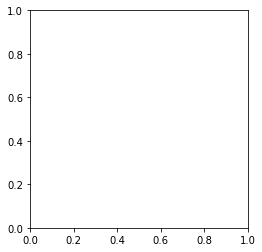

In [325]:
dataiter = iter(test_loader)
images, labels = dataiter.next()
print(images.shape)
print(labels.shape)

imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(4)))

In [326]:
tnet = CifarNet()
tnet.load_state_dict(torch.load(PATH))
outputs = tnet(images)

tensor([[0.0000, 0.0278, 0.0005, 0.1780, 0.0610, 0.1097, 0.0000, 0.0162, 0.1333,
         0.0000],
        [0.0000, 0.0339, 0.0170, 0.1691, 0.0525, 0.1133, 0.0000, 0.0270, 0.1445,
         0.0000],
        [0.0000, 0.0137, 0.0030, 0.1615, 0.0479, 0.1021, 0.0000, 0.0363, 0.1399,
         0.0000],
        [0.0000, 0.0231, 0.0000, 0.1695, 0.0635, 0.1079, 0.0000, 0.0228, 0.1354,
         0.0000]], grad_fn=<ReluBackward0>)


In [327]:
_, predicted = torch.max(outputs, 1)
print(outputs)

print("predicted:",' '.join(f'{classes[predicted[j]]:5s}' for j in range(4)))

tensor([[0.0000, 0.0278, 0.0005, 0.1780, 0.0610, 0.1097, 0.0000, 0.0162, 0.1333,
         0.0000],
        [0.0000, 0.0339, 0.0170, 0.1691, 0.0525, 0.1133, 0.0000, 0.0270, 0.1445,
         0.0000],
        [0.0000, 0.0137, 0.0030, 0.1615, 0.0479, 0.1021, 0.0000, 0.0363, 0.1399,
         0.0000],
        [0.0000, 0.0231, 0.0000, 0.1695, 0.0635, 0.1079, 0.0000, 0.0228, 0.1354,
         0.0000]], grad_fn=<ReluBackward0>)
predicted: cat   cat   cat   cat  


In [328]:
correct = 0
total = 0
# 학습 중이 아니므로, 출력에 대한 변화도를 계산할 필요가 없습니다
with torch.no_grad():
    for data in test_loader:
        images, labels = data
        # 신경망에 이미지를 통과시켜 출력을 계산합니다
        outputs = net(images)
        # 가장 높은 값(energy)를 갖는 분류(class)를 정답으로 선택하겠습니다
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        #print((predicted))
        #print((labels))
        target = torch.max(labels,1)
        for k in range(4):
           
            #print(target)
            if predicted[k].item() == target.indices[k].item():
                
                correct+=1

print(f'Accuracy of the network on the 18000 test images: {100 * correct // total} %')

tensor([[0.0000, 0.0278, 0.0005, 0.1780, 0.0610, 0.1097, 0.0000, 0.0162, 0.1333,
         0.0000],
        [0.0000, 0.0339, 0.0170, 0.1691, 0.0525, 0.1133, 0.0000, 0.0270, 0.1445,
         0.0000],
        [0.0000, 0.0137, 0.0030, 0.1615, 0.0479, 0.1021, 0.0000, 0.0363, 0.1399,
         0.0000],
        [0.0000, 0.0231, 0.0000, 0.1695, 0.0635, 0.1079, 0.0000, 0.0228, 0.1354,
         0.0000]])
tensor([[0.0000, 0.0296, 0.0032, 0.1765, 0.0504, 0.1005, 0.0000, 0.0268, 0.1329,
         0.0000],
        [0.0000, 0.0269, 0.0000, 0.1754, 0.0642, 0.1124, 0.0000, 0.0111, 0.1369,
         0.0000],
        [0.0000, 0.0328, 0.0026, 0.1780, 0.0525, 0.1116, 0.0000, 0.0155, 0.1396,
         0.0000],
        [0.0000, 0.0360, 0.0051, 0.1823, 0.0573, 0.1071, 0.0000, 0.0150, 0.1370,
         0.0000]])
tensor([[0.0000, 0.0267, 0.0134, 0.1725, 0.0506, 0.1069, 0.0000, 0.0300, 0.1342,
         0.0000],
        [0.0000, 0.0209, 0.0004, 0.1689, 0.0518, 0.1135, 0.0000, 0.0208, 0.1392,
         0.0000],
        

tensor([[0.0000, 0.0166, 0.0000, 0.1708, 0.0573, 0.1112, 0.0000, 0.0080, 0.1361,
         0.0000],
        [0.0000, 0.0234, 0.0000, 0.1750, 0.0540, 0.1057, 0.0000, 0.0120, 0.1362,
         0.0000],
        [0.0000, 0.0203, 0.0042, 0.1610, 0.0496, 0.1099, 0.0000, 0.0323, 0.1425,
         0.0000],
        [0.0000, 0.0184, 0.0000, 0.1707, 0.0516, 0.1048, 0.0000, 0.0177, 0.1347,
         0.0000]])
tensor([[0.0000, 0.0288, 0.0024, 0.1716, 0.0578, 0.1041, 0.0000, 0.0290, 0.1306,
         0.0000],
        [0.0000, 0.0169, 0.0000, 0.1691, 0.0491, 0.1044, 0.0000, 0.0277, 0.1374,
         0.0000],
        [0.0000, 0.0218, 0.0000, 0.1728, 0.0599, 0.1055, 0.0000, 0.0196, 0.1354,
         0.0000],
        [0.0000, 0.0156, 0.0000, 0.1668, 0.0580, 0.1093, 0.0000, 0.0205, 0.1335,
         0.0000]])
tensor([[0.0000, 0.0305, 0.0013, 0.1741, 0.0532, 0.0969, 0.0000, 0.0347, 0.1333,
         0.0000],
        [0.0000, 0.0256, 0.0000, 0.1768, 0.0596, 0.1060, 0.0000, 0.0155, 0.1383,
         0.0000],
        

tensor([[0.0000, 0.0253, 0.0004, 0.1745, 0.0577, 0.1035, 0.0000, 0.0276, 0.1315,
         0.0000],
        [0.0000, 0.0182, 0.0000, 0.1718, 0.0575, 0.1038, 0.0000, 0.0203, 0.1376,
         0.0000],
        [0.0000, 0.0214, 0.0000, 0.1767, 0.0533, 0.1104, 0.0000, 0.0108, 0.1395,
         0.0000],
        [0.0000, 0.0156, 0.0000, 0.1749, 0.0556, 0.1080, 0.0000, 0.0101, 0.1364,
         0.0000]])
tensor([[0.0000, 0.0275, 0.0019, 0.1708, 0.0529, 0.1002, 0.0000, 0.0389, 0.1299,
         0.0000],
        [0.0000, 0.0202, 0.0000, 0.1736, 0.0569, 0.1084, 0.0000, 0.0204, 0.1369,
         0.0000],
        [0.0000, 0.0173, 0.0000, 0.1711, 0.0605, 0.1078, 0.0000, 0.0200, 0.1352,
         0.0000],
        [0.0000, 0.0275, 0.0000, 0.1725, 0.0553, 0.1050, 0.0000, 0.0240, 0.1348,
         0.0000]])
tensor([[0.0000, 0.0266, 0.0000, 0.1733, 0.0572, 0.1107, 0.0000, 0.0162, 0.1372,
         0.0000],
        [0.0000, 0.0196, 0.0000, 0.1714, 0.0614, 0.1066, 0.0000, 0.0188, 0.1329,
         0.0000],
        

tensor([[0.0000, 0.0346, 0.0040, 0.1782, 0.0589, 0.1054, 0.0000, 0.0199, 0.1367,
         0.0000],
        [0.0000, 0.0215, 0.0000, 0.1753, 0.0559, 0.1027, 0.0000, 0.0156, 0.1410,
         0.0000],
        [0.0000, 0.0153, 0.0000, 0.1653, 0.0614, 0.1101, 0.0000, 0.0193, 0.1356,
         0.0000],
        [0.0000, 0.0394, 0.0112, 0.1673, 0.0557, 0.1090, 0.0000, 0.0331, 0.1413,
         0.0000]])
tensor([[0.0000, 0.0266, 0.0000, 0.1785, 0.0567, 0.1056, 0.0000, 0.0158, 0.1374,
         0.0000],
        [0.0000, 0.0117, 0.0038, 0.1623, 0.0428, 0.1025, 0.0000, 0.0266, 0.1450,
         0.0000],
        [0.0000, 0.0288, 0.0000, 0.1757, 0.0648, 0.1057, 0.0000, 0.0202, 0.1340,
         0.0000],
        [0.0000, 0.0244, 0.0000, 0.1739, 0.0591, 0.1124, 0.0000, 0.0170, 0.1392,
         0.0000]])
tensor([[0.0000, 0.0140, 0.0000, 0.1700, 0.0569, 0.1064, 0.0000, 0.0170, 0.1340,
         0.0000],
        [0.0000, 0.0172, 0.0000, 0.1741, 0.0625, 0.1104, 0.0000, 0.0138, 0.1316,
         0.0000],
        

tensor([[0.0000, 0.0178, 0.0000, 0.1673, 0.0649, 0.1121, 0.0000, 0.0266, 0.1267,
         0.0000],
        [0.0000, 0.0249, 0.0000, 0.1738, 0.0588, 0.1057, 0.0000, 0.0207, 0.1376,
         0.0000],
        [0.0000, 0.0194, 0.0000, 0.1752, 0.0574, 0.1057, 0.0000, 0.0144, 0.1344,
         0.0000],
        [0.0000, 0.0321, 0.0081, 0.1648, 0.0549, 0.1002, 0.0000, 0.0357, 0.1395,
         0.0000]])
tensor([[0.0000, 0.0239, 0.0040, 0.1690, 0.0541, 0.1026, 0.0000, 0.0346, 0.1351,
         0.0000],
        [0.0000, 0.0243, 0.0035, 0.1748, 0.0537, 0.1068, 0.0000, 0.0281, 0.1344,
         0.0000],
        [0.0000, 0.0273, 0.0070, 0.1647, 0.0509, 0.1013, 0.0000, 0.0324, 0.1349,
         0.0000],
        [0.0000, 0.0187, 0.0000, 0.1756, 0.0598, 0.1077, 0.0000, 0.0157, 0.1321,
         0.0000]])
tensor([[0.0000, 0.0221, 0.0000, 0.1768, 0.0552, 0.1061, 0.0000, 0.0112, 0.1394,
         0.0000],
        [0.0000, 0.0273, 0.0087, 0.1630, 0.0501, 0.1061, 0.0000, 0.0331, 0.1384,
         0.0000],
        

tensor([[0.0000, 0.0280, 0.0035, 0.1781, 0.0546, 0.1105, 0.0000, 0.0165, 0.1376,
         0.0000],
        [0.0000, 0.0239, 0.0040, 0.1686, 0.0561, 0.1040, 0.0000, 0.0302, 0.1337,
         0.0000],
        [0.0000, 0.0229, 0.0000, 0.1742, 0.0583, 0.0999, 0.0000, 0.0228, 0.1390,
         0.0000],
        [0.0000, 0.0325, 0.0078, 0.1771, 0.0560, 0.1078, 0.0000, 0.0221, 0.1353,
         0.0000]])
tensor([[0.0000, 0.0229, 0.0037, 0.1739, 0.0465, 0.0994, 0.0000, 0.0274, 0.1372,
         0.0000],
        [0.0000, 0.0267, 0.0053, 0.1676, 0.0497, 0.1010, 0.0000, 0.0271, 0.1371,
         0.0000],
        [0.0000, 0.0172, 0.0000, 0.1727, 0.0546, 0.1055, 0.0000, 0.0150, 0.1345,
         0.0000],
        [0.0000, 0.0237, 0.0000, 0.1757, 0.0610, 0.1088, 0.0000, 0.0149, 0.1346,
         0.0000]])
tensor([[0.0000, 0.0166, 0.0000, 0.1802, 0.0510, 0.1037, 0.0000, 0.0138, 0.1302,
         0.0000],
        [0.0000, 0.0302, 0.0000, 0.1766, 0.0553, 0.1027, 0.0000, 0.0254, 0.1329,
         0.0000],
        

tensor([[0.0000, 0.0519, 0.0186, 0.1813, 0.0588, 0.0999, 0.0000, 0.0317, 0.1347,
         0.0000],
        [0.0000, 0.0459, 0.0185, 0.1818, 0.0593, 0.1157, 0.0000, 0.0153, 0.1387,
         0.0000],
        [0.0000, 0.0311, 0.0000, 0.1797, 0.0581, 0.1060, 0.0000, 0.0187, 0.1331,
         0.0000],
        [0.0000, 0.0329, 0.0076, 0.1752, 0.0593, 0.1107, 0.0000, 0.0153, 0.1409,
         0.0000]])
tensor([[0.0000, 0.0249, 0.0000, 0.1719, 0.0604, 0.1092, 0.0000, 0.0210, 0.1368,
         0.0000],
        [0.0000, 0.0274, 0.0000, 0.1762, 0.0571, 0.1084, 0.0000, 0.0169, 0.1353,
         0.0000],
        [0.0000, 0.0336, 0.0015, 0.1724, 0.0676, 0.1114, 0.0000, 0.0237, 0.1321,
         0.0000],
        [0.0000, 0.0285, 0.0000, 0.1767, 0.0633, 0.1113, 0.0000, 0.0167, 0.1376,
         0.0000]])
tensor([[0.0000, 0.0264, 0.0016, 0.1685, 0.0600, 0.1080, 0.0000, 0.0245, 0.1391,
         0.0000],
        [0.0000, 0.0338, 0.0045, 0.1718, 0.0603, 0.1056, 0.0000, 0.0260, 0.1409,
         0.0000],
        

tensor([[0.0000, 0.0323, 0.0018, 0.1748, 0.0543, 0.1042, 0.0000, 0.0281, 0.1338,
         0.0000],
        [0.0000, 0.0415, 0.0160, 0.1780, 0.0575, 0.1056, 0.0000, 0.0353, 0.1305,
         0.0000],
        [0.0000, 0.0133, 0.0000, 0.1750, 0.0549, 0.1102, 0.0000, 0.0123, 0.1274,
         0.0000],
        [0.0000, 0.0335, 0.0036, 0.1757, 0.0610, 0.1110, 0.0000, 0.0204, 0.1323,
         0.0000]])
tensor([[0.0000, 0.0239, 0.0000, 0.1794, 0.0610, 0.1057, 0.0000, 0.0088, 0.1354,
         0.0000],
        [0.0000, 0.0166, 0.0000, 0.1694, 0.0525, 0.1017, 0.0000, 0.0168, 0.1394,
         0.0000],
        [0.0000, 0.0162, 0.0000, 0.1765, 0.0512, 0.1022, 0.0000, 0.0198, 0.1306,
         0.0000],
        [0.0000, 0.0304, 0.0184, 0.1674, 0.0501, 0.1073, 0.0000, 0.0125, 0.1509,
         0.0000]])
tensor([[0.0000, 0.0301, 0.0021, 0.1774, 0.0518, 0.1017, 0.0000, 0.0219, 0.1360,
         0.0000],
        [0.0000, 0.0315, 0.0018, 0.1698, 0.0597, 0.1113, 0.0000, 0.0246, 0.1427,
         0.0000],
        

tensor([[0.0000, 0.0219, 0.0000, 0.1713, 0.0581, 0.1040, 0.0000, 0.0208, 0.1364,
         0.0000],
        [0.0000, 0.0295, 0.0022, 0.1733, 0.0592, 0.1049, 0.0000, 0.0303, 0.1367,
         0.0000],
        [0.0000, 0.0237, 0.0000, 0.1711, 0.0610, 0.1094, 0.0000, 0.0160, 0.1290,
         0.0000],
        [0.0000, 0.0264, 0.0000, 0.1728, 0.0570, 0.1026, 0.0000, 0.0258, 0.1352,
         0.0000]])
tensor([[0.0000, 0.0175, 0.0000, 0.1744, 0.0599, 0.0994, 0.0000, 0.0216, 0.1311,
         0.0000],
        [0.0000, 0.0191, 0.0000, 0.1775, 0.0491, 0.1045, 0.0000, 0.0126, 0.1395,
         0.0000],
        [0.0000, 0.0139, 0.0000, 0.1689, 0.0595, 0.1057, 0.0000, 0.0171, 0.1355,
         0.0000],
        [0.0000, 0.0142, 0.0000, 0.1714, 0.0517, 0.1075, 0.0000, 0.0165, 0.1373,
         0.0000]])
tensor([[0.0000, 0.0373, 0.0094, 0.1747, 0.0553, 0.1105, 0.0000, 0.0274, 0.1414,
         0.0000],
        [0.0000, 0.0244, 0.0000, 0.1736, 0.0568, 0.1036, 0.0000, 0.0223, 0.1320,
         0.0000],
        

tensor([[0.0000, 0.0281, 0.0069, 0.1681, 0.0518, 0.0985, 0.0000, 0.0406, 0.1341,
         0.0000],
        [0.0000, 0.0277, 0.0004, 0.1673, 0.0496, 0.0974, 0.0000, 0.0331, 0.1374,
         0.0000],
        [0.0000, 0.0145, 0.0000, 0.1718, 0.0530, 0.1023, 0.0000, 0.0180, 0.1367,
         0.0000],
        [0.0000, 0.0379, 0.0164, 0.1741, 0.0536, 0.1070, 0.0000, 0.0217, 0.1387,
         0.0000]])
tensor([[0.0000, 0.0244, 0.0000, 0.1746, 0.0593, 0.1039, 0.0000, 0.0171, 0.1324,
         0.0000],
        [0.0000, 0.0266, 0.0016, 0.1683, 0.0568, 0.1041, 0.0000, 0.0342, 0.1364,
         0.0000],
        [0.0000, 0.0238, 0.0000, 0.1742, 0.0573, 0.1080, 0.0000, 0.0156, 0.1415,
         0.0000],
        [0.0000, 0.0244, 0.0024, 0.1787, 0.0568, 0.1137, 0.0000, 0.0112, 0.1356,
         0.0000]])
tensor([[0.0000, 0.0098, 0.0000, 0.1653, 0.0598, 0.1124, 0.0000, 0.0142, 0.1403,
         0.0000],
        [0.0000, 0.0305, 0.0000, 0.1794, 0.0572, 0.1038, 0.0000, 0.0244, 0.1335,
         0.0000],
        

tensor([[0.0000, 0.0269, 0.0141, 0.1634, 0.0490, 0.1062, 0.0000, 0.0349, 0.1414,
         0.0000],
        [0.0000, 0.0254, 0.0051, 0.1640, 0.0545, 0.1090, 0.0000, 0.0194, 0.1417,
         0.0000],
        [0.0000, 0.0274, 0.0000, 0.1743, 0.0581, 0.1060, 0.0000, 0.0173, 0.1379,
         0.0000],
        [0.0000, 0.0160, 0.0000, 0.1740, 0.0568, 0.1067, 0.0000, 0.0141, 0.1395,
         0.0000]])
tensor([[0.0000e+00, 2.7123e-02, 1.1627e-03, 1.7435e-01, 5.9890e-02, 1.0623e-01,
         0.0000e+00, 1.4316e-02, 1.3737e-01, 0.0000e+00],
        [0.0000e+00, 2.9555e-02, 8.9338e-03, 1.7218e-01, 4.9564e-02, 1.0649e-01,
         0.0000e+00, 2.4698e-02, 1.4383e-01, 0.0000e+00],
        [0.0000e+00, 2.6547e-02, 9.6381e-05, 1.7573e-01, 5.8513e-02, 1.0194e-01,
         0.0000e+00, 2.0635e-02, 1.3645e-01, 0.0000e+00],
        [0.0000e+00, 2.2874e-02, 0.0000e+00, 1.7131e-01, 4.5825e-02, 1.0047e-01,
         0.0000e+00, 3.0537e-02, 1.3353e-01, 0.0000e+00]])
tensor([[0.0000, 0.0205, 0.0000, 0.1746, 0.053

tensor([[0.0000, 0.0252, 0.0018, 0.1730, 0.0546, 0.1028, 0.0000, 0.0335, 0.1294,
         0.0000],
        [0.0000, 0.0340, 0.0060, 0.1793, 0.0538, 0.1007, 0.0000, 0.0286, 0.1338,
         0.0000],
        [0.0000, 0.0283, 0.0000, 0.1788, 0.0558, 0.1051, 0.0000, 0.0131, 0.1351,
         0.0000],
        [0.0000, 0.0304, 0.0054, 0.1656, 0.0656, 0.1156, 0.0000, 0.0257, 0.1332,
         0.0000]])
tensor([[0.0000, 0.0237, 0.0000, 0.1737, 0.0583, 0.1038, 0.0000, 0.0189, 0.1356,
         0.0000],
        [0.0000, 0.0232, 0.0032, 0.1722, 0.0502, 0.1021, 0.0000, 0.0323, 0.1350,
         0.0000],
        [0.0000, 0.0282, 0.0020, 0.1739, 0.0619, 0.1097, 0.0000, 0.0172, 0.1376,
         0.0000],
        [0.0000, 0.0363, 0.0065, 0.1827, 0.0607, 0.1109, 0.0000, 0.0181, 0.1355,
         0.0000]])
tensor([[0.0000, 0.0147, 0.0000, 0.1737, 0.0575, 0.1061, 0.0000, 0.0152, 0.1367,
         0.0000],
        [0.0000, 0.0260, 0.0075, 0.1690, 0.0517, 0.0991, 0.0000, 0.0405, 0.1320,
         0.0000],
        

tensor([[0.0000, 0.0224, 0.0064, 0.1781, 0.0538, 0.1084, 0.0000, 0.0174, 0.1358,
         0.0000],
        [0.0000, 0.0276, 0.0004, 0.1818, 0.0584, 0.1091, 0.0000, 0.0144, 0.1340,
         0.0000],
        [0.0000, 0.0093, 0.0000, 0.1729, 0.0536, 0.1033, 0.0000, 0.0103, 0.1368,
         0.0000],
        [0.0000, 0.0306, 0.0090, 0.1606, 0.0491, 0.1072, 0.0000, 0.0306, 0.1420,
         0.0000]])
tensor([[0.0000, 0.0198, 0.0000, 0.1739, 0.0600, 0.1092, 0.0000, 0.0164, 0.1358,
         0.0000],
        [0.0000, 0.0214, 0.0000, 0.1710, 0.0508, 0.1008, 0.0000, 0.0264, 0.1361,
         0.0000],
        [0.0000, 0.0290, 0.0130, 0.1732, 0.0516, 0.1060, 0.0000, 0.0300, 0.1368,
         0.0000],
        [0.0000, 0.0262, 0.0049, 0.1631, 0.0539, 0.1058, 0.0000, 0.0359, 0.1430,
         0.0000]])
tensor([[0.0000, 0.0267, 0.0014, 0.1798, 0.0570, 0.1061, 0.0000, 0.0165, 0.1361,
         0.0000],
        [0.0000, 0.0239, 0.0000, 0.1771, 0.0584, 0.1030, 0.0000, 0.0199, 0.1326,
         0.0000],
        

tensor([[0.0000, 0.0234, 0.0000, 0.1671, 0.0625, 0.1068, 0.0000, 0.0190, 0.1380,
         0.0000],
        [0.0000, 0.0384, 0.0197, 0.1697, 0.0495, 0.0999, 0.0000, 0.0369, 0.1394,
         0.0000],
        [0.0000, 0.0236, 0.0000, 0.1723, 0.0634, 0.1071, 0.0000, 0.0191, 0.1367,
         0.0000],
        [0.0000, 0.0151, 0.0000, 0.1651, 0.0646, 0.1116, 0.0000, 0.0141, 0.1353,
         0.0000]])
tensor([[0.0000, 0.0176, 0.0000, 0.1705, 0.0560, 0.1187, 0.0000, 0.0106, 0.1401,
         0.0000],
        [0.0000, 0.0278, 0.0010, 0.1782, 0.0596, 0.1053, 0.0000, 0.0129, 0.1349,
         0.0000],
        [0.0000, 0.0283, 0.0015, 0.1791, 0.0565, 0.1054, 0.0000, 0.0183, 0.1381,
         0.0000],
        [0.0000, 0.0240, 0.0000, 0.1809, 0.0569, 0.1053, 0.0000, 0.0133, 0.1332,
         0.0000]])
tensor([[0.0000, 0.0183, 0.0000, 0.1756, 0.0543, 0.1083, 0.0000, 0.0161, 0.1353,
         0.0000],
        [0.0000, 0.0296, 0.0033, 0.1785, 0.0547, 0.1026, 0.0000, 0.0259, 0.1330,
         0.0000],
        

tensor([[0.0000, 0.0087, 0.0000, 0.1682, 0.0526, 0.1051, 0.0000, 0.0110, 0.1341,
         0.0000],
        [0.0000, 0.0364, 0.0202, 0.1660, 0.0549, 0.1045, 0.0000, 0.0381, 0.1400,
         0.0000],
        [0.0000, 0.0192, 0.0000, 0.1722, 0.0548, 0.1151, 0.0000, 0.0157, 0.1382,
         0.0000],
        [0.0000, 0.0161, 0.0000, 0.1735, 0.0616, 0.1117, 0.0000, 0.0113, 0.1373,
         0.0000]])
tensor([[0.0000, 0.0426, 0.0110, 0.1819, 0.0618, 0.1109, 0.0000, 0.0227, 0.1309,
         0.0000],
        [0.0000, 0.0330, 0.0084, 0.1721, 0.0519, 0.1001, 0.0000, 0.0252, 0.1381,
         0.0000],
        [0.0000, 0.0390, 0.0097, 0.1661, 0.0561, 0.1075, 0.0000, 0.0293, 0.1387,
         0.0000],
        [0.0000, 0.0319, 0.0006, 0.1797, 0.0602, 0.1023, 0.0000, 0.0191, 0.1357,
         0.0000]])
tensor([[0.0000, 0.0141, 0.0000, 0.1665, 0.0610, 0.1124, 0.0000, 0.0126, 0.1300,
         0.0000],
        [0.0000, 0.0185, 0.0000, 0.1754, 0.0500, 0.1119, 0.0000, 0.0097, 0.1415,
         0.0000],
        

tensor([[0.0000, 0.0225, 0.0000, 0.1755, 0.0590, 0.1050, 0.0000, 0.0218, 0.1335,
         0.0000],
        [0.0000, 0.0226, 0.0000, 0.1736, 0.0552, 0.1061, 0.0000, 0.0195, 0.1346,
         0.0000],
        [0.0000, 0.0249, 0.0000, 0.1748, 0.0531, 0.1052, 0.0000, 0.0251, 0.1349,
         0.0000],
        [0.0000, 0.0342, 0.0037, 0.1815, 0.0582, 0.1026, 0.0000, 0.0197, 0.1327,
         0.0000]])
tensor([[0.0000, 0.0152, 0.0000, 0.1663, 0.0601, 0.1048, 0.0000, 0.0212, 0.1349,
         0.0000],
        [0.0000, 0.0280, 0.0037, 0.1743, 0.0621, 0.1096, 0.0000, 0.0183, 0.1334,
         0.0000],
        [0.0000, 0.0243, 0.0000, 0.1759, 0.0591, 0.1054, 0.0000, 0.0167, 0.1404,
         0.0000],
        [0.0000, 0.0182, 0.0068, 0.1728, 0.0464, 0.1035, 0.0000, 0.0230, 0.1331,
         0.0000]])
tensor([[0.0000, 0.0114, 0.0000, 0.1694, 0.0540, 0.1096, 0.0000, 0.0140, 0.1389,
         0.0000],
        [0.0000, 0.0263, 0.0000, 0.1736, 0.0529, 0.0999, 0.0000, 0.0319, 0.1335,
         0.0000],
        

tensor([[0.0000, 0.0355, 0.0094, 0.1748, 0.0541, 0.1103, 0.0000, 0.0216, 0.1440,
         0.0000],
        [0.0000, 0.0109, 0.0000, 0.1635, 0.0493, 0.1101, 0.0000, 0.0199, 0.1362,
         0.0000],
        [0.0000, 0.0236, 0.0000, 0.1772, 0.0512, 0.1012, 0.0000, 0.0230, 0.1317,
         0.0000],
        [0.0000, 0.0351, 0.0117, 0.1717, 0.0611, 0.1154, 0.0000, 0.0173, 0.1398,
         0.0000]])
tensor([[0.0000, 0.0228, 0.0000, 0.1706, 0.0575, 0.1079, 0.0000, 0.0162, 0.1410,
         0.0000],
        [0.0000, 0.0350, 0.0134, 0.1683, 0.0583, 0.1061, 0.0000, 0.0308, 0.1394,
         0.0000],
        [0.0000, 0.0215, 0.0052, 0.1756, 0.0517, 0.1093, 0.0000, 0.0205, 0.1398,
         0.0000],
        [0.0000, 0.0328, 0.0004, 0.1781, 0.0630, 0.1100, 0.0000, 0.0182, 0.1311,
         0.0000]])
tensor([[0.0000, 0.0252, 0.0000, 0.1737, 0.0548, 0.1021, 0.0000, 0.0317, 0.1320,
         0.0000],
        [0.0000, 0.0251, 0.0047, 0.1684, 0.0551, 0.1057, 0.0000, 0.0354, 0.1383,
         0.0000],
        

tensor([[0.0000, 0.0311, 0.0034, 0.1739, 0.0524, 0.0985, 0.0000, 0.0353, 0.1277,
         0.0000],
        [0.0000, 0.0412, 0.0186, 0.1735, 0.0541, 0.1044, 0.0000, 0.0297, 0.1338,
         0.0000],
        [0.0000, 0.0180, 0.0000, 0.1714, 0.0542, 0.1019, 0.0000, 0.0159, 0.1371,
         0.0000],
        [0.0000, 0.0211, 0.0000, 0.1748, 0.0609, 0.1068, 0.0000, 0.0220, 0.1320,
         0.0000]])
tensor([[0.0000, 0.0321, 0.0043, 0.1734, 0.0652, 0.1074, 0.0000, 0.0265, 0.1330,
         0.0000],
        [0.0000, 0.0273, 0.0077, 0.1719, 0.0528, 0.1035, 0.0000, 0.0386, 0.1349,
         0.0000],
        [0.0000, 0.0189, 0.0000, 0.1694, 0.0543, 0.1082, 0.0000, 0.0176, 0.1371,
         0.0000],
        [0.0000, 0.0357, 0.0097, 0.1670, 0.0496, 0.1030, 0.0000, 0.0378, 0.1381,
         0.0000]])
tensor([[0.0000, 0.0220, 0.0000, 0.1738, 0.0615, 0.1109, 0.0000, 0.0166, 0.1403,
         0.0000],
        [0.0000, 0.0350, 0.0066, 0.1717, 0.0601, 0.1044, 0.0000, 0.0286, 0.1412,
         0.0000],
        

tensor([[0.0000, 0.0203, 0.0000, 0.1770, 0.0577, 0.1054, 0.0000, 0.0120, 0.1379,
         0.0000],
        [0.0000, 0.0263, 0.0000, 0.1749, 0.0580, 0.1070, 0.0000, 0.0156, 0.1374,
         0.0000],
        [0.0000, 0.0220, 0.0000, 0.1689, 0.0630, 0.1075, 0.0000, 0.0199, 0.1367,
         0.0000],
        [0.0000, 0.0318, 0.0109, 0.1792, 0.0499, 0.1084, 0.0000, 0.0236, 0.1328,
         0.0000]])
tensor([[0.0000, 0.0086, 0.0000, 0.1725, 0.0463, 0.1074, 0.0000, 0.0126, 0.1412,
         0.0000],
        [0.0000, 0.0344, 0.0106, 0.1762, 0.0543, 0.1038, 0.0000, 0.0275, 0.1380,
         0.0000],
        [0.0000, 0.0228, 0.0000, 0.1741, 0.0564, 0.1077, 0.0000, 0.0238, 0.1327,
         0.0000],
        [0.0000, 0.0215, 0.0000, 0.1755, 0.0592, 0.1044, 0.0000, 0.0159, 0.1381,
         0.0000]])
tensor([[0.0000, 0.0195, 0.0049, 0.1612, 0.0507, 0.1084, 0.0000, 0.0299, 0.1409,
         0.0000],
        [0.0000, 0.0189, 0.0000, 0.1734, 0.0438, 0.0974, 0.0000, 0.0210, 0.1340,
         0.0000],
        

tensor([[0.0000, 0.0277, 0.0077, 0.1716, 0.0446, 0.1020, 0.0000, 0.0259, 0.1423,
         0.0000],
        [0.0000, 0.0323, 0.0010, 0.1728, 0.0511, 0.0973, 0.0000, 0.0368, 0.1320,
         0.0000],
        [0.0000, 0.0176, 0.0000, 0.1683, 0.0610, 0.1153, 0.0000, 0.0086, 0.1349,
         0.0000],
        [0.0000, 0.0281, 0.0012, 0.1768, 0.0577, 0.1113, 0.0000, 0.0168, 0.1391,
         0.0000]])
tensor([[0.0000, 0.0186, 0.0000, 0.1715, 0.0519, 0.1073, 0.0000, 0.0178, 0.1398,
         0.0000],
        [0.0000, 0.0143, 0.0000, 0.1678, 0.0606, 0.1099, 0.0000, 0.0159, 0.1360,
         0.0000],
        [0.0000, 0.0240, 0.0000, 0.1755, 0.0461, 0.0993, 0.0000, 0.0320, 0.1321,
         0.0000],
        [0.0000, 0.0290, 0.0028, 0.1781, 0.0579, 0.1101, 0.0000, 0.0139, 0.1380,
         0.0000]])
tensor([[0.0000, 0.0121, 0.0000, 0.1652, 0.0608, 0.1131, 0.0000, 0.0126, 0.1361,
         0.0000],
        [0.0000, 0.0259, 0.0000, 0.1731, 0.0590, 0.1057, 0.0000, 0.0192, 0.1391,
         0.0000],
        

tensor([[0.0000, 0.0271, 0.0013, 0.1765, 0.0488, 0.1038, 0.0000, 0.0302, 0.1335,
         0.0000],
        [0.0000, 0.0291, 0.0046, 0.1712, 0.0500, 0.0979, 0.0000, 0.0420, 0.1328,
         0.0000],
        [0.0000, 0.0418, 0.0185, 0.1809, 0.0535, 0.1026, 0.0000, 0.0293, 0.1325,
         0.0000],
        [0.0000, 0.0235, 0.0000, 0.1723, 0.0500, 0.1013, 0.0000, 0.0285, 0.1359,
         0.0000]])
tensor([[0.0000, 0.0267, 0.0000, 0.1736, 0.0573, 0.1074, 0.0000, 0.0189, 0.1388,
         0.0000],
        [0.0000, 0.0284, 0.0000, 0.1798, 0.0553, 0.1049, 0.0000, 0.0158, 0.1373,
         0.0000],
        [0.0000, 0.0245, 0.0000, 0.1717, 0.0648, 0.1127, 0.0000, 0.0152, 0.1332,
         0.0000],
        [0.0000, 0.0206, 0.0000, 0.1753, 0.0525, 0.1016, 0.0000, 0.0199, 0.1384,
         0.0000]])
tensor([[0.0000, 0.0256, 0.0009, 0.1743, 0.0532, 0.0999, 0.0000, 0.0231, 0.1363,
         0.0000],
        [0.0000, 0.0228, 0.0000, 0.1771, 0.0510, 0.1014, 0.0000, 0.0248, 0.1337,
         0.0000],
        

tensor([[0.0000, 0.0396, 0.0174, 0.1780, 0.0553, 0.1111, 0.0000, 0.0168, 0.1403,
         0.0000],
        [0.0000, 0.0232, 0.0000, 0.1708, 0.0570, 0.1036, 0.0000, 0.0324, 0.1362,
         0.0000],
        [0.0000, 0.0157, 0.0000, 0.1704, 0.0624, 0.1054, 0.0000, 0.0173, 0.1308,
         0.0000],
        [0.0000, 0.0231, 0.0058, 0.1723, 0.0592, 0.1108, 0.0000, 0.0197, 0.1337,
         0.0000]])
tensor([[0.0000, 0.0237, 0.0003, 0.1672, 0.0457, 0.0963, 0.0000, 0.0369, 0.1367,
         0.0000],
        [0.0000, 0.0085, 0.0000, 0.1725, 0.0539, 0.1020, 0.0000, 0.0118, 0.1367,
         0.0000],
        [0.0000, 0.0258, 0.0000, 0.1728, 0.0565, 0.1113, 0.0000, 0.0136, 0.1439,
         0.0000],
        [0.0000, 0.0124, 0.0000, 0.1740, 0.0560, 0.1051, 0.0000, 0.0108, 0.1387,
         0.0000]])
tensor([[0.0000, 0.0356, 0.0108, 0.1748, 0.0691, 0.1139, 0.0000, 0.0165, 0.1340,
         0.0000],
        [0.0000, 0.0199, 0.0000, 0.1728, 0.0501, 0.1019, 0.0000, 0.0236, 0.1371,
         0.0000],
        

tensor([[0.0000, 0.0342, 0.0096, 0.1730, 0.0583, 0.1103, 0.0000, 0.0256, 0.1406,
         0.0000],
        [0.0000, 0.0215, 0.0000, 0.1758, 0.0539, 0.1041, 0.0000, 0.0221, 0.1331,
         0.0000],
        [0.0000, 0.0194, 0.0000, 0.1759, 0.0534, 0.1035, 0.0000, 0.0232, 0.1338,
         0.0000],
        [0.0000, 0.0416, 0.0100, 0.1831, 0.0571, 0.1044, 0.0000, 0.0269, 0.1329,
         0.0000]])
tensor([[0.0000, 0.0237, 0.0000, 0.1743, 0.0586, 0.1075, 0.0000, 0.0142, 0.1373,
         0.0000],
        [0.0000, 0.0349, 0.0143, 0.1732, 0.0523, 0.1000, 0.0000, 0.0416, 0.1324,
         0.0000],
        [0.0000, 0.0325, 0.0122, 0.1765, 0.0576, 0.1037, 0.0000, 0.0353, 0.1320,
         0.0000],
        [0.0000, 0.0126, 0.0000, 0.1689, 0.0539, 0.1103, 0.0000, 0.0180, 0.1387,
         0.0000]])
tensor([[0.0000, 0.0209, 0.0000, 0.1718, 0.0537, 0.1035, 0.0000, 0.0242, 0.1378,
         0.0000],
        [0.0000, 0.0393, 0.0131, 0.1738, 0.0512, 0.0975, 0.0000, 0.0256, 0.1378,
         0.0000],
        

tensor([[0.0000, 0.0253, 0.0000, 0.1780, 0.0564, 0.1021, 0.0000, 0.0193, 0.1363,
         0.0000],
        [0.0000, 0.0142, 0.0000, 0.1709, 0.0484, 0.1044, 0.0000, 0.0117, 0.1373,
         0.0000],
        [0.0000, 0.0284, 0.0041, 0.1688, 0.0554, 0.1014, 0.0000, 0.0427, 0.1336,
         0.0000],
        [0.0000, 0.0150, 0.0000, 0.1725, 0.0590, 0.1078, 0.0000, 0.0166, 0.1391,
         0.0000]])
tensor([[0.0000e+00, 1.2015e-02, 0.0000e+00, 1.7338e-01, 5.0704e-02, 1.0413e-01,
         0.0000e+00, 1.7427e-02, 1.3782e-01, 0.0000e+00],
        [0.0000e+00, 1.7695e-02, 0.0000e+00, 1.7407e-01, 5.5962e-02, 1.0244e-01,
         0.0000e+00, 1.6557e-02, 1.3836e-01, 0.0000e+00],
        [0.0000e+00, 1.7593e-02, 0.0000e+00, 1.7985e-01, 5.8706e-02, 1.0124e-01,
         0.0000e+00, 1.8236e-02, 1.2604e-01, 0.0000e+00],
        [0.0000e+00, 2.2528e-02, 1.3601e-04, 1.7870e-01, 5.1027e-02, 1.0619e-01,
         0.0000e+00, 1.1579e-02, 1.3706e-01, 0.0000e+00]])
tensor([[0.0000, 0.0244, 0.0000, 0.1742, 0.051

tensor([[0.0000, 0.0127, 0.0000, 0.1679, 0.0549, 0.1066, 0.0000, 0.0208, 0.1346,
         0.0000],
        [0.0000, 0.0251, 0.0032, 0.1761, 0.0516, 0.1054, 0.0000, 0.0309, 0.1338,
         0.0000],
        [0.0000, 0.0196, 0.0000, 0.1734, 0.0546, 0.1044, 0.0000, 0.0174, 0.1397,
         0.0000],
        [0.0000, 0.0213, 0.0000, 0.1775, 0.0548, 0.1082, 0.0000, 0.0129, 0.1379,
         0.0000]])
tensor([[0.0000, 0.0303, 0.0032, 0.1803, 0.0575, 0.1076, 0.0000, 0.0295, 0.1272,
         0.0000],
        [0.0000, 0.0212, 0.0000, 0.1789, 0.0557, 0.0979, 0.0000, 0.0142, 0.1353,
         0.0000],
        [0.0000, 0.0251, 0.0130, 0.1678, 0.0513, 0.1094, 0.0000, 0.0373, 0.1404,
         0.0000],
        [0.0000, 0.0166, 0.0013, 0.1744, 0.0573, 0.1116, 0.0000, 0.0149, 0.1387,
         0.0000]])
tensor([[0.0000, 0.0243, 0.0000, 0.1737, 0.0579, 0.1046, 0.0000, 0.0202, 0.1341,
         0.0000],
        [0.0000, 0.0205, 0.0000, 0.1653, 0.0585, 0.1112, 0.0000, 0.0152, 0.1458,
         0.0000],
        

tensor([[0.0000e+00, 3.0587e-02, 3.7070e-05, 1.7027e-01, 6.0587e-02, 1.0705e-01,
         0.0000e+00, 2.2187e-02, 1.3849e-01, 0.0000e+00],
        [0.0000e+00, 2.9703e-02, 5.1464e-03, 1.6911e-01, 4.8974e-02, 1.0461e-01,
         0.0000e+00, 3.7579e-02, 1.3468e-01, 0.0000e+00],
        [0.0000e+00, 2.1576e-02, 0.0000e+00, 1.7177e-01, 5.6218e-02, 1.0261e-01,
         0.0000e+00, 3.1476e-02, 1.3151e-01, 0.0000e+00],
        [0.0000e+00, 2.5749e-02, 0.0000e+00, 1.7533e-01, 6.0314e-02, 1.0926e-01,
         0.0000e+00, 1.9586e-02, 1.3568e-01, 0.0000e+00]])
tensor([[0.0000, 0.0161, 0.0000, 0.1730, 0.0557, 0.1062, 0.0000, 0.0130, 0.1354,
         0.0000],
        [0.0000, 0.0263, 0.0036, 0.1702, 0.0582, 0.1108, 0.0000, 0.0229, 0.1377,
         0.0000],
        [0.0000, 0.0145, 0.0000, 0.1705, 0.0570, 0.1054, 0.0000, 0.0166, 0.1390,
         0.0000],
        [0.0000, 0.0186, 0.0000, 0.1715, 0.0588, 0.1166, 0.0000, 0.0147, 0.1374,
         0.0000]])
tensor([[0.0000, 0.0306, 0.0070, 0.1698, 0.059

tensor([[0.0000, 0.0217, 0.0114, 0.1635, 0.0504, 0.1082, 0.0000, 0.0361, 0.1406,
         0.0000],
        [0.0000, 0.0287, 0.0099, 0.1734, 0.0518, 0.1033, 0.0000, 0.0263, 0.1385,
         0.0000],
        [0.0000, 0.0192, 0.0000, 0.1732, 0.0539, 0.1096, 0.0000, 0.0124, 0.1414,
         0.0000],
        [0.0000, 0.0263, 0.0043, 0.1745, 0.0520, 0.1033, 0.0000, 0.0155, 0.1375,
         0.0000]])
tensor([[0.0000, 0.0178, 0.0000, 0.1727, 0.0514, 0.0994, 0.0000, 0.0224, 0.1356,
         0.0000],
        [0.0000, 0.0242, 0.0000, 0.1755, 0.0568, 0.1046, 0.0000, 0.0204, 0.1368,
         0.0000],
        [0.0000, 0.0281, 0.0055, 0.1715, 0.0552, 0.1044, 0.0000, 0.0276, 0.1391,
         0.0000],
        [0.0000, 0.0197, 0.0000, 0.1796, 0.0512, 0.1065, 0.0000, 0.0105, 0.1379,
         0.0000]])
tensor([[0.0000, 0.0338, 0.0019, 0.1806, 0.0571, 0.1110, 0.0000, 0.0166, 0.1358,
         0.0000],
        [0.0000, 0.0245, 0.0029, 0.1751, 0.0559, 0.1087, 0.0000, 0.0178, 0.1386,
         0.0000],
        

tensor([[0.0000, 0.0331, 0.0021, 0.1752, 0.0602, 0.1084, 0.0000, 0.0199, 0.1378,
         0.0000],
        [0.0000, 0.0308, 0.0014, 0.1744, 0.0614, 0.1032, 0.0000, 0.0323, 0.1309,
         0.0000],
        [0.0000, 0.0232, 0.0067, 0.1654, 0.0514, 0.1045, 0.0000, 0.0265, 0.1430,
         0.0000],
        [0.0000, 0.0236, 0.0000, 0.1802, 0.0541, 0.1047, 0.0000, 0.0121, 0.1347,
         0.0000]])
tensor([[0.0000, 0.0075, 0.0000, 0.1679, 0.0583, 0.1069, 0.0000, 0.0154, 0.1363,
         0.0000],
        [0.0000, 0.0360, 0.0161, 0.1624, 0.0527, 0.1026, 0.0000, 0.0298, 0.1482,
         0.0000],
        [0.0000, 0.0224, 0.0000, 0.1751, 0.0611, 0.1084, 0.0000, 0.0113, 0.1314,
         0.0000],
        [0.0000, 0.0227, 0.0000, 0.1779, 0.0451, 0.0978, 0.0000, 0.0245, 0.1319,
         0.0000]])
tensor([[0.0000, 0.0240, 0.0000, 0.1756, 0.0560, 0.1045, 0.0000, 0.0207, 0.1350,
         0.0000],
        [0.0000, 0.0284, 0.0000, 0.1741, 0.0552, 0.0989, 0.0000, 0.0345, 0.1299,
         0.0000],
        

tensor([[0.0000, 0.0233, 0.0000, 0.1722, 0.0574, 0.1114, 0.0000, 0.0205, 0.1344,
         0.0000],
        [0.0000, 0.0257, 0.0079, 0.1716, 0.0529, 0.1105, 0.0000, 0.0295, 0.1344,
         0.0000],
        [0.0000, 0.0225, 0.0024, 0.1732, 0.0486, 0.1017, 0.0000, 0.0226, 0.1355,
         0.0000],
        [0.0000, 0.0322, 0.0017, 0.1759, 0.0550, 0.1026, 0.0000, 0.0284, 0.1374,
         0.0000]])
tensor([[0.0000, 0.0181, 0.0000, 0.1730, 0.0550, 0.1068, 0.0000, 0.0153, 0.1377,
         0.0000],
        [0.0000, 0.0169, 0.0000, 0.1679, 0.0588, 0.1062, 0.0000, 0.0201, 0.1378,
         0.0000],
        [0.0000, 0.0308, 0.0030, 0.1805, 0.0566, 0.1066, 0.0000, 0.0150, 0.1352,
         0.0000],
        [0.0000, 0.0196, 0.0000, 0.1762, 0.0568, 0.1040, 0.0000, 0.0192, 0.1332,
         0.0000]])
tensor([[0.0000, 0.0235, 0.0000, 0.1702, 0.0539, 0.1032, 0.0000, 0.0339, 0.1333,
         0.0000],
        [0.0000, 0.0263, 0.0000, 0.1825, 0.0523, 0.1069, 0.0000, 0.0106, 0.1367,
         0.0000],
        

tensor([[0.0000, 0.0276, 0.0000, 0.1781, 0.0592, 0.1021, 0.0000, 0.0163, 0.1316,
         0.0000],
        [0.0000, 0.0228, 0.0000, 0.1671, 0.0638, 0.1113, 0.0000, 0.0206, 0.1315,
         0.0000],
        [0.0000, 0.0276, 0.0059, 0.1729, 0.0602, 0.1150, 0.0000, 0.0192, 0.1382,
         0.0000],
        [0.0000, 0.0203, 0.0011, 0.1728, 0.0529, 0.1044, 0.0000, 0.0252, 0.1316,
         0.0000]])
tensor([[0.0000, 0.0305, 0.0068, 0.1722, 0.0587, 0.1158, 0.0000, 0.0156, 0.1436,
         0.0000],
        [0.0000, 0.0277, 0.0012, 0.1745, 0.0488, 0.1170, 0.0000, 0.0170, 0.1410,
         0.0000],
        [0.0000, 0.0220, 0.0000, 0.1820, 0.0599, 0.1104, 0.0000, 0.0109, 0.1348,
         0.0000],
        [0.0000, 0.0276, 0.0054, 0.1694, 0.0658, 0.1130, 0.0000, 0.0170, 0.1308,
         0.0000]])
tensor([[0.0000, 0.0247, 0.0000, 0.1757, 0.0531, 0.1049, 0.0000, 0.0194, 0.1387,
         0.0000],
        [0.0000, 0.0349, 0.0053, 0.1735, 0.0591, 0.1111, 0.0000, 0.0273, 0.1389,
         0.0000],
        

tensor([[0.0000, 0.0225, 0.0000, 0.1754, 0.0601, 0.1076, 0.0000, 0.0184, 0.1339,
         0.0000],
        [0.0000, 0.0224, 0.0000, 0.1726, 0.0524, 0.1061, 0.0000, 0.0143, 0.1419,
         0.0000],
        [0.0000, 0.0258, 0.0000, 0.1776, 0.0612, 0.1086, 0.0000, 0.0162, 0.1334,
         0.0000],
        [0.0000, 0.0293, 0.0000, 0.1813, 0.0540, 0.1046, 0.0000, 0.0134, 0.1375,
         0.0000]])
tensor([[0.0000, 0.0171, 0.0000, 0.1709, 0.0571, 0.1062, 0.0000, 0.0206, 0.1313,
         0.0000],
        [0.0000, 0.0163, 0.0000, 0.1769, 0.0560, 0.1046, 0.0000, 0.0111, 0.1366,
         0.0000],
        [0.0000, 0.0476, 0.0234, 0.1680, 0.0545, 0.1052, 0.0000, 0.0396, 0.1421,
         0.0000],
        [0.0000, 0.0262, 0.0000, 0.1769, 0.0581, 0.1071, 0.0000, 0.0227, 0.1340,
         0.0000]])
tensor([[0.0000, 0.0384, 0.0130, 0.1748, 0.0570, 0.1054, 0.0000, 0.0211, 0.1360,
         0.0000],
        [0.0000, 0.0296, 0.0060, 0.1749, 0.0562, 0.1042, 0.0000, 0.0298, 0.1397,
         0.0000],
        

tensor([[0.0000, 0.0150, 0.0019, 0.1679, 0.0504, 0.1045, 0.0000, 0.0259, 0.1404,
         0.0000],
        [0.0000, 0.0279, 0.0065, 0.1705, 0.0546, 0.1027, 0.0000, 0.0343, 0.1382,
         0.0000],
        [0.0000, 0.0249, 0.0121, 0.1718, 0.0492, 0.1047, 0.0000, 0.0333, 0.1336,
         0.0000],
        [0.0000, 0.0259, 0.0055, 0.1731, 0.0512, 0.1076, 0.0000, 0.0267, 0.1396,
         0.0000]])
tensor([[0.0000, 0.0367, 0.0057, 0.1801, 0.0614, 0.1069, 0.0000, 0.0213, 0.1345,
         0.0000],
        [0.0000, 0.0255, 0.0105, 0.1613, 0.0514, 0.1042, 0.0000, 0.0359, 0.1390,
         0.0000],
        [0.0000, 0.0215, 0.0018, 0.1725, 0.0564, 0.1102, 0.0000, 0.0238, 0.1372,
         0.0000],
        [0.0000, 0.0409, 0.0150, 0.1768, 0.0507, 0.0994, 0.0000, 0.0343, 0.1367,
         0.0000]])
tensor([[0.0000, 0.0306, 0.0005, 0.1785, 0.0613, 0.1015, 0.0000, 0.0195, 0.1359,
         0.0000],
        [0.0000, 0.0303, 0.0057, 0.1737, 0.0512, 0.1012, 0.0000, 0.0291, 0.1384,
         0.0000],
        

tensor([[0.0000, 0.0503, 0.0222, 0.1692, 0.0588, 0.0989, 0.0000, 0.0422, 0.1352,
         0.0000],
        [0.0000, 0.0345, 0.0073, 0.1713, 0.0568, 0.1060, 0.0000, 0.0326, 0.1369,
         0.0000],
        [0.0000, 0.0151, 0.0000, 0.1719, 0.0607, 0.1059, 0.0000, 0.0160, 0.1326,
         0.0000],
        [0.0000, 0.0317, 0.0012, 0.1770, 0.0590, 0.1028, 0.0000, 0.0261, 0.1340,
         0.0000]])
tensor([[0.0000, 0.0237, 0.0000, 0.1783, 0.0485, 0.1035, 0.0000, 0.0204, 0.1327,
         0.0000],
        [0.0000, 0.0277, 0.0106, 0.1661, 0.0539, 0.1046, 0.0000, 0.0441, 0.1354,
         0.0000],
        [0.0000, 0.0264, 0.0000, 0.1719, 0.0536, 0.0989, 0.0000, 0.0353, 0.1329,
         0.0000],
        [0.0000, 0.0296, 0.0000, 0.1821, 0.0525, 0.0965, 0.0000, 0.0207, 0.1274,
         0.0000]])
tensor([[0.0000, 0.0334, 0.0037, 0.1839, 0.0617, 0.1063, 0.0000, 0.0254, 0.1241,
         0.0000],
        [0.0000, 0.0200, 0.0000, 0.1699, 0.0580, 0.1065, 0.0000, 0.0185, 0.1382,
         0.0000],
        

tensor([[0.0000, 0.0327, 0.0144, 0.1724, 0.0580, 0.1155, 0.0000, 0.0206, 0.1454,
         0.0000],
        [0.0000, 0.0222, 0.0000, 0.1737, 0.0538, 0.1018, 0.0000, 0.0282, 0.1333,
         0.0000],
        [0.0000, 0.0344, 0.0110, 0.1755, 0.0608, 0.1148, 0.0000, 0.0211, 0.1409,
         0.0000],
        [0.0000, 0.0144, 0.0000, 0.1705, 0.0554, 0.1071, 0.0000, 0.0190, 0.1364,
         0.0000]])
tensor([[0.0000, 0.0350, 0.0173, 0.1660, 0.0520, 0.1023, 0.0000, 0.0338, 0.1429,
         0.0000],
        [0.0000, 0.0159, 0.0000, 0.1673, 0.0554, 0.1123, 0.0000, 0.0192, 0.1371,
         0.0000],
        [0.0000, 0.0210, 0.0008, 0.1742, 0.0480, 0.1037, 0.0000, 0.0184, 0.1362,
         0.0000],
        [0.0000, 0.0383, 0.0098, 0.1738, 0.0563, 0.1019, 0.0000, 0.0343, 0.1344,
         0.0000]])
tensor([[0.0000, 0.0434, 0.0120, 0.1799, 0.0623, 0.1091, 0.0000, 0.0282, 0.1355,
         0.0000],
        [0.0000, 0.0218, 0.0000, 0.1711, 0.0570, 0.1129, 0.0000, 0.0079, 0.1415,
         0.0000],
        

tensor([[0.0000, 0.0289, 0.0021, 0.1756, 0.0535, 0.1029, 0.0000, 0.0317, 0.1315,
         0.0000],
        [0.0000, 0.0354, 0.0119, 0.1727, 0.0518, 0.1027, 0.0000, 0.0299, 0.1336,
         0.0000],
        [0.0000, 0.0222, 0.0054, 0.1718, 0.0465, 0.0999, 0.0000, 0.0315, 0.1337,
         0.0000],
        [0.0000, 0.0250, 0.0000, 0.1814, 0.0601, 0.1054, 0.0000, 0.0190, 0.1335,
         0.0000]])
tensor([[0.0000, 0.0311, 0.0041, 0.1811, 0.0554, 0.1094, 0.0000, 0.0108, 0.1387,
         0.0000],
        [0.0000, 0.0106, 0.0000, 0.1719, 0.0587, 0.1059, 0.0000, 0.0102, 0.1287,
         0.0000],
        [0.0000, 0.0335, 0.0080, 0.1764, 0.0553, 0.1012, 0.0000, 0.0370, 0.1312,
         0.0000],
        [0.0000, 0.0284, 0.0033, 0.1768, 0.0580, 0.1019, 0.0000, 0.0293, 0.1308,
         0.0000]])
tensor([[0.0000, 0.0309, 0.0010, 0.1744, 0.0593, 0.1037, 0.0000, 0.0362, 0.1302,
         0.0000],
        [0.0000, 0.0253, 0.0000, 0.1697, 0.0654, 0.1101, 0.0000, 0.0182, 0.1311,
         0.0000],
        

tensor([[0.0000, 0.0298, 0.0063, 0.1755, 0.0610, 0.1118, 0.0000, 0.0288, 0.1329,
         0.0000],
        [0.0000, 0.0180, 0.0000, 0.1707, 0.0553, 0.1070, 0.0000, 0.0254, 0.1365,
         0.0000],
        [0.0000, 0.0315, 0.0082, 0.1742, 0.0513, 0.1069, 0.0000, 0.0284, 0.1375,
         0.0000],
        [0.0000, 0.0218, 0.0054, 0.1657, 0.0493, 0.1021, 0.0000, 0.0370, 0.1344,
         0.0000]])
tensor([[0.0000, 0.0199, 0.0000, 0.1762, 0.0538, 0.1126, 0.0000, 0.0110, 0.1394,
         0.0000],
        [0.0000, 0.0303, 0.0000, 0.1770, 0.0564, 0.1030, 0.0000, 0.0169, 0.1359,
         0.0000],
        [0.0000, 0.0072, 0.0000, 0.1660, 0.0555, 0.1155, 0.0000, 0.0101, 0.1385,
         0.0000],
        [0.0000, 0.0291, 0.0000, 0.1689, 0.0635, 0.1131, 0.0000, 0.0255, 0.1365,
         0.0000]])
tensor([[0.0000, 0.0251, 0.0000, 0.1763, 0.0578, 0.1064, 0.0000, 0.0192, 0.1326,
         0.0000],
        [0.0000, 0.0116, 0.0000, 0.1746, 0.0534, 0.1033, 0.0000, 0.0124, 0.1358,
         0.0000],
        

tensor([[0.0000, 0.0183, 0.0000, 0.1684, 0.0551, 0.1086, 0.0000, 0.0201, 0.1396,
         0.0000],
        [0.0000, 0.0140, 0.0000, 0.1709, 0.0576, 0.1031, 0.0000, 0.0199, 0.1337,
         0.0000],
        [0.0000, 0.0119, 0.0000, 0.1677, 0.0556, 0.1088, 0.0000, 0.0182, 0.1353,
         0.0000],
        [0.0000, 0.0146, 0.0000, 0.1714, 0.0544, 0.1044, 0.0000, 0.0236, 0.1372,
         0.0000]])
tensor([[0.0000, 0.0307, 0.0160, 0.1586, 0.0517, 0.1018, 0.0000, 0.0334, 0.1458,
         0.0000],
        [0.0000, 0.0229, 0.0000, 0.1783, 0.0583, 0.1060, 0.0000, 0.0157, 0.1344,
         0.0000],
        [0.0000, 0.0254, 0.0004, 0.1754, 0.0581, 0.1074, 0.0000, 0.0199, 0.1393,
         0.0000],
        [0.0000, 0.0191, 0.0000, 0.1730, 0.0577, 0.1114, 0.0000, 0.0129, 0.1352,
         0.0000]])
tensor([[0.0000, 0.0225, 0.0000, 0.1789, 0.0572, 0.1074, 0.0000, 0.0110, 0.1372,
         0.0000],
        [0.0000, 0.0182, 0.0000, 0.1774, 0.0600, 0.1112, 0.0000, 0.0060, 0.1376,
         0.0000],
        

tensor([[0.0000, 0.0291, 0.0097, 0.1693, 0.0545, 0.1065, 0.0000, 0.0375, 0.1334,
         0.0000],
        [0.0000, 0.0152, 0.0000, 0.1742, 0.0565, 0.1089, 0.0000, 0.0172, 0.1303,
         0.0000],
        [0.0000, 0.0345, 0.0083, 0.1619, 0.0513, 0.0967, 0.0000, 0.0379, 0.1391,
         0.0000],
        [0.0000, 0.0267, 0.0023, 0.1820, 0.0582, 0.1090, 0.0000, 0.0125, 0.1284,
         0.0000]])
tensor([[0.0000, 0.0295, 0.0112, 0.1731, 0.0452, 0.1052, 0.0000, 0.0325, 0.1358,
         0.0000],
        [0.0000, 0.0233, 0.0000, 0.1730, 0.0564, 0.1052, 0.0000, 0.0202, 0.1376,
         0.0000],
        [0.0000, 0.0182, 0.0000, 0.1695, 0.0516, 0.1047, 0.0000, 0.0261, 0.1384,
         0.0000],
        [0.0000, 0.0275, 0.0006, 0.1759, 0.0542, 0.1043, 0.0000, 0.0233, 0.1350,
         0.0000]])
tensor([[0.0000, 0.0073, 0.0000, 0.1738, 0.0501, 0.1103, 0.0000, 0.0073, 0.1373,
         0.0000],
        [0.0000, 0.0172, 0.0000, 0.1721, 0.0554, 0.1101, 0.0000, 0.0155, 0.1417,
         0.0000],
        

tensor([[0.0000, 0.0177, 0.0000, 0.1688, 0.0602, 0.1103, 0.0000, 0.0131, 0.1344,
         0.0000],
        [0.0000, 0.0290, 0.0067, 0.1725, 0.0474, 0.0968, 0.0000, 0.0345, 0.1349,
         0.0000],
        [0.0000, 0.0271, 0.0020, 0.1744, 0.0609, 0.1070, 0.0000, 0.0178, 0.1368,
         0.0000],
        [0.0000, 0.0189, 0.0000, 0.1716, 0.0579, 0.1031, 0.0000, 0.0164, 0.1359,
         0.0000]])
tensor([[0.0000, 0.0155, 0.0000, 0.1680, 0.0578, 0.1097, 0.0000, 0.0188, 0.1391,
         0.0000],
        [0.0000, 0.0308, 0.0079, 0.1725, 0.0492, 0.0988, 0.0000, 0.0314, 0.1339,
         0.0000],
        [0.0000, 0.0341, 0.0069, 0.1685, 0.0557, 0.1042, 0.0000, 0.0260, 0.1426,
         0.0000],
        [0.0000, 0.0233, 0.0000, 0.1713, 0.0547, 0.1072, 0.0000, 0.0223, 0.1406,
         0.0000]])
tensor([[0.0000, 0.0357, 0.0045, 0.1783, 0.0517, 0.1029, 0.0000, 0.0222, 0.1352,
         0.0000],
        [0.0000, 0.0176, 0.0000, 0.1747, 0.0535, 0.1030, 0.0000, 0.0217, 0.1342,
         0.0000],
        

tensor([[0.0000, 0.0266, 0.0012, 0.1793, 0.0577, 0.1063, 0.0000, 0.0160, 0.1395,
         0.0000],
        [0.0000, 0.0165, 0.0000, 0.1727, 0.0570, 0.1073, 0.0000, 0.0132, 0.1389,
         0.0000],
        [0.0000, 0.0210, 0.0000, 0.1729, 0.0602, 0.1063, 0.0000, 0.0208, 0.1347,
         0.0000],
        [0.0000, 0.0266, 0.0023, 0.1737, 0.0601, 0.1084, 0.0000, 0.0246, 0.1363,
         0.0000]])
tensor([[0.0000, 0.0228, 0.0000, 0.1809, 0.0531, 0.1037, 0.0000, 0.0218, 0.1282,
         0.0000],
        [0.0000, 0.0218, 0.0055, 0.1726, 0.0509, 0.1138, 0.0000, 0.0256, 0.1393,
         0.0000],
        [0.0000, 0.0289, 0.0000, 0.1717, 0.0596, 0.1071, 0.0000, 0.0137, 0.1384,
         0.0000],
        [0.0000, 0.0355, 0.0102, 0.1715, 0.0490, 0.1030, 0.0000, 0.0221, 0.1421,
         0.0000]])
tensor([[0.0000, 0.0196, 0.0000, 0.1727, 0.0515, 0.1035, 0.0000, 0.0250, 0.1377,
         0.0000],
        [0.0000, 0.0243, 0.0000, 0.1792, 0.0560, 0.1072, 0.0000, 0.0204, 0.1343,
         0.0000],
        

tensor([[0.0000, 0.0301, 0.0032, 0.1780, 0.0547, 0.1023, 0.0000, 0.0214, 0.1358,
         0.0000],
        [0.0000, 0.0349, 0.0096, 0.1771, 0.0560, 0.1018, 0.0000, 0.0440, 0.1282,
         0.0000],
        [0.0000, 0.0282, 0.0011, 0.1694, 0.0595, 0.1055, 0.0000, 0.0266, 0.1399,
         0.0000],
        [0.0000, 0.0177, 0.0000, 0.1672, 0.0618, 0.1104, 0.0000, 0.0169, 0.1342,
         0.0000]])
tensor([[0.0000, 0.0129, 0.0000, 0.1697, 0.0626, 0.1123, 0.0000, 0.0041, 0.1339,
         0.0000],
        [0.0000, 0.0253, 0.0000, 0.1756, 0.0543, 0.1077, 0.0000, 0.0142, 0.1370,
         0.0000],
        [0.0000, 0.0249, 0.0000, 0.1720, 0.0614, 0.1105, 0.0000, 0.0169, 0.1352,
         0.0000],
        [0.0000, 0.0216, 0.0000, 0.1783, 0.0586, 0.1045, 0.0000, 0.0109, 0.1337,
         0.0000]])
tensor([[0.0000, 0.0119, 0.0000, 0.1711, 0.0549, 0.1065, 0.0000, 0.0106, 0.1336,
         0.0000],
        [0.0000, 0.0225, 0.0000, 0.1741, 0.0585, 0.1066, 0.0000, 0.0199, 0.1347,
         0.0000],
        

tensor([[0.0000, 0.0165, 0.0000, 0.1649, 0.0615, 0.1086, 0.0000, 0.0187, 0.1327,
         0.0000],
        [0.0000, 0.0230, 0.0000, 0.1762, 0.0498, 0.1070, 0.0000, 0.0234, 0.1333,
         0.0000],
        [0.0000, 0.0217, 0.0000, 0.1758, 0.0560, 0.1013, 0.0000, 0.0113, 0.1366,
         0.0000],
        [0.0000, 0.0185, 0.0000, 0.1711, 0.0570, 0.1022, 0.0000, 0.0164, 0.1392,
         0.0000]])
tensor([[0.0000, 0.0300, 0.0109, 0.1711, 0.0535, 0.1033, 0.0000, 0.0250, 0.1380,
         0.0000],
        [0.0000, 0.0315, 0.0117, 0.1646, 0.0482, 0.1001, 0.0000, 0.0374, 0.1424,
         0.0000],
        [0.0000, 0.0124, 0.0000, 0.1676, 0.0542, 0.1074, 0.0000, 0.0163, 0.1372,
         0.0000],
        [0.0000, 0.0169, 0.0000, 0.1718, 0.0522, 0.1073, 0.0000, 0.0186, 0.1360,
         0.0000]])
tensor([[0.0000, 0.0193, 0.0000, 0.1669, 0.0572, 0.1076, 0.0000, 0.0200, 0.1355,
         0.0000],
        [0.0000, 0.0206, 0.0089, 0.1674, 0.0498, 0.1016, 0.0000, 0.0316, 0.1358,
         0.0000],
        

tensor([[0.0000, 0.0261, 0.0000, 0.1805, 0.0589, 0.1024, 0.0000, 0.0108, 0.1314,
         0.0000],
        [0.0000, 0.0238, 0.0007, 0.1766, 0.0593, 0.1139, 0.0000, 0.0144, 0.1369,
         0.0000],
        [0.0000, 0.0282, 0.0000, 0.1812, 0.0592, 0.1056, 0.0000, 0.0189, 0.1253,
         0.0000],
        [0.0000, 0.0106, 0.0000, 0.1793, 0.0485, 0.1039, 0.0000, 0.0121, 0.1333,
         0.0000]])
tensor([[0.0000, 0.0354, 0.0065, 0.1714, 0.0496, 0.1012, 0.0000, 0.0379, 0.1323,
         0.0000],
        [0.0000, 0.0196, 0.0000, 0.1768, 0.0564, 0.1051, 0.0000, 0.0150, 0.1389,
         0.0000],
        [0.0000, 0.0242, 0.0000, 0.1674, 0.0517, 0.1094, 0.0000, 0.0239, 0.1288,
         0.0000],
        [0.0000, 0.0323, 0.0104, 0.1765, 0.0575, 0.1099, 0.0000, 0.0176, 0.1374,
         0.0000]])
tensor([[0.0000, 0.0147, 0.0000, 0.1771, 0.0546, 0.1082, 0.0000, 0.0177, 0.1338,
         0.0000],
        [0.0000, 0.0273, 0.0026, 0.1779, 0.0590, 0.1079, 0.0000, 0.0209, 0.1330,
         0.0000],
        

tensor([[0.0000, 0.0273, 0.0093, 0.1702, 0.0502, 0.1052, 0.0000, 0.0300, 0.1401,
         0.0000],
        [0.0000, 0.0173, 0.0000, 0.1702, 0.0564, 0.1074, 0.0000, 0.0160, 0.1367,
         0.0000],
        [0.0000, 0.0210, 0.0000, 0.1765, 0.0535, 0.1069, 0.0000, 0.0172, 0.1398,
         0.0000],
        [0.0000, 0.0313, 0.0072, 0.1755, 0.0514, 0.1058, 0.0000, 0.0248, 0.1423,
         0.0000]])
tensor([[0.0000, 0.0238, 0.0000, 0.1756, 0.0594, 0.1067, 0.0000, 0.0201, 0.1384,
         0.0000],
        [0.0000, 0.0280, 0.0000, 0.1726, 0.0600, 0.1059, 0.0000, 0.0183, 0.1354,
         0.0000],
        [0.0000, 0.0154, 0.0000, 0.1720, 0.0545, 0.1049, 0.0000, 0.0169, 0.1371,
         0.0000],
        [0.0000, 0.0244, 0.0089, 0.1663, 0.0566, 0.1054, 0.0000, 0.0365, 0.1395,
         0.0000]])
tensor([[0.0000, 0.0332, 0.0078, 0.1744, 0.0498, 0.0958, 0.0000, 0.0310, 0.1344,
         0.0000],
        [0.0000, 0.0224, 0.0024, 0.1722, 0.0483, 0.1051, 0.0000, 0.0313, 0.1341,
         0.0000],
        

tensor([[0.0000, 0.0377, 0.0094, 0.1688, 0.0541, 0.1108, 0.0000, 0.0186, 0.1481,
         0.0000],
        [0.0000, 0.0341, 0.0105, 0.1699, 0.0453, 0.0973, 0.0000, 0.0376, 0.1378,
         0.0000],
        [0.0000, 0.0150, 0.0000, 0.1714, 0.0543, 0.1085, 0.0000, 0.0206, 0.1404,
         0.0000],
        [0.0000, 0.0352, 0.0033, 0.1727, 0.0703, 0.1071, 0.0000, 0.0285, 0.1297,
         0.0000]])
tensor([[0.0000, 0.0309, 0.0016, 0.1781, 0.0539, 0.1024, 0.0000, 0.0205, 0.1380,
         0.0000],
        [0.0000, 0.0192, 0.0000, 0.1728, 0.0598, 0.1040, 0.0000, 0.0187, 0.1317,
         0.0000],
        [0.0000, 0.0359, 0.0040, 0.1684, 0.0495, 0.1011, 0.0000, 0.0375, 0.1349,
         0.0000],
        [0.0000, 0.0193, 0.0000, 0.1715, 0.0590, 0.1023, 0.0000, 0.0257, 0.1263,
         0.0000]])
tensor([[0.0000, 0.0358, 0.0123, 0.1746, 0.0580, 0.1073, 0.0000, 0.0347, 0.1318,
         0.0000],
        [0.0000, 0.0272, 0.0000, 0.1783, 0.0602, 0.1007, 0.0000, 0.0164, 0.1358,
         0.0000],
        

tensor([[0.0000, 0.0313, 0.0028, 0.1706, 0.0549, 0.1151, 0.0000, 0.0189, 0.1436,
         0.0000],
        [0.0000, 0.0119, 0.0000, 0.1663, 0.0579, 0.1072, 0.0000, 0.0163, 0.1385,
         0.0000],
        [0.0000, 0.0188, 0.0000, 0.1722, 0.0586, 0.1065, 0.0000, 0.0187, 0.1363,
         0.0000],
        [0.0000, 0.0180, 0.0000, 0.1717, 0.0558, 0.1052, 0.0000, 0.0213, 0.1384,
         0.0000]])
tensor([[0.0000, 0.0282, 0.0000, 0.1714, 0.0603, 0.1078, 0.0000, 0.0199, 0.1363,
         0.0000],
        [0.0000, 0.0218, 0.0000, 0.1732, 0.0496, 0.1071, 0.0000, 0.0122, 0.1429,
         0.0000],
        [0.0000, 0.0181, 0.0000, 0.1719, 0.0528, 0.1035, 0.0000, 0.0302, 0.1350,
         0.0000],
        [0.0000, 0.0262, 0.0000, 0.1801, 0.0568, 0.1062, 0.0000, 0.0219, 0.1339,
         0.0000]])
tensor([[0.0000, 0.0145, 0.0000, 0.1669, 0.0588, 0.1088, 0.0000, 0.0178, 0.1355,
         0.0000],
        [0.0000, 0.0238, 0.0000, 0.1758, 0.0597, 0.0982, 0.0000, 0.0197, 0.1316,
         0.0000],
        

tensor([[0.0000, 0.0138, 0.0000, 0.1736, 0.0559, 0.1089, 0.0000, 0.0181, 0.1334,
         0.0000],
        [0.0000, 0.0220, 0.0005, 0.1806, 0.0599, 0.1093, 0.0000, 0.0174, 0.1342,
         0.0000],
        [0.0000, 0.0386, 0.0063, 0.1723, 0.0530, 0.1034, 0.0000, 0.0356, 0.1367,
         0.0000],
        [0.0000, 0.0169, 0.0000, 0.1728, 0.0524, 0.1067, 0.0000, 0.0133, 0.1382,
         0.0000]])
tensor([[0.0000, 0.0151, 0.0000, 0.1666, 0.0627, 0.1148, 0.0000, 0.0112, 0.1370,
         0.0000],
        [0.0000, 0.0170, 0.0000, 0.1731, 0.0597, 0.1082, 0.0000, 0.0255, 0.1301,
         0.0000],
        [0.0000, 0.0229, 0.0000, 0.1682, 0.0641, 0.1039, 0.0000, 0.0215, 0.1352,
         0.0000],
        [0.0000, 0.0285, 0.0129, 0.1661, 0.0488, 0.1047, 0.0000, 0.0270, 0.1443,
         0.0000]])
tensor([[0.0000, 0.0183, 0.0000, 0.1698, 0.0525, 0.1119, 0.0000, 0.0094, 0.1489,
         0.0000],
        [0.0000, 0.0217, 0.0000, 0.1719, 0.0607, 0.1082, 0.0000, 0.0201, 0.1333,
         0.0000],
        

tensor([[0.0000, 0.0066, 0.0000, 0.1682, 0.0565, 0.1085, 0.0000, 0.0122, 0.1397,
         0.0000],
        [0.0000, 0.0258, 0.0000, 0.1731, 0.0554, 0.1041, 0.0000, 0.0287, 0.1335,
         0.0000],
        [0.0000, 0.0274, 0.0000, 0.1779, 0.0577, 0.1020, 0.0000, 0.0222, 0.1321,
         0.0000],
        [0.0000, 0.0160, 0.0000, 0.1710, 0.0580, 0.1055, 0.0000, 0.0172, 0.1402,
         0.0000]])
tensor([[0.0000e+00, 1.9681e-02, 0.0000e+00, 1.7740e-01, 5.6174e-02, 1.0144e-01,
         0.0000e+00, 1.2328e-02, 1.3779e-01, 0.0000e+00],
        [0.0000e+00, 2.1721e-02, 5.8335e-03, 1.7792e-01, 5.5373e-02, 1.1552e-01,
         0.0000e+00, 6.4997e-03, 1.3633e-01, 0.0000e+00],
        [0.0000e+00, 4.0826e-02, 1.0842e-02, 1.7663e-01, 5.8233e-02, 1.0490e-01,
         0.0000e+00, 3.4534e-02, 1.3462e-01, 0.0000e+00],
        [0.0000e+00, 2.5451e-02, 1.5542e-04, 1.7327e-01, 5.3632e-02, 1.0209e-01,
         0.0000e+00, 2.5213e-02, 1.3812e-01, 0.0000e+00]])
tensor([[0.0000, 0.0158, 0.0000, 0.1721, 0.057

tensor([[0.0000, 0.0262, 0.0009, 0.1797, 0.0567, 0.1087, 0.0000, 0.0143, 0.1398,
         0.0000],
        [0.0000, 0.0233, 0.0000, 0.1742, 0.0615, 0.1087, 0.0000, 0.0190, 0.1339,
         0.0000],
        [0.0000, 0.0365, 0.0143, 0.1747, 0.0496, 0.1090, 0.0000, 0.0194, 0.1455,
         0.0000],
        [0.0000, 0.0306, 0.0051, 0.1731, 0.0613, 0.1118, 0.0000, 0.0221, 0.1385,
         0.0000]])
tensor([[0.0000, 0.0295, 0.0052, 0.1748, 0.0546, 0.1011, 0.0000, 0.0363, 0.1325,
         0.0000],
        [0.0000, 0.0223, 0.0011, 0.1724, 0.0525, 0.1068, 0.0000, 0.0231, 0.1374,
         0.0000],
        [0.0000, 0.0097, 0.0000, 0.1741, 0.0513, 0.1053, 0.0000, 0.0148, 0.1347,
         0.0000],
        [0.0000, 0.0121, 0.0000, 0.1735, 0.0531, 0.1044, 0.0000, 0.0095, 0.1327,
         0.0000]])
tensor([[0.0000, 0.0256, 0.0000, 0.1712, 0.0638, 0.1053, 0.0000, 0.0182, 0.1391,
         0.0000],
        [0.0000, 0.0199, 0.0000, 0.1807, 0.0531, 0.1055, 0.0000, 0.0097, 0.1377,
         0.0000],
        

tensor([[0.0000, 0.0419, 0.0165, 0.1710, 0.0526, 0.0997, 0.0000, 0.0360, 0.1382,
         0.0000],
        [0.0000, 0.0247, 0.0000, 0.1694, 0.0572, 0.1053, 0.0000, 0.0166, 0.1394,
         0.0000],
        [0.0000, 0.0249, 0.0000, 0.1758, 0.0563, 0.1049, 0.0000, 0.0222, 0.1348,
         0.0000],
        [0.0000, 0.0306, 0.0106, 0.1700, 0.0483, 0.1036, 0.0000, 0.0365, 0.1336,
         0.0000]])
tensor([[0.0000, 0.0362, 0.0083, 0.1717, 0.0508, 0.0973, 0.0000, 0.0416, 0.1334,
         0.0000],
        [0.0000, 0.0332, 0.0000, 0.1750, 0.0513, 0.1003, 0.0000, 0.0221, 0.1337,
         0.0000],
        [0.0000, 0.0331, 0.0057, 0.1668, 0.0553, 0.1068, 0.0000, 0.0302, 0.1363,
         0.0000],
        [0.0000, 0.0325, 0.0059, 0.1731, 0.0614, 0.1057, 0.0000, 0.0296, 0.1344,
         0.0000]])
tensor([[0.0000, 0.0185, 0.0000, 0.1757, 0.0530, 0.1065, 0.0000, 0.0166, 0.1325,
         0.0000],
        [0.0000, 0.0156, 0.0000, 0.1682, 0.0609, 0.1039, 0.0000, 0.0174, 0.1344,
         0.0000],
        

tensor([[0.0000, 0.0276, 0.0054, 0.1715, 0.0462, 0.1013, 0.0000, 0.0335, 0.1369,
         0.0000],
        [0.0000, 0.0312, 0.0032, 0.1748, 0.0596, 0.1077, 0.0000, 0.0228, 0.1348,
         0.0000],
        [0.0000, 0.0212, 0.0000, 0.1846, 0.0490, 0.1023, 0.0000, 0.0126, 0.1323,
         0.0000],
        [0.0000, 0.0372, 0.0123, 0.1699, 0.0544, 0.0975, 0.0000, 0.0368, 0.1361,
         0.0000]])
tensor([[0.0000, 0.0325, 0.0083, 0.1794, 0.0550, 0.1105, 0.0000, 0.0261, 0.1360,
         0.0000],
        [0.0000, 0.0363, 0.0109, 0.1765, 0.0517, 0.0998, 0.0000, 0.0369, 0.1289,
         0.0000],
        [0.0000, 0.0257, 0.0034, 0.1718, 0.0532, 0.1004, 0.0000, 0.0364, 0.1325,
         0.0000],
        [0.0000, 0.0141, 0.0000, 0.1718, 0.0526, 0.1111, 0.0000, 0.0101, 0.1398,
         0.0000]])
tensor([[0.0000, 0.0230, 0.0047, 0.1747, 0.0555, 0.1152, 0.0000, 0.0177, 0.1393,
         0.0000],
        [0.0000, 0.0271, 0.0000, 0.1690, 0.0625, 0.1096, 0.0000, 0.0190, 0.1396,
         0.0000],
        